# EAH stability Paper
### Yashaswini Rajendra Bhat, Kathleen Keller, Pennsylvania State University, Dept of Nutritional Sciences

#### Import required libraries and modules

In [212]:
#import required libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pingouin as pg
import statsmodels.api as sm
from statsmodels.api import OLS
from statsmodels.stats.stattools import durbin_watson
import scipy.stats as stats
from scipy.stats import spearmanr
from sklearn.preprocessing import StandardScaler
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_breuschpagan
%matplotlib inline

In [213]:
pd.set_option('display.max_columns', None)

#### Read in missing value imputed (output of pre-processing)

In [214]:
df=pd.read_excel("EAH_database_all.xlsx")

#### Figure out outliers in intake variables and winsorize

In [215]:
outlier_cols = [
    'v1_meal_g', 'v1_meal_kcal', 'v1_eah_g',
    'v1_eah_kcal', 'v1_eah_sweet_g', 'v1_eah_sweet_kcal', 'v1_eah_sav_g',
    'v1_eah_sav_kcal', 'v7_meal_g', 'v7_meal_kcal', 'v7_eah_g',
    'v7_eah_kcal', 'v7_eah_sweet_g', 'v7_eah_sweet_kcal', 'v7_eah_sav_kcal',
    'v7_eah_sav_g', 'v1_freddy_pre_eah', 'v7_freddy_pre_eah'
]

In [216]:
def replace_outliers_with_mean(df, columns):
    # Dictionary to store the count of replaced outliers for each column
    replaced_count = {}
    
    for col in columns:
        mean_val = df[col].mean()
        std_val = df[col].std()
        
        # Define bounds for outliers
        lower_bound = mean_val - (3 * std_val)
        upper_bound = mean_val + (3 * std_val)
        
        # Calculate condition for outliers
        outlier_condition = (df[col] < lower_bound) | (df[col] > upper_bound)
        
        # Count outliers that will be replaced
        replaced_count[col] = outlier_condition.sum()
        
        # Replace outliers with the mean of the series
        df[col] = df[col].mask(outlier_condition, mean_val)
        
    # Optionally, return the dictionary if you want to see the counts after function execution
    return df, replaced_count

# Usage
df, count_replaced = replace_outliers_with_mean(df, outlier_cols)
print(count_replaced)


{'v1_meal_g': 0, 'v1_meal_kcal': 0, 'v1_eah_g': 1, 'v1_eah_kcal': 1, 'v1_eah_sweet_g': 0, 'v1_eah_sweet_kcal': 0, 'v1_eah_sav_g': 1, 'v1_eah_sav_kcal': 1, 'v7_meal_g': 0, 'v7_meal_kcal': 0, 'v7_eah_g': 0, 'v7_eah_kcal': 0, 'v7_eah_sweet_g': 0, 'v7_eah_sweet_kcal': 0, 'v7_eah_sav_kcal': 1, 'v7_eah_sav_g': 1, 'v1_freddy_pre_eah': 0, 'v7_freddy_pre_eah': 1}


# ICC results

In [217]:
df_icc=df.copy()

In [218]:
df_icc.head()

,id,item clean,Audio mode,v1_date,v7_date,bmi_screenout,parent_respondent,measured_parent,risk_status_mom,sex,age_yr,v7_age_yr,ethnicity,race,income,parent_ed,bmi,v7_bmi,bmi_percentile,v7_bmi_percentile,bmi_z,v7_bmi_z,v1_FMI,v7_FMI,pds_tanner_cat,v7_p_pds_imputed,v1_freddy_pre_meal,v1_freddy_pre_eah,v7_freddy_pre_meal,v7_freddy_pre_eah,v1_meal_g,v1_meal_kcal,v1_eah_g,v1_eah_kcal,v1_eah_sweet_g,v1_eah_sweet_kcal,v1_eah_sav_g,v1_eah_sav_kcal,v7_meal_g,v7_meal_kcal,v7_eah_g,v7_eah_kcal,v7_eah_sweet_g,v7_eah_sweet_kcal,v7_eah_sav_kcal,v7_eah_sav_g,age_diff,v1_vas_popcorn,v1_vas_pretzle,v1_vas_cornchip,v1_vas_cookie,v1_vas_brownie,v1_vas_starburst,v1_vas_skittle,v1_vas_hershey,v1_vas_icecream,v1_vas_pbj_sndwch,v1_vas_ham_sndwch,v1_vas_turkey_sndwch,v1_vas_cheese_sndwch,v1_vas_applesauce,v1_vas_potatoechip,v1_vas_babycarrot,v1_vash_oreo,v1_vas_milk,v1_vas_water,v7_vas_popcorn,v7_vas_pretzle,v7_vas_cornchip,v7_vas_cookie,v7_vas_brownie,v7_vas_starburst,v7_vas_skittle,v7_vas_hershey,v7_vas_icecream,v7_vas_pbj_sndwch,v7_vas_ham_sndwch,v7_vas_turkey_sndwch,v7_vas_cheese_sndwch,v7_vas_applesauce,v7_vas_potatoechip,v7_vas_babycarrot,v7_vas_oreo,v7_vas_milk,v7_vas_water,v1_sandw_sav_g,v1_sandw_sav_kcal,v7_sandw_sav_kcal,v7_sandw_sav_g,v1_consumed_pbj_sndwch_g,v1_consumed_pbj_sndwch_kcal,v7_consumed_pbj_sndwch_g,v7_consumed_pbj_sndwch_kcal,v1_LMI,v7_LMI,total_mvpa_avg,met_avg,percent_mvpa_avg,sedentary_avg,percent_sedentary_avg,sed_simple_avg,avg_wear_time,mvpa_simple_avg
0,1.0000000000,0,H,2018-01-31,2019-07-05,0,0,0,1,0,8.8400000000,10.2700000000,0,0,3,3,16.1300000000,15.9600000000,51.1600000000,33.2800000000,0.0300000000,-0.4300000000,4.3800000000,3.8700000000,1,1,80,135,44,120.0000000000,328.1500000000,760.7192800000,63.3000000000,228.0758900000,60.4100000000,211.5826600000,2.8900000000,16.4932300000,488.4600000000,767.6168400000,60.7700000000,211.0639700000,57.5200000000,192.5162200000,18.5477500000,3.2500000000,1.4300000000,4,4,5,5,5,5,5,5,5,5,4,5,4,4,5,3,5,4,5,4,4,5,5,4,4,5,5,5,4,4,4,4,4,5,3,5,4,4,27.6700000000,62.3300000000,269.8100000000,127.2300000000,102.3800000000,353.2110000000,27.3000000000,94.2100000000,10.9000000000,11.0000000000,419.0400000000,2.2777655487,32.3300000000,675.4711820410,61.9666666700,608.3888889000,1023.6666666667,354.7222222222
1,2.0000000000,1,H,2018-02-19,2019-05-16,0,0,0,0,0,8.1400000000,9.3800000000,0,0,5,3,16.0800000000,16.0500000000,56.2900000000,44.1500000000,0.1600000000,-0.1500000000,4.3200000000,4.3400000000,1,1,19,103,1,114.0000000000,113.4200000000,55.8133400000,348.2900000000,282.8062208056,94.9000000000,384.3666600000,5.6450000000,29.4806994444,404.5300000000,723.4637600000,212.8100000000,242.3824100000,75.0100000000,241.1839400000,1.1984700000,0.2100000000,1.2400000000,5,5,5,5,5,5,5,5,5,5,5,5,5,4,5,5,5,3,5,5,5,5,5,5,5,5,5,5,5,4,5,5,5,5,4,5,4,5,0.0000000000,0.0000000000,336.0500000000,151.7500000000,0.0000000000,0.0000000000,2.2500000000,7.7600000000,10.6000000000,10.6000000000,485.0072463768,2.2823913043,35.3950000000,824.2391304391,58.5616666700,812.7777777833,1380.0000000000,484.0277777778
2,3.0000000000,0,H,2018-02-15,2019-09-11,0,0,0,0,1,8.3300000000,9.9000000000,0,0,5,4,14.5200000000,15.2600000000,18.8300000000,21.8700000000,-0.8800000000,-0.7800000000,3.9600000000,3.7600000000,1,1,37,86,19,120.0000000000,200.3900000000,412.7730200000,93.8400000000,261.0719000000,65.1100000000,223.5008000000,6.9800000000,37.5711000000,449.4000000000,691.0790100000,243.8000000000,389.4495600000,99.5000000000,384.8026200000,4.6469400000,0.8200000000,1.5700000000,5,4,4,4,5,4,5,5,5,2,3,3,2,4,4,3,5,3,4,5,4,4,5,5,3,4,5,5,3,4,4,4,4,5,4,5,5,4,35.4200000000,78.5800000000,324.1600000000,150.9100000000,1.8400000000,6.3480000000,0.8800000000,3.0400000000,9.8400000000,10.7000000000,473.9743470631,2.2382480644,34.3871428571,830.8799422002,59.3914285700,824.2619047714,1383.8571428571,473.3333333333
3,5.0000000000,0,H,2018-04-23,2019-08-15,0,0,0,0,1,8.3200000000,9.6300000000,0,0,4,3,15.5000000000,15.6800000000,40.2500000

In [219]:
# making subsets for each ICC calculation for each type of intake
EAH_kcal = df_icc[['id','v1_eah_kcal', 'v7_eah_kcal']].copy()
EAH_g = df_icc[['id','v1_eah_g', 'v7_eah_g']].copy()

meal_kcal = df_icc[['id','v1_meal_kcal', 'v7_meal_kcal']].copy()
meal_g = df_icc[['id','v1_meal_g', 'v7_meal_g']].copy()

EAH_sweet_kcal = df_icc[['id','v1_eah_sweet_kcal', 'v7_eah_sweet_kcal']].copy()
EAH_sweet_g = df_icc[['id','v1_eah_sweet_g', 'v7_eah_sweet_g']].copy()

EAH_savory_kcal = df_icc[['id','v1_eah_sav_kcal', 'v7_eah_sav_kcal']].copy()
EAH_savory_g = df_icc[['id','v1_eah_sav_g', 'v7_eah_sav_g']].copy()

In [220]:
# converting all into long form using pd.melt
EAH_kcal_long = pd.melt(EAH_kcal, id_vars='id', value_vars=['v1_eah_kcal', 'v7_eah_kcal'],var_name='visit', value_name='intake_eah_kcal')
EAH_g_long = pd.melt(EAH_g, id_vars='id', value_vars=['v1_eah_g', 'v7_eah_g'], var_name='visit', value_name='intake_eah_g')


meal_kcal_long = pd.melt(meal_kcal, id_vars='id', value_vars=['v1_meal_kcal', 'v7_meal_kcal'], var_name='visit', value_name='intake_meal_kcal')
meal_g_long = pd.melt(meal_g, id_vars='id', value_vars=['v1_meal_g', 'v7_meal_g'], var_name='visit', value_name='intake_meal_g')

EAH_sweet_kcal_long = pd.melt(EAH_sweet_kcal, id_vars='id', value_vars=['v1_eah_sweet_kcal', 'v7_eah_sweet_kcal'], var_name='visit', value_name='intake_eah_sweet_kcal')
EAH_sweet_g_long = pd.melt(EAH_sweet_g, id_vars='id', value_vars=['v1_eah_sweet_g', 'v7_eah_sweet_g'], var_name='visit', value_name='intake_eah_sweet_g')

EAH_savory_kcal_long = pd.melt(EAH_savory_kcal, id_vars='id', value_vars=['v1_eah_sav_kcal', 'v7_eah_sav_kcal'],var_name='visit', value_name='intake_eah_sav_kcal')
EAH_savory_g_long = pd.melt(EAH_savory_g, id_vars='id', value_vars=['v1_eah_sav_g', 'v7_eah_sav_g'], var_name='visit', value_name='intake_eah_sav_g')

In [221]:
# ICC calculation for each sub dataset
icc_result_EAH_kcal = pg.intraclass_corr(data=EAH_kcal_long, targets='id', raters='visit', ratings='intake_eah_kcal')
icc_result_EAH_g = pg.intraclass_corr(data=EAH_g_long, targets='id', raters='visit', ratings='intake_eah_g')

icc_result_meal_kcal = pg.intraclass_corr(data=meal_kcal_long, targets='id', raters='visit', ratings='intake_meal_kcal')
icc_result_meal_g = pg.intraclass_corr(data=meal_g_long, targets='id', raters='visit', ratings='intake_meal_g')

icc_result_EAH_sweet_kcal = pg.intraclass_corr(data=EAH_sweet_kcal_long, targets='id', raters='visit', ratings='intake_eah_sweet_kcal')
icc_result_EAH_sweet_g = pg.intraclass_corr(data=EAH_sweet_g_long, targets='id', raters='visit', ratings='intake_eah_sweet_g')

icc_result_EAH_savory_kcal = pg.intraclass_corr(data=EAH_savory_kcal_long, targets='id', raters='visit', ratings='intake_eah_sav_kcal')
icc_result_EAH_savory_g = pg.intraclass_corr(data=EAH_savory_g_long, targets='id', raters='visit', ratings='intake_eah_sav_g')

In [222]:
# Create a dictionary to store the icc_result for each variable
icc_results = {
    'meal_kcal': icc_result_meal_kcal,
    'meal_g': icc_result_meal_g,
    'EAH_kcal': icc_result_EAH_kcal,
    'EAH_g': icc_result_EAH_g,
    'EAH_sweet_kcal': icc_result_EAH_sweet_kcal,
    'EAH_sweet_g': icc_result_EAH_sweet_g,
    'EAH_savory_kcal': icc_result_EAH_savory_kcal,
    'EAH_savory_g': icc_result_EAH_savory_g,
}

# List to store each row of the ICC table
icc_table_rows = []

# Loop through each variable and extract the relevant ICC2 information
for var, icc_result in icc_results.items():
    icc2_value = icc_result[icc_result['Type'] == 'ICC2']['ICC'].values[0]
    p_value = icc_result[icc_result['Type'] == 'ICC2']['pval'].values[0]
    ci95 = icc_result[icc_result['Type'] == 'ICC2']['CI95%'].values[0]

    # Append the information to the icc_table_rows list
    icc_table_rows.append({
        'Measured for': var,
        'ICC2': icc2_value,
        'p-value': p_value,
        'CI95%': ci95
    })

# Convert the list of dictionaries into a DataFrame
icc_table = pd.DataFrame(icc_table_rows)

# Print the ICC table
print(icc_table)

# Save the table to an Excel file
icc_table.to_excel('ICC results_all.xlsx', index=False)

      Measured for         ICC2      p-value         CI95%
0        meal_kcal 0.5526646922 0.0000000199  [0.34, 0.71]
1           meal_g 0.5589188573 0.0000000049  [0.32, 0.72]
2         EAH_kcal 0.5462042065 0.0000001651  [0.36, 0.69]
3            EAH_g 0.3047642152 0.0022101396   [0.09, 0.5]
4   EAH_sweet_kcal 0.5349520056 0.0000003717  [0.35, 0.68]
5      EAH_sweet_g 0.5789835509 0.0000000174   [0.4, 0.71]
6  EAH_savory_kcal 0.5713409395 0.0000000528  [0.39, 0.71]
7     EAH_savory_g 0.5276754351 0.0000009409  [0.34, 0.68]


# Spearman Rank Coefficients for confirming ICC

In [223]:
spearman_df=df.copy()

In [224]:
spearman_df.head()

,id,item clean,Audio mode,v1_date,v7_date,bmi_screenout,parent_respondent,measured_parent,risk_status_mom,sex,age_yr,v7_age_yr,ethnicity,race,income,parent_ed,bmi,v7_bmi,bmi_percentile,v7_bmi_percentile,bmi_z,v7_bmi_z,v1_FMI,v7_FMI,pds_tanner_cat,v7_p_pds_imputed,v1_freddy_pre_meal,v1_freddy_pre_eah,v7_freddy_pre_meal,v7_freddy_pre_eah,v1_meal_g,v1_meal_kcal,v1_eah_g,v1_eah_kcal,v1_eah_sweet_g,v1_eah_sweet_kcal,v1_eah_sav_g,v1_eah_sav_kcal,v7_meal_g,v7_meal_kcal,v7_eah_g,v7_eah_kcal,v7_eah_sweet_g,v7_eah_sweet_kcal,v7_eah_sav_kcal,v7_eah_sav_g,age_diff,v1_vas_popcorn,v1_vas_pretzle,v1_vas_cornchip,v1_vas_cookie,v1_vas_brownie,v1_vas_starburst,v1_vas_skittle,v1_vas_hershey,v1_vas_icecream,v1_vas_pbj_sndwch,v1_vas_ham_sndwch,v1_vas_turkey_sndwch,v1_vas_cheese_sndwch,v1_vas_applesauce,v1_vas_potatoechip,v1_vas_babycarrot,v1_vash_oreo,v1_vas_milk,v1_vas_water,v7_vas_popcorn,v7_vas_pretzle,v7_vas_cornchip,v7_vas_cookie,v7_vas_brownie,v7_vas_starburst,v7_vas_skittle,v7_vas_hershey,v7_vas_icecream,v7_vas_pbj_sndwch,v7_vas_ham_sndwch,v7_vas_turkey_sndwch,v7_vas_cheese_sndwch,v7_vas_applesauce,v7_vas_potatoechip,v7_vas_babycarrot,v7_vas_oreo,v7_vas_milk,v7_vas_water,v1_sandw_sav_g,v1_sandw_sav_kcal,v7_sandw_sav_kcal,v7_sandw_sav_g,v1_consumed_pbj_sndwch_g,v1_consumed_pbj_sndwch_kcal,v7_consumed_pbj_sndwch_g,v7_consumed_pbj_sndwch_kcal,v1_LMI,v7_LMI,total_mvpa_avg,met_avg,percent_mvpa_avg,sedentary_avg,percent_sedentary_avg,sed_simple_avg,avg_wear_time,mvpa_simple_avg
0,1.0000000000,0,H,2018-01-31,2019-07-05,0,0,0,1,0,8.8400000000,10.2700000000,0,0,3,3,16.1300000000,15.9600000000,51.1600000000,33.2800000000,0.0300000000,-0.4300000000,4.3800000000,3.8700000000,1,1,80,135,44,120.0000000000,328.1500000000,760.7192800000,63.3000000000,228.0758900000,60.4100000000,211.5826600000,2.8900000000,16.4932300000,488.4600000000,767.6168400000,60.7700000000,211.0639700000,57.5200000000,192.5162200000,18.5477500000,3.2500000000,1.4300000000,4,4,5,5,5,5,5,5,5,5,4,5,4,4,5,3,5,4,5,4,4,5,5,4,4,5,5,5,4,4,4,4,4,5,3,5,4,4,27.6700000000,62.3300000000,269.8100000000,127.2300000000,102.3800000000,353.2110000000,27.3000000000,94.2100000000,10.9000000000,11.0000000000,419.0400000000,2.2777655487,32.3300000000,675.4711820410,61.9666666700,608.3888889000,1023.6666666667,354.7222222222
1,2.0000000000,1,H,2018-02-19,2019-05-16,0,0,0,0,0,8.1400000000,9.3800000000,0,0,5,3,16.0800000000,16.0500000000,56.2900000000,44.1500000000,0.1600000000,-0.1500000000,4.3200000000,4.3400000000,1,1,19,103,1,114.0000000000,113.4200000000,55.8133400000,348.2900000000,282.8062208056,94.9000000000,384.3666600000,5.6450000000,29.4806994444,404.5300000000,723.4637600000,212.8100000000,242.3824100000,75.0100000000,241.1839400000,1.1984700000,0.2100000000,1.2400000000,5,5,5,5,5,5,5,5,5,5,5,5,5,4,5,5,5,3,5,5,5,5,5,5,5,5,5,5,5,4,5,5,5,5,4,5,4,5,0.0000000000,0.0000000000,336.0500000000,151.7500000000,0.0000000000,0.0000000000,2.2500000000,7.7600000000,10.6000000000,10.6000000000,485.0072463768,2.2823913043,35.3950000000,824.2391304391,58.5616666700,812.7777777833,1380.0000000000,484.0277777778
2,3.0000000000,0,H,2018-02-15,2019-09-11,0,0,0,0,1,8.3300000000,9.9000000000,0,0,5,4,14.5200000000,15.2600000000,18.8300000000,21.8700000000,-0.8800000000,-0.7800000000,3.9600000000,3.7600000000,1,1,37,86,19,120.0000000000,200.3900000000,412.7730200000,93.8400000000,261.0719000000,65.1100000000,223.5008000000,6.9800000000,37.5711000000,449.4000000000,691.0790100000,243.8000000000,389.4495600000,99.5000000000,384.8026200000,4.6469400000,0.8200000000,1.5700000000,5,4,4,4,5,4,5,5,5,2,3,3,2,4,4,3,5,3,4,5,4,4,5,5,3,4,5,5,3,4,4,4,4,5,4,5,5,4,35.4200000000,78.5800000000,324.1600000000,150.9100000000,1.8400000000,6.3480000000,0.8800000000,3.0400000000,9.8400000000,10.7000000000,473.9743470631,2.2382480644,34.3871428571,830.8799422002,59.3914285700,824.2619047714,1383.8571428571,473.3333333333
3,5.0000000000,0,H,2018-04-23,2019-08-15,0,0,0,0,1,8.3200000000,9.6300000000,0,0,4,3,15.5000000000,15.6800000000,40.2500000

In [225]:
sr_cols=['v1_meal_g','v1_meal_kcal','v7_meal_g','v7_meal_kcal','v1_eah_g','v1_eah_kcal','v7_eah_g','v7_eah_kcal','v1_eah_sweet_g','v1_eah_sweet_kcal','v7_eah_sweet_g','v7_eah_sweet_kcal','v1_eah_sav_g','v1_eah_sav_kcal','v7_eah_sav_g','v7_eah_sav_kcal']

In [226]:
# Assuming your dataframe is spearman_df and the columns are in sr_cols
spearman_results = {}

for col in sr_cols:
    if col.startswith("v1_"):
        v7_col = col.replace("v1_", "v7_")
        if v7_col in sr_cols:
            correlation, p_value = spearmanr(spearman_df[col], spearman_df[v7_col])
            formatted_correlation = "{:.2f}".format(correlation)
            formatted_p_value = "{:.2f}".format(p_value)  # Format p-value to two decimal places
            
            # Calculate the number of data points
            n = len(spearman_df)
            
            # Calculate the Fisher transformation of the correlation
            fisher_transform = 0.5 * np.log((1 + correlation) / (1 - correlation))
            
            # Calculate the standard error of the Fisher transform
            standard_error = 1 / np.sqrt(n - 3)
            
            # Calculate the margin of error for the 95% CI
            margin_of_error = 1.96 * standard_error
            
            # Calculate the lower and upper bounds of the CI
            ci_lower = np.tanh(fisher_transform - margin_of_error)
            ci_upper = np.tanh(fisher_transform + margin_of_error)
            
            formatted_ci_lower = "{:.2f}".format(ci_lower)
            formatted_ci_upper = "{:.2f}".format(ci_upper)
            
            spearman_results[col + ' & ' + v7_col] = (formatted_correlation, formatted_p_value, (formatted_ci_lower, formatted_ci_upper))

# Convert to DataFrame for better visualization
results_df = pd.DataFrame(list(spearman_results.items()), columns=['Variable Pair', ('Spearman Rank Correlation', 'p-value', '95% CI')])
print(results_df)

                           Variable Pair  \
0                  v1_meal_g & v7_meal_g   
1            v1_meal_kcal & v7_meal_kcal   
2                    v1_eah_g & v7_eah_g   
3              v1_eah_kcal & v7_eah_kcal   
4        v1_eah_sweet_g & v7_eah_sweet_g   
5  v1_eah_sweet_kcal & v7_eah_sweet_kcal   
6            v1_eah_sav_g & v7_eah_sav_g   
7      v1_eah_sav_kcal & v7_eah_sav_kcal   

  (Spearman Rank Correlation, p-value, 95% CI)  
0                   (0.59, 0.00, (0.41, 0.72))  
1                   (0.59, 0.00, (0.41, 0.72))  
2                   (0.40, 0.00, (0.19, 0.58))  
3                   (0.58, 0.00, (0.40, 0.72))  
4                   (0.60, 0.00, (0.43, 0.73))  
5                   (0.56, 0.00, (0.38, 0.70))  
6                   (0.35, 0.00, (0.12, 0.54))  
7                   (0.41, 0.00, (0.20, 0.59))  


# Pre-processing for linear regression

### Scaling continuous values to fit regression methods next

In [227]:
df_linear_reg=df.copy()

In [228]:
df_linear_reg.columns

Index(['id', 'item clean', 'Audio mode', 'v1_date', 'v7_date', 'bmi_screenout',
       'parent_respondent', 'measured_parent', 'risk_status_mom', 'sex',
       ...
       'v1_LMI', 'v7_LMI', 'total_mvpa_avg', 'met_avg', 'percent_mvpa_avg',
       'sedentary_avg', 'percent_sedentary_avg', 'sed_simple_avg',
       'avg_wear_time', 'mvpa_simple_avg'],
      dtype='object', length=103)

In [229]:
scale_cols=['v1_meal_g', 'v1_meal_kcal',
       'v1_eah_g', 'v1_eah_kcal', 'v1_eah_sweet_g', 'v1_eah_sweet_kcal',
       'v1_eah_sav_g', 'v1_eah_sav_kcal', 'v7_meal_g', 'v7_meal_kcal',
       'v7_eah_g', 'v7_eah_kcal', 'v7_eah_sweet_g', 'v7_eah_sweet_kcal',
       'v7_eah_sav_kcal', 'v7_eah_sav_g','age_diff','v1_FMI','v7_FMI']

In [230]:
# Initialize the scaler
scaler = StandardScaler()

# Scale the specified columns
scaled_values = scaler.fit_transform(df_linear_reg[scale_cols])

# Replace original columns with scaled values
df_linear_reg[scale_cols] = scaled_values

#### Median split for income and parent_ed

In [231]:
# Recoding the income column
df_linear_reg['income'] = df_linear_reg['income'].apply(lambda x: 0 if x in [0, 1, 2] else 1)

# Recoding the parent_ed column
df_linear_reg['parent_ed'] = df_linear_reg['parent_ed'].apply(lambda x: 0 if x in [0, 1, 2] else 1)

### One-hot encode for pds tanner cat at v1 and v7 

In [232]:
# One-hot encoding for v7_p_pds_imputed
tanner_dummies = pd.get_dummies(df_linear_reg['v7_p_pds_imputed'], prefix='v7_p_pds_imputed', drop_first=True)

# Rename the columns appropriately
tanner_dummies.columns = ['v7_p_pds_imputed_2', 'v7_p_pds_imputed_3']

# Drop the original column
df_linear_reg.drop(['v7_p_pds_imputed'], axis=1, inplace=True)

# Add the one-hot encoded columns back to the dataframe
df_linear_reg = pd.concat([df_linear_reg, tanner_dummies], axis=1)

In [233]:
df_linear_reg.head()

,id,item clean,Audio mode,v1_date,v7_date,bmi_screenout,parent_respondent,measured_parent,risk_status_mom,sex,age_yr,v7_age_yr,ethnicity,race,income,parent_ed,bmi,v7_bmi,bmi_percentile,v7_bmi_percentile,bmi_z,v7_bmi_z,v1_FMI,v7_FMI,pds_tanner_cat,v1_freddy_pre_meal,v1_freddy_pre_eah,v7_freddy_pre_meal,v7_freddy_pre_eah,v1_meal_g,v1_meal_kcal,v1_eah_g,v1_eah_kcal,v1_eah_sweet_g,v1_eah_sweet_kcal,v1_eah_sav_g,v1_eah_sav_kcal,v7_meal_g,v7_meal_kcal,v7_eah_g,v7_eah_kcal,v7_eah_sweet_g,v7_eah_sweet_kcal,v7_eah_sav_kcal,v7_eah_sav_g,age_diff,v1_vas_popcorn,v1_vas_pretzle,v1_vas_cornchip,v1_vas_cookie,v1_vas_brownie,v1_vas_starburst,v1_vas_skittle,v1_vas_hershey,v1_vas_icecream,v1_vas_pbj_sndwch,v1_vas_ham_sndwch,v1_vas_turkey_sndwch,v1_vas_cheese_sndwch,v1_vas_applesauce,v1_vas_potatoechip,v1_vas_babycarrot,v1_vash_oreo,v1_vas_milk,v1_vas_water,v7_vas_popcorn,v7_vas_pretzle,v7_vas_cornchip,v7_vas_cookie,v7_vas_brownie,v7_vas_starburst,v7_vas_skittle,v7_vas_hershey,v7_vas_icecream,v7_vas_pbj_sndwch,v7_vas_ham_sndwch,v7_vas_turkey_sndwch,v7_vas_cheese_sndwch,v7_vas_applesauce,v7_vas_potatoechip,v7_vas_babycarrot,v7_vas_oreo,v7_vas_milk,v7_vas_water,v1_sandw_sav_g,v1_sandw_sav_kcal,v7_sandw_sav_kcal,v7_sandw_sav_g,v1_consumed_pbj_sndwch_g,v1_consumed_pbj_sndwch_kcal,v7_consumed_pbj_sndwch_g,v7_consumed_pbj_sndwch_kcal,v1_LMI,v7_LMI,total_mvpa_avg,met_avg,percent_mvpa_avg,sedentary_avg,percent_sedentary_avg,sed_simple_avg,avg_wear_time,mvpa_simple_avg,v7_p_pds_imputed_2,v7_p_pds_imputed_3
0,1.0000000000,0,H,2018-01-31,2019-07-05,0,0,0,1,0,8.8400000000,10.2700000000,0,0,1,1,16.1300000000,15.9600000000,51.1600000000,33.2800000000,0.0300000000,-0.4300000000,-0.0314599169,-0.6809406948,1,80,135,44,120.0000000000,0.0575188852,0.6467367694,-0.7156322088,-0.3617101074,-0.2410901273,-0.3521731081,-0.2833409402,-0.2265861075,0.5324025206,0.3138049195,-0.9259199400,-0.6303602336,-0.4783814337,-0.5987149370,-0.0201786988,-0.1827724212,-0.1814190522,4,4,5,5,5,5,5,5,5,5,4,5,4,4,5,3,5,4,5,4,4,5,5,4,4,5,5,5,4,4,4,4,4,5,3,5,4,4,27.6700000000,62.3300000000,269.8100000000,127.2300000000,102.3800000000,353.2110000000,27.3000000000,94.2100000000,10.9000000000,11.0000000000,419.0400000000,2.2777655487,32.3300000000,675.4711820410,61.9666666700,608.3888889000,1023.6666666667,354.7222222222,False,False
1,2.0000000000,1,H,2018-02-19,2019-05-16,0,0,0,0,0,8.1400000000,9.3800000000,0,0,1,1,16.0800000000,16.0500000000,56.2900000000,44.1500000000,0.1600000000,-0.1500000000,-0.0977559368,-0.3378852666,1,19,103,1,114.0000000000,-1.1790764741,-1.9146986937,3.3866781646,0.0594860715,0.9057933757,1.0368977196,0.1736538876,0.1891870000,0.0512397391,0.1443151185,0.6763865478,-0.4225063558,-0.0229818950,-0.2750022863,-0.6701543553,-0.7011193954,-0.6541452683,5,5,5,5,5,5,5,5,5,5,5,5,5,4,5,5,5,3,5,5,5,5,5,5,5,5,5,5,5,4,5,5,5,5,4,5,4,5,0.0000000000,0.0000000000,336.0500000000,151.7500000000,0.0000000000,0.0000000000,2.2500000000,7.7600000000,10.6000000000,10.6000000000,485.0072463768,2.2823913043,35.3950000000,824.2391304391,58.5616666700,812.7777777833,1380.0000000000,484.0277777778,False,False
2,3.0000000000,0,H,2018-02-15,2019-09-11,0,0,0,0,1,8.3300000000,9.9000000000,0,0,1,1,14.5200000000,15.2600000000,18.8300000000,21.8700000000,-0.8800000000,-0.7800000000,-0.4955320565,-0.7612302631,1,37,86,19,120.0000000000,-0.6782303027,-0.6176048102,-0.2760218407,-0.1077779070,-0.0848027262,-0.2563590246,0.3951014721,0.4481882623,0.3084752211,0.0200002388,1.0029813785,0.5535472859,0.6146816101,0.6802753308,-0.5409604318,-0.5971089828,0.1669055280,5,4,4,4,5,4,5,5,5,2,3,3,2,4,4,3,5,3,4,5,4,4,5,5,3,4,5,5,3,4,4,4,4,5,4,5,5,4,35.4200000000,78.5800000000,324.1600000000,150.9100000000,1.8400000000,6.3480000000,0.8800000000,3.0400000000,9.8400000000,10.7000000000,473.9743470631,2.2382480644,34.3871428571,830.8799422002,59.3914285700,824.2619047714,1383.8571428571,473.3333333333,False,False
3,5.0000000000,0,H,2018-04-23,2019-08-15,0,0,0,0,1,8.3200000000,9.6300000000,0,0,1,1,15.5000000000,15.6

In [234]:
df_linear_reg.columns

Index(['id', 'item clean', 'Audio mode', 'v1_date', 'v7_date', 'bmi_screenout',
       'parent_respondent', 'measured_parent', 'risk_status_mom', 'sex',
       ...
       'total_mvpa_avg', 'met_avg', 'percent_mvpa_avg', 'sedentary_avg',
       'percent_sedentary_avg', 'sed_simple_avg', 'avg_wear_time',
       'mvpa_simple_avg', 'v7_p_pds_imputed_2', 'v7_p_pds_imputed_3'],
      dtype='object', length=104)

In [235]:
# Assuming 'bool_col1' and 'bool_col2' are your boolean columns
df_linear_reg['v7_p_pds_imputed_2'] =df_linear_reg['v7_p_pds_imputed_2'].astype(int)
df_linear_reg['v7_p_pds_imputed_3'] = df_linear_reg['v7_p_pds_imputed_3'].astype(int)


In [236]:
# Map 'H' to 0 and 'AB' to 1 in the 'audio' column
df_linear_reg['Audio mode'] = df_linear_reg['Audio mode'].map({'H': 0, 'AB': 1})

# Regression Models: Intake (kcal) at visit 1 vs. FMI (adiposity) at follow-up

### Model : meal (kcal) at baseline (V1) vs V7 FMI 
##### covariates baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1, main predictor: baseline meal intake (kcal)

In [237]:
# Select specific columns as predictors (X) and response (y)
X_mealkcalFMI = df_linear_reg[['v1_FMI','sex', 'risk_status_mom', 'income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','v1_meal_kcal']]
y_mealkcalFMI = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_mealkcalFMI = sm.add_constant(X_mealkcalFMI)

# Fit a linear regression model using ols
mod_mealkcalFMI = sm.OLS(y_mealkcalFMI, X_mealkcalFMI).fit()

# Get summary of the regression model
print(mod_mealkcalFMI.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.808
Method:                 Least Squares   F-statistic:                     34.17
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           9.07e-21
Time:                        15:36:53   Log-Likelihood:                -37.900
No. Observations:                  72   AIC:                             95.80
Df Residuals:                      62   BIC:                             118.6
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3012      0

### Adding audio mode (human story read or read to = 1, audiobook=0)

In [238]:
# Select specific columns as predictors (X) and response (y)
X_mealkcalFMI_audio = df_linear_reg[['v1_FMI','sex', 'risk_status_mom', 'income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','Audio mode','v1_meal_kcal']]
y_mealkcalFMI_audio = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_mealkcalFMI_audio = sm.add_constant(X_mealkcalFMI_audio)

# Fit a linear regression model using ols
mod_mealkcalFMI_audio = sm.OLS(y_mealkcalFMI_audio, X_mealkcalFMI_audio).fit()

# Get summary of the regression model
print(mod_mealkcalFMI_audio.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.834
Model:                            OLS   Adj. R-squared:                  0.807
Method:                 Least Squares   F-statistic:                     30.65
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           3.98e-20
Time:                        15:36:53   Log-Likelihood:                -37.510
No. Observations:                  72   AIC:                             97.02
Df Residuals:                      61   BIC:                             122.1
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2753      0

# Assumption check for models

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.6019526452553257
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


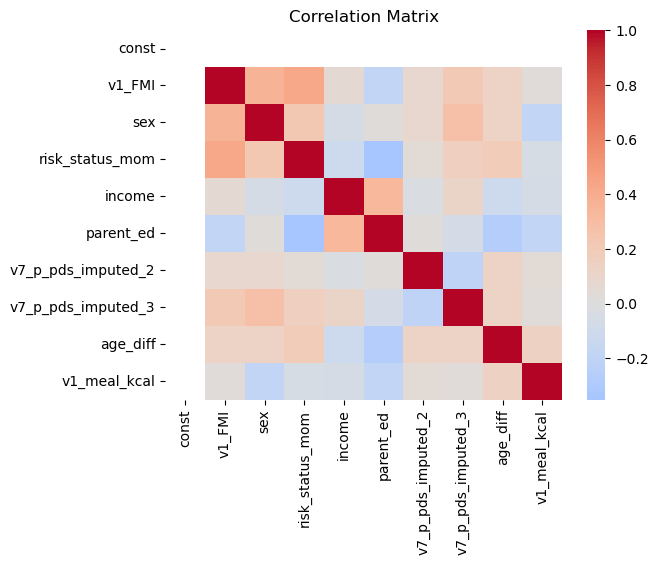

             Variable           VIF
0               const 16.7927565183
1              v1_FMI  1.4246655024
2                 sex  1.3444126896
3     risk_status_mom  1.4054595740
4              income  1.1957641392
5           parent_ed  1.4105116726
6  v7_p_pds_imputed_2  1.1090339643
7  v7_p_pds_imputed_3  1.2310368154
8            age_diff  1.1584849908
9        v1_meal_kcal  1.1231413834
CHECKING FOR HETEROSKEDASTICITY


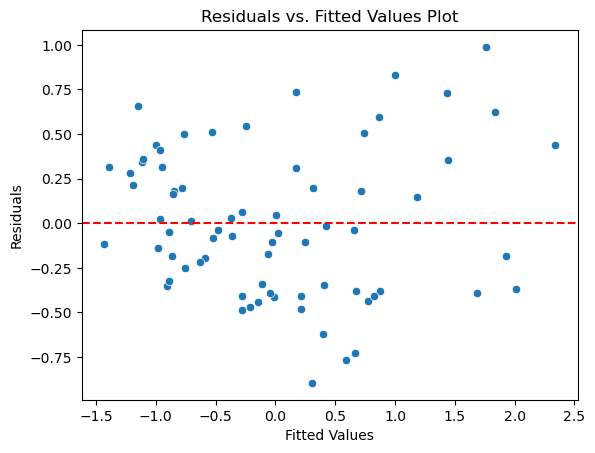

Breusch-Pagan test statistic: 16.38058520479612, p-value: 0.05934694202565599
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


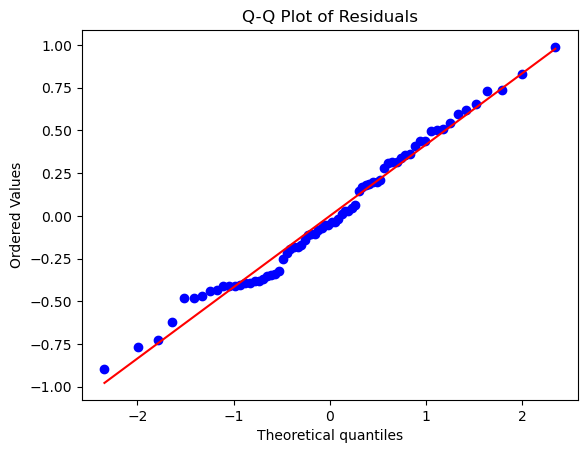

Shapiro-Wilk Test Results:
Statistic: 0.9816564321517944
p-value: 0.3766467273235321
Residuals are normally distributed (fail to reject null hypothesis)


In [239]:
# checking for model assumptions
# Calculate the residuals
residuals_mealkcalFMI= mod_mealkcalFMI.resid
# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_mealkcalFMI = durbin_watson(residuals_mealkcalFMI)
print("Durbin-Watson Statistic:", dw_statistic_mealkcalFMI)
if 0 < dw_statistic_mealkcalFMI < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_mealkcalFMI.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_mealkcalFMI.columns
vif_data["VIF"] = [variance_inflation_factor(X_mealkcalFMI.values, i) for i in range(X_mealkcalFMI.shape[1])]
print(vif_data)

# 5. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_mealkcalFMI.fittedvalues, y=residuals_mealkcalFMI)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

# Breusch-Pagan test
bp_test = het_breuschpagan(residuals_mealkcalFMI, mod_mealkcalFMI.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

    
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_mealkcalFMI, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_mealkcalFMI, p_value_mealkcalFMI = shapiro(residuals_mealkcalFMI)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_mealkcalFMI)
print("p-value:", p_value_mealkcalFMI)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_mealkcalFMI > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

# Assumption check for audio model

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.6157435445821027
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


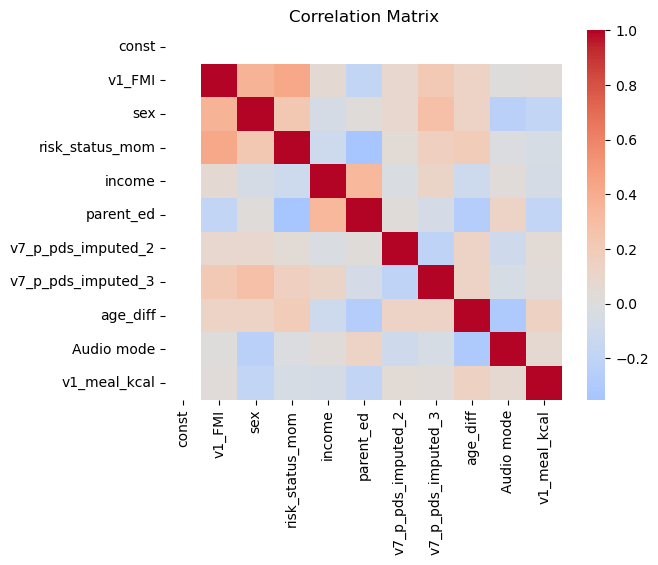

              Variable           VIF
0                const 17.1631066303
1               v1_FMI  1.4495099471
2                  sex  1.4294997578
3      risk_status_mom  1.4143027079
4               income  1.2005108892
5            parent_ed  1.4396999730
6   v7_p_pds_imputed_2  1.1147616608
7   v7_p_pds_imputed_3  1.2312771231
8             age_diff  1.2512522504
9           Audio mode  1.2172711967
10        v1_meal_kcal  1.1332894424
CHECKING FOR HETEROSKEDASTICITY


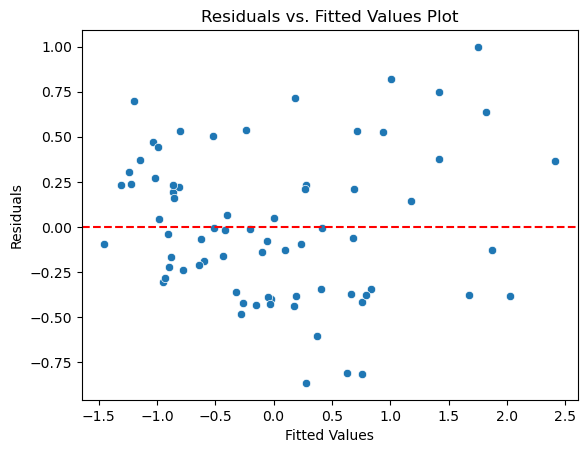

Breusch-Pagan test statistic: 15.82750707621038, p-value: 0.10467782464048166
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


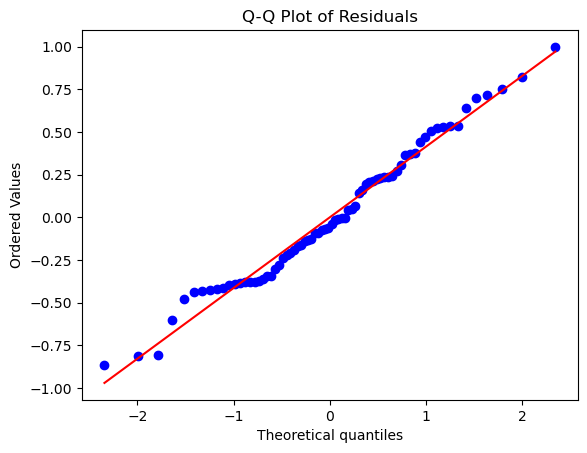

Shapiro-Wilk Test Results:
Statistic: 0.9793620705604553
p-value: 0.28400054574012756
Residuals are normally distributed (fail to reject null hypothesis)


In [240]:
# checking for model assumptions
# Calculate the residuals
residuals_mealkcalFMI_audio= mod_mealkcalFMI_audio.resid
# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_mealkcalFMI_audio = durbin_watson(residuals_mealkcalFMI_audio)
print("Durbin-Watson Statistic:", dw_statistic_mealkcalFMI_audio)
if 0 < dw_statistic_mealkcalFMI_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_mealkcalFMI_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_mealkcalFMI_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_mealkcalFMI_audio.values, i) for i in range(X_mealkcalFMI_audio.shape[1])]
print(vif_data)

# 5. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_mealkcalFMI_audio.fittedvalues, y=residuals_mealkcalFMI_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

# Breusch-Pagan test
bp_test = het_breuschpagan(residuals_mealkcalFMI_audio, mod_mealkcalFMI_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

    
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_mealkcalFMI_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_mealkcalFMI_audio, p_value_mealkcalFMI_audio = shapiro(residuals_mealkcalFMI_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_mealkcalFMI_audio)
print("p-value:", p_value_mealkcalFMI_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_mealkcalFMI_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### Model : EAH (kcal) at baseline (V1) vs V7 FMI
#### covariates baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1,  main predictor: baseline EAH intake (kcal)

In [241]:
# Select specific columns as predictors (X) and response (y)

X_EAHkcalFMI = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','v1_eah_kcal']]
y_EAHkcalFMI = df_linear_reg['v7_FMI']


# Add a constant term to the predictors (intercept)
X_EAHkcalFMI = sm.add_constant(X_EAHkcalFMI)

# Fit a linear regression model using ols
mod_EAHkcalFMI = sm.OLS(y_EAHkcalFMI, X_EAHkcalFMI).fit()

# Get summary of the regression model
print(mod_EAHkcalFMI.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.822
Method:                 Least Squares   F-statistic:                     37.46
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           8.75e-22
Time:                        15:36:54   Log-Likelihood:                -35.126
No. Observations:                  72   AIC:                             90.25
Df Residuals:                      62   BIC:                             113.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3053      0

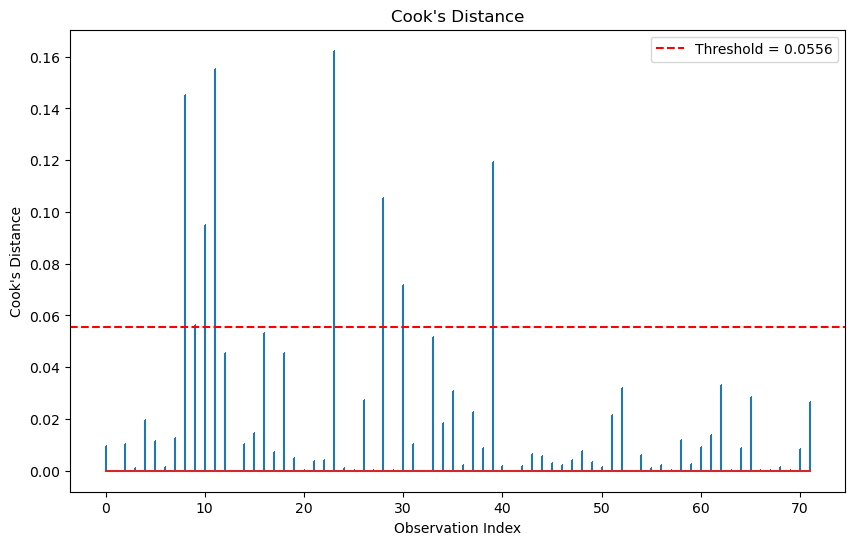

    Cook_Distance  Influential
8    0.1450650281         True
9    0.0563573991         True
10   0.0950627534         True
11   0.1554106068         True
23   0.1623175132         True
28   0.1053835887         True
30   0.0716921656         True
39   0.1194255464         True


In [242]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Assuming X_EAHkcalFMI and y_EAHkcalFMI are defined as per your code

# Fit the OLS model
mod_EAHkcalFMI = sm.OLS(y_EAHkcalFMI, X_EAHkcalFMI).fit()

# Calculate Cook's distance
influence = mod_EAHkcalFMI.get_influence()
cooks_d = influence.cooks_distance[0]

# Create a DataFrame to store Cook's distance and indices
cooks_df = pd.DataFrame({'Cook_Distance': cooks_d})

# Optional: Set a threshold for identifying influential points (e.g., 4/n where n is the number of observations)
n = len(y_EAHkcalFMI)
threshold = 4 / n

# Flag influential points
cooks_df['Influential'] = cooks_df['Cook_Distance'] > threshold

# Print or display influential points
influential_points = cooks_df[cooks_df['Influential']]

# Plot Cook's Distance
plt.figure(figsize=(10, 6))
plt.stem(np.arange(len(cooks_d)), cooks_d, markerfmt=",")
plt.axhline(y=threshold, color='r', linestyle='--', label=f'Threshold = {threshold:.4f}')
plt.title("Cook's Distance")
plt.xlabel("Observation Index")
plt.ylabel("Cook's Distance")
plt.legend()
plt.show()

# Output the influential points
print(influential_points)


### audio story type added

In [243]:
# Select specific columns as predictors (X) and response (y)

X_EAHkcalFMI_audio = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','Audio mode','v1_eah_kcal']]
y_EAHkcalFMI_audio = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHkcalFMI_audio = sm.add_constant(X_EAHkcalFMI_audio)

# Fit a linear regression model using ols
mod_EAHkcalFMI_audio = sm.OLS(y_EAHkcalFMI_audio, X_EAHkcalFMI_audio).fit()

# Get summary of the regression model
print(mod_EAHkcalFMI_audio.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.847
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     33.65
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           3.85e-21
Time:                        15:36:54   Log-Likelihood:                -34.685
No. Observations:                  72   AIC:                             91.37
Df Residuals:                      61   BIC:                             116.4
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2760      0

### adding item cleaner (0=no item cleaner, 1=item cleaner)

In [244]:
# Select specific columns as predictors (X) and response (y)

X_EAHkcalFMI_item = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','item clean', 'v1_eah_kcal']]
y_EAHkcalFMI_item = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHkcalFMI_item = sm.add_constant(X_EAHkcalFMI_item)

# Fit a linear regression model using ols
mod_EAHkcalFMI_item = sm.OLS(y_EAHkcalFMI_item, X_EAHkcalFMI_item).fit()

# Get summary of the regression model
print(mod_EAHkcalFMI_item.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.819
Method:                 Least Squares   F-statistic:                     33.22
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           5.33e-21
Time:                        15:36:54   Log-Likelihood:                -35.079
No. Observations:                  72   AIC:                             92.16
Df Residuals:                      61   BIC:                             117.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3070      0

assumptions check for all three models below

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.5976133457560615
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


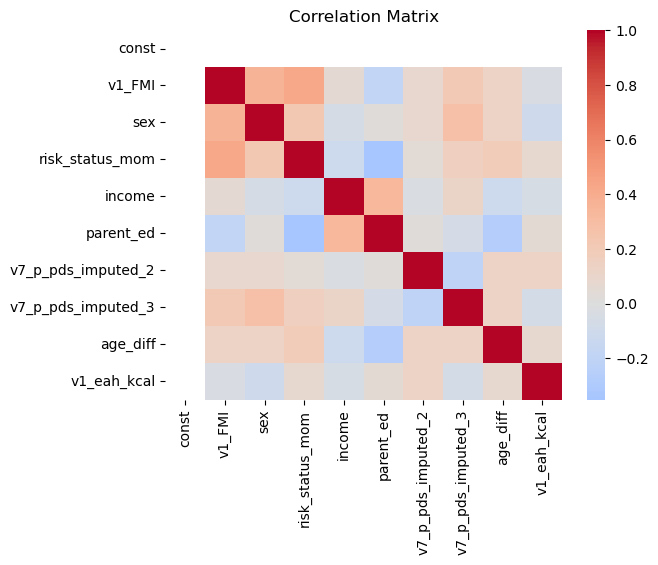

             Variable           VIF
0               const 16.2336948717
1              v1_FMI  1.4136058434
2                 sex  1.3074343017
3     risk_status_mom  1.4050031678
4              income  1.1996617530
5           parent_ed  1.4018614284
6  v7_p_pds_imputed_2  1.1188937033
7  v7_p_pds_imputed_3  1.2229642981
8            age_diff  1.1487314399
9         v1_eah_kcal  1.0666142260
CHECKING FOR HETEROSKEDASTICITY


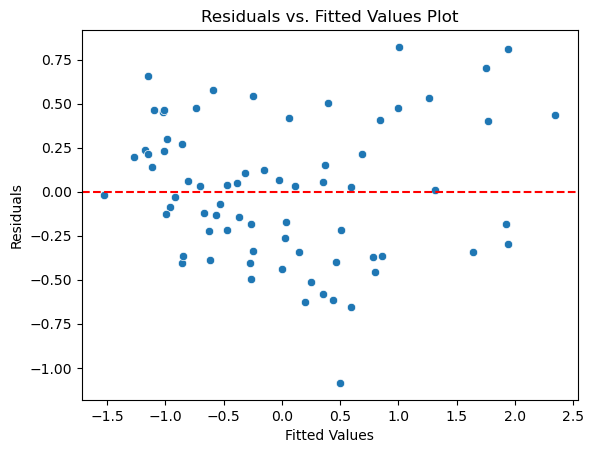

Breusch-Pagan test statistic: 14.39800093694707, p-value: 0.108855225038497
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


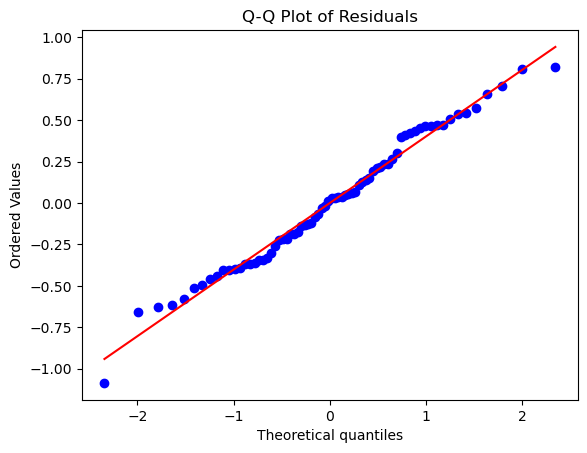

Shapiro-Wilk Test Results:
Statistic: 0.984263002872467
p-value: 0.5077895522117615
Residuals are normally distributed (fail to reject null hypothesis)


In [245]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHkcalFMI = mod_EAHkcalFMI.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHkcalFMI = durbin_watson(residuals_EAHkcalFMI)
print("Durbin-Watson Statistic:", dw_statistic_EAHkcalFMI)
if 0 < dw_statistic_EAHkcalFMI < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHkcalFMI.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHkcalFMI.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHkcalFMI.values, i) for i in range(X_EAHkcalFMI.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHkcalFMI.fittedvalues, y=residuals_EAHkcalFMI)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHkcalFMI, mod_EAHkcalFMI.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")
    
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHkcalFMI, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHkcalFMI, p_value_EAHkcalFMI = shapiro(residuals_EAHkcalFMI)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHkcalFMI)
print("p-value:", p_value_EAHkcalFMI)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHkcalFMI > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.608821067242901
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


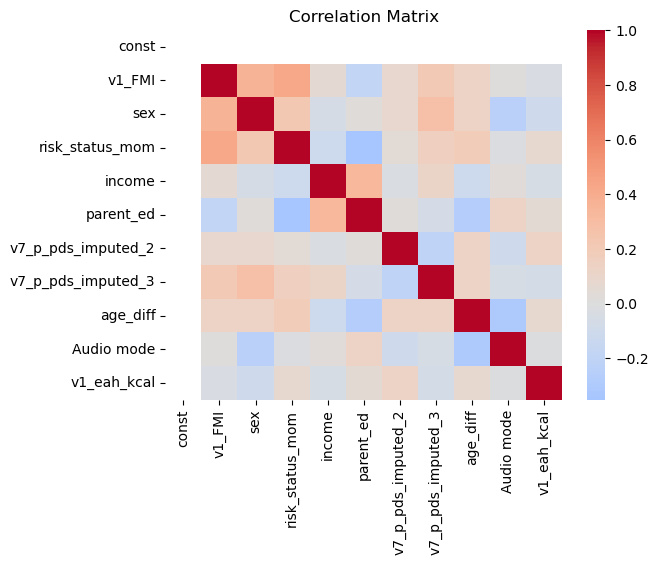

              Variable           VIF
0                const 16.6890854836
1               v1_FMI  1.4413755191
2                  sex  1.4081488494
3      risk_status_mom  1.4118385722
4               income  1.2050314685
5            parent_ed  1.4264966200
6   v7_p_pds_imputed_2  1.1231840094
7   v7_p_pds_imputed_3  1.2235257630
8             age_diff  1.2321371287
9           Audio mode  1.2069927619
10         v1_eah_kcal  1.0671638499
CHECKING FOR HETEROSKEDASTICITY


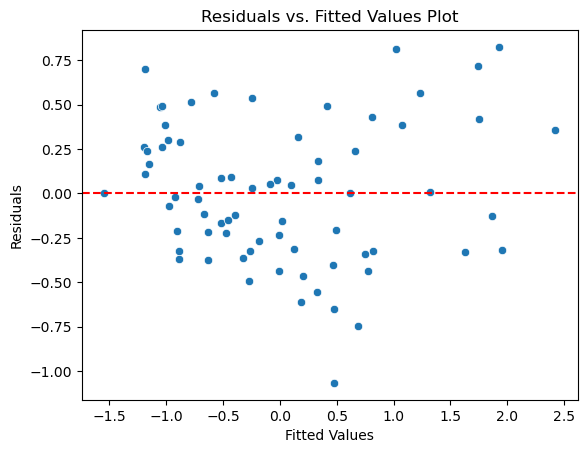

Breusch-Pagan test statistic: 13.637277856195311, p-value: 0.19018851090718764
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


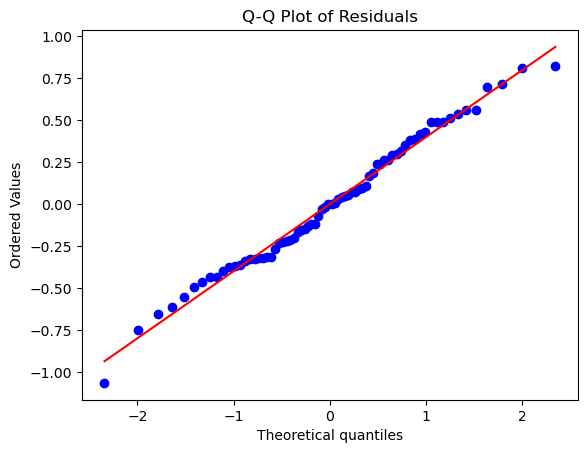

Shapiro-Wilk Test Results:
Statistic: 0.9873661398887634
p-value: 0.6907255053520203
Residuals are normally distributed (fail to reject null hypothesis)


In [246]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHkcalFMI_audio = mod_EAHkcalFMI_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHkcalFMI_audio = durbin_watson(residuals_EAHkcalFMI_audio)
print("Durbin-Watson Statistic:", dw_statistic_EAHkcalFMI_audio)
if 0 < dw_statistic_EAHkcalFMI_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix_audio = X_EAHkcalFMI_audio.corr()
sns.heatmap(correlation_matrix_audio, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHkcalFMI_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHkcalFMI_audio.values, i) for i in range(X_EAHkcalFMI_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHkcalFMI_audio.fittedvalues, y=residuals_EAHkcalFMI_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHkcalFMI_audio, mod_EAHkcalFMI_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")
    
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHkcalFMI_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHkcalFMI_audio, p_value_EAHkcalFMI_audio = shapiro(residuals_EAHkcalFMI_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHkcalFMI_audio)
print("p-value:", p_value_EAHkcalFMI_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHkcalFMI_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.598127282266413
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


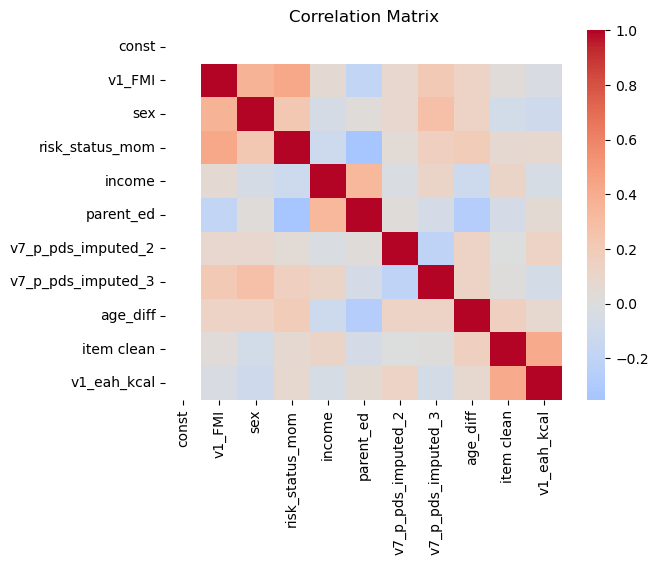

              Variable           VIF
0                const 16.2483310570
1               v1_FMI  1.4144072073
2                  sex  1.3094783847
3      risk_status_mom  1.4050032687
4               income  1.2413180708
5            parent_ed  1.4158391151
6   v7_p_pds_imputed_2  1.1245006248
7   v7_p_pds_imputed_3  1.2230122007
8             age_diff  1.1710527731
9           item clean  1.2873058147
10         v1_eah_kcal  1.2916729218
CHECKING FOR HETEROSKEDASTICITY


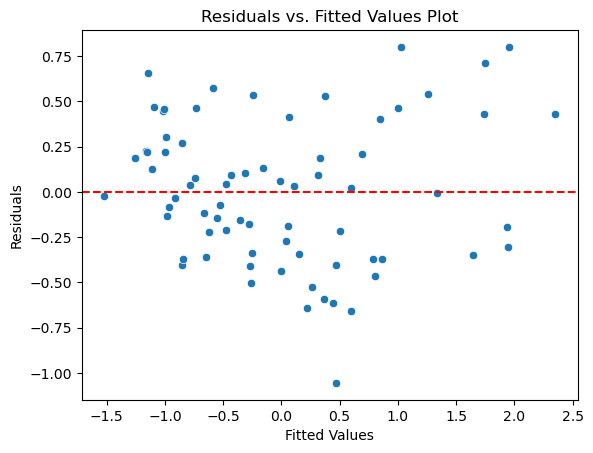

Breusch-Pagan test statistic: 14.614380776895366, p-value: 0.14676602941102918
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


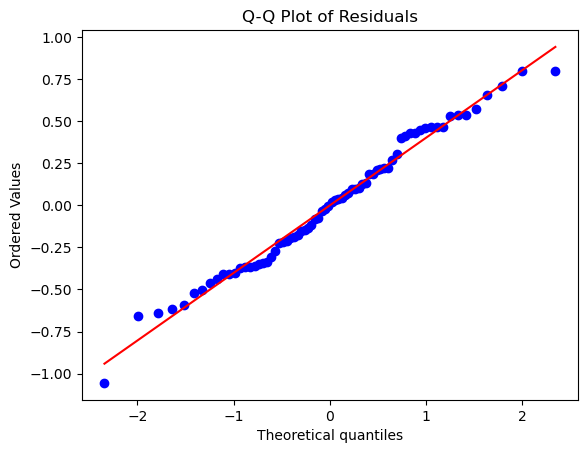

Shapiro-Wilk Test Results:
Statistic: 0.9836978912353516
p-value: 0.477145791053772
Residuals are normally distributed (fail to reject null hypothesis)


In [247]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHkcalFMI_item = mod_EAHkcalFMI_item.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHkcalFMI_item = durbin_watson(residuals_EAHkcalFMI_item)
print("Durbin-Watson Statistic:", dw_statistic_EAHkcalFMI_item)
if 0 < dw_statistic_EAHkcalFMI_item < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHkcalFMI_item.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHkcalFMI_item.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHkcalFMI_item.values, i) for i in range(X_EAHkcalFMI_item.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHkcalFMI_item.fittedvalues, y=residuals_EAHkcalFMI_item)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHkcalFMI_item, mod_EAHkcalFMI_item.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")
    
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHkcalFMI_item, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHkcalFMI_item, p_value_EAHkcalFMI_item = shapiro(residuals_EAHkcalFMI_item)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHkcalFMI_item)
print("p-value:", p_value_EAHkcalFMI_item)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHkcalFMI_item > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### Model : EAH Sweet (kcal) at baseline (V1) vs V7 FMI
#### covariates: baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1, main predictor: baseline EAH Sweet intake (kcal)

In [248]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetkcalFMI = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff', 'v1_eah_sweet_kcal']]
y_EAHsweetkcalFMI = df_linear_reg['v7_FMI']
# Add a constant term to the predictors (intercept)
X_EAHsweetkcalFMI = sm.add_constant(X_EAHsweetkcalFMI)

# Fit a linear regression model using ols
mod_EAHsweetkcalFMI = sm.OLS(y_EAHsweetkcalFMI, X_EAHsweetkcalFMI).fit()

# Get summary of the regression model
print(mod_EAHsweetkcalFMI.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.822
Method:                 Least Squares   F-statistic:                     37.53
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           8.35e-22
Time:                        15:36:56   Log-Likelihood:                -35.072
No. Observations:                  72   AIC:                             90.14
Df Residuals:                      62   BIC:                             112.9
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3083      0

#### audio type added

In [249]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetkcalFMI_audio = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff', 'Audio mode', 'v1_eah_sweet_kcal']]
y_EAHsweetkcalFMI_audio = df_linear_reg['v7_FMI']
# Add a constant term to the predictors (intercept)
X_EAHsweetkcalFMI_audio = sm.add_constant(X_EAHsweetkcalFMI_audio)

# Fit a linear regression model using ols
mod_EAHsweetkcalFMI_audio = sm.OLS(y_EAHsweetkcalFMI_audio, X_EAHsweetkcalFMI_audio).fit()

# Get summary of the regression model
print(mod_EAHsweetkcalFMI_audio.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.847
Model:                            OLS   Adj. R-squared:                  0.822
Method:                 Least Squares   F-statistic:                     33.80
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           3.45e-21
Time:                        15:36:56   Log-Likelihood:                -34.554
No. Observations:                  72   AIC:                             91.11
Df Residuals:                      61   BIC:                             116.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2768      0

#### item clean added 

In [250]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetkcalFMI_item = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','item clean','v1_eah_sweet_kcal']]
y_EAHsweetkcalFMI_item = df_linear_reg['v7_FMI']
# Add a constant term to the predictors (intercept)
X_EAHsweetkcalFMI_item = sm.add_constant(X_EAHsweetkcalFMI_item)

# Fit a linear regression model using ols
mod_EAHsweetkcalFMI_item = sm.OLS(y_EAHsweetkcalFMI_item, X_EAHsweetkcalFMI_item).fit()

# Get summary of the regression model
print(mod_EAHsweetkcalFMI_item.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.820
Method:                 Least Squares   F-statistic:                     33.31
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           4.97e-21
Time:                        15:36:56   Log-Likelihood:                -34.994
No. Observations:                  72   AIC:                             91.99
Df Residuals:                      61   BIC:                             117.0
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3108      0

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.5660671833017652
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


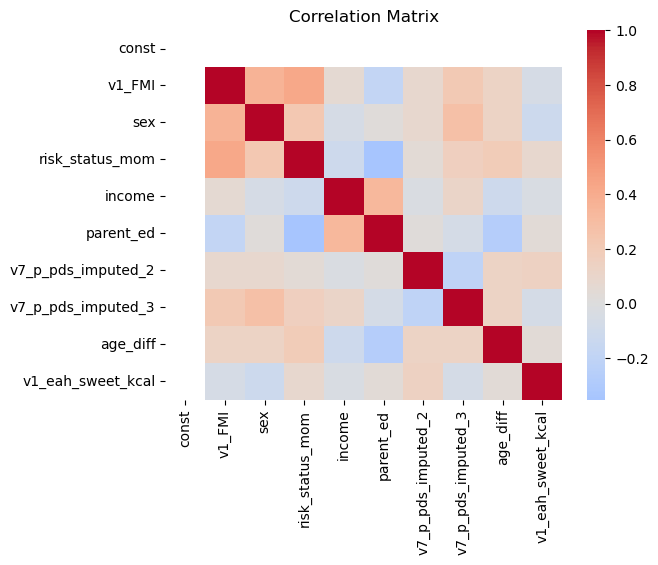

             Variable           VIF
0               const 16.2411830140
1              v1_FMI  1.4166259477
2                 sex  1.3078435462
3     risk_status_mom  1.4086710430
4              income  1.1966651481
5           parent_ed  1.3920404683
6  v7_p_pds_imputed_2  1.1247207333
7  v7_p_pds_imputed_3  1.2225851848
8            age_diff  1.1428568731
9   v1_eah_sweet_kcal  1.0647503986
CHECKING FOR HETEROSKEDASTICITY


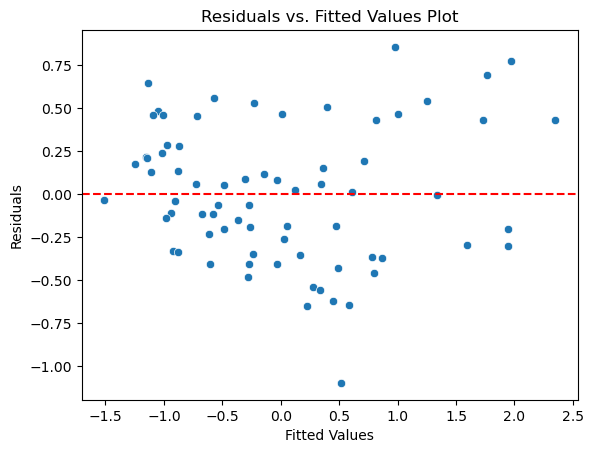

Breusch-Pagan test statistic: 14.9441095777225, p-value: 0.09248267563333522
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


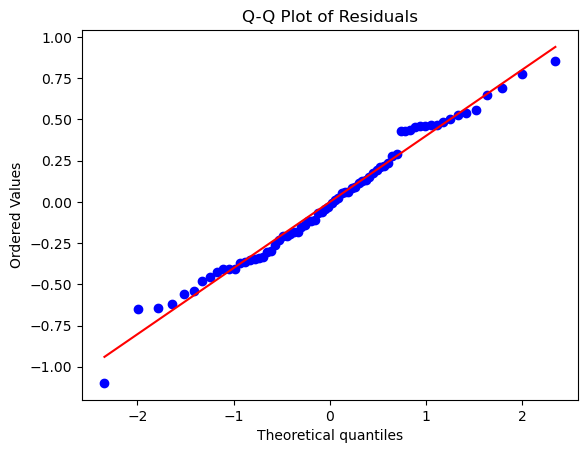

Shapiro-Wilk Test Results:
Statistic: 0.9841639995574951
p-value: 0.5023406147956848
Residuals are normally distributed (fail to reject null hypothesis)


In [251]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsweetkcalFMI = mod_EAHsweetkcalFMI.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetkcalFMI = durbin_watson(residuals_EAHsweetkcalFMI)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetkcalFMI)
if 0 < dw_statistic_EAHsweetkcalFMI < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetkcalFMI.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetkcalFMI.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetkcalFMI.values, i) for i in range(X_EAHsweetkcalFMI.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetkcalFMI.fittedvalues, y=residuals_EAHsweetkcalFMI)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetkcalFMI,  mod_EAHsweetkcalFMI.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetkcalFMI, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetkcalFMI, p_value_EAHsweetkcalFMI = shapiro(residuals_EAHsweetkcalFMI)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetkcalFMI)
print("p-value:", p_value_EAHsweetkcalFMI)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetkcalFMI > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

model assumptiosn check for all three models

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.5805455412984515
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


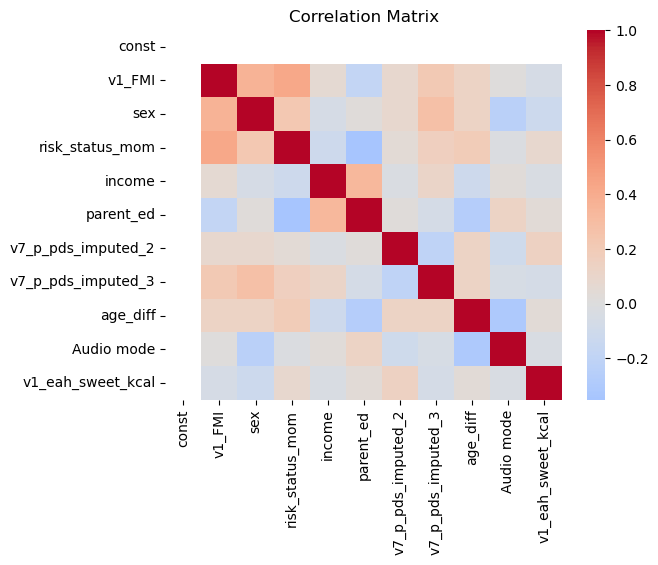

              Variable           VIF
0                const 16.6901609491
1               v1_FMI  1.4435740472
2                  sex  1.4118838916
3      risk_status_mom  1.4164179070
4               income  1.2021600474
5            parent_ed  1.4175229373
6   v7_p_pds_imputed_2  1.1283947976
7   v7_p_pds_imputed_3  1.2231608844
8             age_diff  1.2262959695
9           Audio mode  1.2098140296
10   v1_eah_sweet_kcal  1.0677891297
CHECKING FOR HETEROSKEDASTICITY


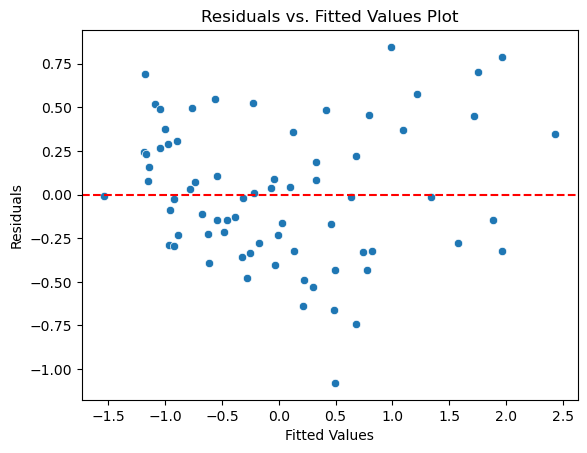

Breusch-Pagan test statistic: 13.821828220376538, p-value: 0.18127480144262814
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


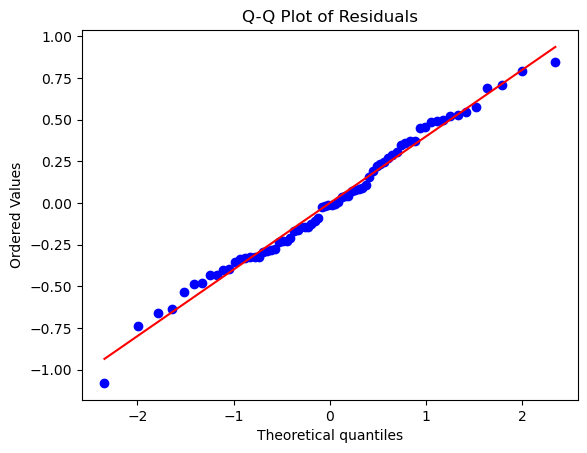

Shapiro-Wilk Test Results:
Statistic: 0.987789511680603
p-value: 0.7163916826248169
Residuals are normally distributed (fail to reject null hypothesis)


In [252]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsweetkcalFMI_audio = mod_EAHsweetkcalFMI_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetkcalFMI_audio = durbin_watson(residuals_EAHsweetkcalFMI_audio)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetkcalFMI_audio)
if 0 < dw_statistic_EAHsweetkcalFMI_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetkcalFMI_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetkcalFMI_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetkcalFMI_audio.values, i) for i in range(X_EAHsweetkcalFMI_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetkcalFMI_audio.fittedvalues, y=residuals_EAHsweetkcalFMI_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetkcalFMI_audio,  mod_EAHsweetkcalFMI_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetkcalFMI_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetkcalFMI_audio, p_value_EAHsweetkcalFMI_audio = shapiro(residuals_EAHsweetkcalFMI_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetkcalFMI_audio)
print("p-value:", p_value_EAHsweetkcalFMI_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetkcalFMI_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.5653112772477797
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


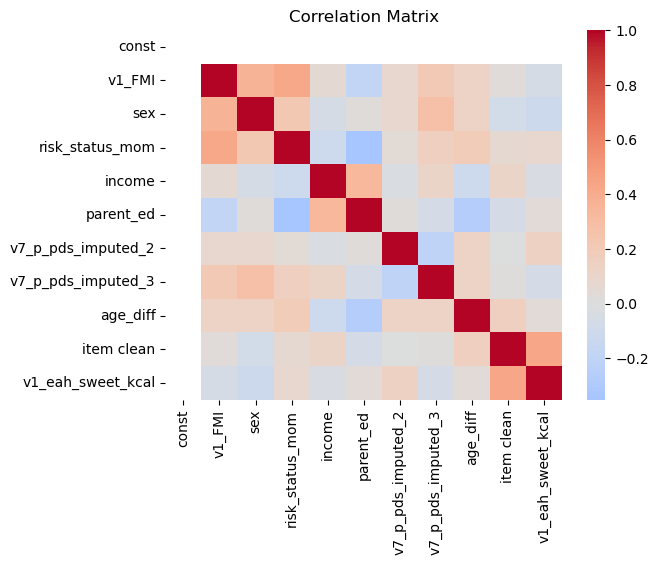

              Variable           VIF
0                const 16.2605861478
1               v1_FMI  1.4186512541
2                  sex  1.3094846659
3      risk_status_mom  1.4087858175
4               income  1.2351665136
5            parent_ed  1.4031641756
6   v7_p_pds_imputed_2  1.1329025414
7   v7_p_pds_imputed_3  1.2227975319
8             age_diff  1.1722041275
9           item clean  1.3249130930
10   v1_eah_sweet_kcal  1.3270847412
CHECKING FOR HETEROSKEDASTICITY


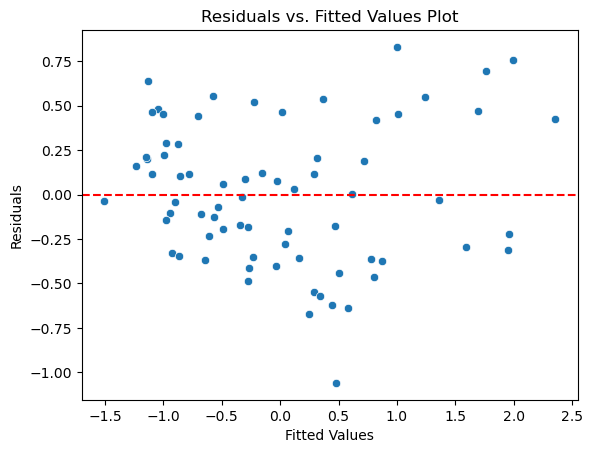

Breusch-Pagan test statistic: 15.214166096318088, p-value: 0.12444664534364176
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


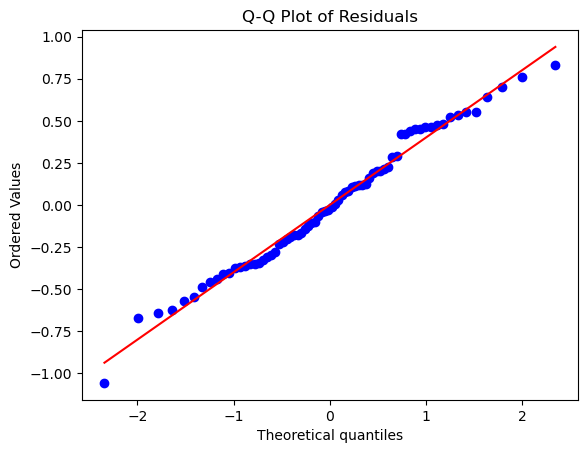

Shapiro-Wilk Test Results:
Statistic: 0.9839399456977844
p-value: 0.4901313781738281
Residuals are normally distributed (fail to reject null hypothesis)


In [253]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsweetkcalFMI_item = mod_EAHsweetkcalFMI_item.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetkcalFMI_item = durbin_watson(residuals_EAHsweetkcalFMI_item)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetkcalFMI_item)
if 0 < dw_statistic_EAHsweetkcalFMI_item < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetkcalFMI_item.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetkcalFMI_item.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetkcalFMI_item.values, i) for i in range(X_EAHsweetkcalFMI_item.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetkcalFMI_item.fittedvalues, y=residuals_EAHsweetkcalFMI_item)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetkcalFMI_item,  mod_EAHsweetkcalFMI_item.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetkcalFMI_item, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetkcalFMI_item, p_value_EAHsweetkcalFMI_item = shapiro(residuals_EAHsweetkcalFMI_item)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetkcalFMI_item)
print("p-value:", p_value_EAHsweetkcalFMI_item)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetkcalFMI_item > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

## Model : EAH savory (kcal) at baseline (V1) vs V7 FMI
#### covariates: baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1,  main predictor: baseline EAH savory intake (kcal)

In [254]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavkcalFMI = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','age_diff','v1_eah_sav_kcal']]
y_EAHsavkcalFMI = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsavkcalFMI = sm.add_constant(X_EAHsavkcalFMI)

# Fit a linear regression model using ols
mod_EAHsavkcalFMI = sm.OLS(y_EAHsavkcalFMI, X_EAHsavkcalFMI).fit()

# Get summary of the regression model
print(mod_EAHsavkcalFMI.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.808
Method:                 Least Squares   F-statistic:                     34.17
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           9.05e-21
Time:                        15:36:57   Log-Likelihood:                -37.897
No. Observations:                  72   AIC:                             95.79
Df Residuals:                      62   BIC:                             118.6
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2864      0

#### audio mode added

In [255]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavkcalFMI_audio = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','Audio mode','age_diff','v1_eah_sav_kcal']]
y_EAHsavkcalFMI_audio = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsavkcalFMI_audio = sm.add_constant(X_EAHsavkcalFMI_audio)

# Fit a linear regression model using ols
mod_EAHsavkcalFMI_audio = sm.OLS(y_EAHsavkcalFMI_audio, X_EAHsavkcalFMI_audio).fit()

# Get summary of the regression model
print(mod_EAHsavkcalFMI_audio.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.834
Model:                            OLS   Adj. R-squared:                  0.806
Method:                 Least Squares   F-statistic:                     30.59
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           4.19e-20
Time:                        15:36:57   Log-Likelihood:                -37.574
No. Observations:                  72   AIC:                             97.15
Df Residuals:                      61   BIC:                             122.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2613      0

#### added item cleaners

In [256]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavkcalFMI_item = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','item clean', 'v1_eah_sav_kcal']]
y_EAHsavkcalFMI_item = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsavkcalFMI_item = sm.add_constant(X_EAHsavkcalFMI_item)

# Fit a linear regression model using ols
mod_EAHsavkcalFMI_item = sm.OLS(y_EAHsavkcalFMI_item, X_EAHsavkcalFMI_item).fit()

# Get summary of the regression model
print(mod_EAHsavkcalFMI_item.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.833
Model:                            OLS   Adj. R-squared:                  0.806
Method:                 Least Squares   F-statistic:                     30.49
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           4.54e-20
Time:                        15:36:57   Log-Likelihood:                -37.671
No. Observations:                  72   AIC:                             97.34
Df Residuals:                      61   BIC:                             122.4
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2856      0

assumption check for all 3 models

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.6245967040698963
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


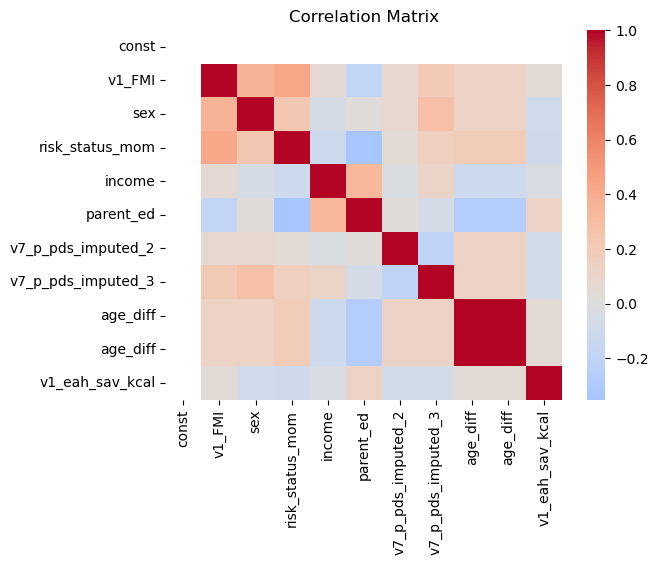

              Variable           VIF
0                const 16.2639040161
1               v1_FMI  1.4506374221
2                  sex  1.3030121232
3      risk_status_mom  1.3935556545
4               income  1.2072326780
5            parent_ed  1.4245613344
6   v7_p_pds_imputed_2  1.1204225131
7   v7_p_pds_imputed_3  1.2308048160
8             age_diff           inf
9             age_diff           inf
10     v1_eah_sav_kcal  1.0925646443
CHECKING FOR HETEROSKEDASTICITY


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


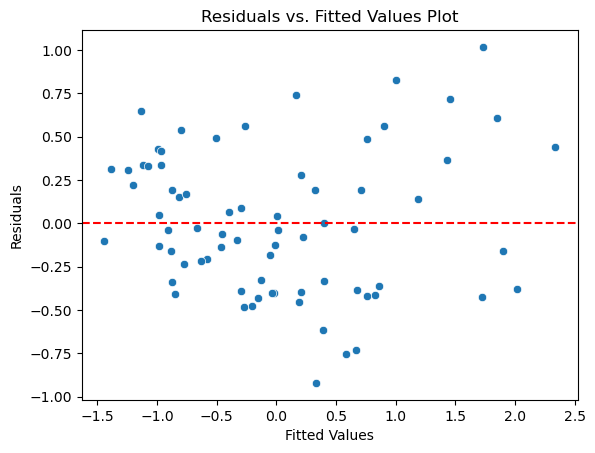

Breusch-Pagan test statistic: 16.364142900846932, p-value: 0.08967211936809558
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


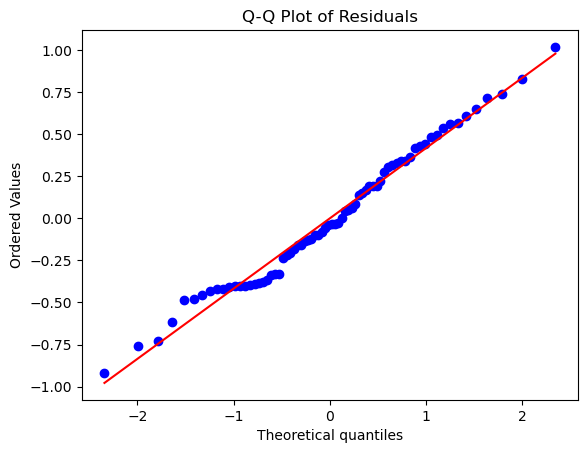

Shapiro-Wilk Test Results:
Statistic: 0.9824047684669495
p-value: 0.41154173016548157
Residuals are normally distributed (fail to reject null hypothesis)


In [257]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsavkcalFMI = mod_EAHsavkcalFMI.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavkcalFMI = durbin_watson(residuals_EAHsavkcalFMI)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavkcalFMI)
if 0 < dw_statistic_EAHsavkcalFMI < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavkcalFMI.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavkcalFMI.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavkcalFMI.values, i) for i in range(X_EAHsavkcalFMI.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavkcalFMI.fittedvalues, y=residuals_EAHsavkcalFMI)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsavkcalFMI,  mod_EAHsavkcalFMI.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavkcalFMI, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavkcalFMI, p_value_EAHsavkcalFMI = shapiro(residuals_EAHsavkcalFMI)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavkcalFMI)
print("p-value:", p_value_EAHsavkcalFMI)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsavkcalFMI > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.634691548415153
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


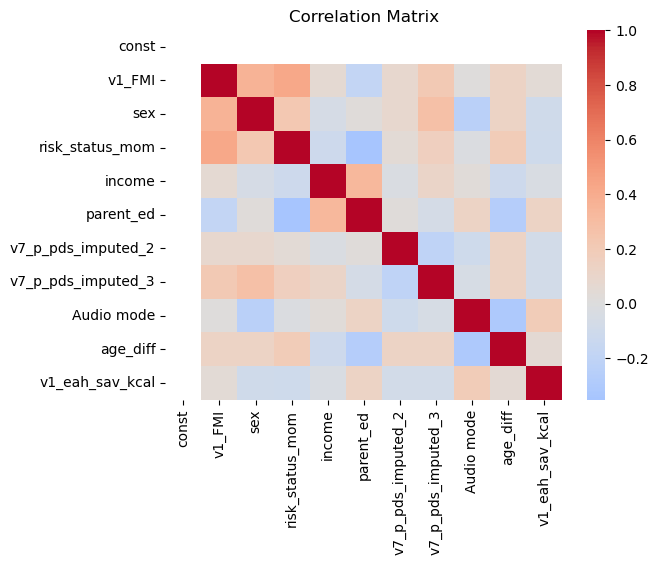

              Variable           VIF
0                const 16.6839262240
1               v1_FMI  1.4685313090
2                  sex  1.3888857224
3      risk_status_mom  1.4036261354
4               income  1.2099365343
5            parent_ed  1.4382069965
6   v7_p_pds_imputed_2  1.1224637564
7   v7_p_pds_imputed_3  1.2325270835
8           Audio mode  1.2484574687
9             age_diff  1.2644880880
10     v1_eah_sav_kcal  1.1306806552
CHECKING FOR HETEROSKEDASTICITY


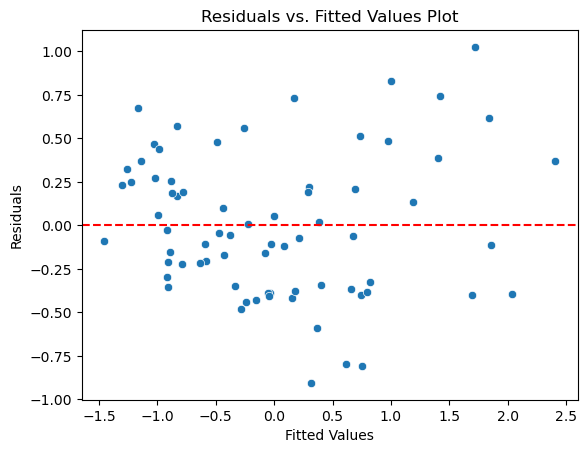

Breusch-Pagan test statistic: 15.836816199595354, p-value: 0.10439998239512699
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


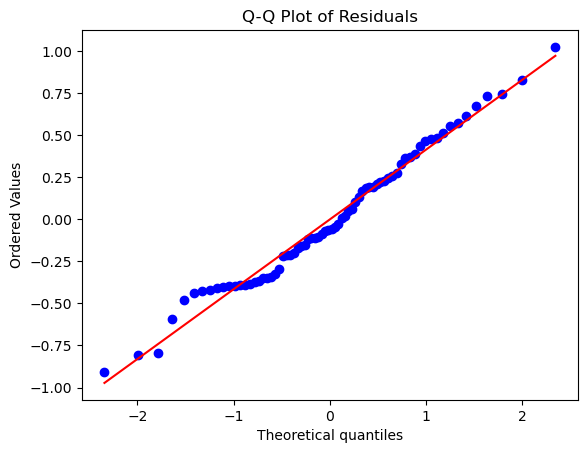

Shapiro-Wilk Test Results:
Statistic: 0.9811673164367676
p-value: 0.3550882637500763
Residuals are normally distributed (fail to reject null hypothesis)


In [258]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsavkcalFMI_audio = mod_EAHsavkcalFMI_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavkcalFMI_audio = durbin_watson(residuals_EAHsavkcalFMI_audio)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavkcalFMI_audio)
if 0 < dw_statistic_EAHsavkcalFMI_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavkcalFMI_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavkcalFMI_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavkcalFMI_audio.values, i) for i in range(X_EAHsavkcalFMI_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavkcalFMI_audio.fittedvalues, y=residuals_EAHsavkcalFMI_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsavkcalFMI_audio,  mod_EAHsavkcalFMI_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavkcalFMI_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavkcalFMI_audio, p_value_EAHsavkcalFMI_audio = shapiro(residuals_EAHsavkcalFMI_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavkcalFMI_audio)
print("p-value:", p_value_EAHsavkcalFMI_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsavkcalFMI_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.6307856346542802
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


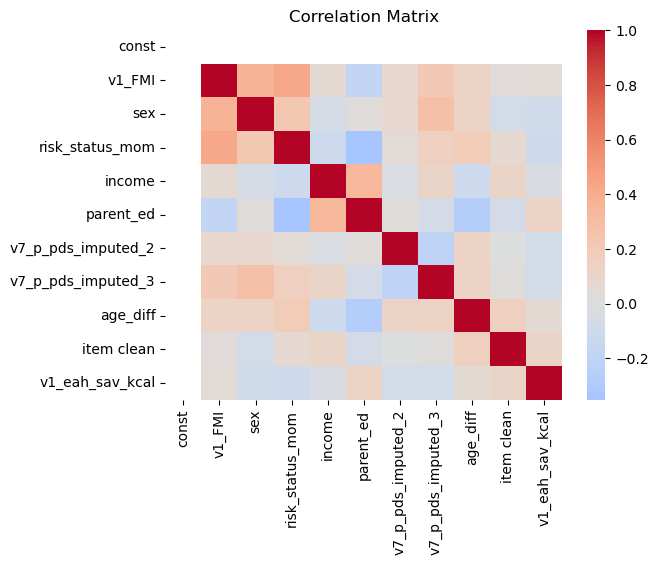

              Variable           VIF
0                const 16.2645706474
1               v1_FMI  1.4507846710
2                  sex  1.3110149446
3      risk_status_mom  1.3993096814
4               income  1.2364449393
5            parent_ed  1.4297302772
6   v7_p_pds_imputed_2  1.1204227427
7   v7_p_pds_imputed_3  1.2308175172
8             age_diff  1.1852879927
9           item clean  1.0788613608
10     v1_eah_sav_kcal  1.1088587663
CHECKING FOR HETEROSKEDASTICITY


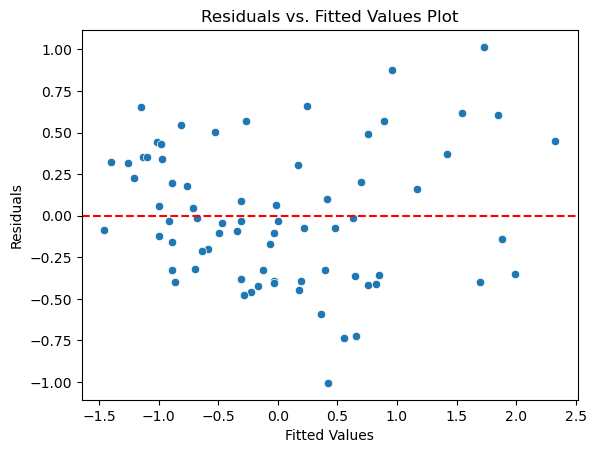

Breusch-Pagan test statistic: 16.421469986749134, p-value: 0.08818631301452405
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


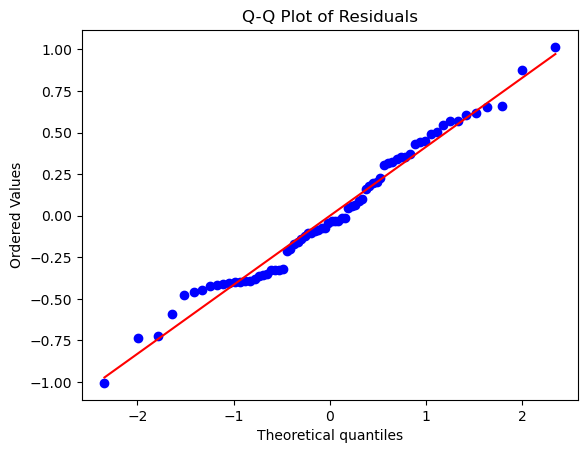

Shapiro-Wilk Test Results:
Statistic: 0.9798110723495483
p-value: 0.30045822262763977
Residuals are normally distributed (fail to reject null hypothesis)


In [259]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsavkcalFMI_item = mod_EAHsavkcalFMI_item.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavkcalFMI_item = durbin_watson(residuals_EAHsavkcalFMI_item)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavkcalFMI_item)
if 0 < dw_statistic_EAHsavkcalFMI_item < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavkcalFMI_item.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavkcalFMI_item.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavkcalFMI_item.values, i) for i in range(X_EAHsavkcalFMI_item.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavkcalFMI_item.fittedvalues, y=residuals_EAHsavkcalFMI_item)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsavkcalFMI_item,  mod_EAHsavkcalFMI_item.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavkcalFMI_item, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavkcalFMI_item, p_value_EAHsavkcalFMI_item = shapiro(residuals_EAHsavkcalFMI_item)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavkcalFMI_item)
print("p-value:", p_value_EAHsavkcalFMI_item)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsavkcalFMI_item > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

# Regression models : Baseline intake (kcal) vs follow-up weight status (BMIz)

### Model : Meal (kcal) at baseline (V1) vs V7 weight status BMIz
#### covariates : baseline BMIz, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1, main predictor: baseline meal intake (kcal)

In [260]:
# Select specific columns as predictors (X) and response (y)
X_mealkcalBMIz = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff', 'v1_meal_kcal']]
y_mealkcalBMIz = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_mealkcalBMIz = sm.add_constant(X_mealkcalBMIz)

# Fit a linear regression model using ols
mod_mealkcalBMIz = sm.OLS(y_mealkcalBMIz, X_mealkcalBMIz).fit()

# Get summary of the regression model
print(mod_mealkcalBMIz.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.854
Model:                            OLS   Adj. R-squared:                  0.832
Method:                 Least Squares   F-statistic:                     40.17
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.44e-22
Time:                        15:36:59   Log-Likelihood:                -19.099
No. Observations:                  72   AIC:                             58.20
Df Residuals:                      62   BIC:                             80.96
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4411      0

#### added audio mode

In [261]:
# Select specific columns as predictors (X) and response (y)
X_mealkcalBMIz_audio= df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','Audio mode','age_diff', 'v1_meal_kcal']]
y_mealkcalBMIz_audio = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_mealkcalBMIz_audio = sm.add_constant(X_mealkcalBMIz_audio)

# Fit a linear regression model using ols
mod_mealkcalBMIz_audio = sm.OLS(y_mealkcalBMIz_audio, X_mealkcalBMIz_audio).fit()

# Get summary of the regression model
print(mod_mealkcalBMIz_audio.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.864
Model:                            OLS   Adj. R-squared:                  0.842
Method:                 Least Squares   F-statistic:                     38.71
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.08e-22
Time:                        15:36:59   Log-Likelihood:                -16.483
No. Observations:                  72   AIC:                             54.97
Df Residuals:                      61   BIC:                             80.01
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3886      0

assumption check for models

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.9432350482769478
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


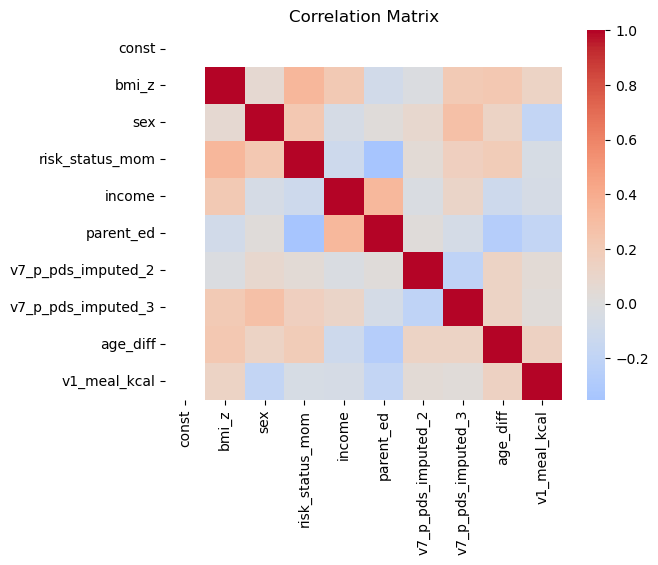

             Variable           VIF
0               const 17.8120210282
1               bmi_z  1.3206501955
2                 sex  1.2220904209
3     risk_status_mom  1.3972651617
4              income  1.2557558650
5           parent_ed  1.3950664615
6  v7_p_pds_imputed_2  1.1057373343
7  v7_p_pds_imputed_3  1.2354935884
8            age_diff  1.1928521104
9        v1_meal_kcal  1.1399863290
CHECKING FOR HETEROSKEDASTICITY


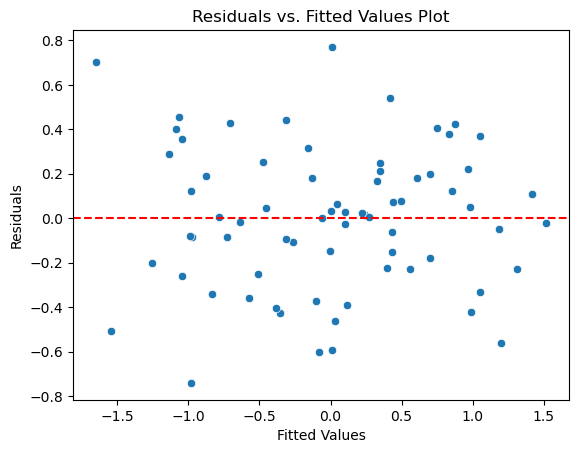

Breusch-Pagan test statistic: 13.651447114853372, p-value: 0.13527532272579215
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


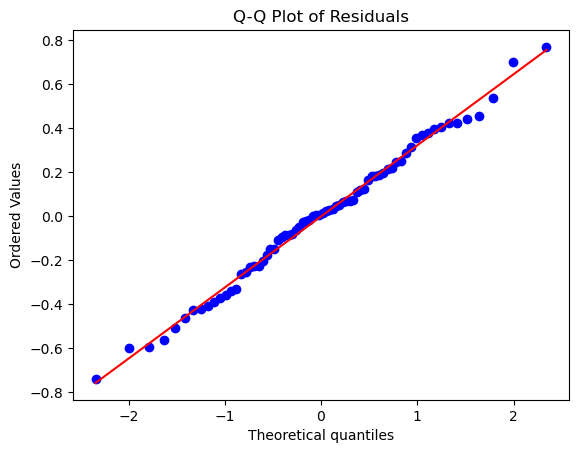

Shapiro-Wilk Test Results:
Statistic: 0.9923533797264099
p-value: 0.9442600607872009
Residuals are normally distributed (fail to reject null hypothesis)


In [262]:
# checking for model assumptions
# Calculate the residuals
residuals_mealkcalBMIz= mod_mealkcalBMIz.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_mealkcalBMIz = durbin_watson(residuals_mealkcalBMIz)
print("Durbin-Watson Statistic:", dw_statistic_mealkcalBMIz)
if 0 < dw_statistic_mealkcalBMIz < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_mealkcalBMIz.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_mealkcalBMIz.columns
vif_data["VIF"] = [variance_inflation_factor(X_mealkcalBMIz.values, i) for i in range(X_mealkcalBMIz.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_mealkcalBMIz.fittedvalues, y=residuals_mealkcalBMIz)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_mealkcalBMIz,  mod_mealkcalBMIz.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_mealkcalBMIz, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_mealkcalBMIz, p_value_mealkcalBMIz = shapiro(residuals_mealkcalBMIz)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_mealkcalBMIz)
print("p-value:", p_value_mealkcalBMIz)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_mealkcalBMIz > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 2.0449731096382395
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


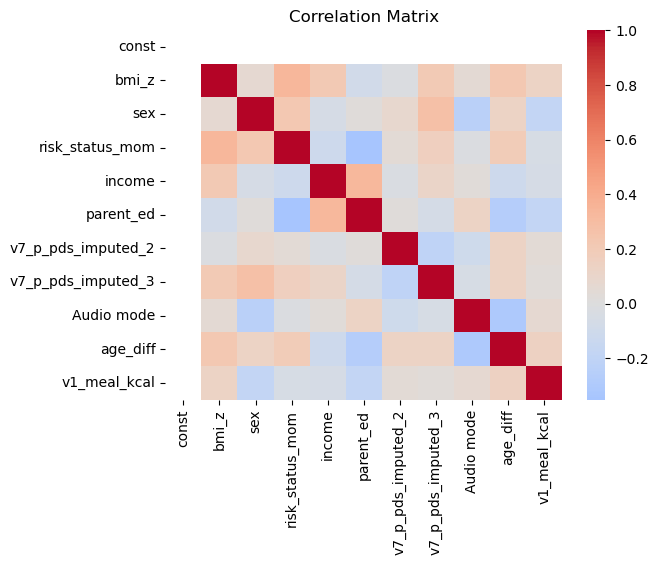

              Variable           VIF
0                const 18.2072071604
1                bmi_z  1.3359633565
2                  sex  1.2814800476
3      risk_status_mom  1.4081855095
4               income  1.2618946315
5            parent_ed  1.4178673175
6   v7_p_pds_imputed_2  1.1095166256
7   v7_p_pds_imputed_3  1.2357171430
8           Audio mode  1.2102798429
9             age_diff  1.2995491324
10        v1_meal_kcal  1.1491724363
CHECKING FOR HETEROSKEDASTICITY


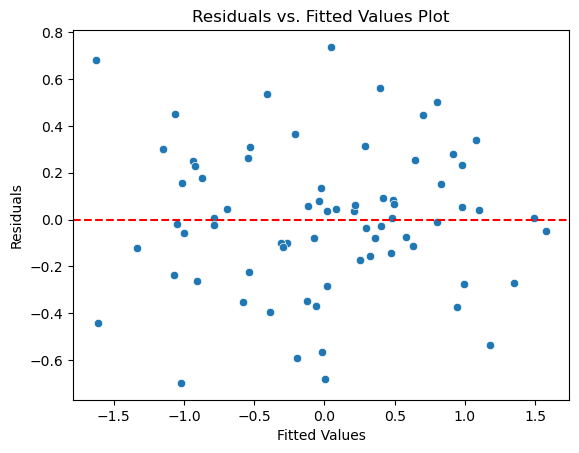

Breusch-Pagan test statistic: 15.19248715956753, p-value: 0.125200124359286
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


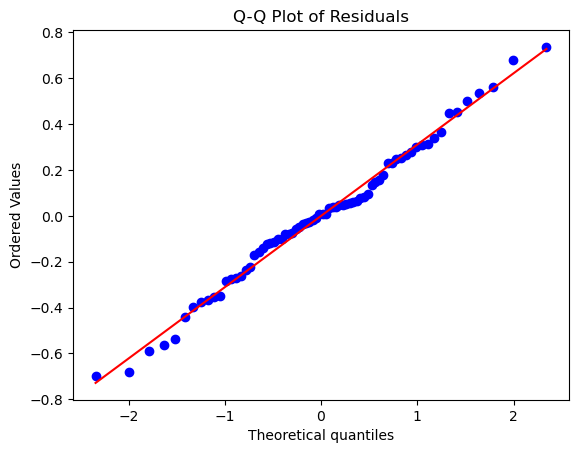

Shapiro-Wilk Test Results:
Statistic: 0.9889749884605408
p-value: 0.7865781188011169
Residuals are normally distributed (fail to reject null hypothesis)


In [263]:
# checking for model assumptions
# Calculate the residuals
residuals_mealkcalBMIz_audio= mod_mealkcalBMIz_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_mealkcalBMIz_audio = durbin_watson(residuals_mealkcalBMIz_audio)
print("Durbin-Watson Statistic:", dw_statistic_mealkcalBMIz_audio)
if 0 < dw_statistic_mealkcalBMIz_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_mealkcalBMIz_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_mealkcalBMIz_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_mealkcalBMIz_audio.values, i) for i in range(X_mealkcalBMIz_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_mealkcalBMIz_audio.fittedvalues, y=residuals_mealkcalBMIz_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_mealkcalBMIz_audio,  mod_mealkcalBMIz_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_mealkcalBMIz_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_mealkcalBMIz_audio, p_value_mealkcalBMIz_audio = shapiro(residuals_mealkcalBMIz_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_mealkcalBMIz_audio)
print("p-value:", p_value_mealkcalBMIz_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_mealkcalBMIz_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

## Model : EAH (kcal) at baseline (V1) vs V7 weight status BMIz
#### covariates : baseline BMIz, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1,  main predictor: baseline EAH intake (kcal)

In [264]:
# Select specific columns as predictors (X) and response (y)
X_EAHkcalBMIz = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff', 'v1_eah_kcal']]
y_EAHkcalBMIz = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHkcalBMIz = sm.add_constant(X_EAHkcalBMIz)

# Fit a linear regression model using ols
mod_EAHkcalBMIz = sm.OLS(y_EAHkcalBMIz, X_EAHkcalBMIz).fit()

# Get summary of the regression model
print(mod_EAHkcalBMIz.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.856
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     40.91
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           8.95e-23
Time:                        15:36:59   Log-Likelihood:                -18.538
No. Observations:                  72   AIC:                             57.08
Df Residuals:                      62   BIC:                             79.84
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4680      0

#### audio mode added

In [265]:
# Select specific columns as predictors (X) and response (y)
X_EAHkcalBMIz_audio = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','Audio mode', 'age_diff', 'v1_eah_kcal']]
y_EAHkcalBMIz_audio = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHkcalBMIz_audio = sm.add_constant(X_EAHkcalBMIz_audio)

# Fit a linear regression model using ols
mod_EAHkcalBMIz_audio = sm.OLS(y_EAHkcalBMIz_audio, X_EAHkcalBMIz_audio).fit()

# Get summary of the regression model
print(mod_EAHkcalBMIz_audio.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.868
Model:                            OLS   Adj. R-squared:                  0.846
Method:                 Least Squares   F-statistic:                     39.99
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           4.65e-23
Time:                        15:36:59   Log-Likelihood:                -15.471
No. Observations:                  72   AIC:                             52.94
Df Residuals:                      61   BIC:                             77.99
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4044      0

#### added item clean

In [266]:
# Select specific columns as predictors (X) and response (y)
X_EAHkcalBMIz_item = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','item clean','v1_eah_kcal']]
y_EAHkcalBMIz_item = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHkcalBMIz_item = sm.add_constant(X_EAHkcalBMIz_item)

# Fit a linear regression model using ols
mod_EAHkcalBMIz_item = sm.OLS(y_EAHkcalBMIz_item, X_EAHkcalBMIz_item).fit()

# Get summary of the regression model
print(mod_EAHkcalBMIz_item.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.856
Model:                            OLS   Adj. R-squared:                  0.832
Method:                 Least Squares   F-statistic:                     36.25
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           5.84e-22
Time:                        15:37:00   Log-Likelihood:                -18.520
No. Observations:                  72   AIC:                             59.04
Df Residuals:                      61   BIC:                             84.08
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4680      0

assumption check for 3 models

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.8563992464066585
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


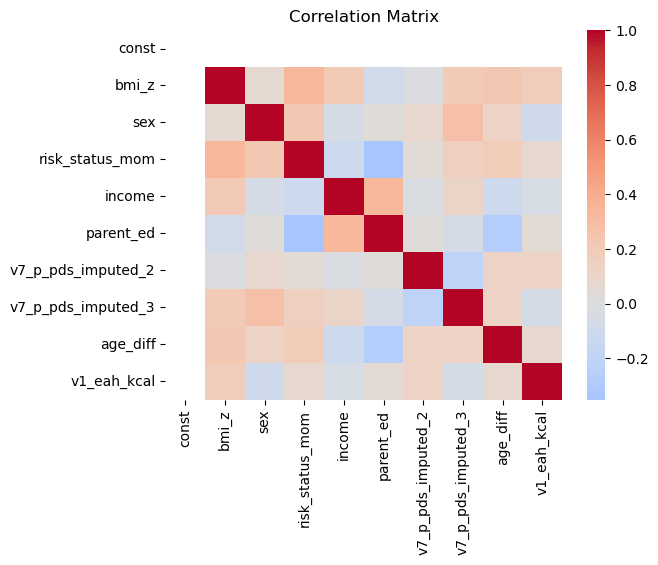

             Variable           VIF
0               const 17.0546721652
1               bmi_z  1.3334243492
2                 sex  1.2026903293
3     risk_status_mom  1.3726641511
4              income  1.2688289304
5           parent_ed  1.3834915920
6  v7_p_pds_imputed_2  1.1148963892
7  v7_p_pds_imputed_3  1.2306789366
8            age_diff  1.1854113300
9         v1_eah_kcal  1.1016350452
CHECKING FOR HETEROSKEDASTICITY


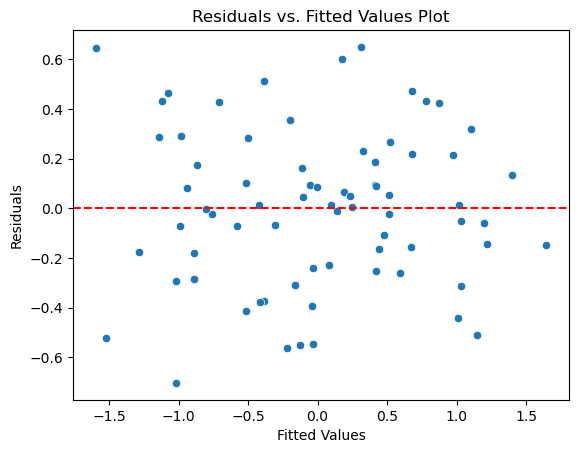

Breusch-Pagan test statistic: 13.993294003351767, p-value: 0.12256397337136117
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


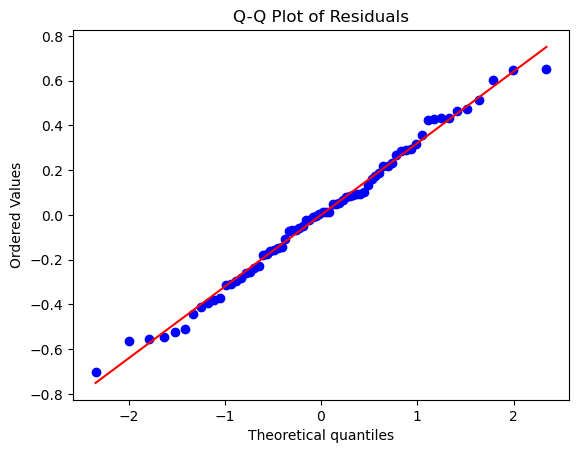

Shapiro-Wilk Test Results:
Statistic: 0.9880886673927307
p-value: 0.7344020009040833
Residuals are normally distributed (fail to reject null hypothesis)


In [267]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHkcalBMIz = mod_EAHkcalBMIz.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHkcalBMIz = durbin_watson(residuals_EAHkcalBMIz)
print("Durbin-Watson Statistic:", dw_statistic_EAHkcalBMIz)
if 0 < dw_statistic_EAHkcalBMIz < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHkcalBMIz.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHkcalBMIz.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHkcalBMIz.values, i) for i in range(X_EAHkcalBMIz.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHkcalBMIz.fittedvalues, y=residuals_EAHkcalBMIz)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHkcalBMIz,  mod_EAHkcalBMIz.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")


# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHkcalBMIz, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHkcalBMIz, p_value_EAHkcalBMIz = shapiro(residuals_EAHkcalBMIz)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHkcalBMIz)
print("p-value:", p_value_EAHkcalBMIz)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHkcalBMIz > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.939752985312152
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


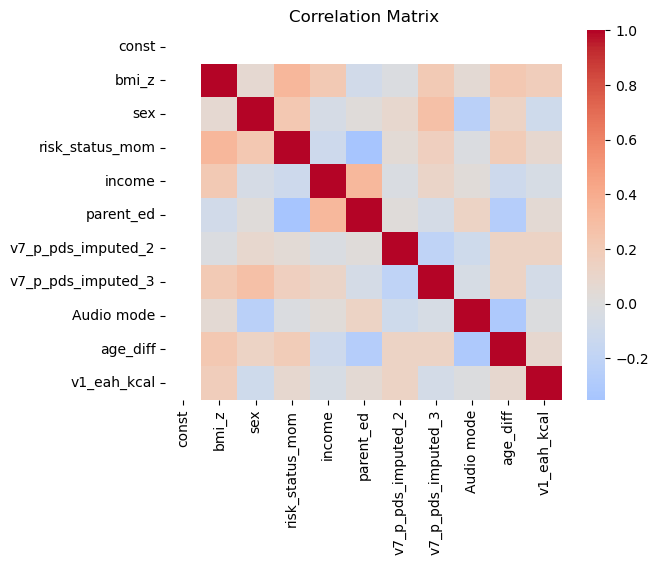

              Variable           VIF
0                const 17.5612839727
1                bmi_z  1.3557459514
2                  sex  1.2755019507
3      risk_status_mom  1.3811932614
4               income  1.2769533133
5            parent_ed  1.4034778255
6   v7_p_pds_imputed_2  1.1171164522
7   v7_p_pds_imputed_3  1.2310822666
8           Audio mode  1.2035545824
9             age_diff  1.2841058363
10         v1_eah_kcal  1.1043412415
CHECKING FOR HETEROSKEDASTICITY


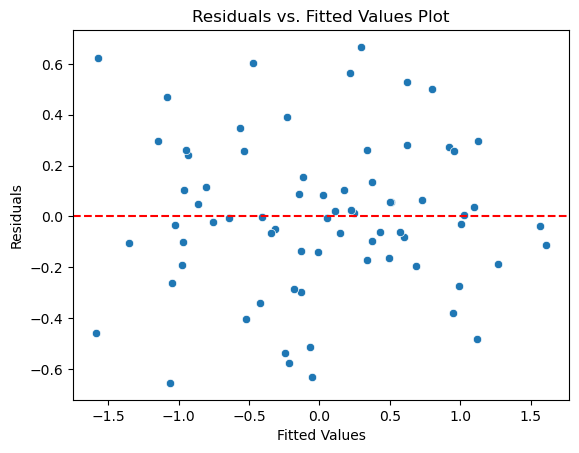

Breusch-Pagan test statistic: 15.493026924120201, p-value: 0.11509404285114587
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


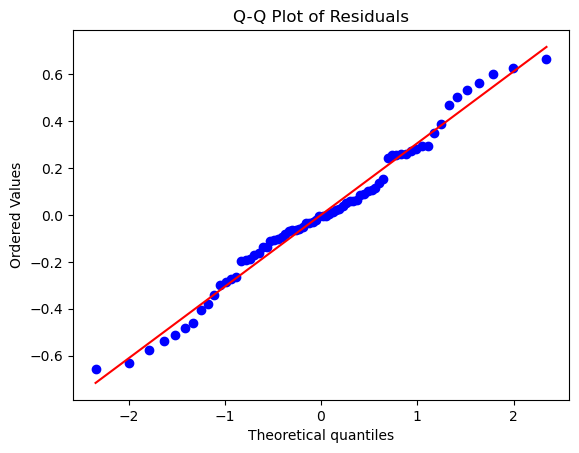

Shapiro-Wilk Test Results:
Statistic: 0.9812551736831665
p-value: 0.3588877022266388
Residuals are normally distributed (fail to reject null hypothesis)


In [268]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHkcalBMIz_audio= mod_EAHkcalBMIz_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHkcalBMIz_audio = durbin_watson(residuals_EAHkcalBMIz_audio)
print("Durbin-Watson Statistic:", dw_statistic_EAHkcalBMIz_audio)
if 0 < dw_statistic_EAHkcalBMIz_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHkcalBMIz_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHkcalBMIz_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHkcalBMIz_audio.values, i) for i in range(X_EAHkcalBMIz_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHkcalBMIz_audio.fittedvalues, y=residuals_EAHkcalBMIz_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHkcalBMIz_audio,  mod_EAHkcalBMIz_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")


# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHkcalBMIz_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHkcalBMIz_audio, p_value_EAHkcalBMIz_audio = shapiro(residuals_EAHkcalBMIz_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHkcalBMIz_audio)
print("p-value:", p_value_EAHkcalBMIz_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHkcalBMIz_audio> alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.8439429793361233
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


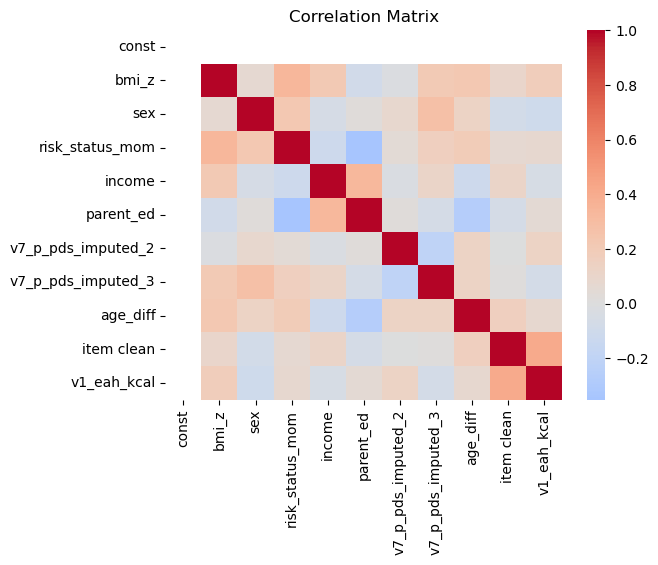

              Variable           VIF
0                const 17.0547499381
1                bmi_z  1.3398794539
2                  sex  1.2041733776
3      risk_status_mom  1.3737747287
4               income  1.3218079697
5            parent_ed  1.3988730315
6   v7_p_pds_imputed_2  1.1207838621
7   v7_p_pds_imputed_3  1.2306958517
8             age_diff  1.2119446364
9           item clean  1.2928047772
10         v1_eah_kcal  1.3396771838
CHECKING FOR HETEROSKEDASTICITY


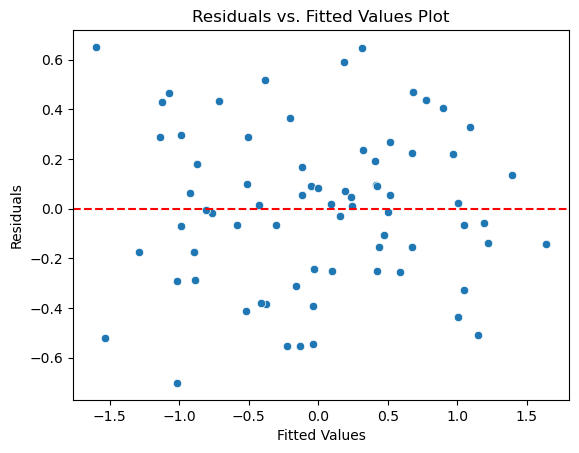

Breusch-Pagan test statistic: 13.908926944048122, p-value: 0.17718641280684605
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


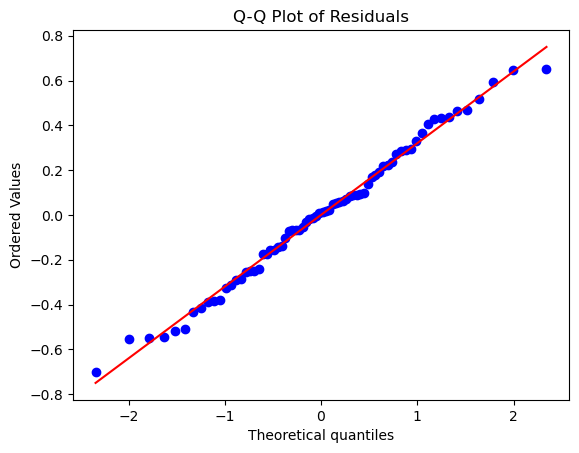

Shapiro-Wilk Test Results:
Statistic: 0.9877539277076721
p-value: 0.7142380475997925
Residuals are normally distributed (fail to reject null hypothesis)


In [269]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHkcalBMIz_item= mod_EAHkcalBMIz_item.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHkcalBMIz_item = durbin_watson(residuals_EAHkcalBMIz_item)
print("Durbin-Watson Statistic:", dw_statistic_EAHkcalBMIz_item)
if 0 < dw_statistic_EAHkcalBMIz_item < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHkcalBMIz_item.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHkcalBMIz_item.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHkcalBMIz_item.values, i) for i in range(X_EAHkcalBMIz_item.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHkcalBMIz_item.fittedvalues, y=residuals_EAHkcalBMIz_item)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHkcalBMIz_item,  mod_EAHkcalBMIz_item.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")


# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHkcalBMIz_item, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHkcalBMIz_item, p_value_EAHkcalBMIz_item = shapiro(residuals_EAHkcalBMIz_item)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHkcalBMIz_item)
print("p-value:", p_value_EAHkcalBMIz_item)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHkcalBMIz_item > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

## Model : EAH sweet (kcal) at baseline (V1) vs V7 weight status BMIz
#### covariates : baseline BMIz, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1,  main predictor: baseline EAH sweet intake (kcal)

In [270]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetkcalBMIz = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','v1_eah_sweet_kcal']]
y_EAHsweetkcalBMIz = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHsweetkcalBMIz = sm.add_constant(X_EAHsweetkcalBMIz)

# Fit a linear regression model using ols
mod_EAHsweetkcalBMIz= sm.OLS(y_EAHsweetkcalBMIz, X_EAHsweetkcalBMIz).fit()

# Get summary of the regression model
print(mod_EAHsweetkcalBMIz.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.856
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     40.92
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           8.89e-23
Time:                        15:37:01   Log-Likelihood:                -18.530
No. Observations:                  72   AIC:                             57.06
Df Residuals:                      62   BIC:                             79.83
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4685      0

### audio added 

In [271]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetkcalBMIz_audio = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','Audio mode', 'age_diff','v1_eah_sweet_kcal']]
y_EAHsweetkcalBMIz_audio= df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHsweetkcalBMIz_audio = sm.add_constant(X_EAHsweetkcalBMIz_audio)

# Fit a linear regression model using ols
mod_EAHsweetkcalBMIz_audio= sm.OLS(y_EAHsweetkcalBMIz_audio, X_EAHsweetkcalBMIz_audio).fit()

# Get summary of the regression model
print(mod_EAHsweetkcalBMIz_audio.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.868
Model:                            OLS   Adj. R-squared:                  0.847
Method:                 Least Squares   F-statistic:                     40.20
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           4.07e-23
Time:                        15:37:01   Log-Likelihood:                -15.311
No. Observations:                  72   AIC:                             52.62
Df Residuals:                      61   BIC:                             77.67
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4029      0

#### item clean added

In [272]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetkcalBMIz_item = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff', 'item clean', 'v1_eah_sweet_kcal']]
y_EAHsweetkcalBMIz_item = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHsweetkcalBMIz_item = sm.add_constant(X_EAHsweetkcalBMIz_item)

# Fit a linear regression model using ols
mod_EAHsweetkcalBMIz_item = sm.OLS(y_EAHsweetkcalBMIz_item, X_EAHsweetkcalBMIz_item).fit()

# Get summary of the regression model
print(mod_EAHsweetkcalBMIz_item.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.856
Model:                            OLS   Adj. R-squared:                  0.832
Method:                 Least Squares   F-statistic:                     36.25
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           5.84e-22
Time:                        15:37:01   Log-Likelihood:                -18.520
No. Observations:                  72   AIC:                             59.04
Df Residuals:                      61   BIC:                             84.08
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4685      0

assumption check for all 3 models

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.8331505014581926
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


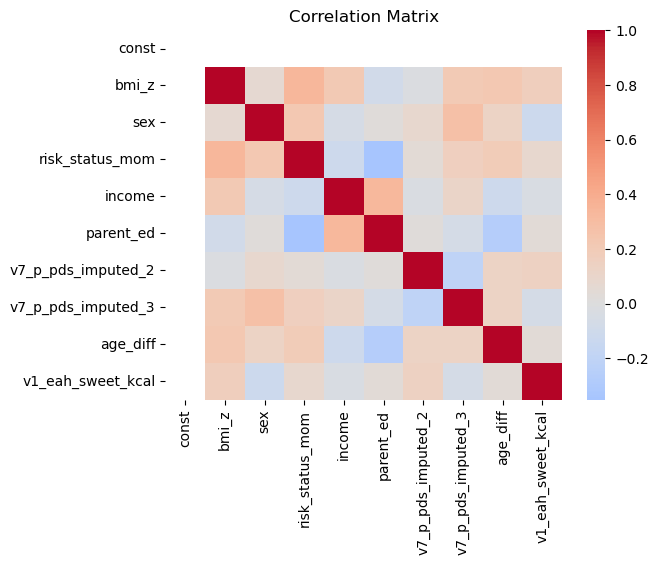

             Variable           VIF
0               const 17.0524524378
1               bmi_z  1.3303899529
2                 sex  1.2059251939
3     risk_status_mom  1.3732419706
4              income  1.2631254094
5           parent_ed  1.3737910141
6  v7_p_pds_imputed_2  1.1202805595
7  v7_p_pds_imputed_3  1.2295512069
8            age_diff  1.1827784720
9   v1_eah_sweet_kcal  1.0948683391
CHECKING FOR HETEROSKEDASTICITY


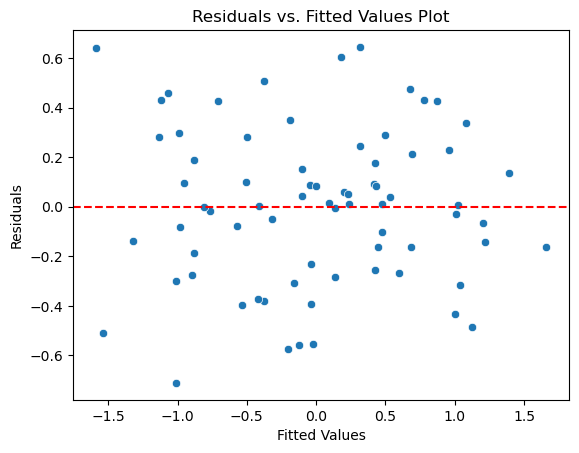

Breusch-Pagan test statistic: 13.902701195943145, p-value: 0.12582867393628613
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


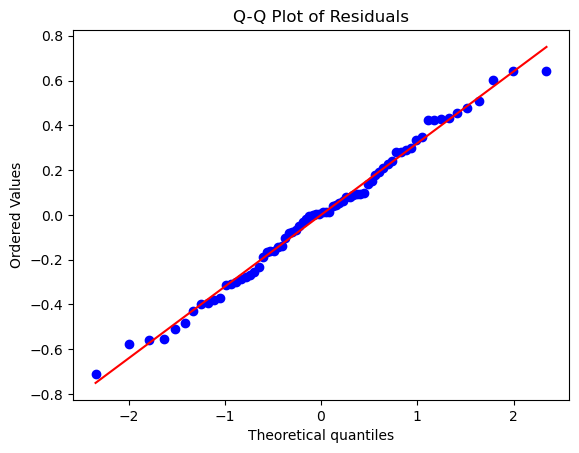

Shapiro-Wilk Test Results:
Statistic: 0.9879482984542847
p-value: 0.7259674072265625
Residuals are normally distributed (fail to reject null hypothesis)


In [273]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsweetkcalBMIz= mod_EAHsweetkcalBMIz.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetkcalBMIz = durbin_watson(residuals_EAHsweetkcalBMIz)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetkcalBMIz)
if 0 < dw_statistic_EAHsweetkcalBMIz < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetkcalBMIz.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetkcalBMIz.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetkcalBMIz.values, i) for i in range(X_EAHsweetkcalBMIz.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetkcalBMIz.fittedvalues, y=residuals_EAHsweetkcalBMIz)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetkcalBMIz,  mod_EAHsweetkcalBMIz.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetkcalBMIz, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetkcalBMIz, p_value_EAHsweetkcalBMIz = shapiro(residuals_EAHsweetkcalBMIz)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetkcalBMIz)
print("p-value:", p_value_EAHsweetkcalBMIz)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetkcalBMIz > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.9164413151579125
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


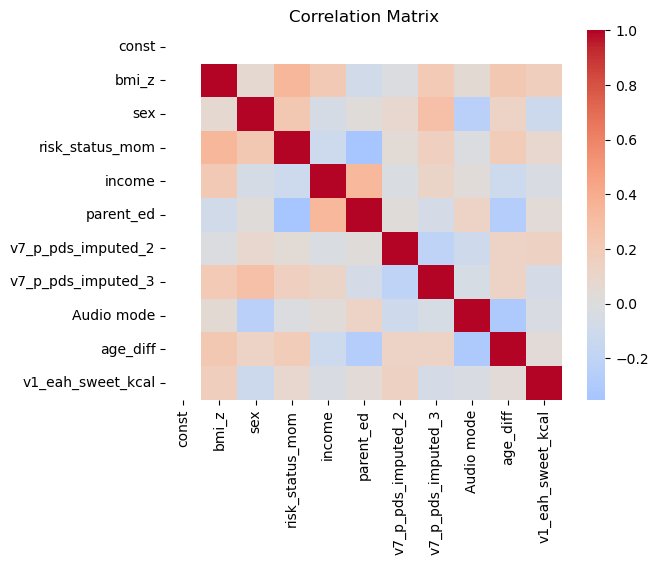

              Variable           VIF
0                const 17.5663055761
1                bmi_z  1.3547877173
2                  sex  1.2824731022
3      risk_status_mom  1.3823419995
4               income  1.2717252470
5            parent_ed  1.3945268099
6   v7_p_pds_imputed_2  1.1219791979
7   v7_p_pds_imputed_3  1.2299456695
8           Audio mode  1.2090020502
9             age_diff  1.2831520077
10   v1_eah_sweet_kcal  1.1025256239
CHECKING FOR HETEROSKEDASTICITY


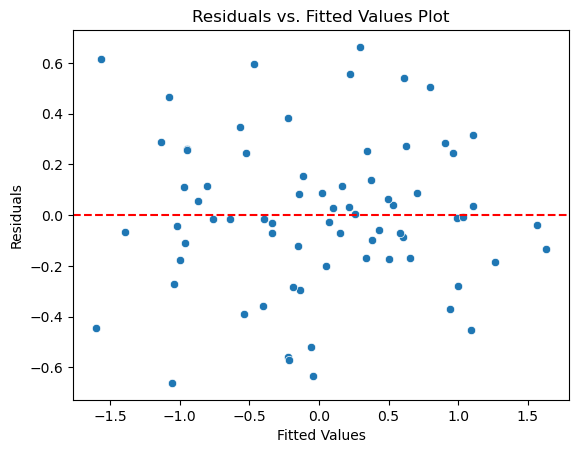

Breusch-Pagan test statistic: 15.524695468162985, p-value: 0.11407103054938797
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


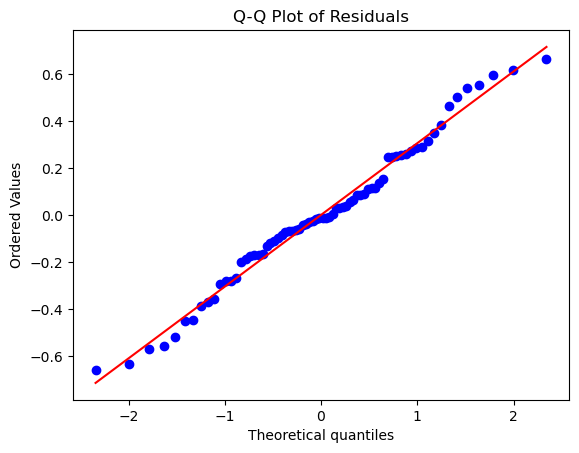

Shapiro-Wilk Test Results:
Statistic: 0.9822574853897095
p-value: 0.40449050068855286
Residuals are normally distributed (fail to reject null hypothesis)


In [274]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsweetkcalBMIz_audio= mod_EAHsweetkcalBMIz_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetkcalBMIz_audio = durbin_watson(residuals_EAHsweetkcalBMIz_audio)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetkcalBMIz_audio)
if 0 < dw_statistic_EAHsweetkcalBMIz_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetkcalBMIz_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetkcalBMIz_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetkcalBMIz_audio.values, i) for i in range(X_EAHsweetkcalBMIz_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetkcalBMIz_audio.fittedvalues, y=residuals_EAHsweetkcalBMIz_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetkcalBMIz_audio,  mod_EAHsweetkcalBMIz_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetkcalBMIz_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetkcalBMIz_audio, p_value_EAHsweetkcalBMIz_audio = shapiro(residuals_EAHsweetkcalBMIz_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetkcalBMIz_audio)
print("p-value:", p_value_EAHsweetkcalBMIz_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetkcalBMIz_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.824478269875618
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


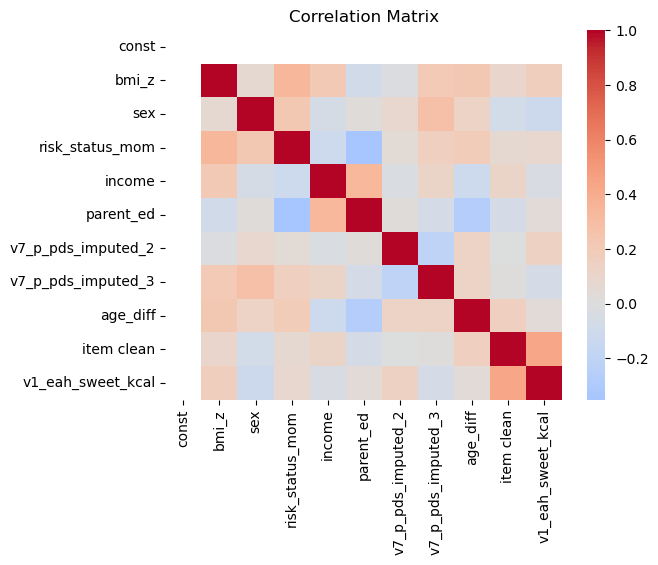

              Variable           VIF
0                const 17.0525501843
1                bmi_z  1.3374371713
2                  sex  1.2067901138
3      risk_status_mom  1.3741242603
4               income  1.3138424233
5            parent_ed  1.3864878301
6   v7_p_pds_imputed_2  1.1286274986
7   v7_p_pds_imputed_3  1.2295553842
8             age_diff  1.2173455874
9           item clean  1.3300297974
10   v1_eah_sweet_kcal  1.3697860451
CHECKING FOR HETEROSKEDASTICITY


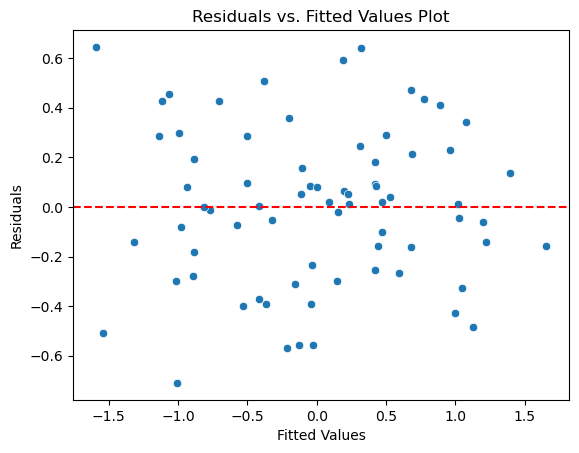

Breusch-Pagan test statistic: 13.827528031105048, p-value: 0.1810049475851543
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


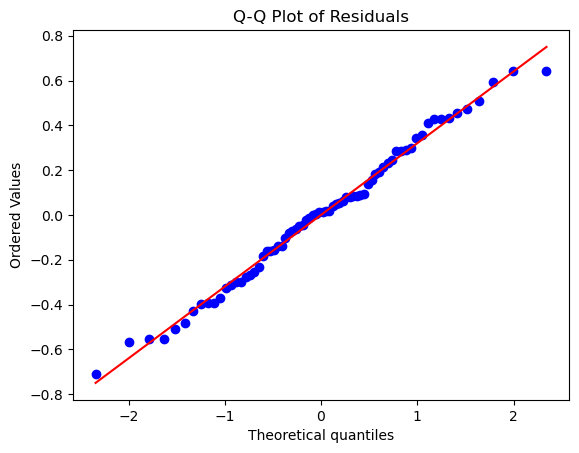

Shapiro-Wilk Test Results:
Statistic: 0.9876927733421326
p-value: 0.7105412483215332
Residuals are normally distributed (fail to reject null hypothesis)


In [275]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsweetkcalBMIz_item = mod_EAHsweetkcalBMIz_item.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetkcalBMIz_item = durbin_watson(residuals_EAHsweetkcalBMIz_item)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetkcalBMIz_item)
if 0 < dw_statistic_EAHsweetkcalBMIz_item < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetkcalBMIz_item.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetkcalBMIz_item.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetkcalBMIz_item.values, i) for i in range(X_EAHsweetkcalBMIz_item.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetkcalBMIz_item.fittedvalues, y=residuals_EAHsweetkcalBMIz_item)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetkcalBMIz_item,  mod_EAHsweetkcalBMIz_item.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetkcalBMIz_item, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetkcalBMIz_item, p_value_EAHsweetkcalBMIz_item = shapiro(residuals_EAHsweetkcalBMIz_item)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetkcalBMIz_item)
print("p-value:", p_value_EAHsweetkcalBMIz_item)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetkcalBMIz_item > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

## Model : EAH savory (kcal) at baseline (V1) vs V7 weight status BMIz
#### covariates :baseline BMIz, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1, main predictor: baseline EAH savory intake (kcal)

In [276]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavkcalBMIz = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff', 'v1_eah_sav_kcal']]
y_EAHsavkcalBMIz = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHsavkcalBMIz = sm.add_constant(X_EAHsavkcalBMIz)

# Fit a linear regression model using ols
mod_EAHsavkcalBMIz= sm.OLS(y_EAHsavkcalBMIz, X_EAHsavkcalBMIz).fit()

# Get summary of the regression model
print(mod_EAHsavkcalBMIz.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.852
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     39.59
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           2.10e-22
Time:                        15:37:02   Log-Likelihood:                -19.547
No. Observations:                  72   AIC:                             59.09
Df Residuals:                      62   BIC:                             81.86
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4732      0

#### added audio mode

In [277]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavkcalBMIz_audio = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','Audio mode','age_diff', 'v1_eah_sav_kcal']]
y_EAHsavkcalBMIz_audio = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHsavkcalBMIz_audio = sm.add_constant(X_EAHsavkcalBMIz_audio)

# Fit a linear regression model using ols
mod_EAHsavkcalBMIz_audio= sm.OLS(y_EAHsavkcalBMIz_audio, X_EAHsavkcalBMIz_audio).fit()

# Get summary of the regression model
print(mod_EAHsavkcalBMIz_audio.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.862
Model:                            OLS   Adj. R-squared:                  0.840
Method:                 Least Squares   F-statistic:                     38.26
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.46e-22
Time:                        15:37:02   Log-Likelihood:                -16.849
No. Observations:                  72   AIC:                             55.70
Df Residuals:                      61   BIC:                             80.74
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4138      0

#### added item clean

In [278]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavkcalBMIz_item = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','item clean','v1_eah_sav_kcal']]
y_EAHsavkcalBMIz_item = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHsavkcalBMIz_item = sm.add_constant(X_EAHsavkcalBMIz_item)

# Fit a linear regression model using ols
mod_EAHsavkcalBMIz_item = sm.OLS(y_EAHsavkcalBMIz_item, X_EAHsavkcalBMIz_item).fit()

# Get summary of the regression model
print(mod_EAHsavkcalBMIz_item.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.853
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     35.37
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.09e-21
Time:                        15:37:02   Log-Likelihood:                -19.270
No. Observations:                  72   AIC:                             60.54
Df Residuals:                      61   BIC:                             85.58
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4719      0

assumption check for 3 models

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.912327053012621
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


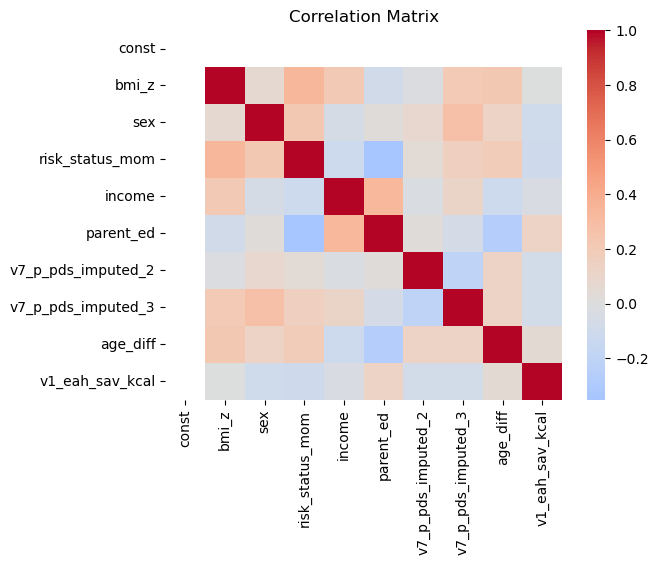

             Variable           VIF
0               const 17.0518107958
1               bmi_z  1.2914727511
2                 sex  1.1843370021
3     risk_status_mom  1.3700724926
4              income  1.2605574549
5           parent_ed  1.3937570022
6  v7_p_pds_imputed_2  1.1113357720
7  v7_p_pds_imputed_3  1.2348400894
8            age_diff  1.1997084451
9     v1_eah_sav_kcal  1.0650348892
CHECKING FOR HETEROSKEDASTICITY


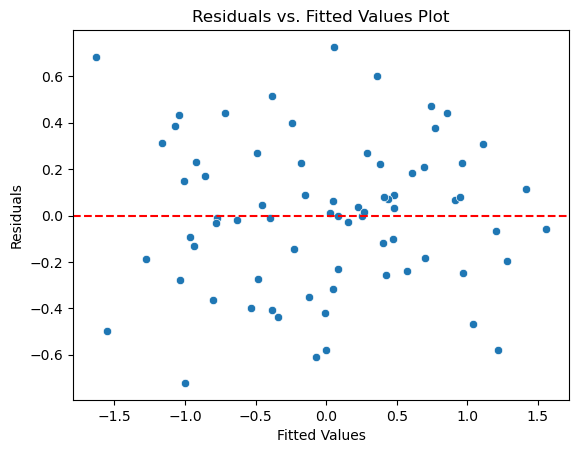

Breusch-Pagan test statistic: 13.401214576785723, p-value: 0.14527609196770544
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


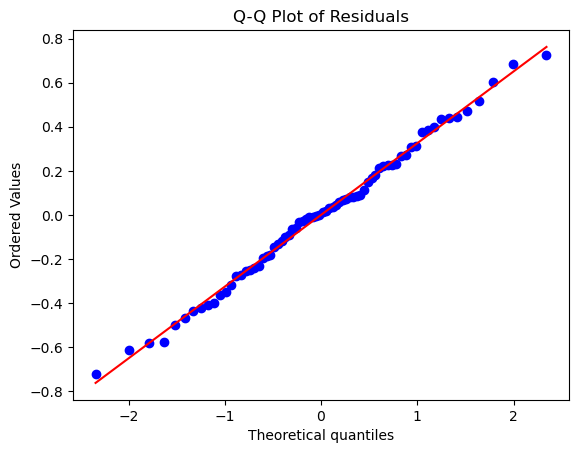

Shapiro-Wilk Test Results:
Statistic: 0.9923834800720215
p-value: 0.9452192187309265
Residuals are normally distributed (fail to reject null hypothesis)


In [279]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsavkcalBMIz= mod_EAHsavkcalBMIz.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavkcalBMIz = durbin_watson(residuals_EAHsavkcalBMIz)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavkcalBMIz)
if 0 < dw_statistic_EAHsavkcalBMIz < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavkcalBMIz.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavkcalBMIz.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavkcalBMIz.values, i) for i in range(X_EAHsavkcalBMIz.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavkcalBMIz.fittedvalues, y=residuals_EAHsavkcalBMIz)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsavkcalBMIz,  mod_EAHsavkcalBMIz.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")
    
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavkcalBMIz, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavkcalBMIz, p_value_EAHsavkcalBMIz = shapiro(residuals_EAHsavkcalBMIz)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavkcalBMIz)
print("p-value:", p_value_EAHsavkcalBMIz)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsavkcalBMIz > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.996455819572466
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


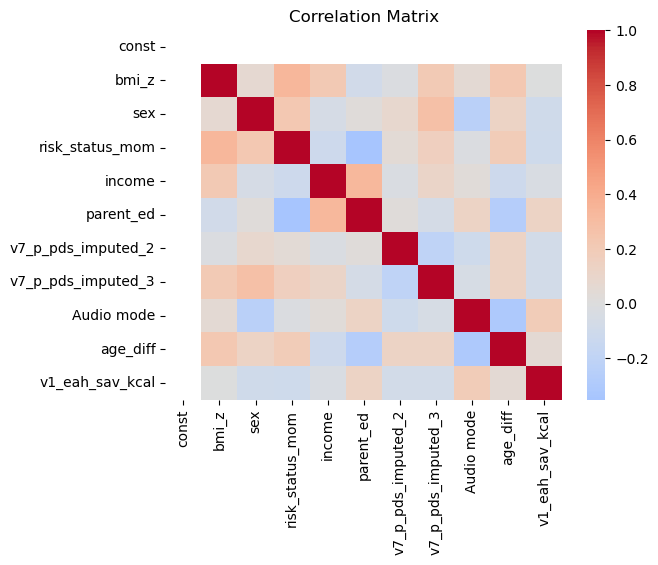

              Variable           VIF
0                const 17.5365786589
1                bmi_z  1.3094093850
2                  sex  1.2468428278
3      risk_status_mom  1.3803418923
4               income  1.2649612332
5            parent_ed  1.4034736596
6   v7_p_pds_imputed_2  1.1123096550
7   v7_p_pds_imputed_3  1.2363417855
8           Audio mode  1.2503730959
9             age_diff  1.3217631668
10     v1_eah_sav_kcal  1.1091830200
CHECKING FOR HETEROSKEDASTICITY


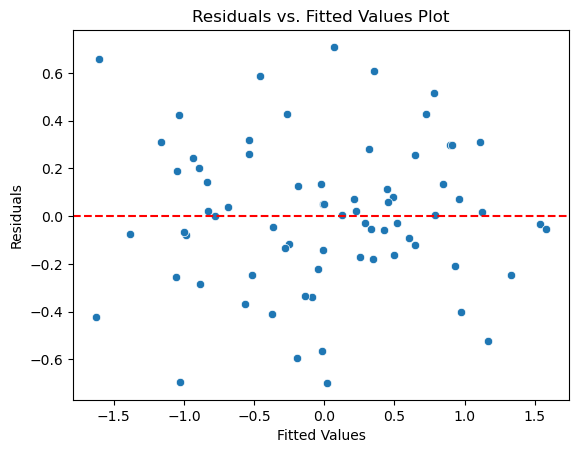

Breusch-Pagan test statistic: 15.39643596870018, p-value: 0.11826304724427615
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


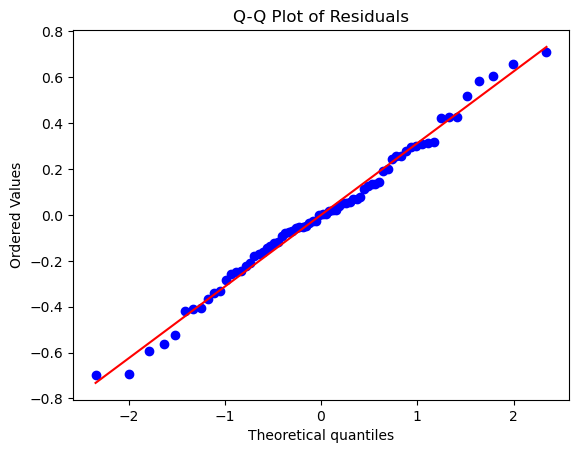

Shapiro-Wilk Test Results:
Statistic: 0.9883714914321899
p-value: 0.7512788772583008
Residuals are normally distributed (fail to reject null hypothesis)


In [280]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsavkcalBMIz_audio= mod_EAHsavkcalBMIz_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavkcalBMIz_audio = durbin_watson(residuals_EAHsavkcalBMIz_audio)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavkcalBMIz_audio)
if 0 < dw_statistic_EAHsavkcalBMIz_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavkcalBMIz_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavkcalBMIz_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavkcalBMIz_audio.values, i) for i in range(X_EAHsavkcalBMIz_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavkcalBMIz_audio.fittedvalues, y=residuals_EAHsavkcalBMIz_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsavkcalBMIz_audio,  mod_EAHsavkcalBMIz_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")
    
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavkcalBMIz_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavkcalBMIz_audio, p_value_EAHsavkcalBMIz_audio = shapiro(residuals_EAHsavkcalBMIz_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavkcalBMIz_audio)
print("p-value:", p_value_EAHsavkcalBMIz_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsavkcalBMIz_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.8637430111345785
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


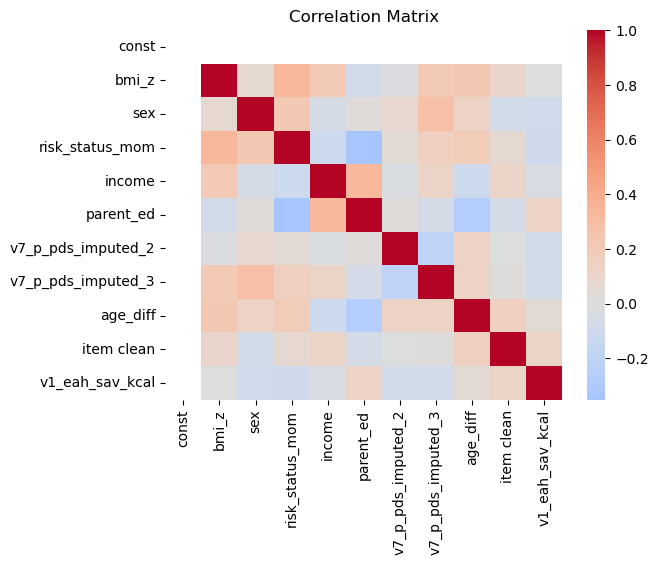

              Variable           VIF
0                const 17.0540470357
1                bmi_z  1.2915813235
2                  sex  1.1929090578
3      risk_status_mom  1.3747549272
4               income  1.2882277318
5            parent_ed  1.3986611028
6   v7_p_pds_imputed_2  1.1113373045
7   v7_p_pds_imputed_3  1.2348733513
8             age_diff  1.2237199291
9           item clean  1.0788425499
10     v1_eah_sav_kcal  1.0808150195
CHECKING FOR HETEROSKEDASTICITY


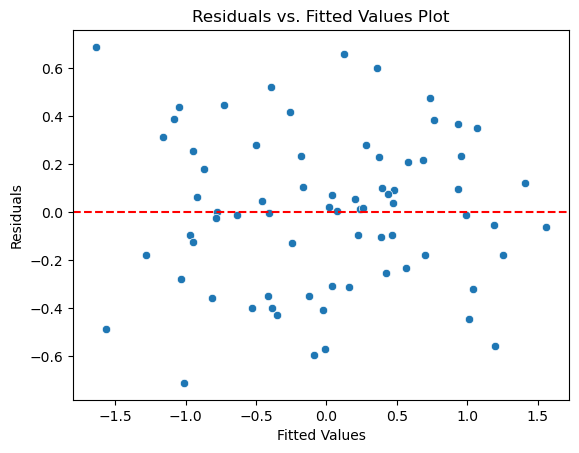

Breusch-Pagan test statistic: 13.183549676391637, p-value: 0.21358968078292187
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


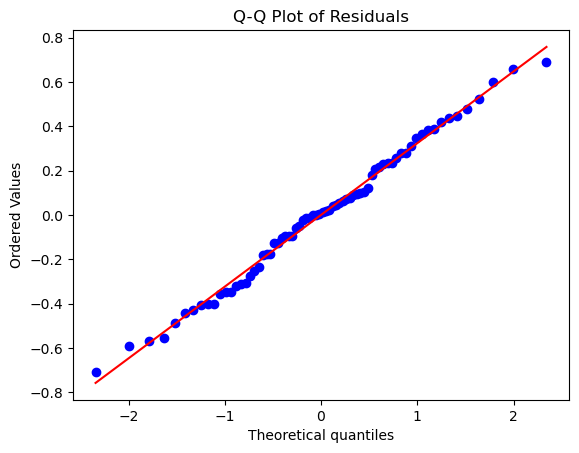

Shapiro-Wilk Test Results:
Statistic: 0.9895331263542175
p-value: 0.817995011806488
Residuals are normally distributed (fail to reject null hypothesis)


In [281]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsavkcalBMIz_item= mod_EAHsavkcalBMIz_item.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavkcalBMIz_item = durbin_watson(residuals_EAHsavkcalBMIz_item)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavkcalBMIz_item)
if 0 < dw_statistic_EAHsavkcalBMIz_item < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavkcalBMIz_item.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavkcalBMIz_item.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavkcalBMIz_item.values, i) for i in range(X_EAHsavkcalBMIz_item.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavkcalBMIz_item.fittedvalues, y=residuals_EAHsavkcalBMIz_item)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsavkcalBMIz_item,  mod_EAHsavkcalBMIz_item.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")
    
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavkcalBMIz_item, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavkcalBMIz_item, p_value_EAHsavkcalBMIz_item = shapiro(residuals_EAHsavkcalBMIz_item)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavkcalBMIz_item)
print("p-value:", p_value_EAHsavkcalBMIz_item)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsavkcalBMIz_item > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

## Regression model: Intake (gram) at baseline V1 vs follow-up adiposity (FMI)

### Model : Meal (gram) at baseline (V1) vs V7 follow-up adiposity FMI
#### covariates : baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1, main predictor: baseline meal intake (gram)

In [282]:
# Select specific columns as predictors (X) and response (y)
X_mealgFMI = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff', 'v1_meal_g']]
y_mealgFMI = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_mealgFMI = sm.add_constant(X_mealgFMI)

# Fit a linear regression model using ols
mod_mealgFMI= sm.OLS(y_mealgFMI, X_mealgFMI).fit()

# Get summary of the regression model
print(mod_mealgFMI.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.808
Method:                 Least Squares   F-statistic:                     34.12
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           9.44e-21
Time:                        15:37:03   Log-Likelihood:                -37.948
No. Observations:                  72   AIC:                             95.90
Df Residuals:                      62   BIC:                             118.7
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2894      0

audio added

In [283]:
# Select specific columns as predictors (X) and response (y)
X_mealgFMI_audio = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','Audio mode','age_diff', 'v1_meal_g']]
y_mealgFMI_audio = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_mealgFMI_audio = sm.add_constant(X_mealgFMI_audio)

# Fit a linear regression model using ols
mod_mealgFMI_audio= sm.OLS(y_mealgFMI_audio, X_mealgFMI_audio).fit()

# Get summary of the regression model
print(mod_mealgFMI_audio.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.834
Model:                            OLS   Adj. R-squared:                  0.806
Method:                 Least Squares   F-statistic:                     30.58
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           4.23e-20
Time:                        15:37:03   Log-Likelihood:                -37.583
No. Observations:                  72   AIC:                             97.17
Df Residuals:                      61   BIC:                             122.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2662      0

assumptions check

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.612831203586385
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


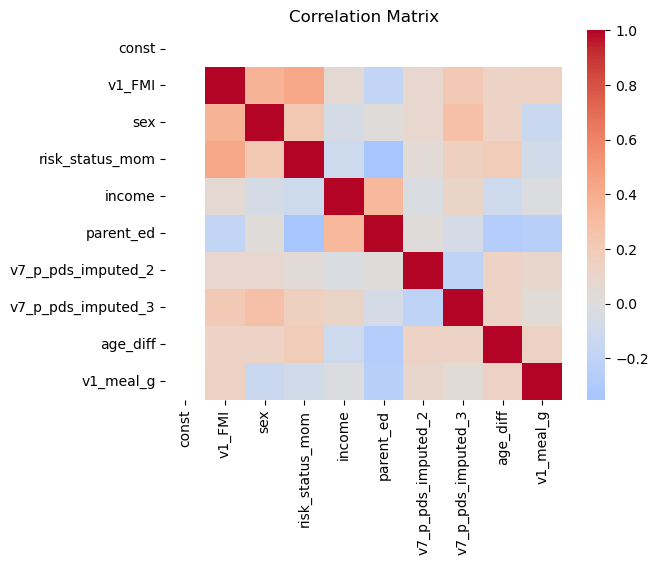

             Variable           VIF
0               const 17.1729867421
1              v1_FMI  1.4860038547
2                 sex  1.3297446406
3     risk_status_mom  1.4824302214
4              income  1.1950701458
5           parent_ed  1.4792667961
6  v7_p_pds_imputed_2  1.1183279124
7  v7_p_pds_imputed_3  1.2312551359
8            age_diff  1.1499049748
9           v1_meal_g  1.2253038132
CHECKING FOR HETEROSKEDASTICITY


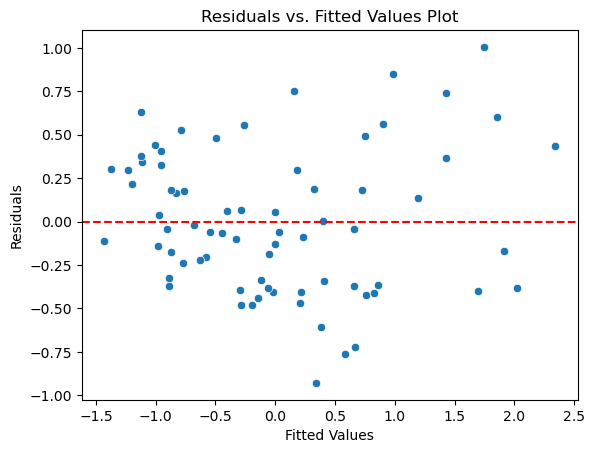

Breusch-Pagan test statistic: 16.44570107585535, p-value: 0.05813769414504582
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


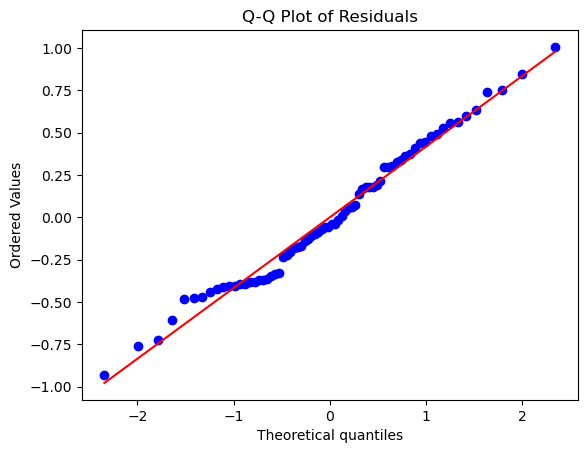

Shapiro-Wilk Test Results:
Statistic: 0.9826064109802246
p-value: 0.42133480310440063
Residuals are normally distributed (fail to reject null hypothesis)


In [284]:
# checking for model assumptions
# Calculate the residuals
residuals_mealgFMI= mod_mealgFMI.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_mealgFMI = durbin_watson(residuals_mealgFMI)
print("Durbin-Watson Statistic:", dw_statistic_mealgFMI)
if 0 < dw_statistic_mealgFMI < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_mealgFMI.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_mealgFMI.columns
vif_data["VIF"] = [variance_inflation_factor(X_mealgFMI.values, i) for i in range(X_mealgFMI.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_mealgFMI.fittedvalues, y=residuals_mealgFMI)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_mealgFMI,  mod_mealgFMI.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_mealgFMI, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_mealgFMI, p_value_mealgFMI = shapiro(residuals_mealgFMI)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_mealgFMI)
print("p-value:", p_value_mealgFMI)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_mealgFMI > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.629613477549988
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


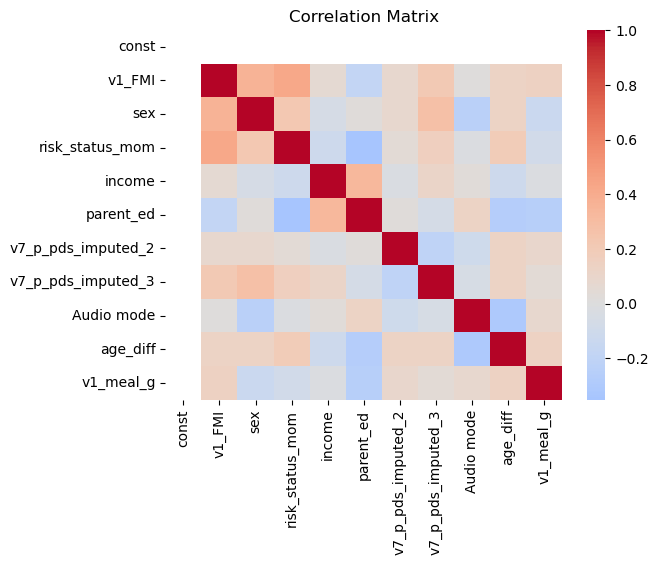

              Variable           VIF
0                const 17.4903219590
1               v1_FMI  1.5043663834
2                  sex  1.4137381857
3      risk_status_mom  1.4964574112
4               income  1.2006227313
5            parent_ed  1.5165735676
6   v7_p_pds_imputed_2  1.1253288507
7   v7_p_pds_imputed_3  1.2314226904
8           Audio mode  1.2243434686
9             age_diff  1.2425393934
10           v1_meal_g  1.2435582167
CHECKING FOR HETEROSKEDASTICITY


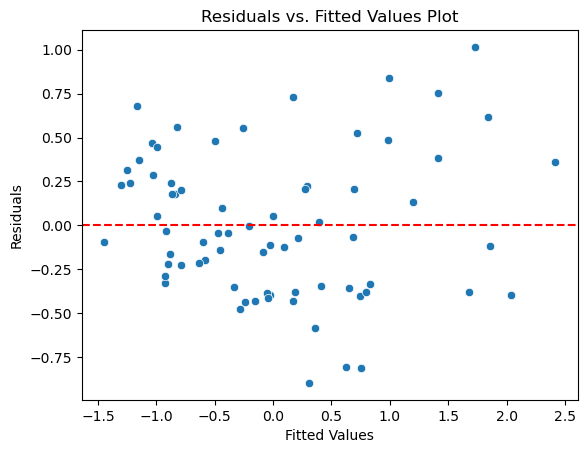

Breusch-Pagan test statistic: 15.881746664789713, p-value: 0.10306794574464892
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


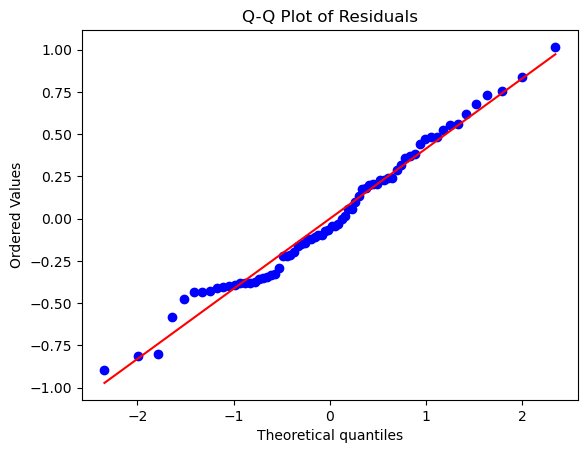

Shapiro-Wilk Test Results:
Statistic: 0.9807645082473755
p-value: 0.3380768895149231
Residuals are normally distributed (fail to reject null hypothesis)


In [285]:
# checking for model assumptions
# Calculate the residuals
residuals_mealgFMI_audio= mod_mealgFMI_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_mealgFMI_audio = durbin_watson(residuals_mealgFMI_audio)
print("Durbin-Watson Statistic:", dw_statistic_mealgFMI_audio)
if 0 < dw_statistic_mealgFMI_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_mealgFMI_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_mealgFMI_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_mealgFMI_audio.values, i) for i in range(X_mealgFMI_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_mealgFMI_audio.fittedvalues, y=residuals_mealgFMI_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_mealgFMI_audio,  mod_mealgFMI_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_mealgFMI_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_mealgFMI_audio, p_value_mealgFMI_audio = shapiro(residuals_mealgFMI_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_mealgFMI_audio)
print("p-value:", p_value_mealgFMI_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_mealgFMI_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### Model : EAH (gram) at baseline (V1) vs V7 follow-up adiposity FMI (v7)
#### covariates :baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1,  main predictor: baseline EAH intake (gram)

In [286]:
# Select specific columns as predictors (X) and response (y)
X_EAHgFMI = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff','v1_eah_g']]
y_EAHgFMI = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHgFMI = sm.add_constant(X_EAHgFMI)

# Fit a linear regression model using ols
mod_EAHgFMI= sm.OLS(y_EAHgFMI, X_EAHgFMI).fit()

# Get summary of the regression model
print(mod_EAHgFMI.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.837
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     35.32
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           3.91e-21
Time:                        15:37:04   Log-Likelihood:                -36.902
No. Observations:                  72   AIC:                             93.80
Df Residuals:                      62   BIC:                             116.6
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2859      0

audio mode added

In [287]:
# Select specific columns as predictors (X) and response (y)
X_EAHgFMI_audio= df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'Audio mode','age_diff','v1_eah_g']]
y_EAHgFMI_audio = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHgFMI_audio = sm.add_constant(X_EAHgFMI_audio)

# Fit a linear regression model using ols
mod_EAHgFMI_audio= sm.OLS(y_EAHgFMI_audio, X_EAHgFMI_audio).fit()

# Get summary of the regression model
print(mod_EAHgFMI_audio.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.839
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     31.77
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.63e-20
Time:                        15:37:04   Log-Likelihood:                -36.432
No. Observations:                  72   AIC:                             94.86
Df Residuals:                      61   BIC:                             119.9
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2544      0

item cleaner added as covariate

In [288]:
# Select specific columns as predictors (X) and response (y)
X_EAHgFMI_item= df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff','item clean','v1_eah_g']]
y_EAHgFMI_item = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHgFMI_item = sm.add_constant(X_EAHgFMI_item)

# Fit a linear regression model using ols
mod_EAHgFMI_item = sm.OLS(y_EAHgFMI_item, X_EAHgFMI_item).fit()

# Get summary of the regression model
print(mod_EAHgFMI_item.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.837
Model:                            OLS   Adj. R-squared:                  0.810
Method:                 Least Squares   F-statistic:                     31.29
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           2.39e-20
Time:                        15:37:04   Log-Likelihood:                -36.893
No. Observations:                  72   AIC:                             95.79
Df Residuals:                      61   BIC:                             120.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2857      0

assumption checked

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.535885948598252
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


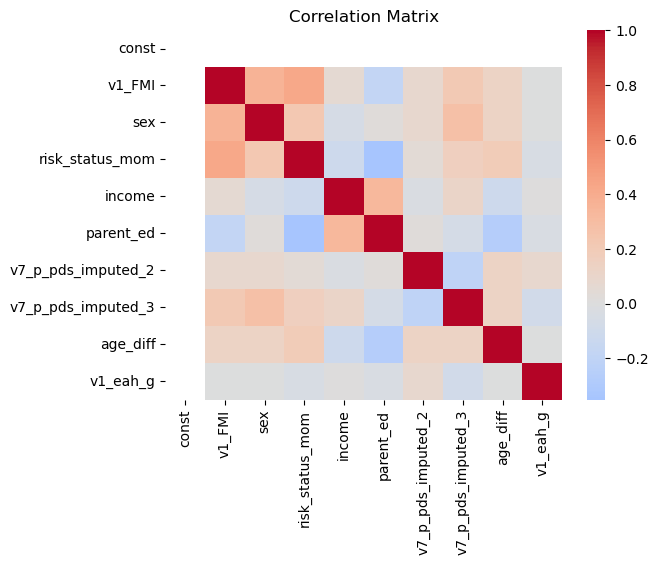

             Variable           VIF
0               const 16.2179768154
1              v1_FMI  1.4125432943
2                 sex  1.2842700766
3     risk_status_mom  1.3859079698
4              income  1.1959751372
5           parent_ed  1.3851492202
6  v7_p_pds_imputed_2  1.1077700721
7  v7_p_pds_imputed_3  1.2299559235
8            age_diff  1.1411372557
9            v1_eah_g  1.0177128257
CHECKING FOR HETEROSKEDASTICITY


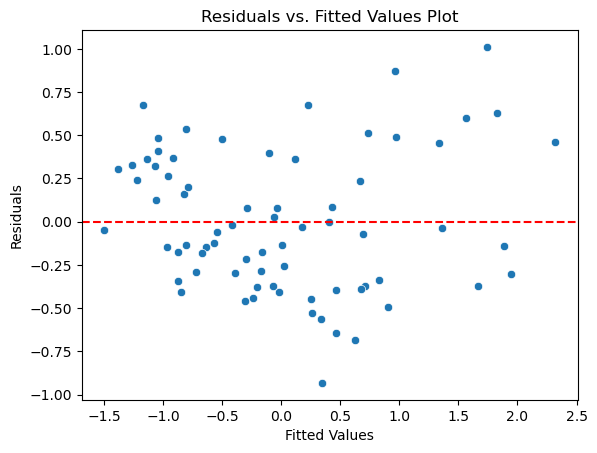

Breusch-Pagan test statistic: 16.590085013214136, p-value: 0.05553578280840226
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


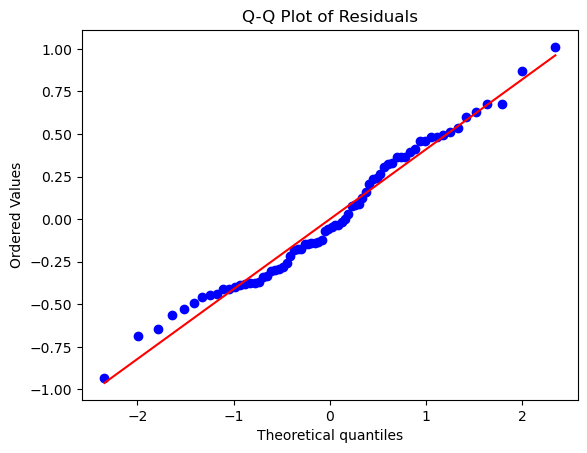

Shapiro-Wilk Test Results:
Statistic: 0.9780281186103821
p-value: 0.23965458571910858
Residuals are normally distributed (fail to reject null hypothesis)


In [289]:
# checking for model assumptions 
# Calculate the residuals
residuals_EAHgFMI= mod_EAHgFMI.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHgFMI = durbin_watson(residuals_EAHgFMI)
print("Durbin-Watson Statistic:", dw_statistic_EAHgFMI)
if 0 < dw_statistic_EAHgFMI < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHgFMI.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHgFMI.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHgFMI.values, i) for i in range(X_EAHgFMI.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHgFMI.fittedvalues, y=residuals_EAHgFMI)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHgFMI,  mod_EAHgFMI.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")


# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHgFMI, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHgFMI, p_value_EAHgFMI = shapiro(residuals_EAHgFMI)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHgFMI)
print("p-value:", p_value_EAHgFMI)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHgFMI > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.5495561542464984
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


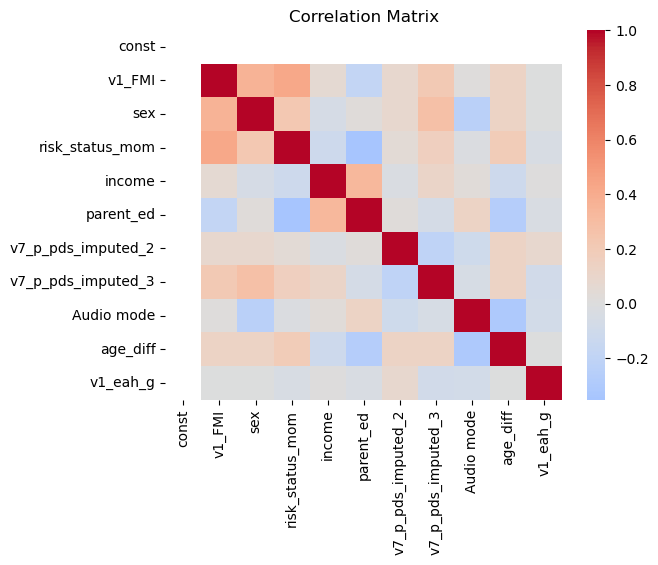

              Variable           VIF
0                const 16.6852682804
1               v1_FMI  1.4409093605
2                  sex  1.3819116813
3      risk_status_mom  1.3915611884
4               income  1.2007765627
5            parent_ed  1.4073012884
6   v7_p_pds_imputed_2  1.1118383981
7   v7_p_pds_imputed_3  1.2302811390
8           Audio mode  1.2125840192
9             age_diff  1.2264813591
10            v1_eah_g  1.0229541196
CHECKING FOR HETEROSKEDASTICITY


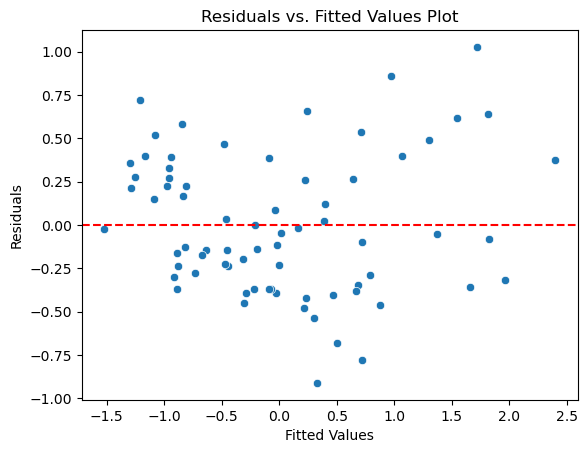

Breusch-Pagan test statistic: 15.895845051934195, p-value: 0.10265302596848037
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


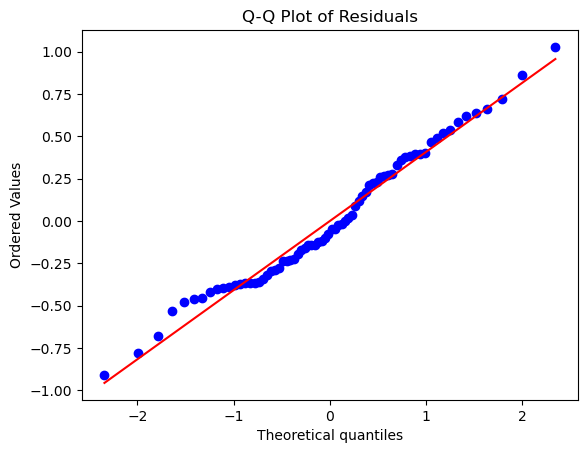

Shapiro-Wilk Test Results:
Statistic: 0.9789168834686279
p-value: 0.2684594392776489
Residuals are normally distributed (fail to reject null hypothesis)


In [290]:
# checking for model assumptions 
# Calculate the residuals
residuals_EAHgFMI_audio= mod_EAHgFMI_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHgFMI_audio = durbin_watson(residuals_EAHgFMI_audio)
print("Durbin-Watson Statistic:", dw_statistic_EAHgFMI_audio)
if 0 < dw_statistic_EAHgFMI_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHgFMI_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHgFMI_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHgFMI_audio.values, i) for i in range(X_EAHgFMI_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHgFMI_audio.fittedvalues, y=residuals_EAHgFMI_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHgFMI_audio,  mod_EAHgFMI_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")


# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHgFMI_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHgFMI_audio, p_value_EAHgFMI_audio = shapiro(residuals_EAHgFMI_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHgFMI_audio)
print("p-value:", p_value_EAHgFMI_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHgFMI_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.5411575485823144
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


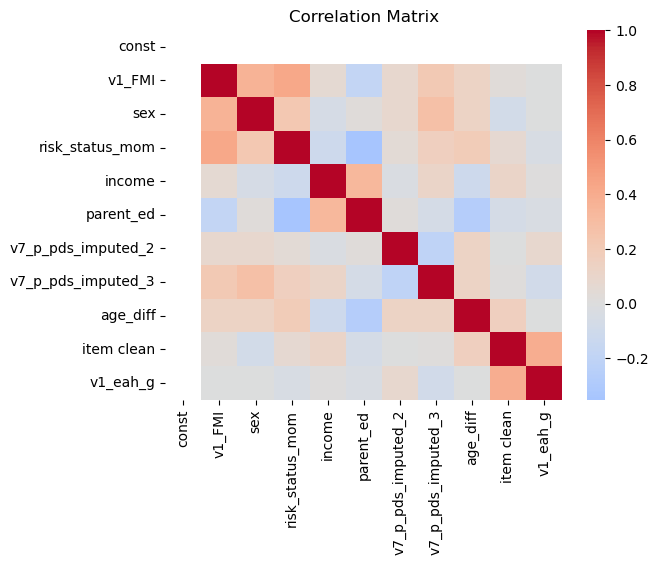

              Variable           VIF
0                const 16.2190079179
1               v1_FMI  1.4126214241
2                  sex  1.3009008785
3      risk_status_mom  1.3949506029
4               income  1.2200330360
5            parent_ed  1.3854792762
6   v7_p_pds_imputed_2  1.1099910817
7   v7_p_pds_imputed_3  1.2304668015
8             age_diff  1.1784267674
9           item clean  1.2768181851
10            v1_eah_g  1.2224124368
CHECKING FOR HETEROSKEDASTICITY


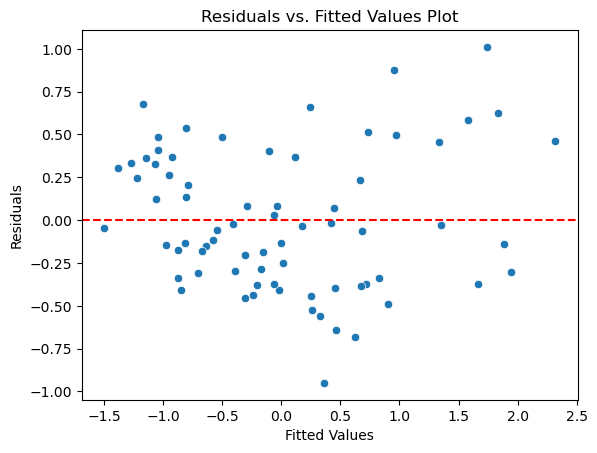

Breusch-Pagan test statistic: 17.621621243734683, p-value: 0.06169179202822311
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


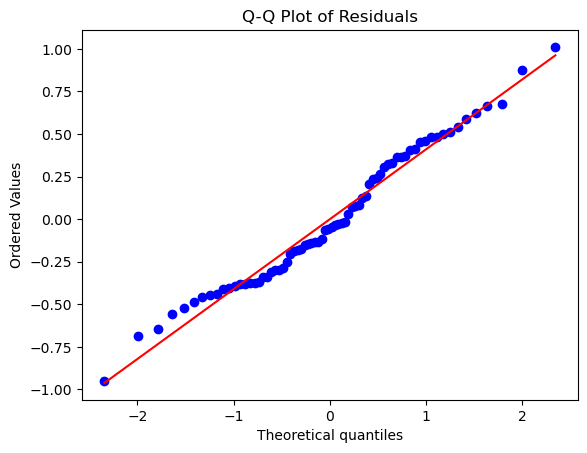

Shapiro-Wilk Test Results:
Statistic: 0.9778580069541931
p-value: 0.2344660609960556
Residuals are normally distributed (fail to reject null hypothesis)


In [291]:
# checking for model assumptions 
# Calculate the residuals
residuals_EAHgFMI_item = mod_EAHgFMI_item.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHgFMI_item = durbin_watson(residuals_EAHgFMI_item)
print("Durbin-Watson Statistic:", dw_statistic_EAHgFMI_item)
if 0 < dw_statistic_EAHgFMI_item < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHgFMI_item.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHgFMI_item.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHgFMI_item.values, i) for i in range(X_EAHgFMI_item.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHgFMI_item.fittedvalues, y=residuals_EAHgFMI_item)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHgFMI_item,  mod_EAHgFMI_item.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")


# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHgFMI_item, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHgFMI_item, p_value_EAHgFMI_item = shapiro(residuals_EAHgFMI_item)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHgFMI_item)
print("p-value:", p_value_EAHgFMI_item)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHgFMI_item > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### Model : EAH sweet (gram) at baseline (V1) vs V7 follow-up adiposity FMI (v7)
#### covariates : baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1,  main predictor: baseline EAH sweet intake (gram)

In [292]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetgFMI = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','v1_eah_sweet_g']]
y_EAHsweetgFMI = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsweetgFMI = sm.add_constant(X_EAHsweetgFMI)

# Fit a linear regression model using ols
mod_EAHsweetgFMI= sm.OLS(y_EAHsweetgFMI, X_EAHsweetgFMI).fit()

# Get summary of the regression model
print(mod_EAHsweetgFMI.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.848
Model:                            OLS   Adj. R-squared:                  0.825
Method:                 Least Squares   F-statistic:                     38.30
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           4.94e-22
Time:                        15:37:06   Log-Likelihood:                -34.450
No. Observations:                  72   AIC:                             88.90
Df Residuals:                      62   BIC:                             111.7
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3022      0

added audio mode

In [293]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetgFMI_audio = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','Audio mode','age_diff','v1_eah_sweet_g']]
y_EAHsweetgFMI_audio = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsweetgFMI_audio = sm.add_constant(X_EAHsweetgFMI_audio)

# Fit a linear regression model using ols
mod_EAHsweetgFMI_audio= sm.OLS(y_EAHsweetgFMI_audio, X_EAHsweetgFMI_audio).fit()

# Get summary of the regression model
print(mod_EAHsweetgFMI_audio.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.825
Method:                 Least Squares   F-statistic:                     34.46
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           2.11e-21
Time:                        15:37:06   Log-Likelihood:                -33.962
No. Observations:                  72   AIC:                             89.92
Df Residuals:                      61   BIC:                             115.0
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2716      0

added item cleaner

In [294]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetgFMI_item = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','item clean', 'v1_eah_sweet_g']]
y_EAHsweetgFMI_item = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsweetgFMI_item = sm.add_constant(X_EAHsweetgFMI_item)

# Fit a linear regression model using ols
mod_EAHsweetgFMI_item = sm.OLS(y_EAHsweetgFMI_item, X_EAHsweetgFMI_item).fit()

# Get summary of the regression model
print(mod_EAHsweetgFMI_item.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.848
Model:                            OLS   Adj. R-squared:                  0.823
Method:                 Least Squares   F-statistic:                     34.04
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           2.88e-21
Time:                        15:37:06   Log-Likelihood:                -34.337
No. Observations:                  72   AIC:                             90.67
Df Residuals:                      61   BIC:                             115.7
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3045      0

assumption check

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.4996527070507808
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


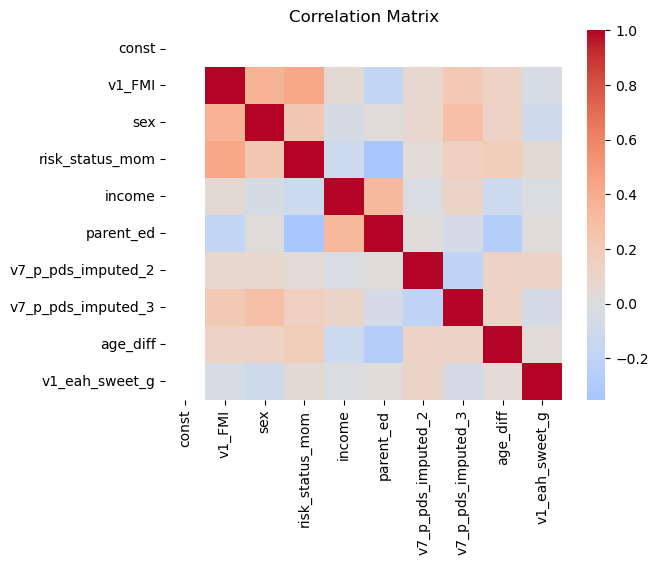

             Variable           VIF
0               const 16.2245820502
1              v1_FMI  1.4150239772
2                 sex  1.2976463618
3     risk_status_mom  1.3949131432
4              income  1.1953902788
5           parent_ed  1.3848858907
6  v7_p_pds_imputed_2  1.1152569289
7  v7_p_pds_imputed_3  1.2230826984
8            age_diff  1.1440662802
9      v1_eah_sweet_g  1.0391627435
CHECKING FOR HETEROSKEDASTICITY


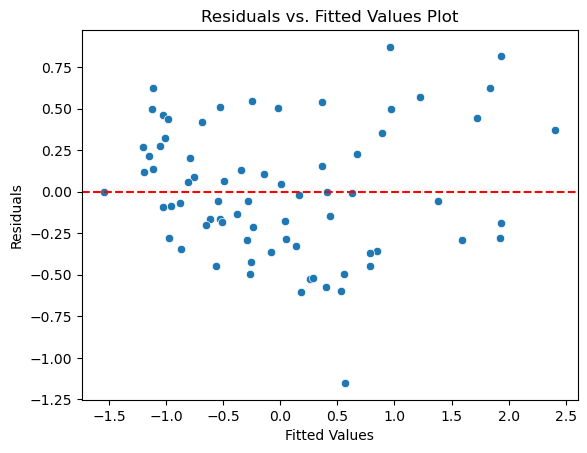

Breusch-Pagan test statistic: 15.838373498116205, p-value: 0.07033445197730841
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


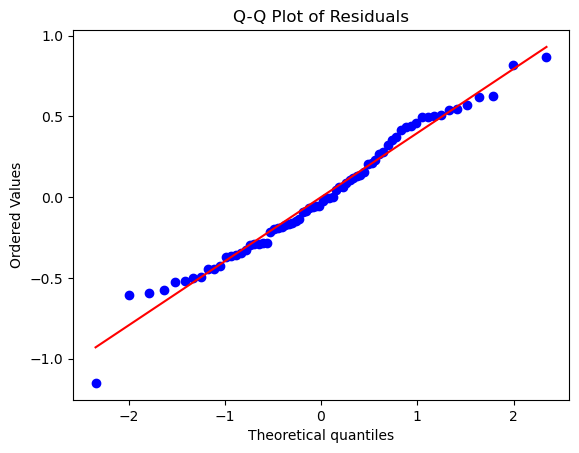

Shapiro-Wilk Test Results:
Statistic: 0.982687771320343
p-value: 0.425335168838501
Residuals are normally distributed (fail to reject null hypothesis)


In [295]:
# checking for model assumptions
# Calculate the residuals
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
residuals_EAHsweetgFMI= mod_EAHsweetgFMI.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetgFMI = durbin_watson(residuals_EAHsweetgFMI)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetgFMI)
if 0 < dw_statistic_EAHsweetgFMI < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetgFMI.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetgFMI.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetgFMI.values, i) for i in range(X_EAHsweetgFMI.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetgFMI.fittedvalues, y=residuals_EAHsweetgFMI)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetgFMI,  mod_EAHsweetgFMI.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")   
    
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetgFMI, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetgFMI, p_value_EAHsweetgFMI = shapiro(residuals_EAHsweetgFMI)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetgFMI)
print("p-value:", p_value_EAHsweetgFMI)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetgFMI > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.512263042793311
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


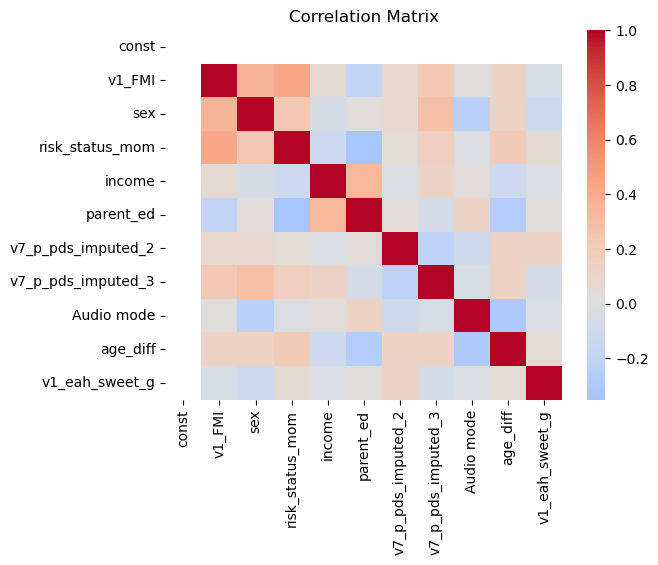

              Variable           VIF
0                const 16.6798379985
1               v1_FMI  1.4424807119
2                  sex  1.3988437048
3      risk_status_mom  1.4018355249
4               income  1.2006636972
5            parent_ed  1.4092489763
6   v7_p_pds_imputed_2  1.1194239375
7   v7_p_pds_imputed_3  1.2236285861
8           Audio mode  1.2078436661
9             age_diff  1.2275719348
10      v1_eah_sweet_g  1.0404311868
CHECKING FOR HETEROSKEDASTICITY


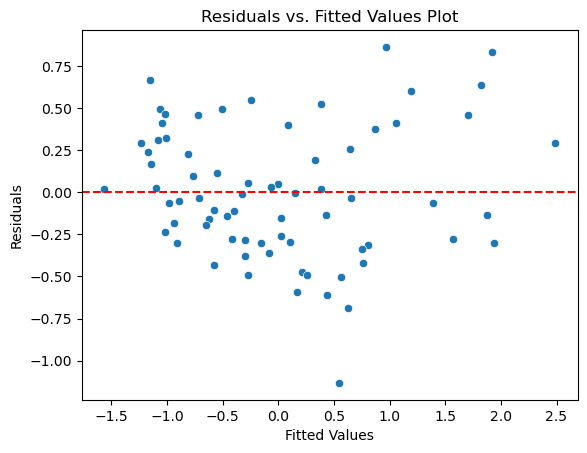

Breusch-Pagan test statistic: 15.070300824647735, p-value: 0.12951975885908587
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


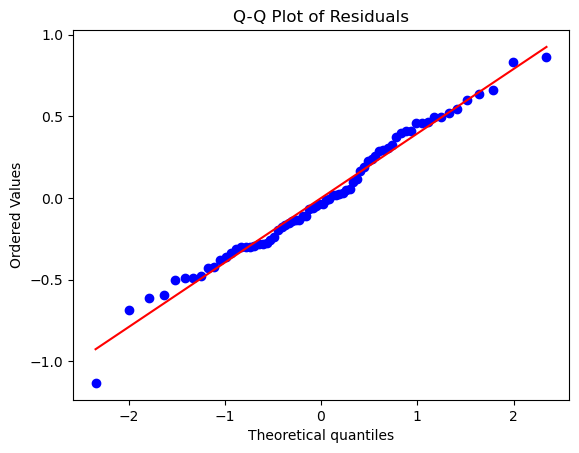

Shapiro-Wilk Test Results:
Statistic: 0.9851937294006348
p-value: 0.5605283379554749
Residuals are normally distributed (fail to reject null hypothesis)


In [296]:
# checking for model assumptions
# Calculate the residuals
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
residuals_EAHsweetgFMI_audio= mod_EAHsweetgFMI_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetgFMI_audio = durbin_watson(residuals_EAHsweetgFMI_audio)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetgFMI_audio)
if 0 < dw_statistic_EAHsweetgFMI_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetgFMI_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetgFMI_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetgFMI_audio.values, i) for i in range(X_EAHsweetgFMI_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetgFMI_audio.fittedvalues, y=residuals_EAHsweetgFMI_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetgFMI_audio,  mod_EAHsweetgFMI_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")   
    
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetgFMI_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetgFMI_audio, p_value_EAHsweetgFMI_audio = shapiro(residuals_EAHsweetgFMI_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetgFMI_audio)
print("p-value:", p_value_EAHsweetgFMI_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetgFMI_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.4925205202804464
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


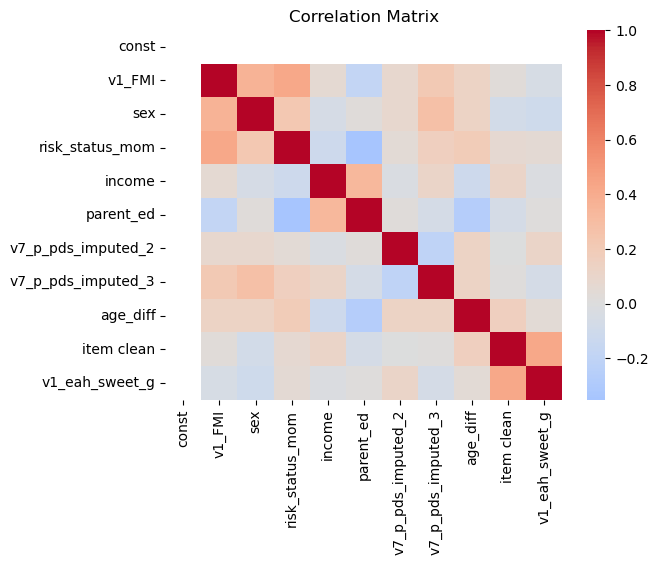

              Variable           VIF
0                const 16.2357138221
1               v1_FMI  1.4163964178
2                  sex  1.3012766547
3      risk_status_mom  1.3951626230
4               income  1.2297812027
5            parent_ed  1.3919331298
6   v7_p_pds_imputed_2  1.1201286871
7   v7_p_pds_imputed_3  1.2231111811
8             age_diff  1.1712136256
9           item clean  1.3054613856
10      v1_eah_sweet_g  1.2761774037
CHECKING FOR HETEROSKEDASTICITY


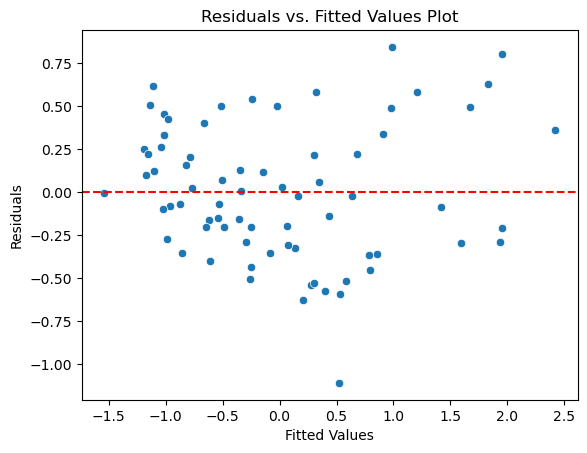

Breusch-Pagan test statistic: 16.47411386374939, p-value: 0.08684098870981187
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


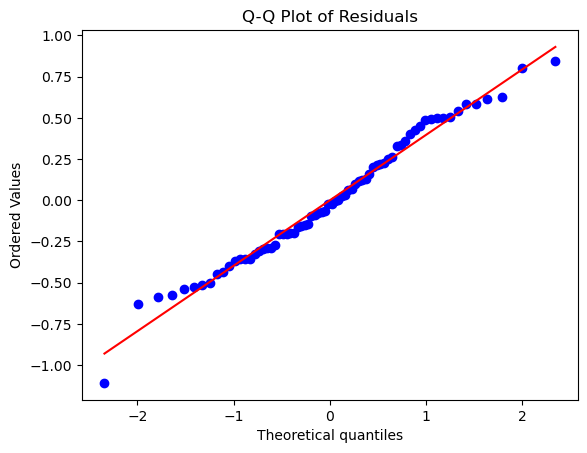

Shapiro-Wilk Test Results:
Statistic: 0.9835620522499084
p-value: 0.46994972229003906
Residuals are normally distributed (fail to reject null hypothesis)


In [297]:
# checking for model assumptions
# Calculate the residuals
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
residuals_EAHsweetgFMI_item = mod_EAHsweetgFMI_item.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetgFMI_item = durbin_watson(residuals_EAHsweetgFMI_item)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetgFMI_item)
if 0 < dw_statistic_EAHsweetgFMI_item < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetgFMI_item.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetgFMI_item.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetgFMI_item.values, i) for i in range(X_EAHsweetgFMI_item.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetgFMI_item.fittedvalues, y=residuals_EAHsweetgFMI_item)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetgFMI_item,  mod_EAHsweetgFMI_item.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")   
    
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetgFMI_item, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetgFMI_item, p_value_EAHsweetgFMI_item = shapiro(residuals_EAHsweetgFMI_item)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetgFMI_item)
print("p-value:", p_value_EAHsweetgFMI_item)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetgFMI_item > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### Model : EAH savory (gram) at baseline (V1) vs V7 follow-up adiposity FMI (v7)
#### covariates : baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1,  main predictor: baseline EAH savory intake (gram)

In [298]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavgFMI = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','v1_eah_sav_g']]
y_EAHsavgFMI = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsavgFMI = sm.add_constant(X_EAHsavgFMI)

# Fit a linear regression model using ols
mod_EAHsavgFMI= sm.OLS(y_EAHsavgFMI, X_EAHsavgFMI).fit()

# Get summary of the regression model
print(mod_EAHsavgFMI.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.808
Method:                 Least Squares   F-statistic:                     34.17
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           9.06e-21
Time:                        15:37:07   Log-Likelihood:                -37.900
No. Observations:                  72   AIC:                             95.80
Df Residuals:                      62   BIC:                             118.6
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2868      0

audio mode added

In [299]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavgFMI_audio = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','Audio mode','v1_eah_sav_g']]
y_EAHsavgFMI_audio = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsavgFMI_audio = sm.add_constant(X_EAHsavgFMI_audio)

# Fit a linear regression model using ols
mod_EAHsavgFMI_audio= sm.OLS(y_EAHsavgFMI_audio, X_EAHsavgFMI_audio).fit()

# Get summary of the regression model
print(mod_EAHsavgFMI_audio.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.834
Model:                            OLS   Adj. R-squared:                  0.806
Method:                 Least Squares   F-statistic:                     30.58
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           4.20e-20
Time:                        15:37:07   Log-Likelihood:                -37.577
No. Observations:                  72   AIC:                             97.15
Df Residuals:                      61   BIC:                             122.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2616      0

item cleaner added

In [300]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavgFMI_item = df_linear_reg[['v1_FMI','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','item clean','v1_eah_sav_g']]
y_EAHsavgFMI_item = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsavgFMI_item = sm.add_constant(X_EAHsavgFMI_item)

# Fit a linear regression model using ols
mod_EAHsavgFMI_item = sm.OLS(y_EAHsavgFMI_item, X_EAHsavgFMI_item).fit()

# Get summary of the regression model
print(mod_EAHsavgFMI_item.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.833
Model:                            OLS   Adj. R-squared:                  0.806
Method:                 Least Squares   F-statistic:                     30.49
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           4.55e-20
Time:                        15:37:07   Log-Likelihood:                -37.672
No. Observations:                  72   AIC:                             97.34
Df Residuals:                      61   BIC:                             122.4
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2859      0

assumption check for models

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.6239152070711014
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


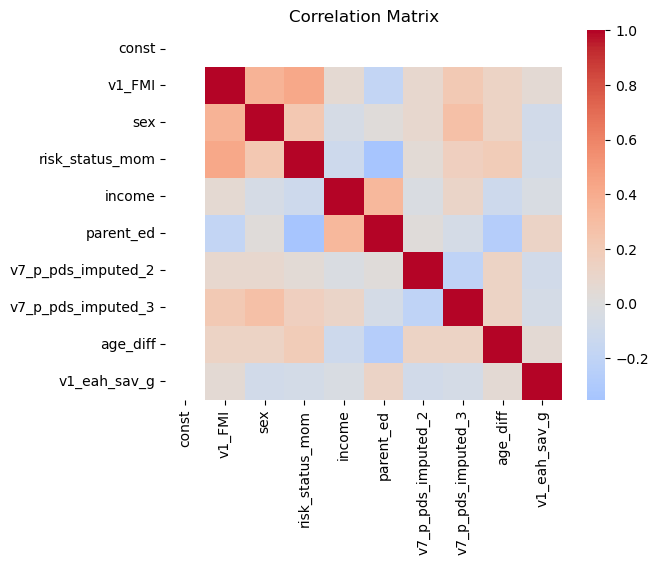

             Variable           VIF
0               const 16.2548881559
1              v1_FMI  1.4517320831
2                 sex  1.3048991207
3     risk_status_mom  1.3880869848
4              income  1.2067570560
5           parent_ed  1.4233891181
6  v7_p_pds_imputed_2  1.1214817759
7  v7_p_pds_imputed_3  1.2285618736
8            age_diff  1.1594609366
9        v1_eah_sav_g  1.0857962909
CHECKING FOR HETEROSKEDASTICITY


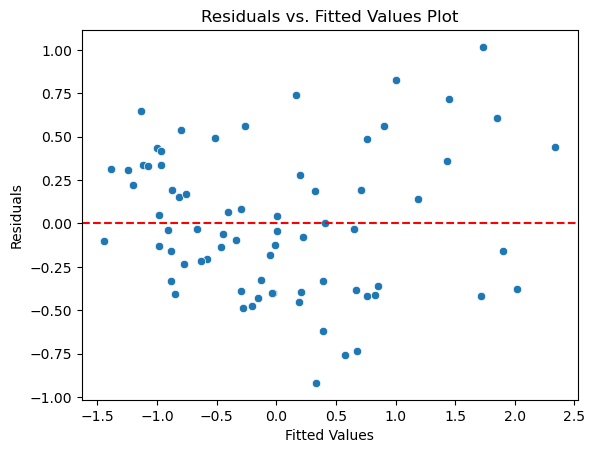

Breusch-Pagan test statistic: 16.313616185456926, p-value: 0.06061434594361091
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


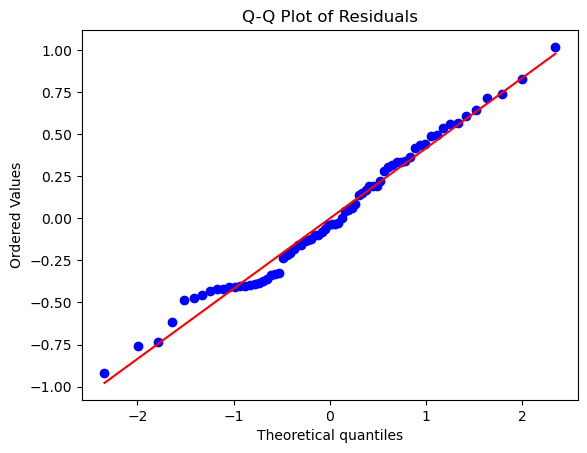

Shapiro-Wilk Test Results:
Statistic: 0.982327938079834
p-value: 0.4078528881072998
Residuals are normally distributed (fail to reject null hypothesis)


In [301]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsavgFMI= mod_EAHsavgFMI.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavgFMI = durbin_watson(residuals_EAHsavgFMI)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavgFMI)
if 0 < dw_statistic_EAHsavgFMI < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavgFMI.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavgFMI.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavgFMI.values, i) for i in range(X_EAHsavgFMI.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavgFMI.fittedvalues, y=residuals_EAHsavgFMI)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsavgFMI,  mod_EAHsavgFMI.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")  

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavgFMI, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavgFMI, p_value_EAHsavgFMI = shapiro(residuals_EAHsavgFMI)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavgFMI)
print("p-value:", p_value_EAHsavgFMI)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level 
if p_value_EAHsavgFMI > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.6338210993019573
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


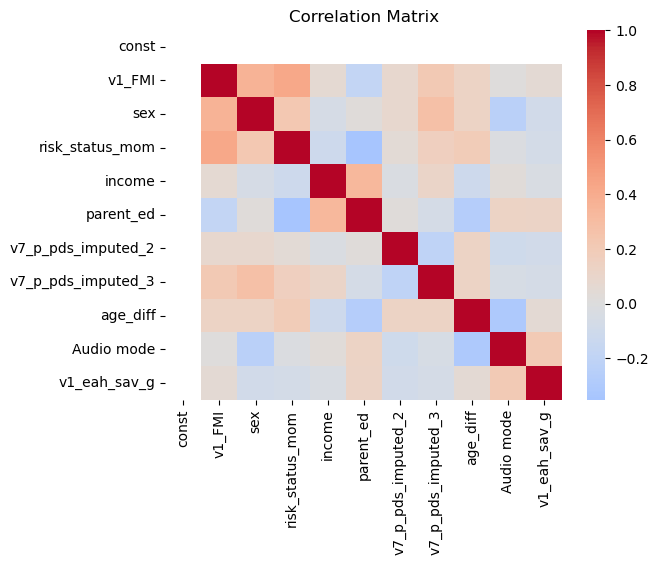

              Variable           VIF
0                const 16.6785112926
1               v1_FMI  1.4687287255
2                  sex  1.3891820970
3      risk_status_mom  1.3973578991
4               income  1.2093311506
5            parent_ed  1.4364399431
6   v7_p_pds_imputed_2  1.1232739808
7   v7_p_pds_imputed_3  1.2301963895
8             age_diff  1.2646992178
9           Audio mode  1.2566284447
10        v1_eah_sav_g  1.1310304763
CHECKING FOR HETEROSKEDASTICITY


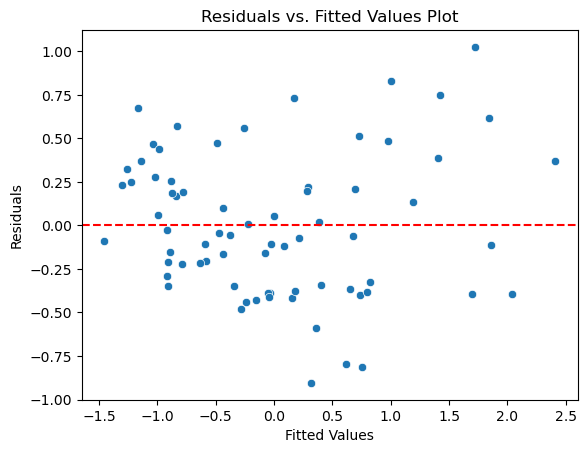

Breusch-Pagan test statistic: 15.821019681394356, p-value: 0.1048718274510932
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


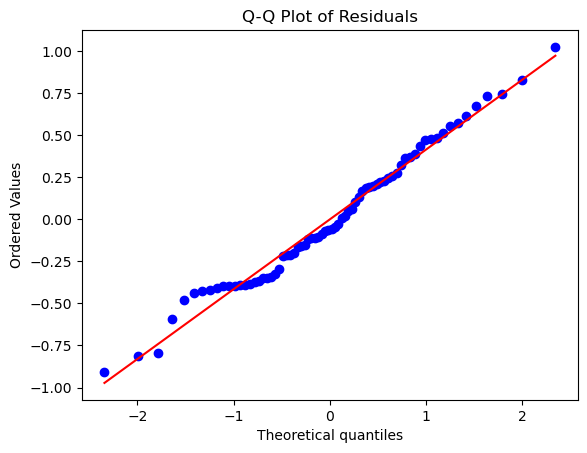

Shapiro-Wilk Test Results:
Statistic: 0.9811450839042664
p-value: 0.3541318476200104
Residuals are normally distributed (fail to reject null hypothesis)


In [302]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsavgFMI_audio= mod_EAHsavgFMI_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavgFMI_audio = durbin_watson(residuals_EAHsavgFMI_audio)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavgFMI_audio)
if 0 < dw_statistic_EAHsavgFMI_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavgFMI_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavgFMI_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavgFMI_audio.values, i) for i in range(X_EAHsavgFMI_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavgFMI_audio.fittedvalues, y=residuals_EAHsavgFMI_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsavgFMI_audio,  mod_EAHsavgFMI_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")  

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavgFMI_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavgFMI_audio, p_value_EAHsavgFMI_audio = shapiro(residuals_EAHsavgFMI_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavgFMI_audio)
print("p-value:", p_value_EAHsavgFMI_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level 
if p_value_EAHsavgFMI_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.6303608794103515
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


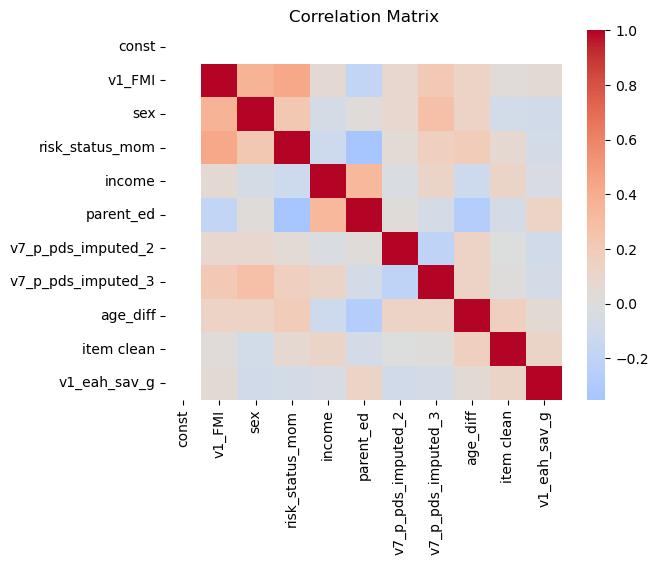

              Variable           VIF
0                const 16.2557098681
1               v1_FMI  1.4518817471
2                  sex  1.3127877152
3      risk_status_mom  1.3932807317
4               income  1.2358261736
5            parent_ed  1.4284717394
6   v7_p_pds_imputed_2  1.1214817988
7   v7_p_pds_imputed_3  1.2285898129
8             age_diff  1.1841733073
9           item clean  1.0785454597
10        v1_eah_sav_g  1.1016667988
CHECKING FOR HETEROSKEDASTICITY


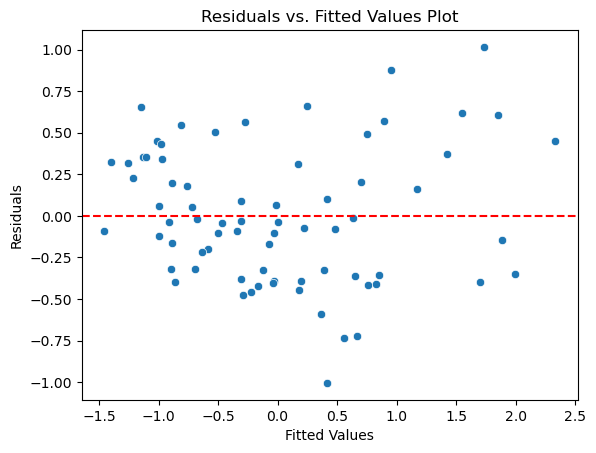

Breusch-Pagan test statistic: 16.392272597927583, p-value: 0.08894032774026737
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


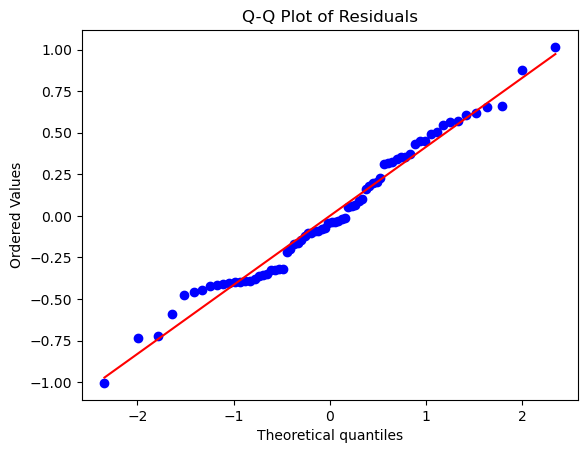

Shapiro-Wilk Test Results:
Statistic: 0.9797565937042236
p-value: 0.2984180450439453
Residuals are normally distributed (fail to reject null hypothesis)


In [303]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsavgFMI_item = mod_EAHsavgFMI_item.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavgFMI_item = durbin_watson(residuals_EAHsavgFMI_item)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavgFMI_item)
if 0 < dw_statistic_EAHsavgFMI_item < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavgFMI_item.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavgFMI_item.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavgFMI_item.values, i) for i in range(X_EAHsavgFMI_item.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavgFMI_item.fittedvalues, y=residuals_EAHsavgFMI_item)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsavgFMI_item,  mod_EAHsavgFMI_item.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")  

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavgFMI_item, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavgFMI_item, p_value_EAHsavgFMI_item = shapiro(residuals_EAHsavgFMI_item)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavgFMI_item)
print("p-value:", p_value_EAHsavgFMI_item)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level 
if p_value_EAHsavgFMI_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

## Regression models: Intake (gram) at baseline (v1) vs follow-up (v7) weight status (BMIz)

### Model : Meal (gram) at baseline (V1) vs V7 follow-up weight status BMIz (v7)
#### covariates : baseline BMIz, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1,  main predictor: baseline meal intake (gram)

In [304]:
# Select specific columns as predictors (X) and response (y)
X_mealgBMIz = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff','v1_meal_g']]
y_mealgBMIz = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_mealgBMIz= sm.add_constant(X_mealgBMIz)

# Fit a linear regression model using ols
mod_mealgBMIz= sm.OLS(y_mealgBMIz, X_mealgBMIz).fit()

# Get summary of the regression model
print(mod_mealgBMIz.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.854
Model:                            OLS   Adj. R-squared:                  0.833
Method:                 Least Squares   F-statistic:                     40.42
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.23e-22
Time:                        15:37:08   Log-Likelihood:                -18.909
No. Observations:                  72   AIC:                             57.82
Df Residuals:                      62   BIC:                             80.59
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4204      0

audio mode added

In [305]:
# Select specific columns as predictors (X) and response (y)
X_mealgBMIz_audio = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','Audio mode','age_diff','v1_meal_g']]
y_mealgBMIz_audio = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_mealgBMIz_audio= sm.add_constant(X_mealgBMIz_audio)

# Fit a linear regression model using ols
mod_mealgBMIz_audio= sm.OLS(y_mealgBMIz_audio, X_mealgBMIz_audio).fit()

# Get summary of the regression model
print(mod_mealgBMIz_audio.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.864
Model:                            OLS   Adj. R-squared:                  0.842
Method:                 Least Squares   F-statistic:                     38.84
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           9.88e-23
Time:                        15:37:08   Log-Likelihood:                -16.379
No. Observations:                  72   AIC:                             54.76
Df Residuals:                      61   BIC:                             79.80
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3739      0

assumption check for models

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.900568745348374
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


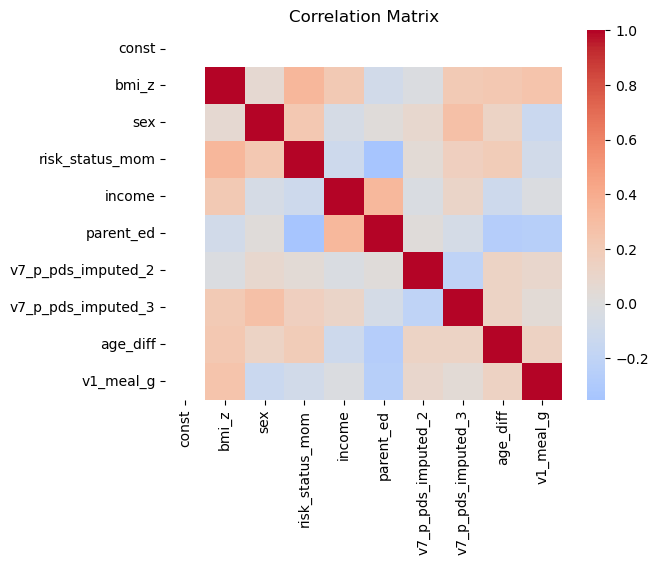

             Variable           VIF
0               const 18.5228731826
1               bmi_z  1.4316256099
2                 sex  1.1942499740
3     risk_status_mom  1.4938310601
4              income  1.2533415955
5           parent_ed  1.4860785798
6  v7_p_pds_imputed_2  1.1216974240
7  v7_p_pds_imputed_3  1.2346286323
8            age_diff  1.1834370073
9           v1_meal_g  1.2925389214
CHECKING FOR HETEROSKEDASTICITY


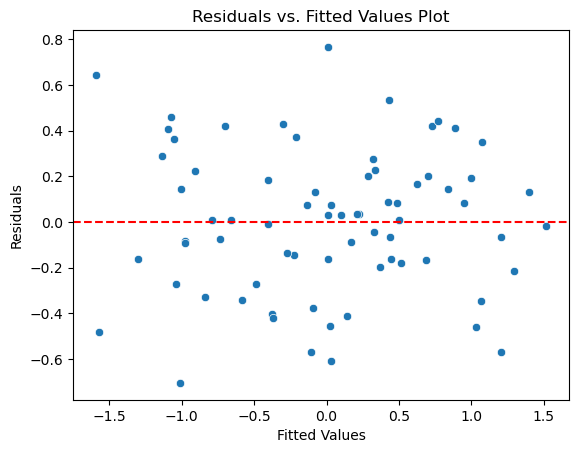

Breusch-Pagan test statistic: 13.345936787141307, p-value: 0.1475675126112467
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


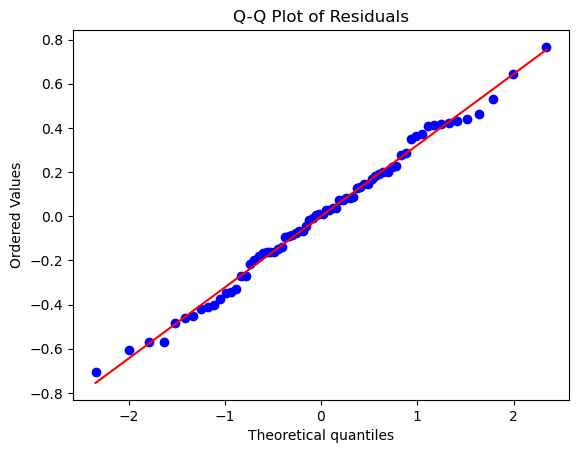

Shapiro-Wilk Test Results:
Statistic: 0.9913949966430664
p-value: 0.9089605212211609
Residuals are normally distributed (fail to reject null hypothesis)


In [306]:
# checking for model assumptions
# Calculate the residuals
residuals_mealgBMIz= mod_mealgBMIz.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_mealgBMIz = durbin_watson(residuals_mealgBMIz)
print("Durbin-Watson Statistic:", dw_statistic_mealgBMIz)
if 0 < dw_statistic_mealgBMIz < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_mealgBMIz.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_mealgBMIz.columns
vif_data["VIF"] = [variance_inflation_factor(X_mealgBMIz.values, i) for i in range(X_mealgBMIz.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_mealgBMIz.fittedvalues, y=residuals_mealgBMIz)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_mealgBMIz,  mod_mealgBMIz.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")  
      
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_mealgBMIz, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_mealgBMIz, p_value_mealgBMIz = shapiro(residuals_mealgBMIz)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_mealgBMIz)
print("p-value:", p_value_mealgBMIz)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_mealgBMIz > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 2.0116545758691475
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


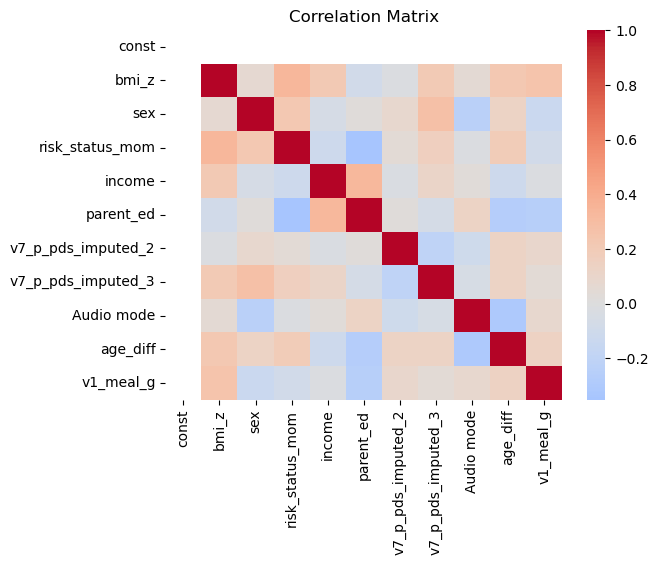

              Variable           VIF
0                const 18.8439409817
1                bmi_z  1.4407838617
2                  sex  1.2558446374
3      risk_status_mom  1.5109764905
4               income  1.2596953584
5            parent_ed  1.5171230964
6   v7_p_pds_imputed_2  1.1268553782
7   v7_p_pds_imputed_3  1.2348073813
8           Audio mode  1.2171355886
9             age_diff  1.2868925100
10           v1_meal_g  1.3103350195
CHECKING FOR HETEROSKEDASTICITY


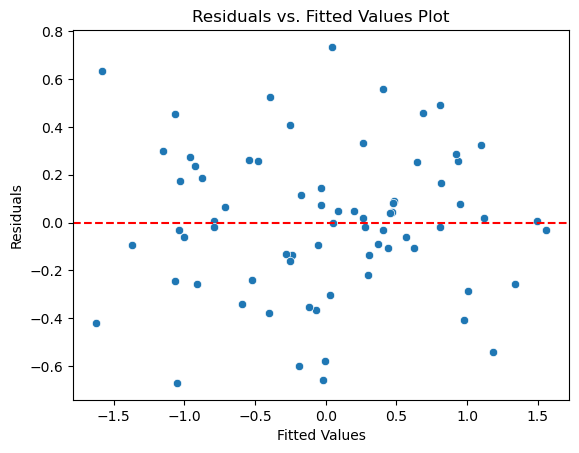

Breusch-Pagan test statistic: 15.088948472522725, p-value: 0.12885245088456343
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


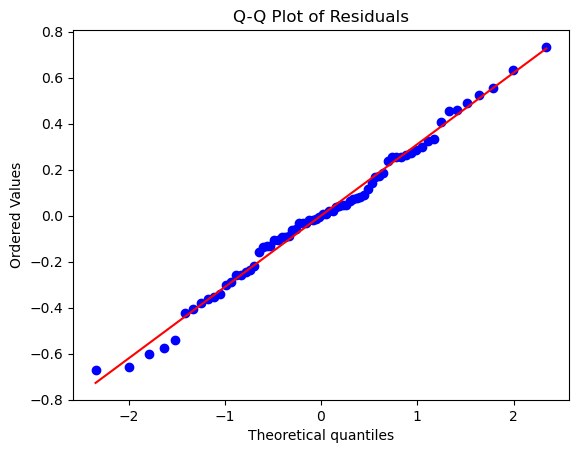

Shapiro-Wilk Test Results:
Statistic: 0.989327073097229
p-value: 0.8065614104270935
Residuals are normally distributed (fail to reject null hypothesis)


In [307]:
# checking for model assumptions
# Calculate the residuals
residuals_mealgBMIz_audio= mod_mealgBMIz_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_mealgBMIz_audio = durbin_watson(residuals_mealgBMIz_audio)
print("Durbin-Watson Statistic:", dw_statistic_mealgBMIz_audio)
if 0 < dw_statistic_mealgBMIz_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_mealgBMIz_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_mealgBMIz_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_mealgBMIz_audio.values, i) for i in range(X_mealgBMIz_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_mealgBMIz_audio.fittedvalues, y=residuals_mealgBMIz_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_mealgBMIz_audio,  mod_mealgBMIz_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")  
      
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_mealgBMIz_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_mealgBMIz_audio, p_value_mealgBMIz_audio = shapiro(residuals_mealgBMIz_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_mealgBMIz_audio)
print("p-value:", p_value_mealgBMIz_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_mealgBMIz_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### Model : EAH (gram) at baseline (V1) vs V7 follow-up weight status BMIz (v7)
#### covariates : baseline BMIz, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1,  main predictor: baseline EAH intake (gram)

In [308]:
# Select specific columns as predictors (X) and response (y)
X_EAHgBMIz = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff', 'v1_eah_g']]
y_EAHgBMIz = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHgBMIz= sm.add_constant(X_EAHgBMIz)

# Fit a linear regression model using ols
mod_EAHgBMIz= sm.OLS(y_EAHgBMIz, X_EAHgBMIz).fit()

# Get summary of the regression model
print(mod_EAHgBMIz.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.858
Model:                            OLS   Adj. R-squared:                  0.837
Method:                 Least Squares   F-statistic:                     41.56
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           5.94e-23
Time:                        15:37:09   Log-Likelihood:                -18.053
No. Observations:                  72   AIC:                             56.11
Df Residuals:                      62   BIC:                             78.87
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4681      0

audio mode added

In [309]:
# Select specific columns as predictors (X) and response (y)
X_EAHgBMIz_audio = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'Audio mode', 'age_diff', 'v1_eah_g']]
y_EAHgBMIz_audio = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHgBMIz_audio= sm.add_constant(X_EAHgBMIz_audio)

# Fit a linear regression model using ols
mod_EAHgBMIz_audio= sm.OLS(y_EAHgBMIz_audio, X_EAHgBMIz_audio).fit()

# Get summary of the regression model
print(mod_EAHgBMIz_audio.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.849
Method:                 Least Squares   F-statistic:                     40.90
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           2.58e-23
Time:                        15:37:09   Log-Likelihood:                -14.765
No. Observations:                  72   AIC:                             51.53
Df Residuals:                      61   BIC:                             76.57
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4025      0

item clean added

In [310]:
# Select specific columns as predictors (X) and response (y)
X_EAHgBMIz_item = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff', 'item clean', 'v1_eah_g']]
y_EAHgBMIz_item = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHgBMIz_item = sm.add_constant(X_EAHgBMIz_item)

# Fit a linear regression model using ols
mod_EAHgBMIz_item = sm.OLS(y_EAHgBMIz_item, X_EAHgBMIz_item).fit()

# Get summary of the regression model
print(mod_EAHgBMIz_item.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.858
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     36.80
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           3.95e-22
Time:                        15:37:09   Log-Likelihood:                -18.050
No. Observations:                  72   AIC:                             58.10
Df Residuals:                      61   BIC:                             83.14
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4680      0

assumption check for models

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.8425057882233173
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


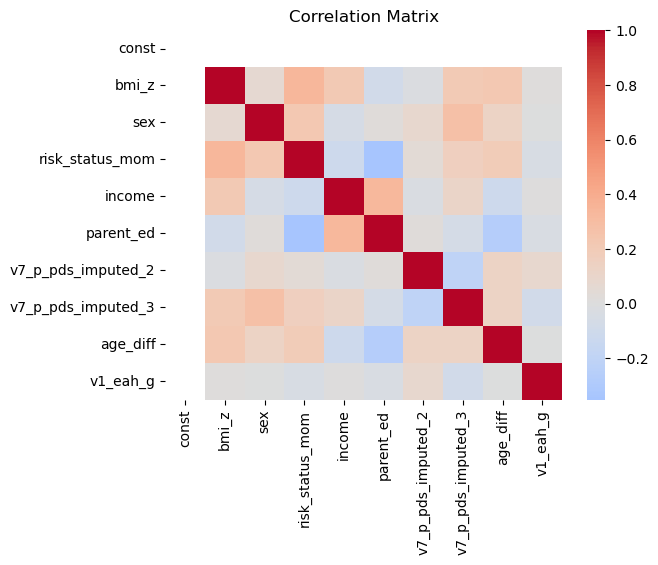

             Variable           VIF
0               const 17.0497338099
1               bmi_z  1.2921547365
2                 sex  1.1784846271
3     risk_status_mom  1.3723085190
4              income  1.2525240186
5           parent_ed  1.3647122661
6  v7_p_pds_imputed_2  1.1027029097
7  v7_p_pds_imputed_3  1.2368037530
8            age_diff  1.1830407101
9            v1_eah_g  1.0193617320
CHECKING FOR HETEROSKEDASTICITY


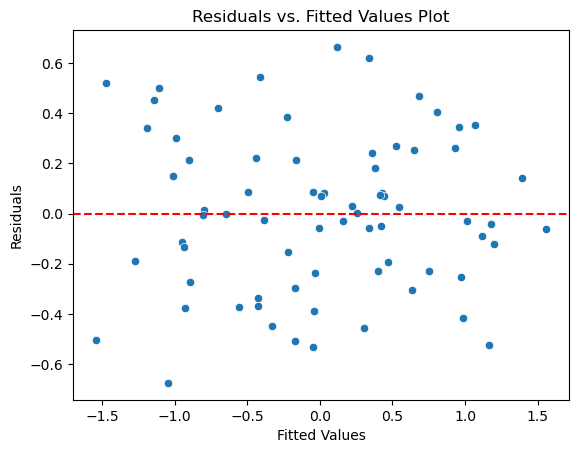

Breusch-Pagan test statistic: 11.316993411938526, p-value: 0.25460487013546895
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


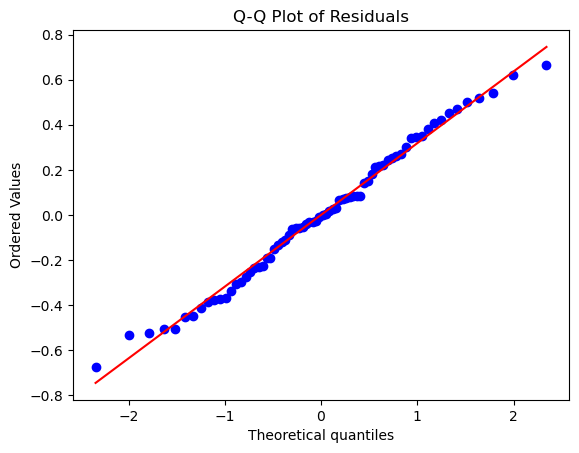

Shapiro-Wilk Test Results:
Statistic: 0.9865458011627197
p-value: 0.6409077048301697
Residuals are normally distributed (fail to reject null hypothesis)


In [311]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHgBMIz= mod_EAHgBMIz.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHgBMIz = durbin_watson(residuals_EAHgBMIz)
print("Durbin-Watson Statistic:", dw_statistic_EAHgBMIz)
if 0 < dw_statistic_EAHgBMIz < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHgBMIz.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHgBMIz.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHgBMIz.values, i) for i in range(X_EAHgBMIz.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHgBMIz.fittedvalues, y=residuals_EAHgBMIz)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHgBMIz,  mod_EAHgBMIz.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")  
      
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHgBMIz, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHgBMIz, p_value_EAHgBMIz = shapiro(residuals_EAHgBMIz)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHgBMIz)
print("p-value:", p_value_EAHgBMIz)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHgBMIz > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.9379114830926483
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


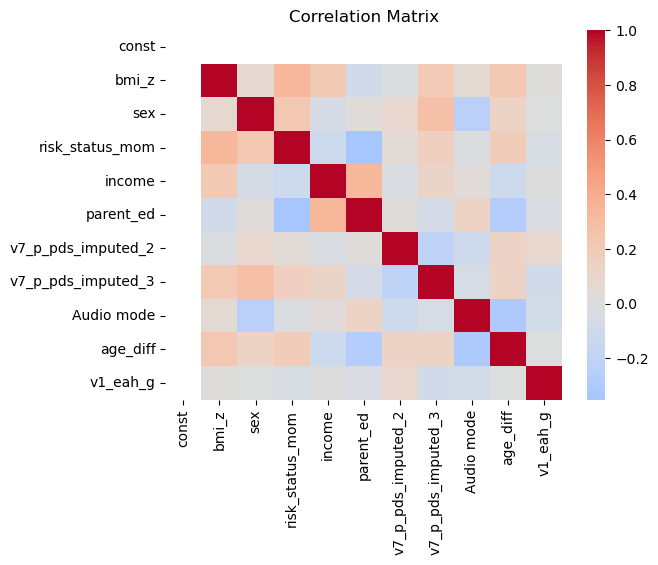

              Variable           VIF
0                const 17.5602826313
1                bmi_z  1.3125516044
2                  sex  1.2460115730
3      risk_status_mom  1.3792659202
4               income  1.2592383571
5            parent_ed  1.3812083896
6   v7_p_pds_imputed_2  1.1050577214
7   v7_p_pds_imputed_3  1.2370446139
8           Audio mode  1.2074768379
9             age_diff  1.2845414127
10            v1_eah_g  1.0251959730
CHECKING FOR HETEROSKEDASTICITY


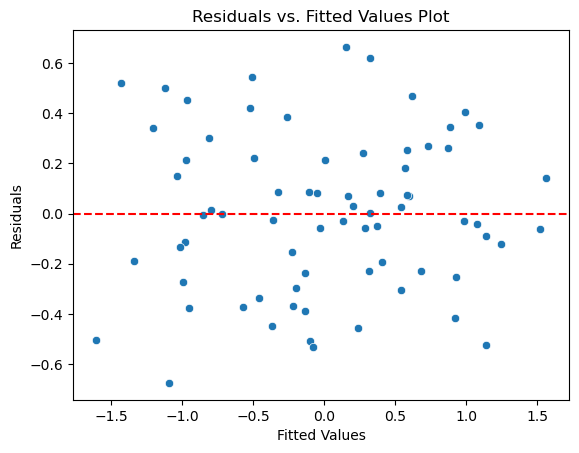

Breusch-Pagan test statistic: 13.44060532601883, p-value: 0.20006929804026216
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


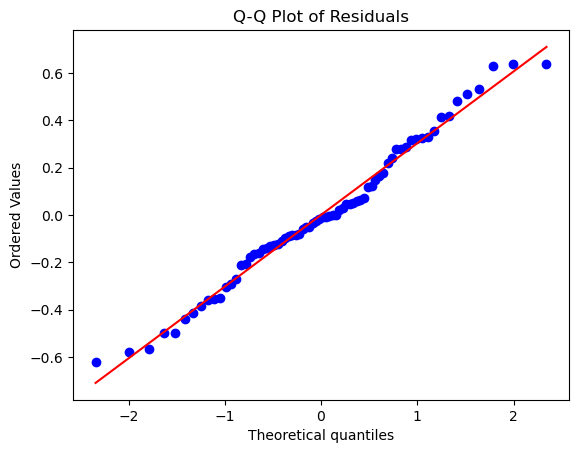

Shapiro-Wilk Test Results:
Statistic: 0.9821083545684814
p-value: 0.3974425196647644
Residuals are normally distributed (fail to reject null hypothesis)


In [312]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHgBMIz_audio= mod_EAHgBMIz_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHgBMIz_audio = durbin_watson(residuals_EAHgBMIz_audio)
print("Durbin-Watson Statistic:", dw_statistic_EAHgBMIz_audio)
if 0 < dw_statistic_EAHgBMIz_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHgBMIz_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHgBMIz_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHgBMIz_audio.values, i) for i in range(X_EAHgBMIz_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHgBMIz_audio.fittedvalues, y=residuals_EAHgBMIz)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHgBMIz_audio,  mod_EAHgBMIz_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")  
      
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHgBMIz_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHgBMIz_audio, p_value_EAHgBMIz_audio = shapiro(residuals_EAHgBMIz_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHgBMIz_audio)
print("p-value:", p_value_EAHgBMIz_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHgBMIz_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.8386344470871214
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


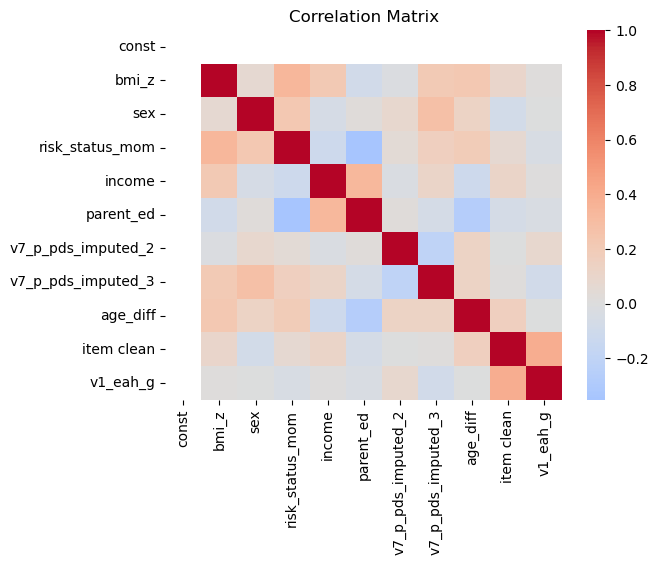

              Variable           VIF
0                const 17.0501413854
1                bmi_z  1.2921741790
2                  sex  1.1945344773
3      risk_status_mom  1.3821931999
4               income  1.2773258131
5            parent_ed  1.3650822262
6   v7_p_pds_imputed_2  1.1048810573
7   v7_p_pds_imputed_3  1.2373692193
8             age_diff  1.2206093195
9           item clean  1.2767667770
10            v1_eah_g  1.2242479018
CHECKING FOR HETEROSKEDASTICITY


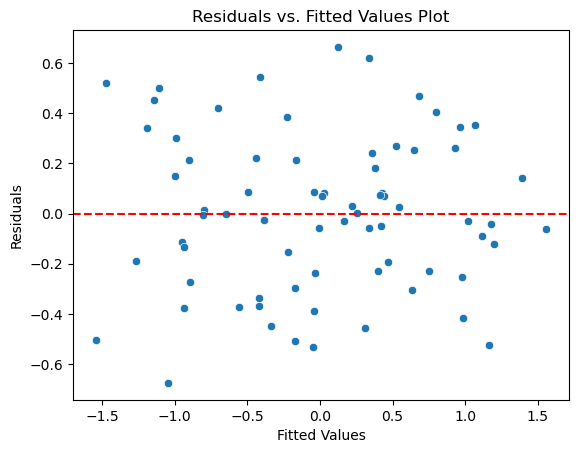

Breusch-Pagan test statistic: 11.877621333869937, p-value: 0.29333037097046827
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


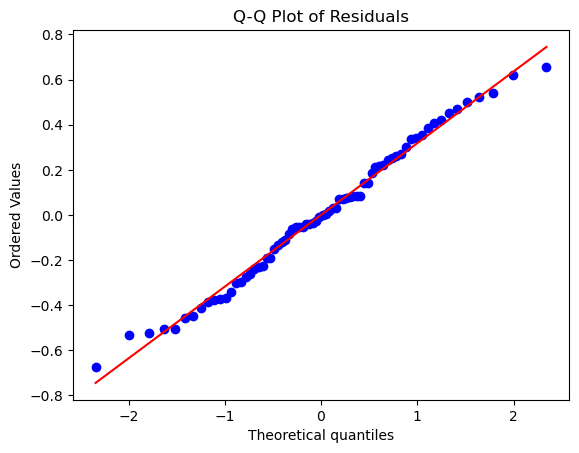

Shapiro-Wilk Test Results:
Statistic: 0.9860318899154663
p-value: 0.6099678874015808
Residuals are normally distributed (fail to reject null hypothesis)


In [313]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHgBMIz_item = mod_EAHgBMIz_item.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHgBMIz_item = durbin_watson(residuals_EAHgBMIz_item)
print("Durbin-Watson Statistic:", dw_statistic_EAHgBMIz_item)
if 0 < dw_statistic_EAHgBMIz_item < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHgBMIz_item.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHgBMIz_item.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHgBMIz_item.values, i) for i in range(X_EAHgBMIz_item.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHgBMIz_item.fittedvalues, y=residuals_EAHgBMIz)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHgBMIz_item,  mod_EAHgBMIz_item.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")  
      
# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHgBMIz_item, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHgBMIz_item, p_value_EAHgBMIz_item = shapiro(residuals_EAHgBMIz_item)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHgBMIz_item)
print("p-value:", p_value_EAHgBMIz_item)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHgBMIz_item > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### Model : EAH sweet (gram) at baseline (V1) vs V7 follow-up weight status BMIz (v7)
#### covariates :baseline BMIz, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1,  main predictor: baseline EAH sweet intake (gram)

In [314]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetgBMIz = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff', 'v1_eah_sweet_g']]
y_EAHsweetgBMIz = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHsweetgBMIz= sm.add_constant(X_EAHsweetgBMIz)

# Fit a linear regression model using ols
mod_EAHsweetgBMIz= sm.OLS(y_EAHsweetgBMIz, X_EAHsweetgBMIz).fit()

# Get summary of the regression model
print(mod_EAHsweetgBMIz.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.857
Model:                            OLS   Adj. R-squared:                  0.837
Method:                 Least Squares   F-statistic:                     41.44
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           6.39e-23
Time:                        15:37:10   Log-Likelihood:                -18.139
No. Observations:                  72   AIC:                             56.28
Df Residuals:                      62   BIC:                             79.05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4613      0

audio mode added

In [315]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetgBMIz_audio = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'Audio mode', 'age_diff', 'v1_eah_sweet_g']]
y_EAHsweetgBMIz_audio = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHsweetgBMIz_audio= sm.add_constant(X_EAHsweetgBMIz_audio)

# Fit a linear regression model using ols
mod_EAHsweetgBMIz_audio= sm.OLS(y_EAHsweetgBMIz_audio, X_EAHsweetgBMIz_audio).fit()

# Get summary of the regression model
print(mod_EAHsweetgBMIz_audio.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.848
Method:                 Least Squares   F-statistic:                     40.71
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           2.92e-23
Time:                        15:37:10   Log-Likelihood:                -14.913
No. Observations:                  72   AIC:                             51.83
Df Residuals:                      61   BIC:                             76.87
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3956      0

item cleaner added

In [316]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetgBMIz_item = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff','item clean','v1_eah_sweet_g']]
y_EAHsweetgBMIz_item = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHsweetgBMIz_item = sm.add_constant(X_EAHsweetgBMIz_item)

# Fit a linear regression model using ols
mod_EAHsweetgBMIz_item = sm.OLS(y_EAHsweetgBMIz_item, X_EAHsweetgBMIz_item).fit()

# Get summary of the regression model
print(mod_EAHsweetgBMIz_item.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.857
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     36.70
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           4.25e-22
Time:                        15:37:10   Log-Likelihood:                -18.138
No. Observations:                  72   AIC:                             58.28
Df Residuals:                      61   BIC:                             83.32
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4614      0

model assumption check 

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.7810894189887527
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


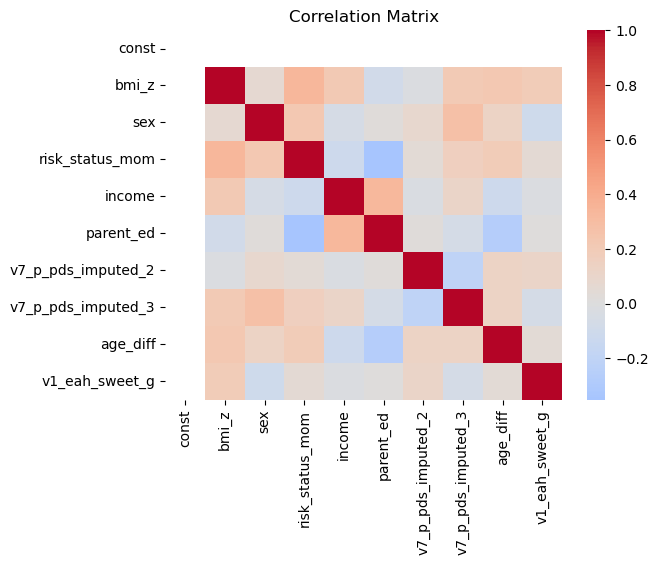

             Variable           VIF
0               const 17.0839529388
1               bmi_z  1.3471035478
2                 sex  1.1935115901
3     risk_status_mom  1.3675776888
4              income  1.2610377098
5           parent_ed  1.3655720863
6  v7_p_pds_imputed_2  1.1110755816
7  v7_p_pds_imputed_3  1.2314161649
8            age_diff  1.1829047073
9      v1_eah_sweet_g  1.0832060341
CHECKING FOR HETEROSKEDASTICITY


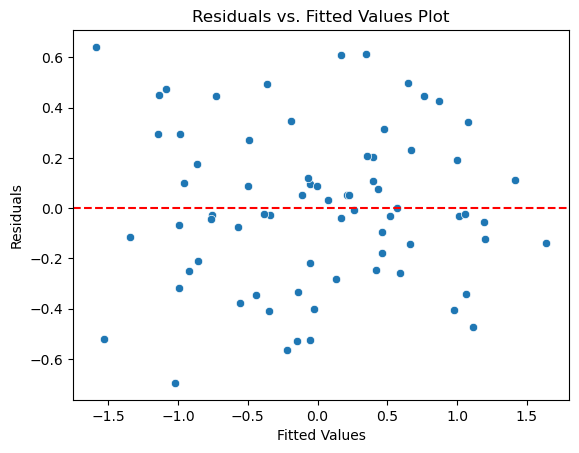

Breusch-Pagan test statistic: 14.829856823702325, p-value: 0.09571679767512437
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


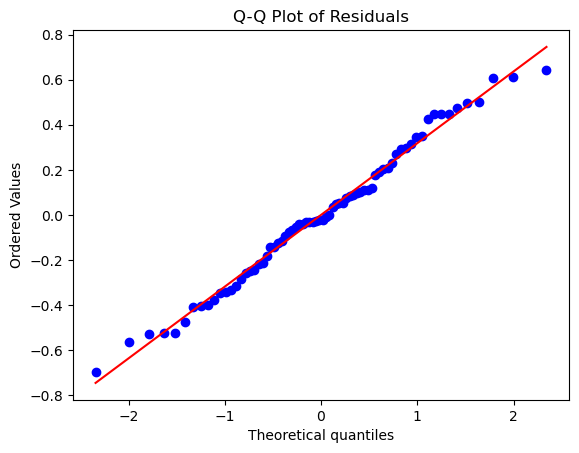

Shapiro-Wilk Test Results:
Statistic: 0.9854221343994141
p-value: 0.573843240737915
Residuals are normally distributed (fail to reject null hypothesis)


In [317]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsweetgBMIz= mod_EAHsweetgBMIz.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetgBMIz = durbin_watson(residuals_EAHsweetgBMIz)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetgBMIz)
if 0 < dw_statistic_EAHsweetgBMIz < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetgBMIz.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetgBMIz.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetgBMIz.values, i) for i in range(X_EAHsweetgBMIz.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetgBMIz.fittedvalues, y=residuals_EAHsweetgBMIz)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetgBMIz,  mod_EAHsweetgBMIz.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")  
      

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetgBMIz, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetgBMIz, p_value_EAHsweetgBMIz = shapiro(residuals_EAHsweetgBMIz)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetgBMIz)
print("p-value:", p_value_EAHsweetgBMIz)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetgBMIz > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.857604661379237
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


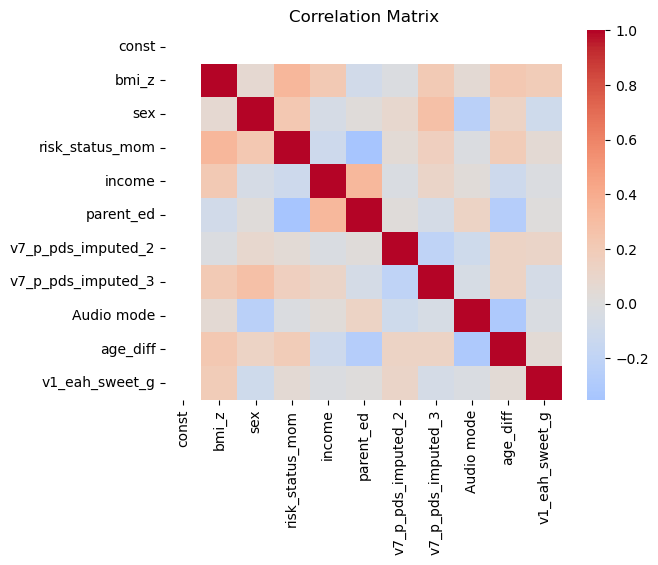

              Variable           VIF
0                const 17.6032611473
1                bmi_z  1.3712416810
2                  sex  1.2668476735
3      risk_status_mom  1.3756993669
4               income  1.2691793642
5            parent_ed  1.3849224810
6   v7_p_pds_imputed_2  1.1131834200
7   v7_p_pds_imputed_3  1.2317691082
8           Audio mode  1.2060839450
9             age_diff  1.2828542177
10      v1_eah_sweet_g  1.0881489921
CHECKING FOR HETEROSKEDASTICITY


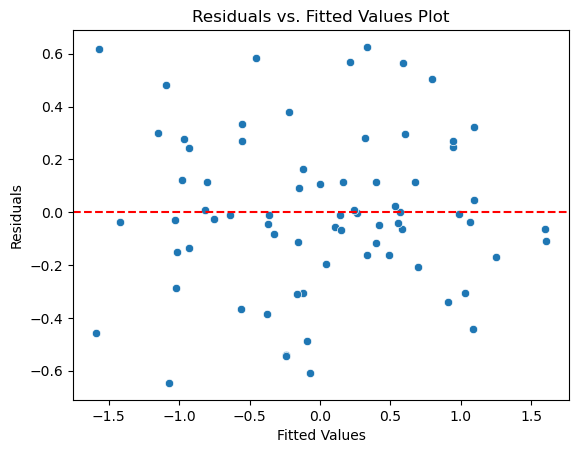

Breusch-Pagan test statistic: 15.90256122248337, p-value: 0.1024558772894296
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


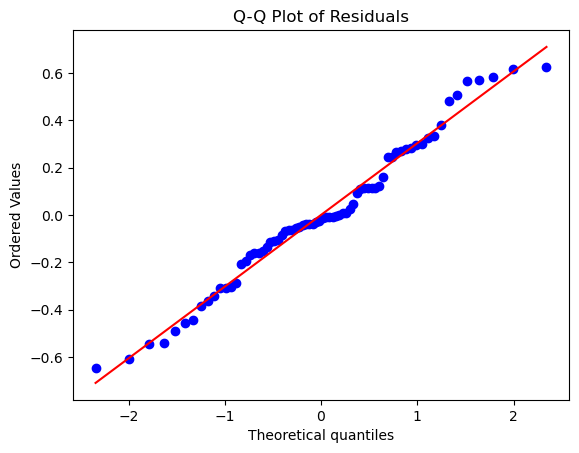

Shapiro-Wilk Test Results:
Statistic: 0.9771819114685059
p-value: 0.21484363079071045
Residuals are normally distributed (fail to reject null hypothesis)


In [318]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsweetgBMIz_audio= mod_EAHsweetgBMIz_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetgBMIz_audio = durbin_watson(residuals_EAHsweetgBMIz_audio)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetgBMIz_audio)
if 0 < dw_statistic_EAHsweetgBMIz_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetgBMIz_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetgBMIz_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetgBMIz_audio.values, i) for i in range(X_EAHsweetgBMIz_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetgBMIz_audio.fittedvalues, y=residuals_EAHsweetgBMIz_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetgBMIz_audio,  mod_EAHsweetgBMIz_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")  
      

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetgBMIz_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetgBMIz_audio, p_value_EAHsweetgBMIz_audio = shapiro(residuals_EAHsweetgBMIz_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetgBMIz_audio)
print("p-value:", p_value_EAHsweetgBMIz_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetgBMIz_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.7788899672966123
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


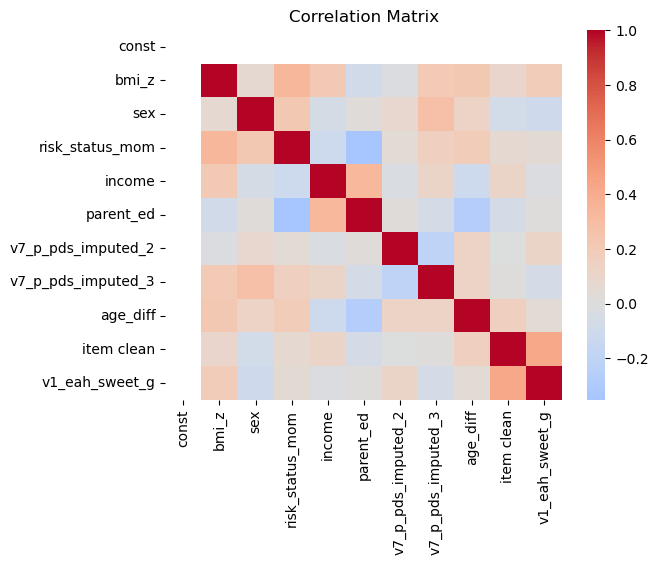

              Variable           VIF
0                const 17.0852128405
1                bmi_z  1.3569798451
2                  sex  1.1961840718
3      risk_status_mom  1.3710152219
4               income  1.3083325966
5            parent_ed  1.3737284737
6   v7_p_pds_imputed_2  1.1162458101
7   v7_p_pds_imputed_3  1.2314898060
8             age_diff  1.2160108404
9           item clean  1.3137581608
10      v1_eah_sweet_g  1.3386158620
CHECKING FOR HETEROSKEDASTICITY


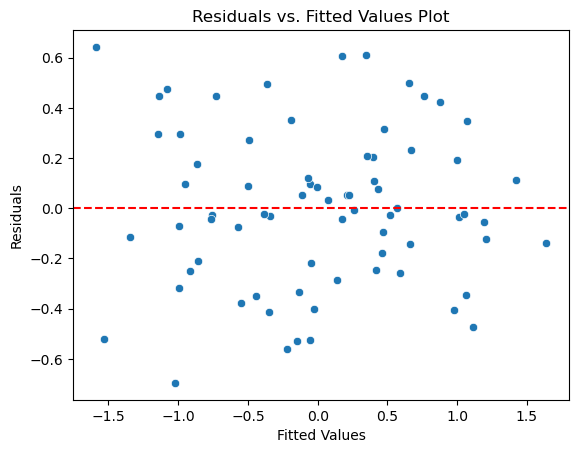

Breusch-Pagan test statistic: 15.134307177538766, p-value: 0.12724144345232374
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


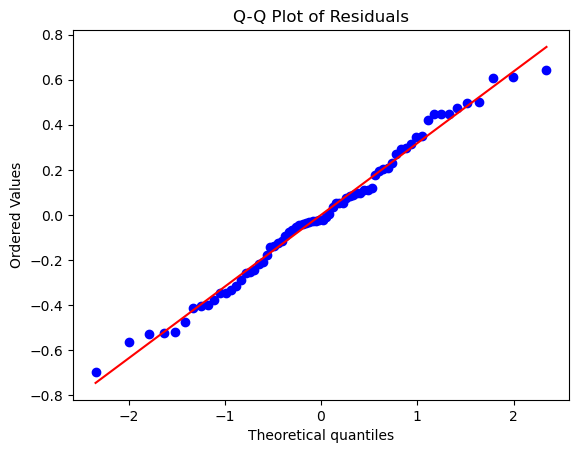

Shapiro-Wilk Test Results:
Statistic: 0.9855057597160339
p-value: 0.5787517428398132
Residuals are normally distributed (fail to reject null hypothesis)


In [319]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsweetgBMIz_item = mod_EAHsweetgBMIz_item.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetgBMIz_item = durbin_watson(residuals_EAHsweetgBMIz_item)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetgBMIz_item)
if 0 < dw_statistic_EAHsweetgBMIz_item < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetgBMIz_item.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetgBMIz_item.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetgBMIz_item.values, i) for i in range(X_EAHsweetgBMIz_item.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetgBMIz_item.fittedvalues, y=residuals_EAHsweetgBMIz_item)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetgBMIz_item,  mod_EAHsweetgBMIz_item.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)")  
      

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetgBMIz_item, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetgBMIz_item, p_value_EAHsweetgBMIz_item = shapiro(residuals_EAHsweetgBMIz_item)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetgBMIz_item)
print("p-value:", p_value_EAHsweetgBMIz_item)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetgBMIz_item > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### Model : EAH savory (gram) at baseline (V1) vs V7 follow-up weight status BMIz (v7)
#### covariates : baseline BMIz, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1,  main predictor: baseline EAH savory intake (gram)

In [320]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavgBMIz = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff', 'v1_eah_sav_g']]
y_EAHsavgBMIz = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHsavgBMIz= sm.add_constant(X_EAHsavgBMIz)

# Fit a linear regression model using ols
mod_EAHsavgBMIz= sm.OLS(y_EAHsavgBMIz, X_EAHsavgBMIz).fit()

# Get summary of the regression model
print(mod_EAHsavgBMIz.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.852
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     39.64
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           2.03e-22
Time:                        15:37:12   Log-Likelihood:                -19.505
No. Observations:                  72   AIC:                             59.01
Df Residuals:                      62   BIC:                             81.78
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4734      0

audio mode added

In [321]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavgBMIz_audio = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3',  'Audio mode', 'age_diff', 'v1_eah_sav_g']]
y_EAHsavgBMIz_audio = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHsavgBMIz_audio = sm.add_constant(X_EAHsavgBMIz_audio)

# Fit a linear regression model using ols
mod_EAHsavgBMIz_audio = sm.OLS(y_EAHsavgBMIz_audio, X_EAHsavgBMIz_audio).fit()

# Get summary of the regression model
print(mod_EAHsavgBMIz_audio.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.862
Model:                            OLS   Adj. R-squared:                  0.840
Method:                 Least Squares   F-statistic:                     38.26
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.46e-22
Time:                        15:37:12   Log-Likelihood:                -16.850
No. Observations:                  72   AIC:                             55.70
Df Residuals:                      61   BIC:                             80.74
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4138      0

item clean added

In [322]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavgBMIz_item = df_linear_reg[['bmi_z','sex', 'risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff', 'item clean','v1_eah_sav_g']]
y_EAHsavgBMIz_item = df_linear_reg['v7_bmi_z']

# Add a constant term to the predictors (intercept)
X_EAHsavgBMIz_item = sm.add_constant(X_EAHsavgBMIz_item)

# Fit a linear regression model using ols
mod_EAHsavgBMIz_item = sm.OLS(y_EAHsavgBMIz_item, X_EAHsavgBMIz_item).fit()

# Get summary of the regression model
print(mod_EAHsavgBMIz_item.summary())

                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.853
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     35.41
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.06e-21
Time:                        15:37:12   Log-Likelihood:                -19.236
No. Observations:                  72   AIC:                             60.47
Df Residuals:                      61   BIC:                             85.51
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4720      0

assumption check for models

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.9151164554485391
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


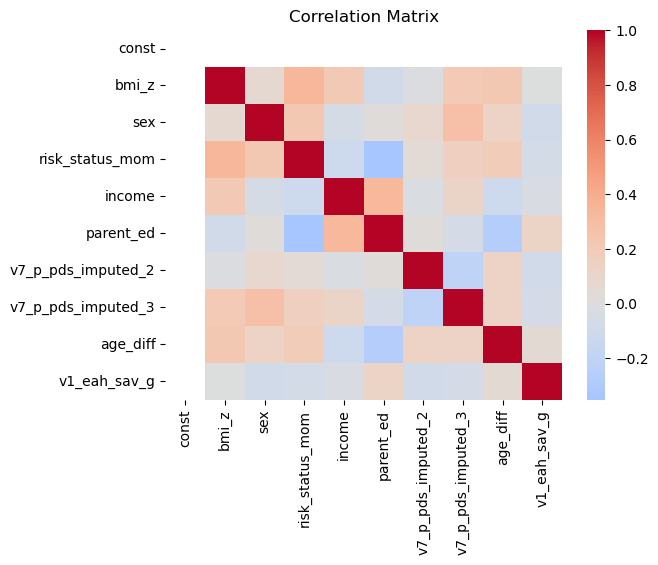

             Variable           VIF
0               const 17.0457246600
1               bmi_z  1.2909750496
2                 sex  1.1853671537
3     risk_status_mom  1.3676123057
4              income  1.2597595227
5           parent_ed  1.3925744577
6  v7_p_pds_imputed_2  1.1122442056
7  v7_p_pds_imputed_3  1.2328106664
8            age_diff  1.1987775957
9        v1_eah_sav_g  1.0572313910
CHECKING FOR HETEROSKEDASTICITY


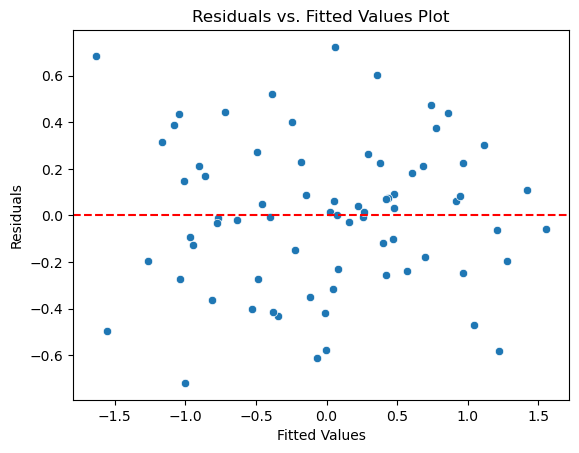

Breusch-Pagan test statistic: 13.378279957115321, p-value: 0.14622313413905186
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


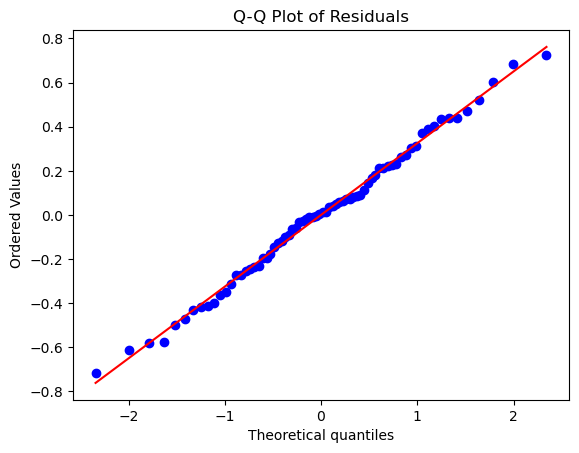

Shapiro-Wilk Test Results:
Statistic: 0.9920107126235962
p-value: 0.9326850771903992
Residuals are normally distributed (fail to reject null hypothesis)


In [323]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsavgBMIz= mod_EAHsavgBMIz.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavgBMIz = durbin_watson(residuals_EAHsavgBMIz)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavgBMIz)
if 0 < dw_statistic_EAHsavgBMIz< 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavgBMIz.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavgBMIz.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavgBMIz.values, i) for i in range(X_EAHsavgBMIz.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavgBMIz.fittedvalues, y=residuals_EAHsavgBMIz)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()


bp_test = het_breuschpagan(residuals_EAHsavgBMIz,  mod_EAHsavgBMIz.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)") 

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavgBMIz, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavgBMIz, p_value_EAHsavgBMIz = shapiro(residuals_EAHsavgBMIz)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavgBMIz)
print("p-value:", p_value_EAHsavgBMIz)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsavgBMIz > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.9969617295510926
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


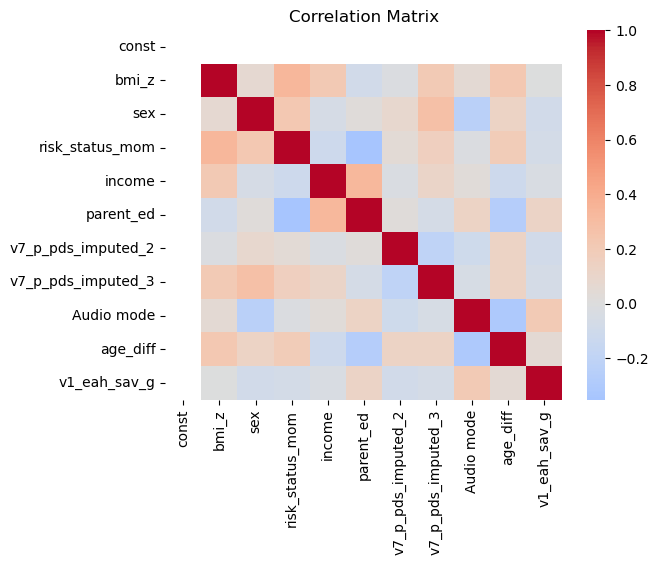

              Variable           VIF
0                const 17.5411173530
1                bmi_z  1.3092910374
2                  sex  1.2469501764
3      risk_status_mom  1.3767003739
4               income  1.2641093814
5            parent_ed  1.4018697469
6   v7_p_pds_imputed_2  1.1130536320
7   v7_p_pds_imputed_3  1.2341890572
8           Audio mode  1.2597086691
9             age_diff  1.3227833867
10        v1_eah_sav_g  1.1092767868
CHECKING FOR HETEROSKEDASTICITY


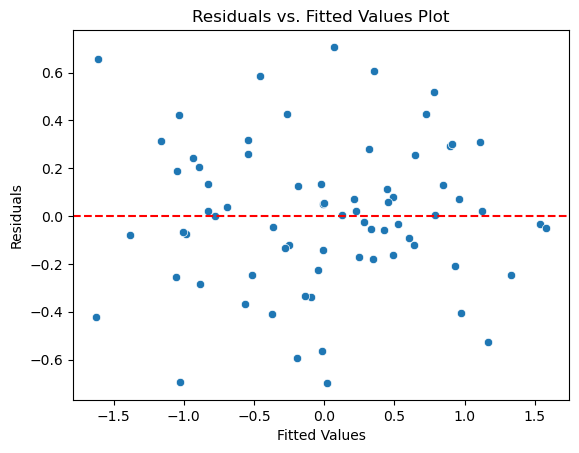

Breusch-Pagan test statistic: 15.28654190878876, p-value: 0.12195902922272944
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


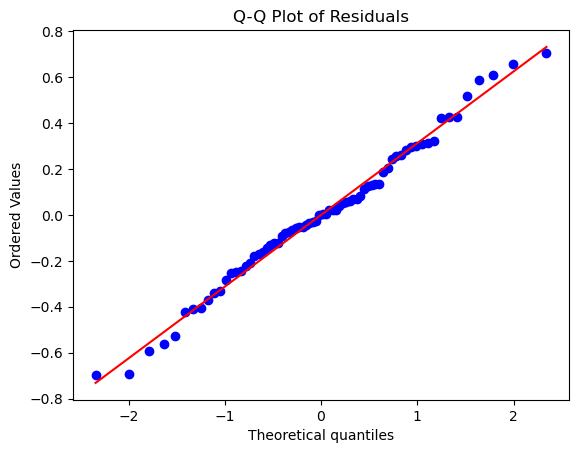

Shapiro-Wilk Test Results:
Statistic: 0.9880570769309998
p-value: 0.7325077056884766
Residuals are normally distributed (fail to reject null hypothesis)


In [324]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsavgBMIz_audio = mod_EAHsavgBMIz_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavgBMIz_audio = durbin_watson(residuals_EAHsavgBMIz_audio)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavgBMIz_audio)
if 0 < dw_statistic_EAHsavgBMIz_audio < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavgBMIz_audio.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavgBMIz_audio.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavgBMIz_audio.values, i) for i in range(X_EAHsavgBMIz_audio.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavgBMIz_audio.fittedvalues, y=residuals_EAHsavgBMIz_audio)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()


bp_test = het_breuschpagan(residuals_EAHsavgBMIz_audio,  mod_EAHsavgBMIz_audio.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)") 

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavgBMIz_audio, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavgBMIz_audio, p_value_EAHsavgBMIz_audio = shapiro(residuals_EAHsavgBMIz_audio)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavgBMIz_audio)
print("p-value:", p_value_EAHsavgBMIz_audio)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsavgBMIz_audio > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.9969617295510926
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


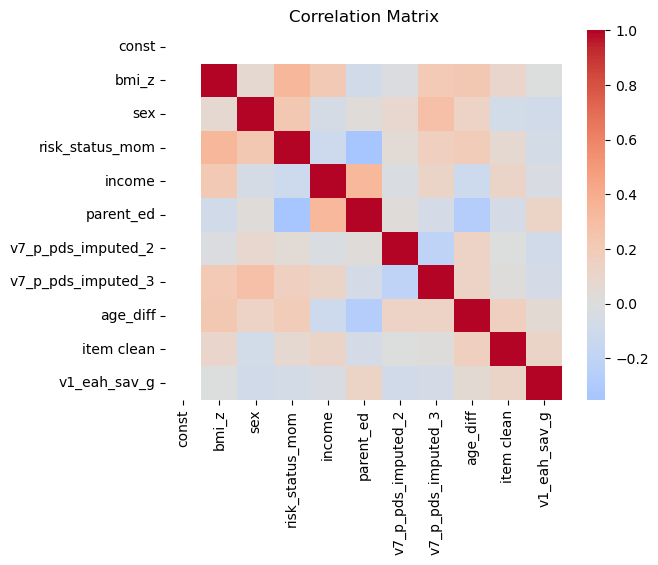

              Variable           VIF
0                const 17.0483458432
1                bmi_z  1.2911032571
2                  sex  1.1938219516
3      risk_status_mom  1.3717566060
4               income  1.2872106707
5            parent_ed  1.3973932868
6   v7_p_pds_imputed_2  1.1122450164
7   v7_p_pds_imputed_3  1.2328679252
8             age_diff  1.2229645402
9           item clean  1.0785413802
10        v1_eah_sav_g  1.0725963908
CHECKING FOR HETEROSKEDASTICITY


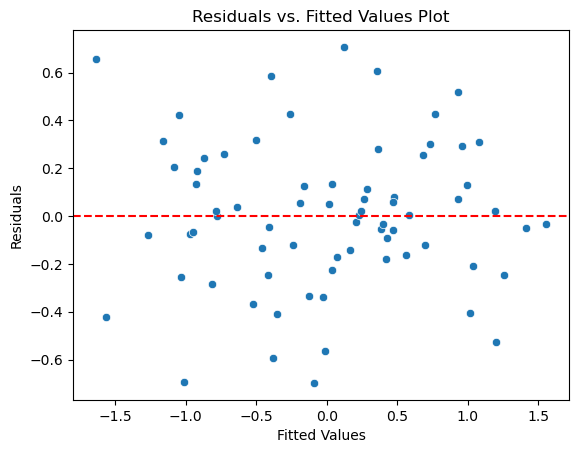

Breusch-Pagan test statistic: 15.460923998204017, p-value: 0.1161391144120768
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


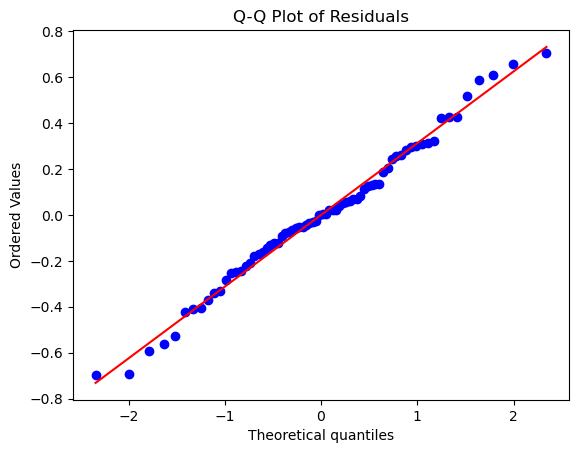

Shapiro-Wilk Test Results:
Statistic: 0.9880570769309998
p-value: 0.7325077056884766
Residuals are normally distributed (fail to reject null hypothesis)


In [325]:
# checking for model assumptions
# Calculate the residuals
residuals_EAHsavgBMIz_item = mod_EAHsavgBMIz_audio.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavgBMIz_item = durbin_watson(residuals_EAHsavgBMIz_item)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavgBMIz_item)
if 0 < dw_statistic_EAHsavgBMIz_item < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavgBMIz_item.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavgBMIz_item.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavgBMIz_item.values, i) for i in range(X_EAHsavgBMIz_item.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavgBMIz_item.fittedvalues, y=residuals_EAHsavgBMIz_item)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()


bp_test = het_breuschpagan(residuals_EAHsavgBMIz_item,  mod_EAHsavgBMIz_item.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)") 

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavgBMIz_item, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavgBMIz_item, p_value_EAHsavgBMIz_item = shapiro(residuals_EAHsavgBMIz_item)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavgBMIz_item)
print("p-value:", p_value_EAHsavgBMIz_item)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsavgBMIz_item > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

## DEMOGRAPHIC TABLE - separate for continuous and categorical

categorical vars

In [326]:
# Assuming 'df' is your original DataFrame with data

categorical_vars = ['parent_respondent', 'parent_ed', 'income', 'risk_status_mom',
                    'sex', 'ethnicity', 'race', 'pds_tanner_cat']

# Initialize an empty list to store the results
categorical_data = []

# Loop through each categorical column and calculate percentages and counts
for column in categorical_vars:
    counts = df[column].value_counts()
    percentages = counts / counts.sum() * 100
    for category, count in counts.items():
        categorical_data.append({
            'Variable': column,
            'Category': category,
            'Percentage': percentages[category],
            'Count': count
        })

# Convert the list of dictionaries into a DataFrame
categorical_table = pd.DataFrame(categorical_data)

print(categorical_table)

# Save to Excel
categorical_table.to_excel('cat_table.xlsx', index=False)

             Variable  Category     Percentage  Count
0   parent_respondent         0  84.7222222222     61
1   parent_respondent         1  15.2777777778     11
2           parent_ed         3  44.4444444444     32
3           parent_ed         4  22.2222222222     16
4           parent_ed         5  15.2777777778     11
5           parent_ed         0   9.7222222222      7
6           parent_ed         1   8.3333333333      6
7              income         5  37.5000000000     27
8              income         3  29.1666666667     21
9              income         4  23.6111111111     17
10             income         2   6.9444444444      5
11             income         1   1.3888888889      1
12             income         0   1.3888888889      1
13    risk_status_mom         0  59.7222222222     43
14    risk_status_mom         1  40.2777777778     29
15                sex         0  51.3888888889     37
16                sex         1  48.6111111111     35
17          ethnicity       

continuous vars

In [327]:
# Create a new DataFrame for the continuous table
continuous_vars = ['age_yr', 'bmi_percentile', 'bmi_z', 'v7_age_yr', 'v7_bmi_percentile', 'v7_bmi_z', 'age_diff']
continuous_table = pd.DataFrame()

# Continuous variables - mean +/- SD and output range
for col in continuous_vars:
    continuous_table[f'{col}_mean'] = [df[col].mean()]
    continuous_table[f'{col}_SD'] = [df[col].std()]
    continuous_table[f'{col}_min'] = [df[col].min()]
    continuous_table[f'{col}_max'] = [df[col].max()]

# Display the continuous table
print("\nContinuous Table:")
print(continuous_table)
continuous_table.to_excel('cont_table.xlsx')


Continuous Table:
   age_yr_mean    age_yr_SD   age_yr_min   age_yr_max  bmi_percentile_mean  \
0 7.8387500000 0.5784411726 7.0000000000 8.9900000000        47.6579166667   

   bmi_percentile_SD  bmi_percentile_min  bmi_percentile_max    bmi_z_mean  \
0      25.1340717033        3.9100000000       89.4900000000 -0.0823611111   

      bmi_z_SD     bmi_z_min    bmi_z_max  v7_age_yr_mean  v7_age_yr_SD  \
0 0.7460326864 -1.7600000000 1.2500000000    9.3416666667  0.6745222618   

   v7_age_yr_min  v7_age_yr_max  v7_bmi_percentile_mean  v7_bmi_percentile_SD  \
0   8.3500000000  11.0700000000           50.3000000000         26.9725753260   

   v7_bmi_percentile_min  v7_bmi_percentile_max  v7_bmi_z_mean  v7_bmi_z_SD  \
0           2.0200000000          93.7200000000   0.0038888889 0.8303444993   

   v7_bmi_z_min  v7_bmi_z_max  age_diff_mean  age_diff_SD  age_diff_min  \
0 -2.0500000000  1.5300000000   1.5029166667 0.4047445291  1.0700000000   

   age_diff_max  
0  2.7700000000  


# Intake vars analysis, Mean,SD, Max-Min

In [328]:
intake_vars = ['v1_eah_kcal', 'v7_eah_kcal', 'v1_meal_kcal', 'v7_meal_kcal',
               'v1_eah_g', 'v7_eah_g', 'v1_meal_g', 'v7_meal_g',
               'v1_eah_sweet_kcal', 'v7_eah_sweet_kcal', 'v1_eah_sav_kcal', 'v7_eah_sav_kcal',
               'v1_eah_sweet_g', 'v7_eah_sweet_g', 'v1_eah_sav_g', 'v7_eah_sav_g']

# Initialize an empty DataFrame to store the Intake Table
intake_table = pd.DataFrame(
    columns=['Intake Variable', 'Mean', 'Min', 'Max', 'SD'])

# Function to calculate statistics and append to the intake_table


def add_to_intake_table(column_name, data_column):
    mean_val = data_column.mean()
    min_val = data_column.min()
    max_val = data_column.max()
    sd_val = data_column.std()

    intake_table.loc[len(intake_table)] = [column_name, mean_val, min_val, max_val, sd_val]


# Calculate statistics for intake variables and add to intake_table
for column in intake_vars:
    add_to_intake_table(column, df[column])

print(intake_table)
intake_table.to_excel('intake_table.xlsx', index=False)

      Intake Variable           Mean           Min             Max  \
0         v1_eah_kcal 275.0765866501 60.3743100000  642.0548700000   
1         v7_eah_kcal 306.0436709722  0.0000000000  665.3969100000   
2        v1_meal_kcal 582.7375986644 55.8133400000 1272.0787000000   
3        v7_meal_kcal 685.8688313551  0.0000000000 1311.7205900000   
4            v1_eah_g 113.0154053755 14.8100000000  348.2900000000   
5            v7_eah_g 148.6288888889  0.0000000000  412.9700000000   
6           v1_meal_g 318.1620681126 57.8200000000  762.6700000000   
7           v7_meal_g 395.5921696697  0.0000000000  689.1700000000   
8   v1_eah_sweet_kcal 255.3888339481 42.7456000000  564.9226100000   
9   v7_eah_sweet_kcal 282.5284294444  0.0000000000  632.4884200000   
10    v1_eah_sav_kcal  23.5710811034  0.0000000000  175.6474300000   
11    v7_eah_sav_kcal  19.0863638561  0.0000000000  110.6254600000   
12     v1_eah_sweet_g  67.6602555556 10.6500000000  142.3500000000   
13     v7_eah_sweet_

# Intake variables independent T test between low vs risk status

In [329]:
from scipy.stats import ttest_ind

# Filter data for each risk group
low_risk_data = df[df["risk_status_mom"] == 0]
high_risk_data = df[df["risk_status_mom"] == 1]

# List of continuous variables to test
continuous_variables = ["v1_eah_g", "v1_eah_kcal", "v7_eah_g", "v7_eah_kcal", "v1_meal_g", "v1_meal_kcal", "v7_meal_g", "v7_meal_kcal","v1_eah_sweet_g", "v1_eah_sweet_kcal", "v7_eah_sweet_g", "v7_eah_sweet_kcal","v1_eah_sav_g", "v1_eah_sav_kcal", "v7_eah_sav_g", "v7_eah_sav_kcal"]

# Create a DataFrame to store results
results = []

# Loop through each continuous variable
for variable in continuous_variables:
    t_stat, p_value = ttest_ind(low_risk_data[variable], high_risk_data[variable])
    
    result_entry = {
        "Variable": variable,
        "T-statistic": t_stat,
        "P-value": p_value
    }
    
    results.append(result_entry)

# Convert results list to DataFrame
results_df = pd.DataFrame(results)

# Export results to Excel
results_df.to_excel("t_test_eahvsmeal.xlsx", index=False)

## Analysis by risk status

In [330]:
# Filter data for each risk group
low_risk_data = df[df["risk_status_mom"] == 0]
high_risk_data = df[df["risk_status_mom"] == 1]

# List of continuous variables to calculate statistics for
continuous_variables = [
    "v1_eah_g", "v1_eah_kcal", "v7_eah_g", "v7_eah_kcal",
    "v1_meal_g", "v1_meal_kcal", "v7_meal_g", "v7_meal_kcal",
    "v1_eah_sweet_g", "v1_eah_sweet_kcal", "v7_eah_sweet_g", "v7_eah_sweet_kcal",
    "v1_eah_sav_g", "v1_eah_sav_kcal", "v7_eah_sav_g", "v7_eah_sav_kcal"
]

# Create a DataFrame to store statistics
statistics = []

# Calculate statistics (mean, SD, min, max) for each variable based on risk status
for variable in continuous_variables:
    low_risk_mean = low_risk_data[variable].mean()
    low_risk_sd = low_risk_data[variable].std()
    low_risk_min = low_risk_data[variable].min()
    low_risk_max = low_risk_data[variable].max()

    high_risk_mean = high_risk_data[variable].mean()
    high_risk_sd = high_risk_data[variable].std()
    high_risk_min = high_risk_data[variable].min()
    high_risk_max = high_risk_data[variable].max()

    result_entry = {
        "Variable": variable,
        "Low Risk Mean": low_risk_mean,
        "Low Risk SD": low_risk_sd,
        "Low Risk Min": low_risk_min,
        "Low Risk Max": low_risk_max,
        "High Risk Mean": high_risk_mean,
        "High Risk SD": high_risk_sd,
        "High Risk Min": high_risk_min,
        "High Risk Max": high_risk_max
    }

    statistics.append(result_entry)

# Convert statistics list to DataFrame
statistics_df = pd.DataFrame(statistics)

# Export statistics to Excel
statistics_df.to_excel("statistics_by_risk_status.xlsx", index=False)

# T-test for intake vars at T1 and T2

In [331]:
import pandas as pd
from scipy.stats import ttest_rel

# Assuming your dataframe is named df
variables_to_compare = [
    ('meal_kcal', 'v1_meal_kcal', 'v7_meal_kcal'),
    ('eah_kcal', 'v1_eah_kcal', 'v7_eah_kcal'),
    ('sweet_kcal', 'v1_eah_sweet_kcal', 'v7_eah_sweet_kcal'),
    ('sav_kcal', 'v1_eah_sav_kcal', 'v7_eah_sav_kcal'),
    ('sav_g', 'v1_eah_sav_g', 'v7_eah_sav_g'),
    ('sweet_g', 'v1_eah_sweet_g', 'v7_eah_sweet_g'),
    ('meal_g', 'v1_meal_g', 'v7_meal_g'),
    ('eah_g', 'v1_eah_g', 'v7_eah_g')
]

# Initialize an empty DataFrame to store the t-test results
ttest_results = pd.DataFrame(columns=['Variable Pair', 'T-Statistic', 'P-Value'])

# Perform paired t-tests for each variable pair
for var_name, col_v1, col_v7 in variables_to_compare:
    t_statistic, p_value = ttest_rel(df[col_v1], df[col_v7])
    formatted_p_value = "{:.3f}".format(p_value)  # Format p-value to two decimal places
    ttest_results.loc[len(ttest_results)] = [var_name, t_statistic, formatted_p_value]

print(ttest_results)

  Variable Pair   T-Statistic P-Value
0     meal_kcal -3.5808916140   0.001
1      eah_kcal -1.9678929168   0.053
2    sweet_kcal -1.7312546602   0.088
3      sav_kcal  1.4102335013   0.163
4         sav_g  0.4013906592   0.689
5       sweet_g -2.2262491180   0.029
6        meal_g -4.2470793635   0.000
7         eah_g -3.1162334884   0.003


# Liking ratings

 each food item liking rating at v1 and v7 , Independent T test for each food item comparing between v1 and v7

In [332]:
def analyze_food_items(df):
    # Extracting the column names for v1 and v7 time points
    v1_columns = [col for col in df.columns if col.startswith("v1_vas_")]
    v7_columns = [col for col in df.columns if col.startswith("v7_vas_")]

    # Initializing a list to store results
    results = []

    # Looping through each pair of columns
    for v1_col, v7_col in zip(v1_columns, v7_columns):
        food_item = v1_col.split("v1_vas_")[-1]  # Extracting the food item name

        # Calculating means and standard errors
        mean_v1 = df[v1_col].mean()
        se_v1 = df[v1_col].sem()
        mean_v7 = df[v7_col].mean()
        se_v7 = df[v7_col].sem()

        # Performing t-test
        t_stat, p_value = stats.ttest_ind(df[v1_col].dropna(), df[v7_col].dropna())

        # Storing results
        results.append({
            "Food Item": food_item,
            "Mean V1": mean_v1,
            "SE V1": se_v1,
            "Mean V7": mean_v7,
            "SE V7": se_v7,
            "T-Statistic": t_stat,
            "P-Value": p_value
        })

    # Converting results to DataFrame for better visualization
    results_df = pd.DataFrame(results)
    return results_df

# Set display option for floating point numbers
pd.set_option('display.float_format', lambda x: '%.10f' % x)

# Analyzing the DataFrame
results = analyze_food_items(df)

# Printing the results
print(results)

        Food Item      Mean V1        SE V1      Mean V7        SE V7  \
0         popcorn 4.0972222222 0.0819359893 4.0000000000 0.0815537689   
1         pretzle 3.9583333333 0.0825965078 3.9861111111 0.0827279786   
2        cornchip 4.0000000000 0.1136256931 3.9166666667 0.0943431289   
3          cookie 4.6250000000 0.0668936862 4.5138888889 0.0927603462   
4         brownie 4.4305555556 0.0786883596 4.4027777778 0.0899045795   
5       starburst 4.3333333333 0.1008570472 4.2222222222 0.1012871432   
6         skittle 4.2916666667 0.1126531300 4.2638888889 0.1170066401   
7         hershey 4.4166666667 0.0879028842 4.4444444444 0.0882114246   
8        icecream 4.3472222222 0.0931111587 4.4027777778 0.0941557541   
9      pbj_sndwch 3.5138888889 0.1519217732 3.5555555556 0.1134342427   
10     ham_sndwch 3.6944444444 0.1276348115 3.7500000000 0.1247062276   
11  turkey_sndwch 3.8194444444 0.1375028651 3.7777777778 0.1087383585   
12  cheese_sndwch 3.5138888889 0.1266411136 3.36111

Savory and sweet categories comparing between v1 vs v7

In [333]:
# Define the savory and sweet items
savory_items = ['cornchip', 'pretzle', 'popcorn']
sweet_items = ['cookie', 'icecream', 'hershey', 'starburst', 'skittle', 'brownie']

def analyze_categories(df, savory_items, sweet_items):
    # Initialize results
    results = []

    # Function to calculate mean, SE, and t-test for a category
    def analyze_category(category_name, item_list):
        # Creating combined columns for v1 and v7
        df[f'v1_{category_name}'] = df[[f'v1_vas_{item}' for item in item_list]].mean(axis=1)
        df[f'v7_{category_name}'] = df[[f'v7_vas_{item}' for item in item_list]].mean(axis=1)

        # Calculating means and standard errors
        mean_v1 = df[f'v1_{category_name}'].mean()
        se_v1 = df[f'v1_{category_name}'].sem()
        mean_v7 = df[f'v7_{category_name}'].mean()
        se_v7 = df[f'v7_{category_name}'].sem()

        # Performing t-test
        t_stat, p_value = stats.ttest_ind(df[f'v1_{category_name}'].dropna(), df[f'v7_{category_name}'].dropna())

        return {
            "Category": category_name,
            "Mean V1": mean_v1,
            "SE V1": se_v1,
            "Mean V7": mean_v7,
            "SE V7": se_v7,
            "T-Statistic": t_stat,
            "P-Value": p_value
        }

    # Analyzing Savory category
    results.append(analyze_category("Savory", savory_items))

    # Analyzing Sweet category
    results.append(analyze_category("Sweet", sweet_items))

    # Converting results to DataFrame for better visualization
    results_df = pd.DataFrame(results)
    return results_df

# Set display option for floating point numbers
pd.set_option('display.float_format', lambda x: '%.10f' % x)


# Example usage:
results = analyze_categories(df, savory_items, sweet_items)
print(results)

  Category      Mean V1        SE V1      Mean V7        SE V7  T-Statistic  \
0   Savory 4.0185185185 0.0625102631 3.9675925926 0.0582894321 0.5958310751   
1    Sweet 4.4074074074 0.0596941366 4.3750000000 0.0642417283 0.3695473719   

       P-Value  
0 0.5522366013  
1 0.7122702883  


Savory vs sweet categories at v1 AND v7

In [334]:
import pandas as pd
from scipy import stats

def compare_sweet_savory(df, savory_items, sweet_items):
    # Function to calculate the mean and SE for a category at a given time point
    def category_stats(df, item_list, time_point):
        category_means = df[[f'{time_point}_vas_{item}' for item in item_list]].mean(axis=1)
        mean = category_means.mean()
        se = category_means.sem()
        return mean, se, category_means

    # Calculate category means and SE for both time points
    savory_mean_v1, savory_se_v1, savory_v1 = category_stats(df, savory_items, 'v1')
    sweet_mean_v1, sweet_se_v1, sweet_v1 = category_stats(df, sweet_items, 'v1')
    savory_mean_v7, savory_se_v7, savory_v7 = category_stats(df, savory_items, 'v7')
    sweet_mean_v7, sweet_se_v7, sweet_v7 = category_stats(df, sweet_items, 'v7')

    # Perform t-tests for sweet vs savory at v1 and v7 with sweet as the first group
    t_stat_v1, p_value_v1 = stats.ttest_ind(sweet_v1.dropna(), savory_v1.dropna())
    t_stat_v7, p_value_v7 = stats.ttest_ind(sweet_v7.dropna(), savory_v7.dropna())

    # Organize the results
    results = pd.DataFrame({
        "Category": ["Sweet", "Savory", "Sweet", "Savory"],
        "Time Point": ["V1", "V1", "V7", "V7"],
        "Mean": [sweet_mean_v1, savory_mean_v1, sweet_mean_v7, savory_mean_v7],
        "SE": [sweet_se_v1, savory_se_v1, sweet_se_v7, savory_se_v7],
        "T-Statistic": [t_stat_v1, None, t_stat_v7, None],
        "P-Value": [p_value_v1, None, p_value_v7, None]
    })

    return results

# Set display option for floating point numbers
pd.set_option('display.float_format', lambda x: '%.10f' % x)

# Define the savory and sweet items
savory_items = ['cornchip', 'pretzle', 'popcorn']
sweet_items = ['cookie', 'icecream', 'hershey', 'starburst', 'skittle', 'brownie']


results = compare_sweet_savory(df, savory_items, sweet_items)
print(results)


  Category Time Point         Mean           SE  T-Statistic      P-Value
0    Sweet         V1 4.4074074074 0.0596941366 4.4992321957 0.0000140791
1   Savory         V1 4.0185185185 0.0625102631          NaN          NaN
2    Sweet         V7 4.3750000000 0.0642417283 4.6966213843 0.0000061762
3   Savory         V7 3.9675925926 0.0582894321          NaN          NaN


T-test for comparison between sweet vs savory at T1, and at T2

In [335]:
import pandas as pd
from scipy import stats

def compare_sweet_savory(df, savory_items, sweet_items):
    # Function to calculate the mean for a category at a given time point
    def category_mean(df, item_list, time_point):
        # Creating a column for the category mean at the specified time point
        category_col = [f'{time_point}_vas_{item}' for item in item_list]
        df[f'{time_point}_category_mean'] = df[category_col].mean(axis=1)
        return df[f'{time_point}_category_mean']

    # Calculate category means for both time points
    savory_mean_v1 = category_mean(df, savory_items, 'v1')
    sweet_mean_v1 = category_mean(df, sweet_items, 'v1')
    savory_mean_v7 = category_mean(df, savory_items, 'v7')
    sweet_mean_v7 = category_mean(df, sweet_items, 'v7')

    # Perform t-tests
    t_stat_v1, p_value_v1 = stats.ttest_ind(savory_mean_v1.dropna(), sweet_mean_v1.dropna())
    t_stat_v7, p_value_v7 = stats.ttest_ind(savory_mean_v7.dropna(), sweet_mean_v7.dropna())

    # Results
    return pd.DataFrame({
        "Time Point": ["v1", "v7"],
        "T-Statistic": [t_stat_v1, t_stat_v7],
        "P-Value": [p_value_v1, p_value_v7]
    })

# Set display option for floating point numbers
pd.set_option('display.float_format', lambda x: '%.10f' % x)

# Define the savory and sweet items
savory_items = ['cornchip', 'pretzle', 'popcorn']
sweet_items = ['cookie', 'icecream', 'hershey', 'starburst', 'skittle', 'brownie']

# Example usage:
results = compare_sweet_savory(df, savory_items, sweet_items)
print(results)

  Time Point   T-Statistic      P-Value
0         v1 -4.4992321957 0.0000140791
1         v7 -4.6966213843 0.0000061762


## additional analyses

### model for T1 EAH-kcal vs T2 FMI with meal_kcal controlled

### covariates: baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1,T1 meal kcal, main predictor : T1 EAH kcal

In [336]:
# Select specific columns as predictors (X) and response (y)
X_EAHkcalFMImealkcal = df_linear_reg[['v1_FMI','sex', 'risk_status_mom', 'income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','v1_meal_kcal', 'v1_eah_kcal']]
y_EAHkcalFMImealkcal= df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHkcalFMImealkcal= sm.add_constant(X_EAHkcalFMImealkcal)

# Fit a linear regression model using ols
mod_EAHkcalFMImealkcal = sm.OLS(y_EAHkcalFMImealkcal, X_EAHkcalFMImealkcal).fit()

# Get summary of the regression model
print(mod_EAHkcalFMImealkcal.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.820
Method:                 Least Squares   F-statistic:                     33.24
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           5.27e-21
Time:                        15:37:13   Log-Likelihood:                -35.065
No. Observations:                  72   AIC:                             92.13
Df Residuals:                      61   BIC:                             117.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3177      0

model assumption check

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.5855413174990884
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


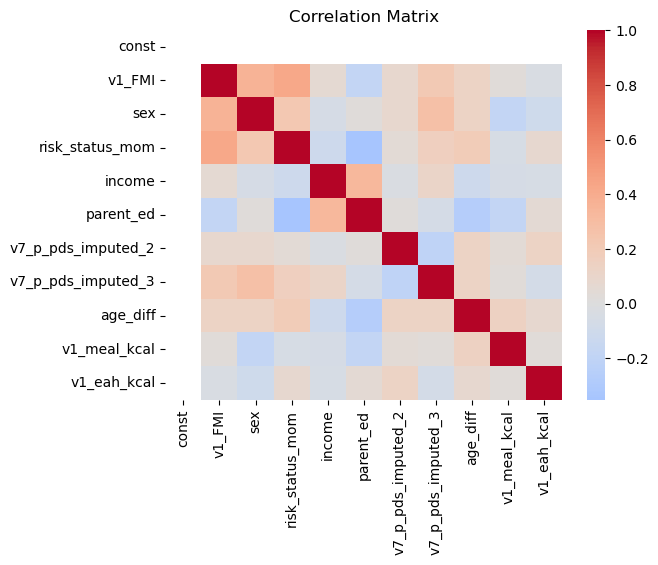

              Variable           VIF
0                const 16.8140980497
1               v1_FMI  1.4258891188
2                  sex  1.3675797569
3      risk_status_mom  1.4285909986
4               income  1.2006672485
5            parent_ed  1.4329023002
6   v7_p_pds_imputed_2  1.1242286036
7   v7_p_pds_imputed_3  1.2314687029
8             age_diff  1.1659123102
9         v1_meal_kcal  1.1232811932
10         v1_eah_kcal  1.0667469992
CHECKING FOR HETEROSKEDASTICITY


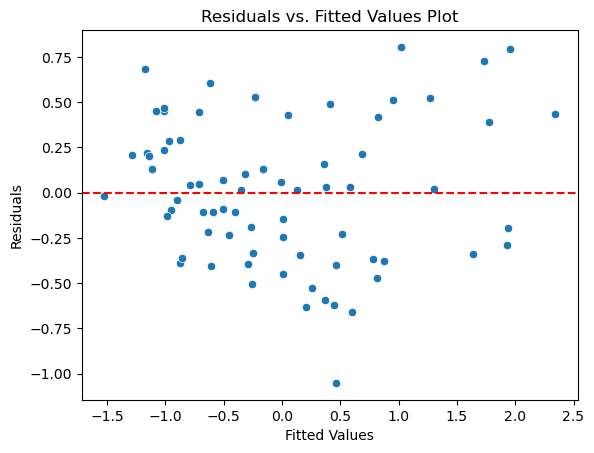

Breusch-Pagan test statistic: 14.68229417335548, p-value: 0.14408127692479766
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


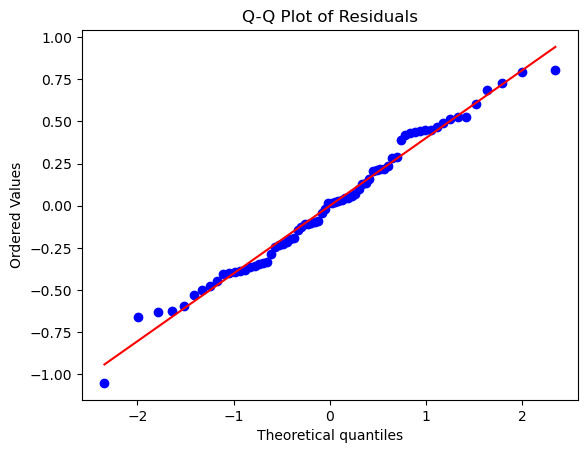

Shapiro-Wilk Test Results:
Statistic: 0.9845141768455505
p-value: 0.521759569644928
Residuals are normally distributed (fail to reject null hypothesis)


In [337]:
# checking for model assumptions
# Calculate the residuals
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
residuals_EAHkcalFMImealkcal= mod_EAHkcalFMImealkcal.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHkcalFMImealkcal = durbin_watson(residuals_EAHkcalFMImealkcal)
print("Durbin-Watson Statistic:", dw_statistic_EAHkcalFMImealkcal)
if 0 < dw_statistic_EAHkcalFMImealkcal< 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHkcalFMImealkcal.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHkcalFMImealkcal.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHkcalFMImealkcal.values, i) for i in range(X_EAHkcalFMImealkcal.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHkcalFMImealkcal.fittedvalues, y=residuals_EAHkcalFMImealkcal)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()


bp_test = het_breuschpagan(residuals_EAHkcalFMImealkcal,  mod_EAHkcalFMImealkcal.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)") 

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHkcalFMImealkcal, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHkcalFMImealkcal, p_value_EAHkcalFMImealkcal = shapiro(residuals_EAHkcalFMImealkcal)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHkcalFMImealkcal)
print("p-value:", p_value_EAHkcalFMImealkcal)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHkcalFMImealkcal > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### model for T1 EAH-gram vs T2 FMI with meal_gram controlled

### covariates: baseline FMI, * sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1, T1 meal gram, main predictor : T1 EAH gram

In [338]:
# Select specific columns as predictors (X) and response (y)
X_EAHgFMImealg = df_linear_reg[['v1_FMI','sex', 'risk_status_mom', 'income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3','age_diff','v1_meal_g', 'v1_eah_g']]
y_EAHgFMImealg= df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHgFMImealg= sm.add_constant(X_EAHgFMImealg)

# Fit a linear regression model using ols
mod_EAHgFMImealg = sm.OLS(y_EAHgFMImealg, X_EAHgFMImealg).fit()

# Get summary of the regression model
print(mod_EAHgFMImealg.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.837
Model:                            OLS   Adj. R-squared:                  0.810
Method:                 Least Squares   F-statistic:                     31.28
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           2.41e-20
Time:                        15:37:14   Log-Likelihood:                -36.902
No. Observations:                  72   AIC:                             95.80
Df Residuals:                      61   BIC:                             120.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2844      0

model assumption check

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.5360056968643694
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


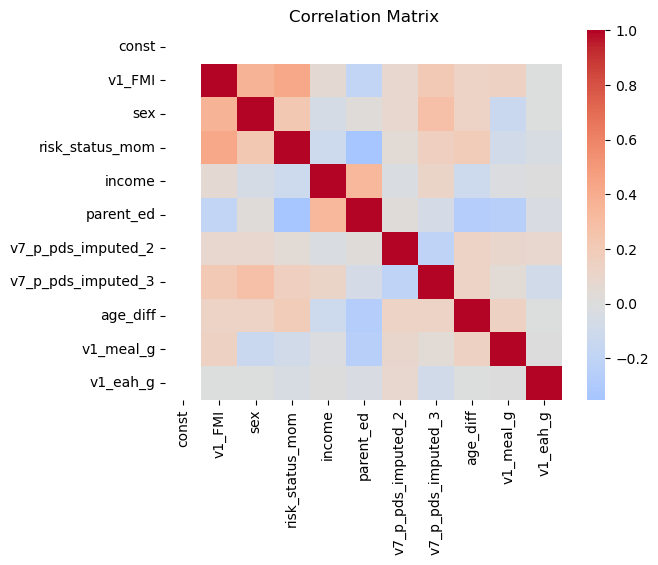

              Variable           VIF
0                const 17.1781920782
1               v1_FMI  1.4861731193
2                  sex  1.3304050382
3      risk_status_mom  1.4865689809
4               income  1.1963586906
5            parent_ed  1.4850990774
6   v7_p_pds_imputed_2  1.1228583971
7   v7_p_pds_imputed_3  1.2383883941
8             age_diff  1.1499675834
9            v1_meal_g  1.2256087376
10            v1_eah_g  1.0179660898
CHECKING FOR HETEROSKEDASTICITY


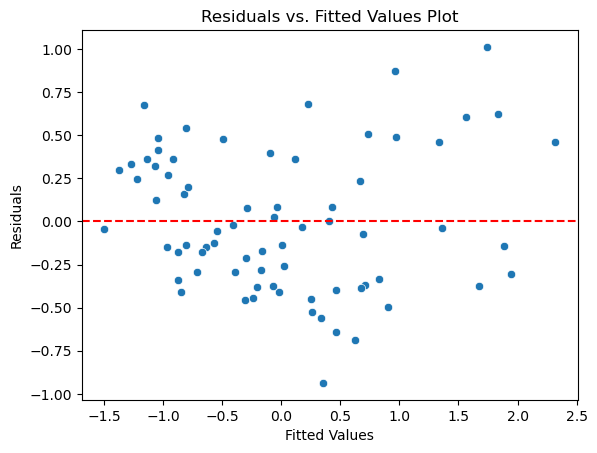

Breusch-Pagan test statistic: 16.76259336318157, p-value: 0.07978503838798147
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


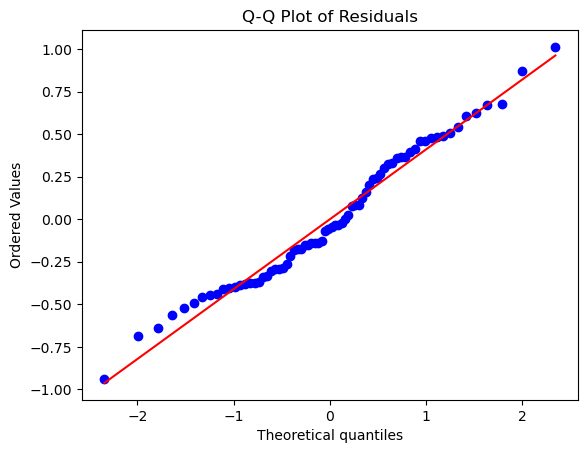

Shapiro-Wilk Test Results:
Statistic: 0.9780963659286499
p-value: 0.2417639195919037
Residuals are normally distributed (fail to reject null hypothesis)


In [339]:
# checking for model assumptions
# Calculate the residuals
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
residuals_EAHgFMImealg= mod_EAHgFMImealg.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHgFMImealg = durbin_watson(residuals_EAHgFMImealg)
print("Durbin-Watson Statistic:", dw_statistic_EAHgFMImealg)
if 0 < dw_statistic_EAHgFMImealg< 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHgFMImealg.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHgFMImealg.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHgFMImealg.values, i) for i in range(X_EAHgFMImealg.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHgFMImealg.fittedvalues, y=residuals_EAHgFMImealg)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHgFMImealg,  mod_EAHgFMImealg.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)") 

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHgFMImealg, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHgFMImealg, p_value_EAHgFMImealg = shapiro(residuals_EAHgFMImealg)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHgFMImealg)
print("p-value:", p_value_EAHgFMImealg)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHgFMImealg > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

# ANALYSES BASED ON SANDWICH TYPE ON EAH INTAKE vs FMI

## checking if meal type (sweet and savory) has an effect on EAH intake

### EAH savory gram vs FMI with savory sandwich at pre-meal (gram)

#### covariates: baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1, meal sav sandwich gram, main: predictor : T1 EAH sav gram

In [340]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavgFMImealsavg = df_linear_reg[['v1_FMI','sex', 'risk_status_mom', 'income','parent_ed','v7_p_pds_imputed_2','v7_p_pds_imputed_3','age_diff','v1_sandw_sav_g', 'v1_eah_sav_g']]
y_EAHsavgFMImealsavg = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsavgFMImealsavg = sm.add_constant(X_EAHsavgFMImealsavg)

# Fit a linear regression model using ols
mod_EAHsavgFMImealsavg = sm.OLS(y_EAHsavgFMImealsavg, X_EAHsavgFMImealsavg).fit()

# Get summary of the regression model
print(mod_EAHsavgFMImealsavg.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     30.28
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           5.40e-20
Time:                        15:37:14   Log-Likelihood:                -37.880
No. Observations:                  72   AIC:                             97.76
Df Residuals:                      61   BIC:                             122.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3095      0

model assumption

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.6217826852049424
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


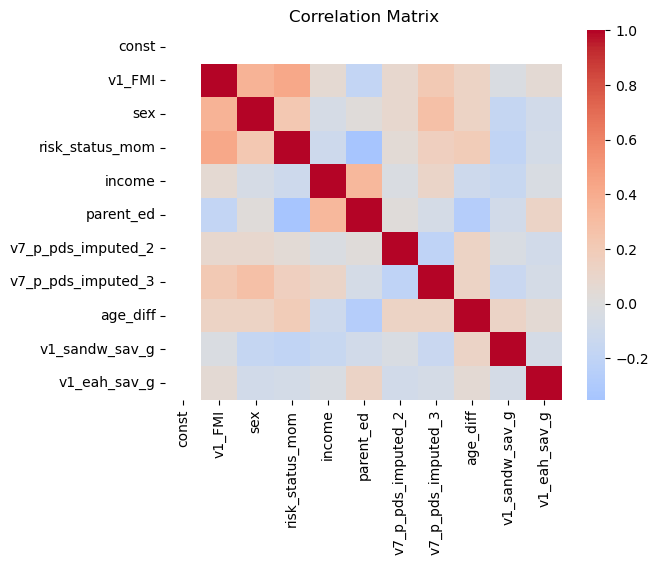

              Variable           VIF
0                const 21.7637450367
1               v1_FMI  1.4890796067
2                  sex  1.3388789126
3      risk_status_mom  1.4816920850
4               income  1.2354781655
5            parent_ed  1.4254890621
6   v7_p_pds_imputed_2  1.1303501714
7   v7_p_pds_imputed_3  1.2464777833
8             age_diff  1.1990959512
9       v1_sandw_sav_g  1.1847298246
10        v1_eah_sav_g  1.1094808614
CHECKING FOR HETEROSKEDASTICITY


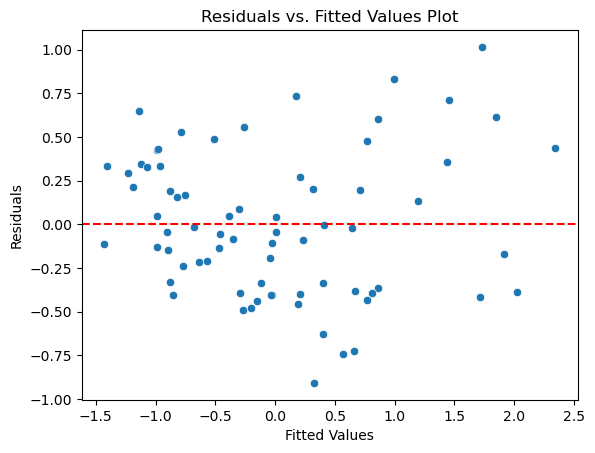

Breusch-Pagan test statistic: 17.31523333189891, p-value: 0.06767325376186807
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


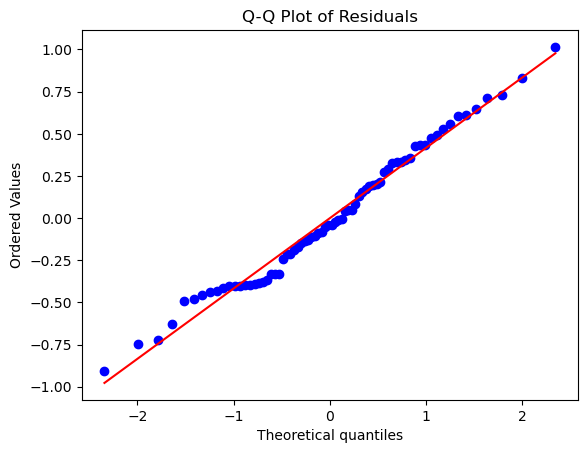

Shapiro-Wilk Test Results:
Statistic: 0.9819948673248291
p-value: 0.39214056730270386
Residuals are normally distributed (fail to reject null hypothesis)


In [341]:
# checking for model assumptions
# Calculate the residuals
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
residuals_EAHsavgFMImealsavg = mod_EAHsavgFMImealsavg.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavgFMImealsavg = durbin_watson(residuals_EAHsavgFMImealsavg)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavgFMImealsavg)
if 0 < dw_statistic_EAHsavgFMImealsavg < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavgFMImealsavg.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavgFMImealsavg.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavgFMImealsavg.values, i) for i in range(X_EAHsavgFMImealsavg.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavgFMImealsavg.fittedvalues, y=residuals_EAHsavgFMImealsavg)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsavgFMImealsavg,  mod_EAHsavgFMImealsavg.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)") 

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavgFMImealsavg, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavgFMImealsavg, p_value_EAHsavgFMImealsavg = shapiro(residuals_EAHsavgFMImealsavg)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavgFMImealsavg)
print("p-value:", p_value_EAHsavgFMImealsavg)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsavgFMImealsavg > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### EAH sav kcal vs FMI with savory sandwich meal (kcal)  as a covariate

#### covariates: baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1, meal sav sandwich kcal, main: predictor : T1 EAH sav kcal

In [342]:
# Select specific columns as predictors (X) and response (y)
X_EAHsavkcalFMImealsavkcal = df_linear_reg[['v1_FMI','sex', 'risk_status_mom', 'income','parent_ed','v7_p_pds_imputed_2','v7_p_pds_imputed_3','age_diff','v1_sandw_sav_kcal', 'v1_eah_sav_kcal']]
y_EAHsavkcalFMImealsavkcal = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsavkcalFMImealsavkcal = sm.add_constant(X_EAHsavkcalFMImealsavkcal)

# Fit a linear regression model using ols
mod_EAHsavkcalFMImealsavkcal = sm.OLS(y_EAHsavkcalFMImealsavkcal, X_EAHsavkcalFMImealsavkcal).fit()

# Get summary of the regression model
print(mod_EAHsavkcalFMImealsavkcal.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     30.27
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           5.45e-20
Time:                        15:37:15   Log-Likelihood:                -37.892
No. Observations:                  72   AIC:                             97.78
Df Residuals:                      61   BIC:                             122.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2737      0

model assumption check

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.6271656466240225
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


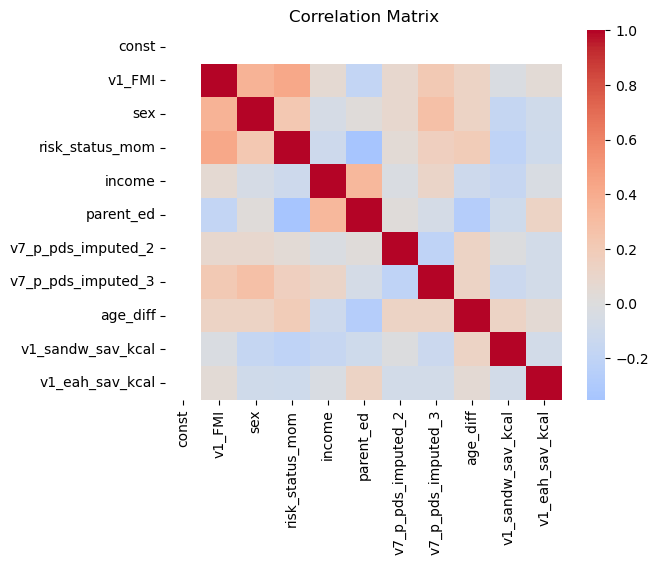

              Variable           VIF
0                const 22.2743908627
1               v1_FMI  1.4910734268
2                  sex  1.3437070931
3      risk_status_mom  1.5115526396
4               income  1.2419309163
5            parent_ed  1.4276402964
6   v7_p_pds_imputed_2  1.1244258583
7   v7_p_pds_imputed_3  1.2417822721
8             age_diff  1.2014317270
9    v1_sandw_sav_kcal  1.2057814839
10     v1_eah_sav_kcal  1.1227189553
CHECKING FOR HETEROSKEDASTICITY


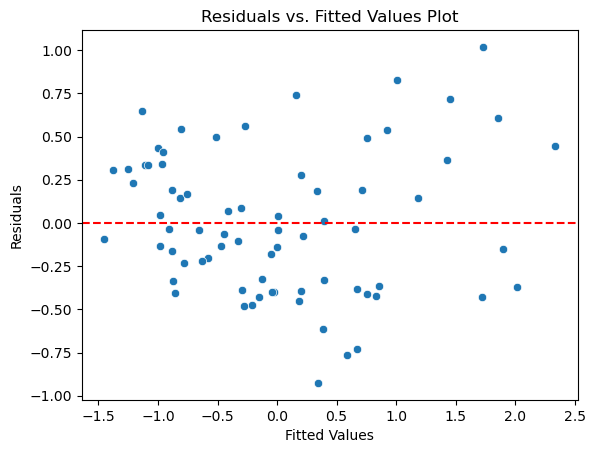

Breusch-Pagan test statistic: 16.498865237239713, p-value: 0.08621472722616642
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


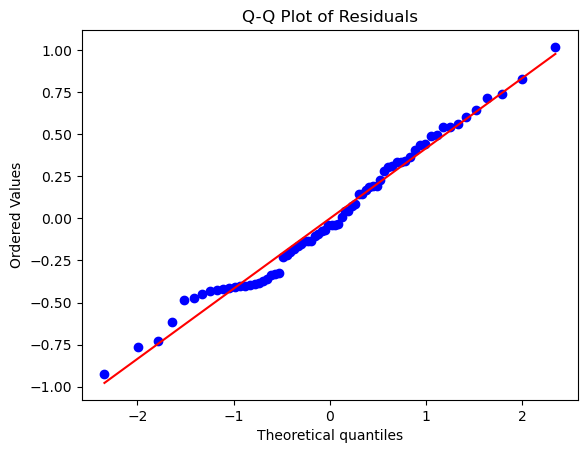

Shapiro-Wilk Test Results:
Statistic: 0.9825522303581238
p-value: 0.41868939995765686
Residuals are normally distributed (fail to reject null hypothesis)


In [343]:
# checking for model assumptions
# Calculate the residuals
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
residuals_EAHsavkcalFMImealsavkcal = mod_EAHsavkcalFMImealsavkcal.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsavkcalFMImealsavkcal = durbin_watson(residuals_EAHsavkcalFMImealsavkcal)
print("Durbin-Watson Statistic:", dw_statistic_EAHsavkcalFMImealsavkcal)
if 0 < dw_statistic_EAHsavkcalFMImealsavkcal < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsavkcalFMImealsavkcal.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsavkcalFMImealsavkcal.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsavkcalFMImealsavkcal.values, i) for i in range(X_EAHsavkcalFMImealsavkcal.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsavkcalFMImealsavkcal.fittedvalues, y=residuals_EAHsavkcalFMImealsavkcal)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsavkcalFMImealsavkcal,  mod_EAHsavkcalFMImealsavkcal.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)") 

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsavkcalFMImealsavkcal, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsavkcalFMImealsavkcal, p_value_EAHsavkcalFMImealsavkcal = shapiro(residuals_EAHsavkcalFMImealsavkcal)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsavkcalFMImealsavkcal)
print("p-value:", p_value_EAHsavkcalFMImealsavkcal)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsavkcalFMImealsavkcal > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### EAH sweet gram vs FMI with sweet meal (gram)

#### covariates: baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1, meal sweet sandwich gram, main: predictor : T1 EAH sweet gram

In [344]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetgFMImealsweetg = df_linear_reg[['v1_FMI','sex', 'risk_status_mom', 'income','parent_ed','v7_p_pds_imputed_2','v7_p_pds_imputed_3','age_diff','v1_consumed_pbj_sndwch_g','v1_eah_sweet_g']]
y_EAHsweetgFMImealsweetg = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsweetgFMImealsweetg = sm.add_constant(X_EAHsweetgFMImealsweetg)

# Fit a linear regression model using ols
mod_EAHsweetgFMImealsweetg = sm.OLS(y_EAHsweetgFMImealsweetg, X_EAHsweetgFMImealsweetg).fit()

# Get summary of the regression model
print(mod_EAHsweetgFMImealsweetg.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.848
Model:                            OLS   Adj. R-squared:                  0.823
Method:                 Least Squares   F-statistic:                     33.91
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           3.17e-21
Time:                        15:37:15   Log-Likelihood:                -34.450
No. Observations:                  72   AIC:                             90.90
Df Residuals:                      61   BIC:                             115.9
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

model assumption check

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.4996515999298028
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


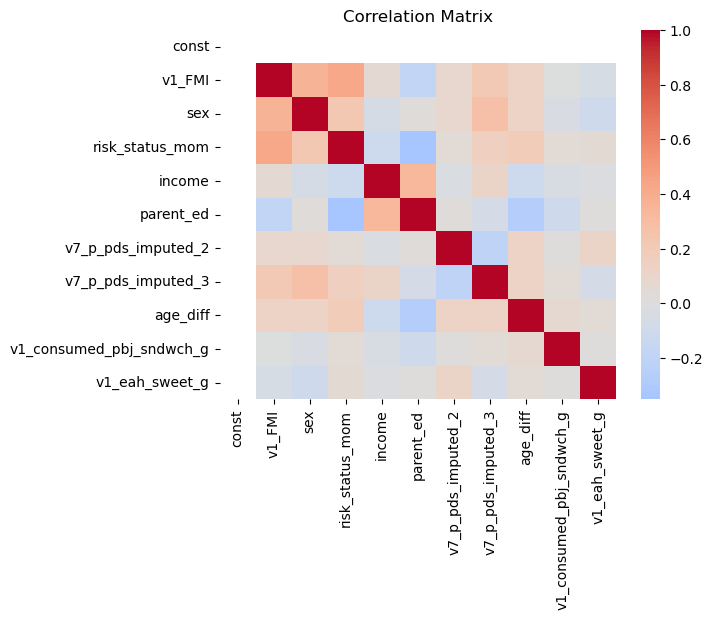

                    Variable           VIF
0                      const 17.3132687922
1                     v1_FMI  1.4162330319
2                        sex  1.2996006026
3            risk_status_mom  1.3956675996
4                     income  1.1955596459
5                  parent_ed  1.3914043147
6         v7_p_pds_imputed_2  1.1158042441
7         v7_p_pds_imputed_3  1.2259500470
8                   age_diff  1.1455226200
9   v1_consumed_pbj_sndwch_g  1.0170989974
10            v1_eah_sweet_g  1.0392755353
CHECKING FOR HETEROSKEDASTICITY


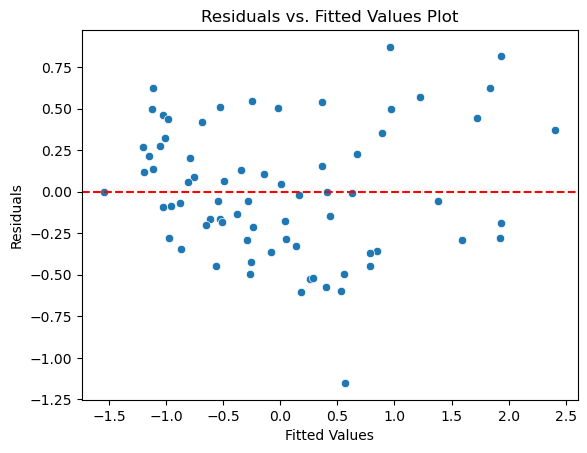

Breusch-Pagan test statistic: 16.045092298855526, p-value: 0.09834883708787515
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


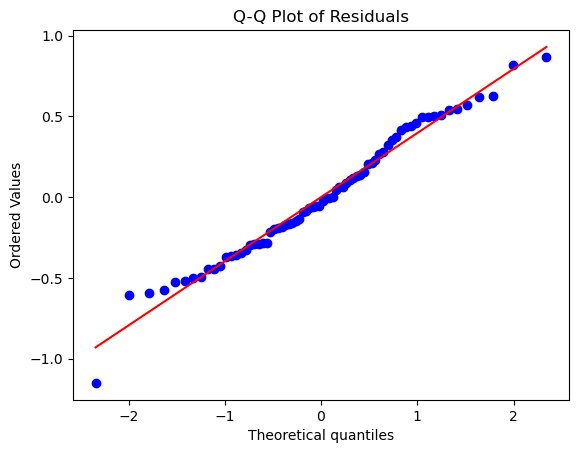

Shapiro-Wilk Test Results:
Statistic: 0.9826881289482117
p-value: 0.4253522455692291
Residuals are normally distributed (fail to reject null hypothesis)


In [345]:
# checking for model assumptions
# Calculate the residuals
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
residuals_EAHsweetgFMImealsweetg = mod_EAHsweetgFMImealsweetg.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetgFMImealsweetg = durbin_watson(residuals_EAHsweetgFMImealsweetg)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetgFMImealsweetg)
if 0 < dw_statistic_EAHsweetgFMImealsweetg < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetgFMImealsweetg.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetgFMImealsweetg.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetgFMImealsweetg.values, i) for i in range(X_EAHsweetgFMImealsweetg.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetgFMImealsweetg.fittedvalues, y=residuals_EAHsweetgFMImealsweetg)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetgFMImealsweetg,  mod_EAHsweetgFMImealsweetg.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)") 

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetgFMImealsweetg, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetgFMImealsweetg, p_value_EAHsweetgFMImealsweetg = shapiro(residuals_EAHsweetgFMImealsweetg)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetgFMImealsweetg)
print("p-value:", p_value_EAHsweetgFMImealsweetg)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetgFMImealsweetg > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### EAH sweet kcal vs FMI with sweet sandwich meal kcal controlled

#### covariates: baseline FMI, sex, risk status based on maternal BMI, tanner stage category at T2, parent education, parent yearly income, age differences between v7 and v1, meal sweet sandwich kcal, main: predictor : T1 EAH sweet kcal

In [346]:
# Select specific columns as predictors (X) and response (y)
X_EAHsweetkcalFMImealsweetkcal = df_linear_reg[['v1_FMI','sex', 'risk_status_mom', 'income','parent_ed','v7_p_pds_imputed_2','v7_p_pds_imputed_3','age_diff','v1_consumed_pbj_sndwch_kcal', 'v1_eah_sweet_kcal']]
y_EAHsweetkcalFMImealsweetkcal = df_linear_reg['v7_FMI']

# Add a constant term to the predictors (intercept)
X_EAHsweetkcalFMImealsweetkcal = sm.add_constant(X_EAHsweetkcalFMImealsweetkcal)

# Fit a linear regression model using ols
mod_EAHsweetkcalFMImealsweetkcal = sm.OLS(y_EAHsweetkcalFMImealsweetkcal, X_EAHsweetkcalFMImealsweetkcal).fit()

# Get summary of the regression model
print(mod_EAHsweetkcalFMImealsweetkcal.summary())

                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.820
Method:                 Least Squares   F-statistic:                     33.25
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           5.23e-21
Time:                        15:37:16   Log-Likelihood:                -35.055
No. Observations:                  72   AIC:                             92.11
Df Residuals:                      61   BIC:                             117.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

model assumption check

MULTICOLLINEARITY and AUTOCORRELATION
Durbin-Watson Statistic: 1.5695544259439045
The Durbin-Watson statistic suggests no significant autocorrelation.


c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


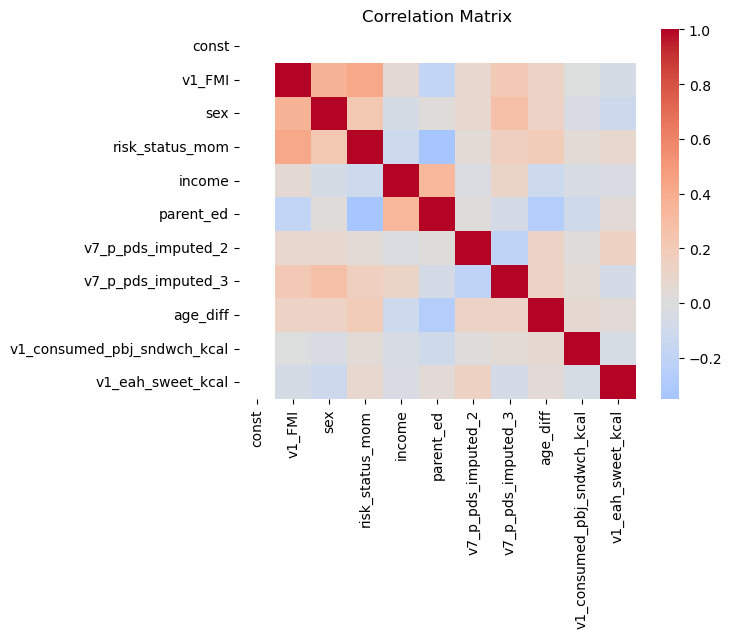

                       Variable           VIF
0                         const 17.3105787887
1                        v1_FMI  1.4181818390
2                           sex  1.3109148140
3               risk_status_mom  1.4101874213
4                        income  1.1969246538
5                     parent_ed  1.3974052139
6            v7_p_pds_imputed_2  1.1258621432
7            v7_p_pds_imputed_3  1.2254159988
8                      age_diff  1.1445789761
9   v1_consumed_pbj_sndwch_kcal  1.0210550873
10            v1_eah_sweet_kcal  1.0690078515
CHECKING FOR HETEROSKEDASTICITY


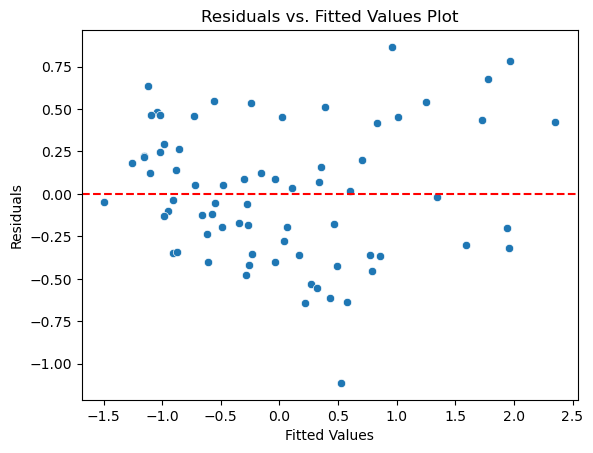

Breusch-Pagan test statistic: 15.873765942338128, p-value: 0.10330346509470519
The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)
NORMALITY


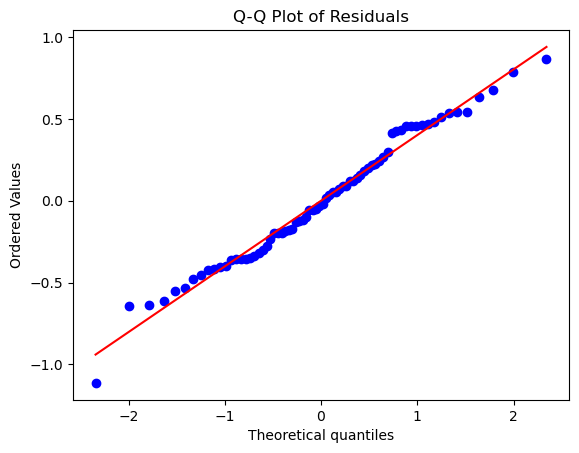

Shapiro-Wilk Test Results:
Statistic: 0.9835194945335388
p-value: 0.46771085262298584
Residuals are normally distributed (fail to reject null hypothesis)


In [347]:
# checking for model assumptions
# Calculate the residuals
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
residuals_EAHsweetkcalFMImealsweetkcal = mod_EAHsweetkcalFMImealsweetkcal.resid

# 1. Linearity
# partial regression plots - refer later

# 2. Multicollinearity
print("MULTICOLLINEARITY and AUTOCORRELATION")
dw_statistic_EAHsweetkcalFMImealsweetkcal = durbin_watson(residuals_EAHsweetkcalFMImealsweetkcal)
print("Durbin-Watson Statistic:", dw_statistic_EAHsweetkcalFMImealsweetkcal)
if 0 < dw_statistic_EAHsweetkcalFMImealsweetkcal < 4:
    print("The Durbin-Watson statistic suggests no significant autocorrelation.")
else:
    print("The Durbin-Watson statistic indicates potential autocorrelation.")

correlation_matrix = X_EAHsweetkcalFMImealsweetkcal.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix")
plt.show()


# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_EAHsweetkcalFMImealsweetkcal.columns
vif_data["VIF"] = [variance_inflation_factor(X_EAHsweetkcalFMImealsweetkcal.values, i) for i in range(X_EAHsweetkcalFMImealsweetkcal.shape[1])]
print(vif_data)

# 3. Heteroskedasticity Assumption
print("CHECKING FOR HETEROSKEDASTICITY")
sns.scatterplot(x=mod_EAHsweetkcalFMImealsweetkcal.fittedvalues, y=residuals_EAHsweetkcalFMImealsweetkcal)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values Plot")
plt.show()

bp_test = het_breuschpagan(residuals_EAHsweetkcalFMImealsweetkcal,  mod_EAHsweetkcalFMImealsweetkcal.model.exog)
bp_statistic, bp_pvalue, _, _ = bp_test
print(f'Breusch-Pagan test statistic: {bp_statistic}, p-value: {bp_pvalue}')

if bp_pvalue < 0.05:
    print("The Breusch-Pagan test suggests heteroskedasticity (reject null hypothesis of homoskedasticity)")
else:
    print("The Breusch-Pagan test does not suggest heteroskedasticity (fail to reject null hypothesis of homoskedasticity)") 

# 4. Normal Distribution of Error Terms Assumption
# Create a Q-Q plot
print("NORMALITY")
stats.probplot(residuals_EAHsweetkcalFMImealsweetkcal, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Perform Shapiro-Wilk test for normality
statistic_EAHsweetkcalFMImealsweetkcal, p_value_EAHsweetkcalFMImealsweetkcal = shapiro(residuals_EAHsweetkcalFMImealsweetkcal)

# Print the test results
print("Shapiro-Wilk Test Results:")
print("Statistic:", statistic_EAHsweetkcalFMImealsweetkcal)
print("p-value:", p_value_EAHsweetkcalFMImealsweetkcal)

# Check the p-value to determine whether residuals are normally distributed
alpha = 0.05  # Significance level
if p_value_EAHsweetkcalFMImealsweetkcal > alpha:
    print("Residuals are normally distributed (fail to reject null hypothesis)")
else:
    print("Residuals are not normally distributed (reject null hypothesis)")

### Exporting table with OLS model params

In [348]:
import pandas as pd
import statsmodels.api as sm

# List of model names
model_names = [
    "mod_mealkcalFMI", "mod_EAHkcalFMI", "mod_EAHsweetkcalFMI", "mod_EAHsavkcalFMI",
    "mod_mealkcalBMIz", "mod_EAHkcalBMIz", "mod_EAHsweetkcalBMIz", "mod_EAHsavkcalBMIz",
    "mod_mealgFMI", "mod_EAHgFMI", "mod_EAHsweetgFMI", "mod_EAHsavgFMI",
     "mod_mealgBMIz", "mod_EAHgBMIz", "mod_EAHsweetgBMIz", "mod_EAHsavgBMIz",
     "mod_mealkcalFMI_audio", "mod_EAHkcalFMI_audio", "mod_EAHsweetkcalFMI_audio", "mod_EAHsavkcalFMI_audio",
    "mod_mealkcalBMIz_audio", "mod_EAHkcalBMIz_audio", "mod_EAHsweetkcalBMIz_audio", "mod_EAHsavkcalBMIz_audio",
    "mod_mealgFMI_audio", "mod_EAHgFMI_audio", "mod_EAHsweetgFMI_audio", "mod_EAHsavgFMI_audio",
     "mod_mealgBMIz_audio", "mod_EAHgBMIz_audio", "mod_EAHsweetgBMIz_audio", "mod_EAHsavgBMIz_audio", 
     "mod_EAHkcalFMI_item", "mod_EAHsweetkcalFMI_item", "mod_EAHsavkcalFMI_item",
    "mod_EAHkcalBMIz_item", "mod_EAHsweetkcalBMIz_item", "mod_EAHsavkcalBMIz_item",
    "mod_EAHgFMI_item", "mod_EAHsweetgFMI_item", "mod_EAHsavgFMI_item",
     "mod_EAHgBMIz_item", "mod_EAHsweetgBMIz_item", "mod_EAHsavgBMIz_item",
     "mod_EAHkcalFMImealkcal","mod_EAHsweetgFMImealsweetg","mod_EAHsavgFMImealsavg",
     "mod_EAHgFMImealg", "mod_EAHsweetkcalFMImealsweetkcal","mod_EAHsavkcalFMImealsavkcal"
]

# List to store model information
model_info = []

# Loop through each model
for model_name in model_names:
    model = globals()[model_name]  # Get the model object using its name
    
    # Extract parameter for the last predictor
    last_predictor = model.params.index[-1]
    last_param = model.params[last_predictor]
    last_se = model.bse[last_predictor] 
    last_p_value = model.pvalues[last_predictor]
    last_t_value = model.tvalues[last_predictor]
    last_conf_int = model.conf_int().loc[last_predictor]

    # Create a dictionary to store information
    model_entry = {
        "Model Name": model_name,
        "Last Predictor": last_predictor,
        "Last Parameter": last_param,
        "SE": last_se,
        "Last P-value": last_p_value,
        "Last T-value": last_t_value,
        "Last CI 95%": last_conf_int
    }

    model_info.append(model_entry)

# Create a DataFrame from the list of model information
models_df = pd.DataFrame(model_info)

models_df.to_excel("regression model results.xlsx",index=False)

# SEX DIFFERENCES EXPLORATORY ANALYSIS

## Tanner Stage check

Chi-square test : analysis in Tanner stage differences between boys vs girls at T1, T2, Tanner stage difference between T2-T1

In [349]:
import pandas as pd
from scipy.stats import chi2_contingency

df_tanner=df.copy()

# Contingency table for pds_tanner_cat vs sex
contingency_table1 = pd.crosstab(df_tanner['pds_tanner_cat'], df_tanner['sex'])
chi2_1, p_1, dof_1, ex_1 = chi2_contingency(contingency_table1)

# Contingency table for v7_pds_tanner_imputed vs sex
contingency_table2 = pd.crosstab(df_tanner['v7_p_pds_imputed'], df_tanner['sex'])
chi2_2, p_2, dof_2, ex_2 = chi2_contingency(contingency_table2)

# Add a new column for the difference between v7_pds_tanner_imputed and pds_tanner_cat
df_tanner['difference'] = df_tanner['v7_p_pds_imputed'] - df_tanner['pds_tanner_cat']

# Contingency table for difference vs sex
contingency_table3 = pd.crosstab(df_tanner['difference'], df_tanner['sex'])
chi2_3, p_3, dof_3, ex_3 = chi2_contingency(contingency_table3)

# Print the contingency tables and their degrees of freedom
print("Contingency table for pds_tanner_cat vs sex:")
print(contingency_table1)
print(f"Degrees of Freedom: {dof_1}")

print("\nContingency table for v7_p_pds_imputed vs sex:")
print(contingency_table2)
print(f"Degrees of Freedom: {dof_2}")

print("\nContingency table for (v7_p_pds_imputed - pds_tanner_cat) vs sex:")
print(contingency_table3)
print(f"Degrees of Freedom: {dof_3}")

# Print the chi-square test results
print("\nChi-square test results:")

print("Chi-square test for pds_tanner_cat vs sex:")
print(f"Chi2: {chi2_1}, p-value: {p_1}")

print("\nChi-square test for v7_p_pds_imputed vs sex:")
print(f"Chi2: {chi2_2}, p-value: {p_2}")

print("\nChi-square test for (v7_p_pds_imputed - pds_tanner_cat) vs sex:")
print(f"Chi2: {chi2_3}, p-value: {p_3}")


Contingency table for pds_tanner_cat vs sex:
sex              0   1
pds_tanner_cat        
1               33  28
2                3   6
3                1   1
Degrees of Freedom: 2

Contingency table for v7_p_pds_imputed vs sex:
sex                0   1
v7_p_pds_imputed        
1                 28  18
2                  8  10
3                  1   7
Degrees of Freedom: 2

Contingency table for (v7_p_pds_imputed - pds_tanner_cat) vs sex:
sex          0   1
difference        
-2           1   0
-1           2   3
 0          26  18
 1           7   9
 2           1   5
Degrees of Freedom: 4

Chi-square test results:
Chi-square test for pds_tanner_cat vs sex:
Chi2: 1.3553262864738276, p-value: 0.5078022680808899

Chi-square test for v7_p_pds_imputed vs sex:
Chi2: 6.845862011079401, p-value: 0.03261669498670193

Chi-square test for (v7_p_pds_imputed - pds_tanner_cat) vs sex:
Chi2: 5.51991575991576, p-value: 0.23798440688244094


# T1 and T2 intake measures - sex differences

### Graphs between T1 and T2 for boys and girls

c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed

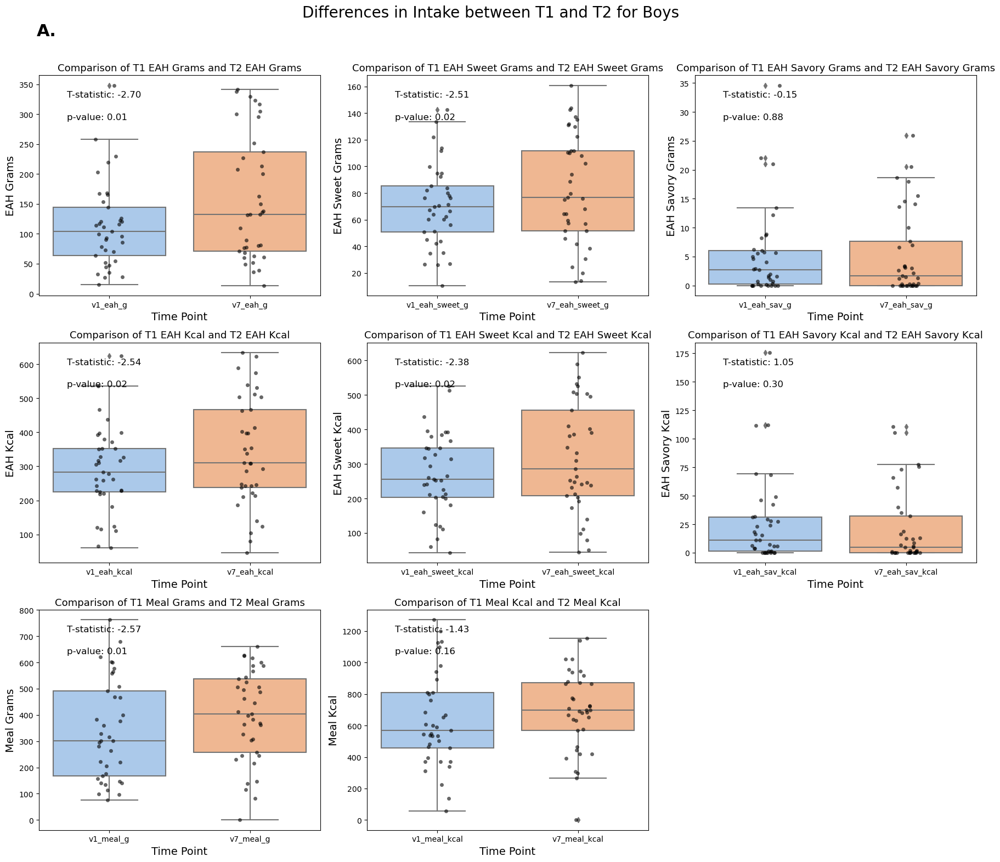

c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed

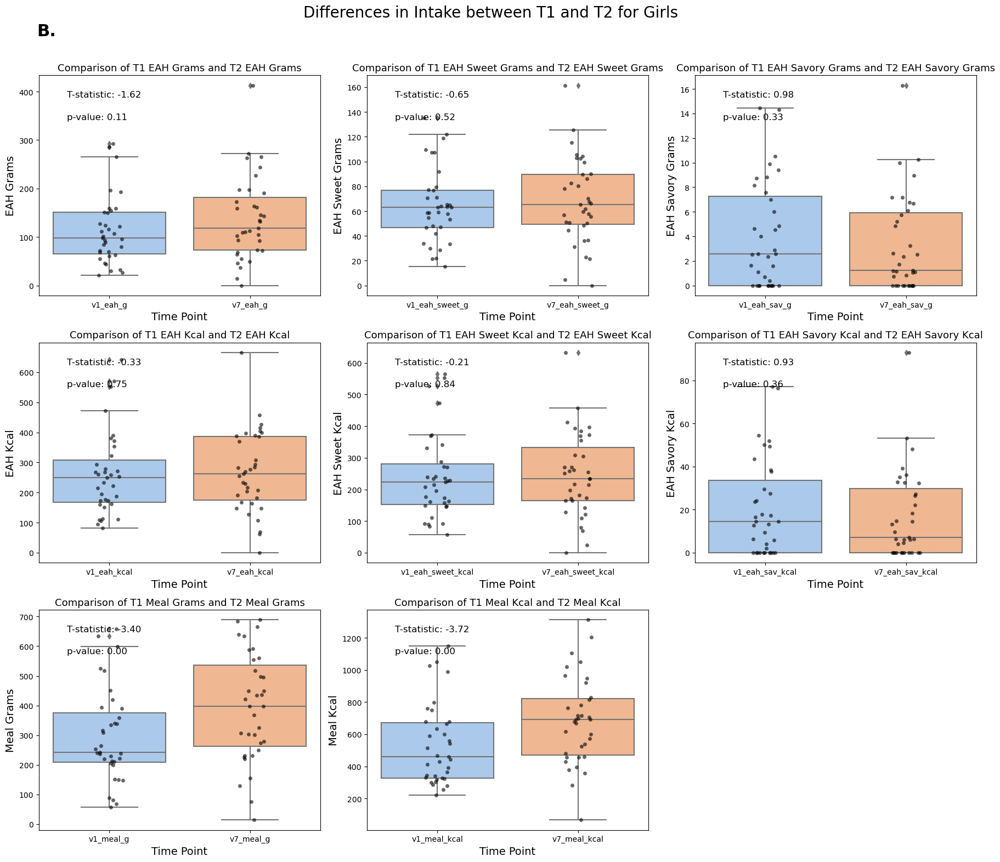

In [350]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_rel
import pandas as pd

df_intake = df.copy()

# Map sex to labels if not already done
df_intake['sex'] = df_intake['sex'].map({0: 'male', 1: 'female'})

# Filter data for boys and girls
df_boys = df_intake[df_intake['sex'] == 'male']
df_girls = df_intake[df_intake['sex'] == 'female']

# List of variables to plot
variables = [
    ('v1_eah_g', 'v7_eah_g'),
    ('v1_eah_sweet_g', 'v7_eah_sweet_g'),
    ('v1_eah_sav_g', 'v7_eah_sav_g'),
    ('v1_eah_kcal', 'v7_eah_kcal'),
    ('v1_eah_sweet_kcal', 'v7_eah_sweet_kcal'),
    ('v1_eah_sav_kcal', 'v7_eah_sav_kcal'),
    ('v1_meal_g', 'v7_meal_g'),
    ('v1_meal_kcal', 'v7_meal_kcal')
]

# Helper function to format variable names for labels
def format_label(label):
    label = label.replace('v1', 'T1').replace('v7', 'T2')
    label = label.replace('eah', 'EAH').replace('_sav', '_savory')
    label = label.replace('_g', ' grams').replace('_kcal', ' Kcal')
    label = label.replace('_', ' ').title()
    label = label.replace('Eah', 'EAH')  # Ensure 'EAH' is in all caps
    return label

def plot_comparison(df, sex_label, panel_label):
    # Set up the figure and axes for the plots
    fig, axs = plt.subplots(3, 3, figsize=(18, 16))
    fig.suptitle(f'Differences in Intake between T1 and T2 for {sex_label.capitalize()}', fontsize=20)

    # Plot each pair of variables and perform t-tests
    for i, (v1, v7) in enumerate(variables):
        # Prepare data for plotting
        melted_df = pd.melt(df[['sex', v1, v7]], id_vars='sex', value_vars=[v1, v7], var_name='variable')

        # Plot Baseline (v1) and Follow-up (v7)
        sns.boxplot(data=melted_df, x='variable', y='value', ax=axs[i//3, i%3], palette='pastel')
        sns.stripplot(data=melted_df, x='variable', y='value', ax=axs[i//3, i%3], color='black', jitter=True, alpha=0.6)
        axs[i//3, i%3].set_title(f'Comparison of {format_label(v1)} and {format_label(v7)}', fontsize=13)
        axs[i//3, i%3].set_xlabel('Time Point',fontsize=14)
        axs[i//3, i%3].set_ylabel(format_label(v1).replace('T1', '').strip(),fontsize=14)

        # Perform paired t-test
        t_stat, p_value = ttest_rel(df[v1], df[v7], nan_policy='omit')

        # Display the t-test results
        axs[i//3, i%3].text(0.1, 0.9, f'T-statistic: {t_stat:.2f}', transform=axs[i//3, i%3].transAxes, fontsize=12)
        axs[i//3, i%3].text(0.1, 0.8, f'p-value: {p_value:.2f}', transform=axs[i//3, i%3].transAxes, fontsize=12)

    # Leave the last subplot blank
    axs[2, 2].axis('off')

    # Add panel label (A. for boys and B. for girls)
    fig.text(0.05, 0.95, panel_label, fontsize=22, fontweight='bold', ha='center', va='center')

    # Adjust layout and show the plot
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Plot for boys with panel label A.
plot_comparison(df_boys, 'boys', 'A.')

# Plot for girls with panel label B.
plot_comparison(df_girls, 'girls', 'B.')


## T1 and T2 intake measures by sex

c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed

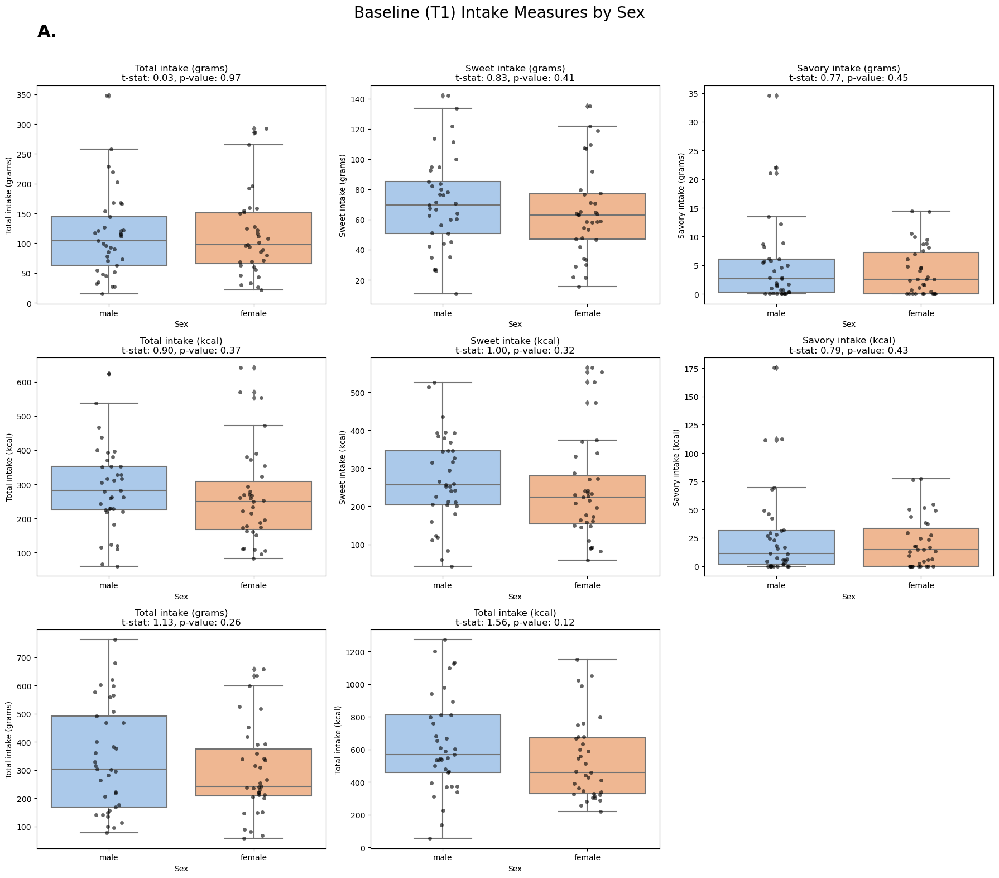

c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed

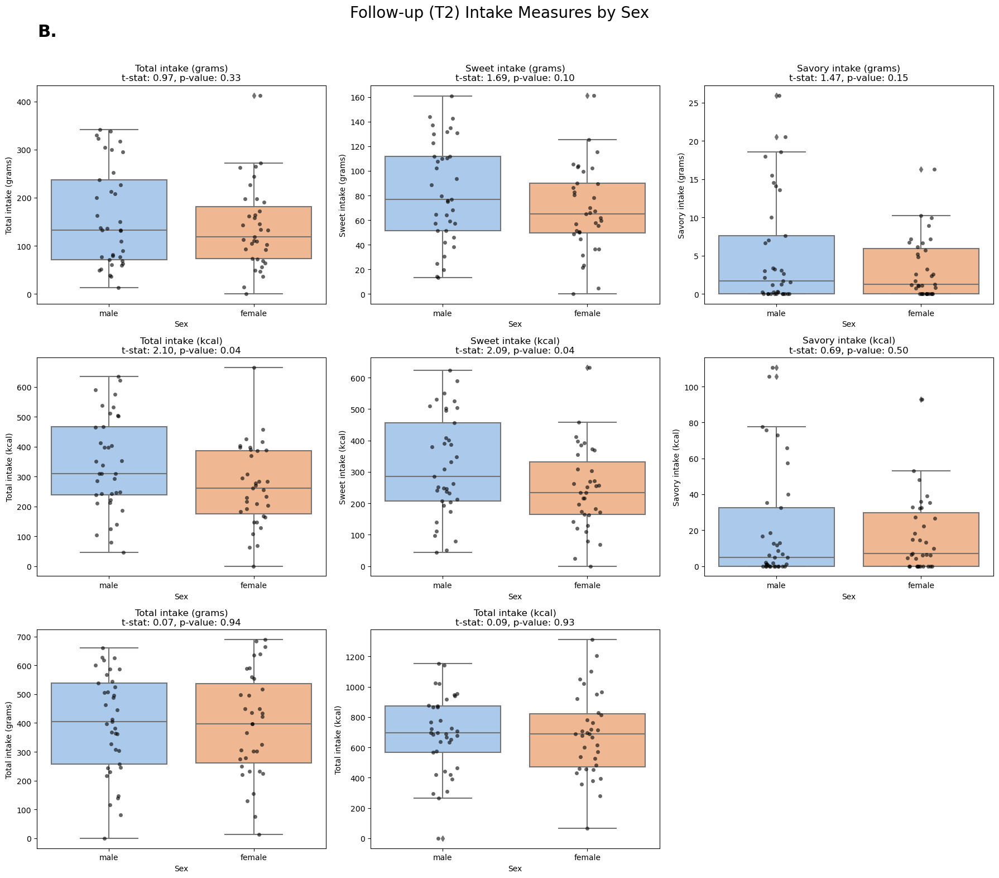

In [351]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
import pandas as pd

df_intake = df.copy()

# Map sex to labels if not already done
df_intake['sex'] = df_intake['sex'].map({0: 'male', 1: 'female'})

# List of baseline and follow-up variables grouped
baseline_vars = [
    'v1_eah_g', 'v1_eah_sweet_g', 'v1_eah_sav_g',
    'v1_eah_kcal', 'v1_eah_sweet_kcal', 'v1_eah_sav_kcal',
    'v1_meal_g', 'v1_meal_kcal'
]

followup_vars = [
    'v7_eah_g', 'v7_eah_sweet_g', 'v7_eah_sav_g',
    'v7_eah_kcal', 'v7_eah_sweet_kcal', 'v7_eah_sav_kcal',
    'v7_meal_g', 'v7_meal_kcal'
]

# Function to create descriptive labels for the variables
def get_label(var):
    if 'sweet' in var:
        type_ = "Sweet"
    elif 'sav' in var:
        type_ = "Savory"
    else:
        type_ = "Total"
    
    if 'kcal' in var:
        unit = "kcal"
    else:
        unit = "grams"
    
    return f'{type_} intake ({unit})'

# Set up the figure and axes for baseline variables
fig, axs = plt.subplots(3, 3, figsize=(18, 16))
fig.suptitle('Baseline (T1) Intake Measures by Sex', fontsize=20)

for i, var in enumerate(baseline_vars):
    # Prepare data for plotting
    melted_df = pd.melt(df_intake, id_vars='sex', value_vars=[var], var_name='variable', value_name='value')

    # Perform t-test
    t_stat, p_value = ttest_ind(df_intake[df_intake['sex'] == 'male'][var],
                                df_intake[df_intake['sex'] == 'female'][var], nan_policy='omit')

    # Plot by Sex
    sns.boxplot(data=melted_df, x='sex', y='value', ax=axs[i//3, i%3], palette='pastel')
    sns.stripplot(data=melted_df, x='sex', y='value', ax=axs[i//3, i%3], color='black', jitter=True, alpha=0.6)
    axs[i//3, i%3].set_title(f'{get_label(var)}\nt-stat: {t_stat:.2f}, p-value: {p_value:.2f}')
    axs[i//3, i%3].set_xlabel('Sex')
    axs[i//3, i%3].set_ylabel(get_label(var))

# Leave the last subplot blank
axs[2, 2].axis('off')

# Add panel label for Baseline (T1)
fig.text(0.05, 0.95, 'A.', fontsize=22, fontweight='bold', ha='center', va='center')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Set up the figure and axes for follow-up variables
fig, axs = plt.subplots(3, 3, figsize=(18, 16))
fig.suptitle('Follow-up (T2) Intake Measures by Sex', fontsize=20)

for i, var in enumerate(followup_vars):
    # Prepare data for plotting
    melted_df = pd.melt(df_intake, id_vars='sex', value_vars=[var], var_name='variable', value_name='value')

    # Perform t-test
    t_stat, p_value = ttest_ind(df_intake[df_intake['sex'] == 'male'][var],
                                df_intake[df_intake['sex'] == 'female'][var], nan_policy='omit')

    # Plot by Sex
    sns.boxplot(data=melted_df, x='sex', y='value', ax=axs[i//3, i%3], palette='pastel')
    sns.stripplot(data=melted_df, x='sex', y='value', ax=axs[i//3, i%3], color='black', jitter=True, alpha=0.6)
    axs[i//3, i%3].set_title(f'{get_label(var)}\nt-stat: {t_stat:.2f}, p-value: {p_value:.2f}')
    axs[i//3, i%3].set_xlabel('Sex')
    axs[i//3, i%3].set_ylabel(get_label(var))

# Leave the last subplot blank
axs[2, 2].axis('off')

# Add panel label for Follow-up (T2)
fig.text(0.05, 0.95, 'B.', fontsize=22, fontweight='bold', ha='center', va='center')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


## sex differences in FMI

c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed

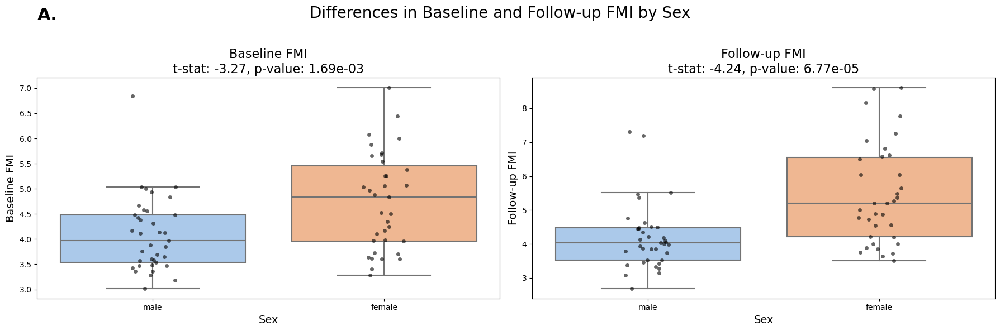

In [352]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# Assuming df_intake is the DataFrame containing the intake data
# Copy the dataframe for intake
df_intake = df.copy()

# Assuming 'sex' is a column in your DataFrame that represents gender information
# Map sex to labels if not already done
# Replace 'sex' with the actual column name if it's different
if 'sex' in df_intake:
    df_intake['sex'] = df_intake['sex'].map({0: 'male', 1: 'female'})

# Set up the figure and axes for the plots
fig, axs = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('Differences in Baseline and Follow-up FMI by Sex', fontsize=20)

# Plot 1: Baseline FMI (v1_FMI) by Sex without showing boxplot fliers
baseline_t_stat, baseline_p_value = ttest_ind(
    df_intake[df_intake['sex'] == 'male']['v1_FMI'],
    df_intake[df_intake['sex'] == 'female']['v1_FMI'],
    nan_policy='omit'
)
sns.boxplot(data=df_intake, x='sex', y='v1_FMI', ax=axs[0], palette='pastel', showfliers=False)
sns.stripplot(data=df_intake, x='sex', y='v1_FMI', ax=axs[0], color='black', jitter=True, alpha=0.6)
axs[0].set_title(f'Baseline FMI\nt-stat: {baseline_t_stat:.2f}, p-value: {baseline_p_value:.2e}', fontsize=16)
axs[0].set_xlabel('Sex', fontsize=14)
axs[0].set_ylabel('Baseline FMI', fontsize=14)

# Plot 2: Follow-up FMI (v7_FMI) by Sex without showing boxplot fliers
followup_t_stat, followup_p_value = ttest_ind(
    df_intake[df_intake['sex'] == 'male']['v7_FMI'],
    df_intake[df_intake['sex'] == 'female']['v7_FMI'],
    nan_policy='omit'
)
sns.boxplot(data=df_intake, x='sex', y='v7_FMI', ax=axs[1], palette='pastel', showfliers=False)
sns.stripplot(data=df_intake, x='sex', y='v7_FMI', ax=axs[1], color='black', jitter=True, alpha=0.6)
axs[1].set_title(f'Follow-up FMI\nt-stat: {followup_t_stat:.2f}, p-value: {followup_p_value:.2e}', fontsize=16)
axs[1].set_xlabel('Sex', fontsize=14)
axs[1].set_ylabel('Follow-up FMI', fontsize=14)
# Add panel label
fig.text(0.05, 0.95, 'A.', fontsize=22, fontweight='bold', ha='center', va='center')
# Adjust layout and show the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


## sex differences - change in FMI

c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


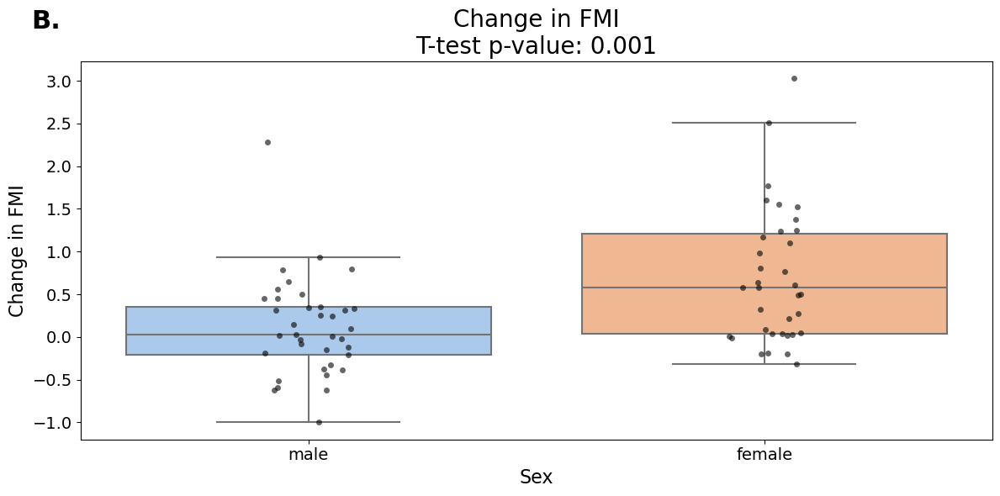

In [353]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# Assuming df_intake is the DataFrame containing the intake data
# Copy the dataframe for intake
df_intake = df.copy()

# Assuming 'sex' is a column in your DataFrame that represents gender information
# Map sex to labels if not already done
# Replace 'sex' with the actual column name if it's different
if 'sex' in df_intake:
    df_intake['sex'] = df_intake['sex'].map({0: 'male', 1: 'female'})

# Calculate change in FMI
df_intake['change_FMI'] = df_intake['v7_FMI'] - df_intake['v1_FMI']

# Perform T-test for the change in FMI between boys and girls
boys_change_FMI = df_intake[df_intake['sex'] == 'male']['change_FMI']
girls_change_FMI = df_intake[df_intake['sex'] == 'female']['change_FMI']
t_stat, p_value = ttest_ind(boys_change_FMI, girls_change_FMI)

# Set up the figure for the plot
fig, ax = plt.subplots(figsize=(12, 6))
ax.set_title(f'Change in FMI\nT-test p-value: {p_value:.3f}', fontsize=20)

# Plot: Change in FMI by Sex without showing boxplot fliers
sns.boxplot(data=df_intake, x='sex', y='change_FMI', palette='pastel', showfliers=False, ax=ax)
sns.stripplot(data=df_intake, x='sex', y='change_FMI', color='black', jitter=True, alpha=0.6, ax=ax)
ax.set_xlabel('Sex', fontsize=16)
ax.set_ylabel('Change in FMI', fontsize=16)

# Increase font size of tick labels
ax.tick_params(axis='both', which='major', labelsize=14)

# Add panel label
fig.text(0.05, 0.95, 'B.', fontsize=22, fontweight='bold', ha='center', va='center')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

## sex differences in BMI-z at T1 and T2

c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed

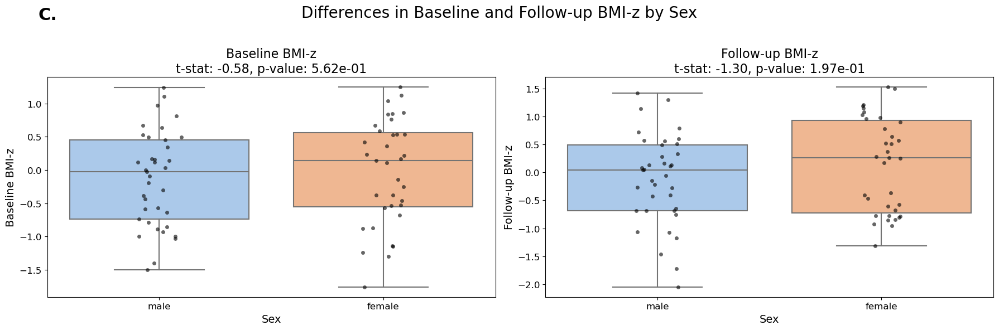

In [354]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# Assuming df_intake is the DataFrame containing the intake data
# Copy the dataframe for intake
df_intake = df.copy()

# Assuming 'sex' is a column in your DataFrame that represents gender information
# Map sex to labels if not already done
# Replace 'sex' with the actual column name if it's different
if 'sex' in df_intake:
    df_intake['sex'] = df_intake['sex'].map({0: 'male', 1: 'female'})

# Perform T-test for baseline BMI-z
baseline_t_stat, baseline_p_value = ttest_ind(
    df_intake[df_intake['sex'] == 'male']['bmi_z'],
    df_intake[df_intake['sex'] == 'female']['bmi_z'],
    nan_policy='omit'
)

# Perform T-test for follow-up BMI-z
followup_t_stat, followup_p_value = ttest_ind(
    df_intake[df_intake['sex'] == 'male']['v7_bmi_z'],
    df_intake[df_intake['sex'] == 'female']['v7_bmi_z'],
    nan_policy='omit'
)

# Set up the figure and axes for the plots
fig, axs = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('Differences in Baseline and Follow-up BMI-z by Sex', fontsize=20)

# Plot 1: Baseline BMI-z (bmi_z) by Sex without showing boxplot fliers
sns.boxplot(data=df_intake, x='sex', y='bmi_z', ax=axs[0], palette='pastel', showfliers=False)
sns.stripplot(data=df_intake, x='sex', y='bmi_z', ax=axs[0], color='black', jitter=True, alpha=0.6)
axs[0].set_title(f'Baseline BMI-z\nt-stat: {baseline_t_stat:.2f}, p-value: {baseline_p_value:.2e}', fontsize=16)
axs[0].set_xlabel('Sex', fontsize=14)
axs[0].set_ylabel('Baseline BMI-z', fontsize=14)

# Plot 2: Follow-up BMI-z (v7_bmi_z) by Sex without showing boxplot fliers
sns.boxplot(data=df_intake, x='sex', y='v7_bmi_z', ax=axs[1], palette='pastel', showfliers=False)
sns.stripplot(data=df_intake, x='sex', y='v7_bmi_z', ax=axs[1], color='black', jitter=True, alpha=0.6)
axs[1].set_title(f'Follow-up BMI-z\nt-stat: {followup_t_stat:.2f}, p-value: {followup_p_value:.2e}', fontsize=16)
axs[1].set_xlabel('Sex', fontsize=14)
axs[1].set_ylabel('Follow-up BMI-z', fontsize=14)

# Increase font size of tick labels
for ax in axs:
    ax.tick_params(axis='both', labelsize=12)

# Add panel label
fig.text(0.05, 0.95, 'C.', fontsize=22, fontweight='bold', ha='center', va='center')
# Adjust layout and show the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


# sex differences in Lean Mass Index

c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\ybr5070\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed

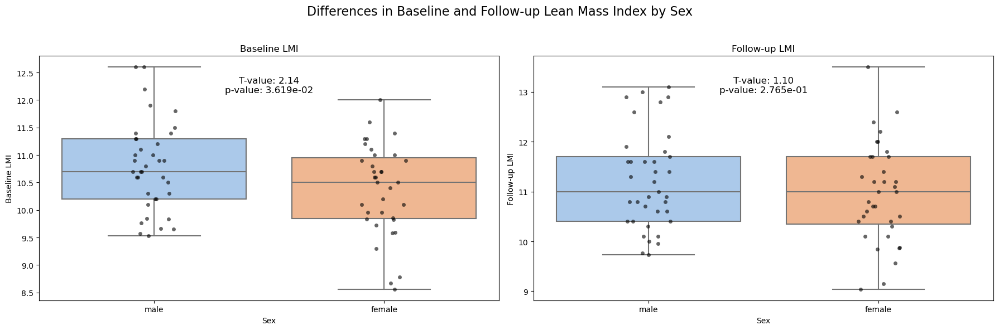

In [355]:

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# Sample data
import pandas as pd
import numpy as np

df_intake = df.copy()

# Map sex to labels if not already done
df_intake['sex'] = df_intake['sex'].map({0: 'male', 1: 'female'})

# Perform T-tests
t_stat_v1, p_value_v1 = ttest_ind(
    df_intake[df_intake['sex'] == 'male']['v1_LMI'],
    df_intake[df_intake['sex'] == 'female']['v1_LMI']
)

t_stat_v7, p_value_v7 = ttest_ind(
    df_intake[df_intake['sex'] == 'male']['v7_LMI'],
    df_intake[df_intake['sex'] == 'female']['v7_LMI']
)

# Set up the figure and axes for the plots
fig, axs = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('Differences in Baseline and Follow-up Lean Mass Index by Sex', fontsize=16)

# Plot 1: Baseline LMI (v1_LMI) by Sex
sns.boxplot(data=df_intake, x='sex', y='v1_LMI', ax=axs[0], palette='pastel')
sns.stripplot(data=df_intake, x='sex', y='v1_LMI', ax=axs[0], color='black', jitter=True, alpha=0.6)
axs[0].set_title('Baseline LMI')
axs[0].set_xlabel('Sex')
axs[0].set_ylabel('Baseline LMI')

# Annotate T-value and p-value
axs[0].annotate(f'T-value: {t_stat_v1:.2f}\np-value: {p_value_v1:.3e}', xy=(0.5, 0.85), xycoords='axes fraction', ha='center', fontsize=12, color='black')

# Plot 2: Follow-up LMI (v7_LMI) by Sex
sns.boxplot(data=df_intake, x='sex', y='v7_LMI', ax=axs[1], palette='pastel')
sns.stripplot(data=df_intake, x='sex', y='v7_LMI', ax=axs[1], color='black', jitter=True, alpha=0.6)
axs[1].set_title('Follow-up LMI')
axs[1].set_xlabel('Sex')
axs[1].set_ylabel('Follow-up LMI')

# Annotate T-value and p-value
axs[1].annotate(f'T-value: {t_stat_v7:.2f}\np-value: {p_value_v7:.3e}', xy=(0.5, 0.85), xycoords='axes fraction', ha='center', fontsize=12, color='black')

# Adjust layout and show the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


# Models by sex moderation

## meal or EAH_kcal:sex vs FMI

In [356]:
df_linear_reg =df.copy()
scale_cols=['v1_meal_g', 'v1_meal_kcal',
       'v1_eah_g', 'v1_eah_kcal', 'v1_eah_sweet_g', 'v1_eah_sweet_kcal',
       'v1_eah_sav_g', 'v1_eah_sav_kcal', 'v7_meal_g', 'v7_meal_kcal',
       'v7_eah_g', 'v7_eah_kcal', 'v7_eah_sweet_g', 'v7_eah_sweet_kcal',
       'v7_eah_sav_kcal', 'v7_eah_sav_g','age_diff','v1_FMI','v7_FMI']

# Initialize the scaler
scaler = StandardScaler()

# Scale the specified columns
scaled_values = scaler.fit_transform(df_linear_reg[scale_cols])

# Replace original columns with scaled values
df_linear_reg[scale_cols] = scaled_values

# Recoding the income column
df_linear_reg['income'] = df_linear_reg['income'].apply(lambda x: 0 if x in [0, 1, 2] else 1)

# Recoding the parent_ed column
df_linear_reg['parent_ed'] = df_linear_reg['parent_ed'].apply(lambda x: 0 if x in [0, 1, 2] else 1)

# One-hot encoding for v7_p_pds_imputed
tanner_dummies = pd.get_dummies(df_linear_reg['v7_p_pds_imputed'], prefix='v7_p_pds_imputed', drop_first=True)

# Rename the columns appropriately
tanner_dummies.columns = ['v7_p_pds_imputed_2', 'v7_p_pds_imputed_3']

# Drop the original column
df_linear_reg.drop(['v7_p_pds_imputed'], axis=1, inplace=True)

# Add the one-hot encoded columns back to the dataframe
df_linear_reg = pd.concat([df_linear_reg, tanner_dummies], axis=1)

# Assuming 'bool_col1' and 'bool_col2' are your boolean columns
df_linear_reg['v7_p_pds_imputed_2'] =df_linear_reg['v7_p_pds_imputed_2'].astype(int)
df_linear_reg['v7_p_pds_imputed_3'] = df_linear_reg['v7_p_pds_imputed_3'].astype(int)

# Map 'H' to 0 and 'AB' to 1 in the 'audio' column
df_linear_reg['Audio mode'] = df_linear_reg['Audio mode'].map({'H': 0, 'AB': 1})

In [357]:
df_linear_reg.head()

,id,item clean,Audio mode,v1_date,v7_date,bmi_screenout,parent_respondent,measured_parent,risk_status_mom,sex,age_yr,v7_age_yr,ethnicity,race,income,parent_ed,bmi,v7_bmi,bmi_percentile,v7_bmi_percentile,bmi_z,v7_bmi_z,v1_FMI,v7_FMI,pds_tanner_cat,v1_freddy_pre_meal,v1_freddy_pre_eah,v7_freddy_pre_meal,v7_freddy_pre_eah,v1_meal_g,v1_meal_kcal,v1_eah_g,v1_eah_kcal,v1_eah_sweet_g,v1_eah_sweet_kcal,v1_eah_sav_g,v1_eah_sav_kcal,v7_meal_g,v7_meal_kcal,v7_eah_g,v7_eah_kcal,v7_eah_sweet_g,v7_eah_sweet_kcal,v7_eah_sav_kcal,v7_eah_sav_g,age_diff,v1_vas_popcorn,v1_vas_pretzle,v1_vas_cornchip,v1_vas_cookie,v1_vas_brownie,v1_vas_starburst,v1_vas_skittle,v1_vas_hershey,v1_vas_icecream,v1_vas_pbj_sndwch,v1_vas_ham_sndwch,v1_vas_turkey_sndwch,v1_vas_cheese_sndwch,v1_vas_applesauce,v1_vas_potatoechip,v1_vas_babycarrot,v1_vash_oreo,v1_vas_milk,v1_vas_water,v7_vas_popcorn,v7_vas_pretzle,v7_vas_cornchip,v7_vas_cookie,v7_vas_brownie,v7_vas_starburst,v7_vas_skittle,v7_vas_hershey,v7_vas_icecream,v7_vas_pbj_sndwch,v7_vas_ham_sndwch,v7_vas_turkey_sndwch,v7_vas_cheese_sndwch,v7_vas_applesauce,v7_vas_potatoechip,v7_vas_babycarrot,v7_vas_oreo,v7_vas_milk,v7_vas_water,v1_sandw_sav_g,v1_sandw_sav_kcal,v7_sandw_sav_kcal,v7_sandw_sav_g,v1_consumed_pbj_sndwch_g,v1_consumed_pbj_sndwch_kcal,v7_consumed_pbj_sndwch_g,v7_consumed_pbj_sndwch_kcal,v1_LMI,v7_LMI,total_mvpa_avg,met_avg,percent_mvpa_avg,sedentary_avg,percent_sedentary_avg,sed_simple_avg,avg_wear_time,mvpa_simple_avg,v1_Savory,v7_Savory,v1_Sweet,v7_Sweet,v1_category_mean,v7_category_mean,v7_p_pds_imputed_2,v7_p_pds_imputed_3
0,1.0000000000,0,0,2018-01-31,2019-07-05,0,0,0,1,0,8.8400000000,10.2700000000,0,0,1,1,16.1300000000,15.9600000000,51.1600000000,33.2800000000,0.0300000000,-0.4300000000,-0.0314599169,-0.6809406948,1,80,135,44,120.0000000000,0.0575188852,0.6467367694,-0.7156322088,-0.3617101074,-0.2410901273,-0.3521731081,-0.2833409402,-0.2265861075,0.5324025206,0.3138049195,-0.9259199400,-0.6303602336,-0.4783814337,-0.5987149370,-0.0201786988,-0.1827724212,-0.1814190522,4,4,5,5,5,5,5,5,5,5,4,5,4,4,5,3,5,4,5,4,4,5,5,4,4,5,5,5,4,4,4,4,4,5,3,5,4,4,27.6700000000,62.3300000000,269.8100000000,127.2300000000,102.3800000000,353.2110000000,27.3000000000,94.2100000000,10.9000000000,11.0000000000,419.0400000000,2.2777655487,32.3300000000,675.4711820410,61.9666666700,608.3888889000,1023.6666666667,354.7222222222,4.3333333333,4.3333333333,5.0000000000,4.6666666667,5.0000000000,4.6666666667,0,0
1,2.0000000000,1,0,2018-02-19,2019-05-16,0,0,0,0,0,8.1400000000,9.3800000000,0,0,1,1,16.0800000000,16.0500000000,56.2900000000,44.1500000000,0.1600000000,-0.1500000000,-0.0977559368,-0.3378852666,1,19,103,1,114.0000000000,-1.1790764741,-1.9146986937,3.3866781646,0.0594860715,0.9057933757,1.0368977196,0.1736538876,0.1891870000,0.0512397391,0.1443151185,0.6763865478,-0.4225063558,-0.0229818950,-0.2750022863,-0.6701543553,-0.7011193954,-0.6541452683,5,5,5,5,5,5,5,5,5,5,5,5,5,4,5,5,5,3,5,5,5,5,5,5,5,5,5,5,5,4,5,5,5,5,4,5,4,5,0.0000000000,0.0000000000,336.0500000000,151.7500000000,0.0000000000,0.0000000000,2.2500000000,7.7600000000,10.6000000000,10.6000000000,485.0072463768,2.2823913043,35.3950000000,824.2391304391,58.5616666700,812.7777777833,1380.0000000000,484.0277777778,5.0000000000,5.0000000000,5.0000000000,5.0000000000,5.0000000000,5.0000000000,0,0
2,3.0000000000,0,0,2018-02-15,2019-09-11,0,0,0,0,1,8.3300000000,9.9000000000,0,0,1,1,14.5200000000,15.2600000000,18.8300000000,21.8700000000,-0.8800000000,-0.7800000000,-0.4955320565,-0.7612302631,1,37,86,19,120.0000000000,-0.6782303027,-0.6176048102,-0.2760218407,-0.1077779070,-0.0848027262,-0.2563590246,0.3951014721,0.4481882623,0.3084752211,0.0200002388,1.0029813785,0.5535472859,0.6146816101,0.6802753308,-0.5409604318,-0.5971089828,0.1669055280,5,4,4,4,5,4,5,5,5,2,3,3,2,4,4,3,5,3,4,5,4,4,5,5,3,4,5,5,3,4,4,4,4,5,4,5,5,4,35.4200000000,78.5800000000,324.1600000000,150.9100000000,1.8400000000,6.3480000000,0.8800000000,3.0400000000,9.8400000000,10.7000000000,473.9743470631,2.238

In [358]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_eah_kcal'] = df_linear_reg['v1_eah_kcal'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_EAHkcal_FMI_sex = smf.ols('v7_FMI ~ v1_FMI + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff + v1_eah_kcal * sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_EAHkcal_FMI_sex.summary())


                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.852
Model:                            OLS   Adj. R-squared:                  0.827
Method:                 Least Squares   F-statistic:                     35.02
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.41e-21
Time:                        15:37:21   Log-Likelihood:                -33.469
No. Observations:                  72   AIC:                             88.94
Df Residuals:                      61   BIC:                             114.0
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.2741      0

In [359]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_eah_sweet_kcal'] = df_linear_reg['v1_eah_sweet_kcal'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_EAHsweetkcal_FMI_sex = smf.ols('v7_FMI ~ v1_FMI + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff + v1_eah_sweet_kcal * sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_EAHsweetkcal_FMI_sex.summary())



                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.853
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     35.37
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.09e-21
Time:                        15:37:21   Log-Likelihood:                -33.163
No. Observations:                  72   AIC:                             88.33
Df Residuals:                      61   BIC:                             113.4
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 0.26

In [360]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_eah_sav_kcal'] = df_linear_reg['v1_eah_sav_kcal'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_EAHsavkcal_FMI_sex = smf.ols('v7_FMI ~ v1_FMI + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff + v1_eah_sav_kcal * sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_EAHsavkcal_FMI_sex.summary())


                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     30.26
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           5.48e-20
Time:                        15:37:21   Log-Likelihood:                -37.897
No. Observations:                  72   AIC:                             97.79
Df Residuals:                      61   BIC:                             122.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               0.2864    

In [361]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_meal_kcal'] = df_linear_reg['v1_meal_kcal'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_mealkcal_FMI_sex = smf.ols('v7_FMI ~ v1_FMI + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff + v1_meal_kcal * sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_mealkcal_FMI_sex.summary())



                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.840
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     31.95
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.41e-20
Time:                        15:37:21   Log-Likelihood:                -36.258
No. Observations:                  72   AIC:                             94.52
Df Residuals:                      61   BIC:                             119.6
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.2638      0

## meal or EAH_g:sex vs FMI

In [362]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_meal_g'] = df_linear_reg['v1_meal_g'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_mealg_FMI_sex = smf.ols('v7_FMI ~ v1_FMI + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff + v1_meal_g * sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_mealg_FMI_sex.summary())


                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.837
Model:                            OLS   Adj. R-squared:                  0.810
Method:                 Least Squares   F-statistic:                     31.31
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           2.34e-20
Time:                        15:37:21   Log-Likelihood:                -36.868
No. Observations:                  72   AIC:                             95.74
Df Residuals:                      61   BIC:                             120.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.2296      0

In [363]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_eah_g'] = df_linear_reg['v1_eah_g'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_EAHg_FMI_sex = smf.ols('v7_FMI ~ v1_FMI + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff + v1_eah_g * sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_EAHg_FMI_sex.summary())


                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.843
Model:                            OLS   Adj. R-squared:                  0.817
Method:                 Least Squares   F-statistic:                     32.76
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           7.56e-21
Time:                        15:37:21   Log-Likelihood:                -35.501
No. Observations:                  72   AIC:                             93.00
Df Residuals:                      61   BIC:                             118.0
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.2827      0

In [364]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_eah_sweet_g'] = df_linear_reg['v1_eah_sweet_g'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_EAHsweetg_FMI_sex = smf.ols('v7_FMI ~ v1_FMI + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff+v1_eah_sweet_g * sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_EAHsweetg_FMI_sex.summary())


                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.836
Method:                 Least Squares   F-statistic:                     37.30
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           2.80e-22
Time:                        15:37:21   Log-Likelihood:                -31.522
No. Observations:                  72   AIC:                             85.04
Df Residuals:                      61   BIC:                             110.1
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.2379      0

In [365]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_eah_sav_g'] = df_linear_reg['v1_eah_sav_g'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_EAHsavg_FMI_sex = smf.ols('v7_FMI ~ v1_FMI + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff+v1_eah_sav_g * sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_EAHsavg_FMI_sex.summary())


                            OLS Regression Results                            
Dep. Variable:                 v7_FMI   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     30.26
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           5.48e-20
Time:                        15:37:21   Log-Likelihood:                -37.898
No. Observations:                  72   AIC:                             97.80
Df Residuals:                      61   BIC:                             122.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.2877      0

## Meal or EAH_kcal : sex vs BMIz

In [366]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_meal_kcal'] = df_linear_reg['v1_meal_kcal'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_mealkcal_bmiz_sex = smf.ols('v7_bmi_z ~ bmi_z + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff + v1_meal_kcal* sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_mealkcal_bmiz_sex.summary())


                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.854
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     35.61
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           9.19e-22
Time:                        15:37:21   Log-Likelihood:                -19.067
No. Observations:                  72   AIC:                             60.13
Df Residuals:                      61   BIC:                             85.18
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.4374      0

In [367]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_eah_kcal'] = df_linear_reg['v1_eah_kcal'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_EAHkcal_bmiz_sex= smf.ols('v7_bmi_z ~ bmi_z + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff + v1_eah_kcal * sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_EAHkcal_bmiz_sex.summary())


                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.857
Model:                            OLS   Adj. R-squared:                  0.833
Method:                 Least Squares   F-statistic:                     36.43
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           5.12e-22
Time:                        15:37:21   Log-Likelihood:                -18.361
No. Observations:                  72   AIC:                             58.72
Df Residuals:                      61   BIC:                             83.77
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.4626      0

In [368]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_eah_sweet_kcal'] = df_linear_reg['v1_eah_sweet_kcal'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_EAHsweetkcal_bmiz_sex = smf.ols('v7_bmi_z ~ bmi_z + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff + v1_eah_sweet_kcal * sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_EAHsweetkcal_bmiz_sex.summary())


                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.857
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     36.57
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           4.65e-22
Time:                        15:37:21   Log-Likelihood:                -18.246
No. Observations:                  72   AIC:                             58.49
Df Residuals:                      61   BIC:                             83.54
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 0.46

In [369]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_eah_sav_kcal'] = df_linear_reg['v1_eah_sav_kcal'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_EAHsavkcal_bmiz_sex  = smf.ols('v7_bmi_z ~ bmi_z + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff + v1_eah_sav_kcal * sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_EAHsavkcal_bmiz_sex .summary())


                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.852
Model:                            OLS   Adj. R-squared:                  0.828
Method:                 Least Squares   F-statistic:                     35.25
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.19e-21
Time:                        15:37:21   Log-Likelihood:                -19.376
No. Observations:                  72   AIC:                             60.75
Df Residuals:                      61   BIC:                             85.80
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               0.4689    

## Meal_g or EAH_g : sex vs BMIz

In [370]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_meal_g'] = df_linear_reg['v1_meal_g'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_mealg_bmiz_sex = smf.ols('v7_bmi_z ~ bmi_z + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff + v1_meal_g * sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_mealg_bmiz_sex.summary())


                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.854
Model:                            OLS   Adj. R-squared:                  0.831
Method:                 Least Squares   F-statistic:                     35.79
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           8.05e-22
Time:                        15:37:22   Log-Likelihood:                -18.908
No. Observations:                  72   AIC:                             59.82
Df Residuals:                      61   BIC:                             84.86
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.4190      0

In [371]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_eah_g'] = df_linear_reg['v1_eah_g'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_EAHg_bmiz_sex  = smf.ols('v7_bmi_z ~ bmi_z + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff+v1_eah_g* sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_EAHg_bmiz_sex.summary())


                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.837
Method:                 Least Squares   F-statistic:                     37.36
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           2.69e-22
Time:                        15:37:22   Log-Likelihood:                -17.585
No. Observations:                  72   AIC:                             57.17
Df Residuals:                      61   BIC:                             82.21
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.4716      0

In [372]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_eah_sweet_g'] = df_linear_reg['v1_eah_sweet_g'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_EAHsweetg_bmiz_sex = smf.ols('v7_bmi_z ~ bmi_z + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff+v1_eah_sweet_g* sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_EAHsweetg_bmiz_sex.summary())


                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.837
Method:                 Least Squares   F-statistic:                     37.36
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           2.69e-22
Time:                        15:37:22   Log-Likelihood:                -17.587
No. Observations:                  72   AIC:                             57.17
Df Residuals:                      61   BIC:                             82.22
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.4415      0

In [373]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Create an interaction term between 'v1_eah_kcal' and 'sex'
df_linear_reg['interaction_eah_sav_g'] = df_linear_reg['v1_eah_sav_g'] * df_linear_reg['sex']

# Fit the regression model with the interaction term and other covariates
model_EAHsavg_bmiz_sex= smf.ols('v7_bmi_z ~ bmi_z + risk_status_mom + income + parent_ed + v7_p_pds_imputed_2 + v7_p_pds_imputed_3 + age_diff+ v1_eah_sav_g* sex', data=df_linear_reg).fit()

# Print the summary of the model to see the interaction effect
print(model_EAHsavg_bmiz_sex.summary())


                            OLS Regression Results                            
Dep. Variable:               v7_bmi_z   R-squared:                       0.853
Model:                            OLS   Adj. R-squared:                  0.828
Method:                 Least Squares   F-statistic:                     35.28
Date:                Thu, 05 Sep 2024   Prob (F-statistic):           1.17e-21
Time:                        15:37:22   Log-Likelihood:                -19.353
No. Observations:                  72   AIC:                             60.71
Df Residuals:                      61   BIC:                             85.75
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.4667      0

In [374]:
import statsmodels.api as sm
import pandas as pd

# Assuming your models are stored in variables like model_mealkcal_FMI_sex, model_EAHkcal_FMI_sex, etc.
model_names = [
    'model_mealkcal_FMI_sex', 'model_EAHkcal_FMI_sex', 'model_EAHsweetkcal_FMI_sex', 'model_EAHsavkcal_FMI_sex',
    'model_mealg_FMI_sex', 'model_EAHg_FMI_sex', 'model_EAHsweetg_FMI_sex', 'model_EAHsavg_FMI_sex',
    'model_mealkcal_bmiz_sex', 'model_EAHkcal_bmiz_sex', 'model_EAHsweetkcal_bmiz_sex', 'model_EAHsavkcal_bmiz_sex',
    'model_mealg_bmiz_sex', 'model_EAHg_bmiz_sex', 'model_EAHsweetg_bmiz_sex', 'model_EAHsavg_bmiz_sex'
]

models = [
    model_mealkcal_FMI_sex, model_EAHkcal_FMI_sex, model_EAHsweetkcal_FMI_sex, model_EAHsavkcal_FMI_sex,
    model_mealg_FMI_sex, model_EAHg_FMI_sex, model_EAHsweetg_FMI_sex, model_EAHsavg_FMI_sex,
    model_mealkcal_bmiz_sex, model_EAHkcal_bmiz_sex, model_EAHsweetkcal_bmiz_sex, model_EAHsavkcal_bmiz_sex,
    model_mealg_bmiz_sex, model_EAHg_bmiz_sex, model_EAHsweetg_bmiz_sex, model_EAHsavg_bmiz_sex
]

# Extracting the beta, SE, t-value, p-value, and confidence interval for the last parameter in each model
results = []
for model_name, model in zip(model_names, models):
    params = model.params
    pvalues = model.pvalues
    conf = model.conf_int(alpha=0.05)  # 95% CI
    se = model.bse  # Standard errors
    tvalues = model.tvalues  # t-values
    last_param = params.index[-1]  # Get the last parameter
    
    beta = params[last_param]
    p_value = pvalues[last_param]
    ci_lower, ci_upper = conf.loc[last_param]
    standard_error = se[last_param]
    t_value = tvalues[last_param]
    
    results.append({
        'Model Name': model_name,
        'Parameter': last_param,
        'Beta': f"{beta:.2f}",
        'SE': f"{standard_error:.2f}",
        't-value': f"{t_value:.2f}",
        'p-value': f"{p_value:.2f}",
        '95% CI': f"[{ci_lower:.2f}, {ci_upper:.2f}]"
    })

df_results_sex = pd.DataFrame(results)

# Save the DataFrame to a CSV file
df_results_sex.to_csv('sex_models.csv', index=False)


C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\1330424039.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_value = model.pvalues[-1]  # Assuming the last parameter is the one of interest
C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\1330424039.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta_value = model.params[-1]  # Assuming the last parameter is the one of interest


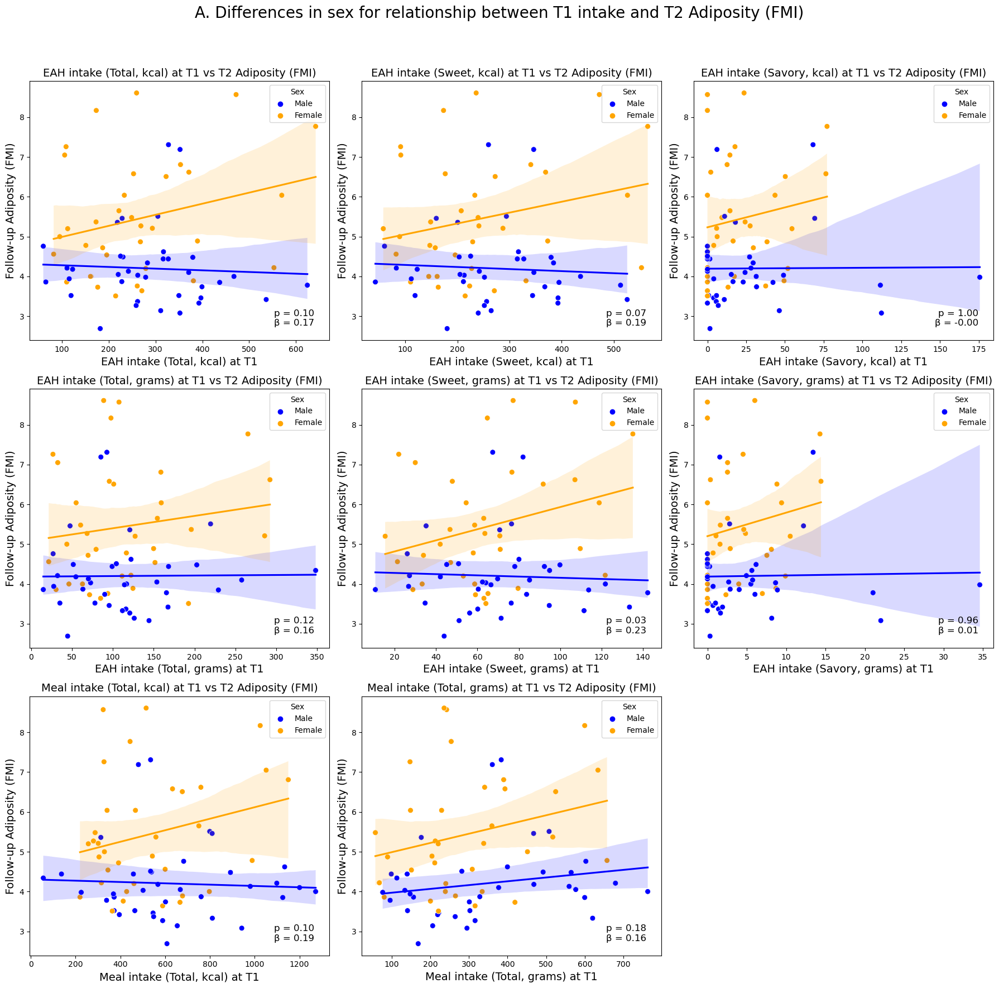

In [375]:
# Copy the dataframe for modifications
df_intake = df.copy()

# Map the sex column to 'Male' and 'Female'
df_intake['sex'] = df_intake['sex'].map({0: 'Male', 1: 'Female'})

# Define the models related to FMI and kcal/g variables in the specified order
models_fmi_kcal = [
    model_EAHkcal_FMI_sex,
    model_EAHsweetkcal_FMI_sex,
    model_EAHsavkcal_FMI_sex,
    model_EAHg_FMI_sex,
    model_EAHsweetg_FMI_sex,
    model_EAHsavg_FMI_sex,
    model_mealkcal_FMI_sex,
    model_mealg_FMI_sex
]

# Extract p-values and beta values for the last parameter in each model
p_values_fmi = []
beta_values_fmi = []

for model in models_fmi_kcal:
    p_value = model.pvalues[-1]  # Assuming the last parameter is the one of interest
    beta_value = model.params[-1]  # Assuming the last parameter is the one of interest
    p_values_fmi.append(p_value)
    beta_values_fmi.append(beta_value)

# Define the EAH intake variables and meal variables in the specified order
eah_intake_vars = [
    'v1_eah_kcal',
    'v1_eah_sweet_kcal',
    'v1_eah_sav_kcal',
    'v1_eah_g',
    'v1_eah_sweet_g',
    'v1_eah_sav_g',
    'v1_meal_kcal',
    'v1_meal_g'
]

# Function to create descriptive labels for the variables
def get_x_label(var):
    if 'eah' in var:
        base = "EAH"
    else:
        base = "Meal"
    
    if 'sweet' in var:
        type_ = "Sweet"
    elif 'sav' in var:
        type_ = "Savory"
    else:
        type_ = "Total"
        
    if 'kcal' in var:
        unit = "kcal"
    else:
        unit = "grams"
    
    return f'{base} intake ({type_}, {unit}) at T1'

# Define a consistent palette
palette = {'Male': 'blue', 'Female': 'orange'}

# Plot: T1 intake vs. T2 Adiposity (FMI)
fig, axs = plt.subplots(3, 3, figsize=(18, 18))
# Add 'B' to the main plot title
fig.suptitle('A. Differences in sex for relationship between T1 intake and T2 Adiposity (FMI)', fontsize=20)
axs = axs.flatten()

for i, (eah_var, p_value, beta_value) in enumerate(zip(eah_intake_vars, p_values_fmi, beta_values_fmi)):
    scatter = sns.scatterplot(
        data=df_intake,
        x=eah_var,
        y='v7_FMI',
        hue='sex',
        ax=axs[i],
        palette=palette,
        s=50  # Control the size of scatter plot points, which will also apply to the legend
    )
    sns.regplot(
        data=df_intake[df_intake['sex'] == 'Male'],
        x=eah_var,
        y='v7_FMI',
        ax=axs[i],
        scatter=False,
        color='blue'
    )
    sns.regplot(
        data=df_intake[df_intake['sex'] == 'Female'],
        x=eah_var,
        y='v7_FMI',
        ax=axs[i],
        scatter=False,
        color='orange'
    )
    axs[i].set_title(f'{get_x_label(eah_var)} vs T2 Adiposity (FMI)', fontsize=14)
    axs[i].set_xlabel(get_x_label(eah_var), fontsize=14)
    axs[i].set_ylabel('Follow-up Adiposity (FMI)', fontsize=14)
    axs[i].annotate(f'p = {p_value:.2f}\nβ = {beta_value:.2f}', xy=(0.95, 0.05), xycoords='axes fraction', fontsize=12,
                    horizontalalignment='right', verticalalignment='bottom')

    handles, labels = scatter.get_legend_handles_labels()  # Automatically get the legend elements
    axs[i].legend(title='Sex', handles=handles, labels=labels, loc='upper right', markerscale=1, ncol=1)  # Place legend in top-right corner

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\3208202453.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_value = model.pvalues[-1]  # Assuming the last parameter is the one of interest
C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\3208202453.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta_value = model.params[-1]  # Assuming the last parameter is the one of interest


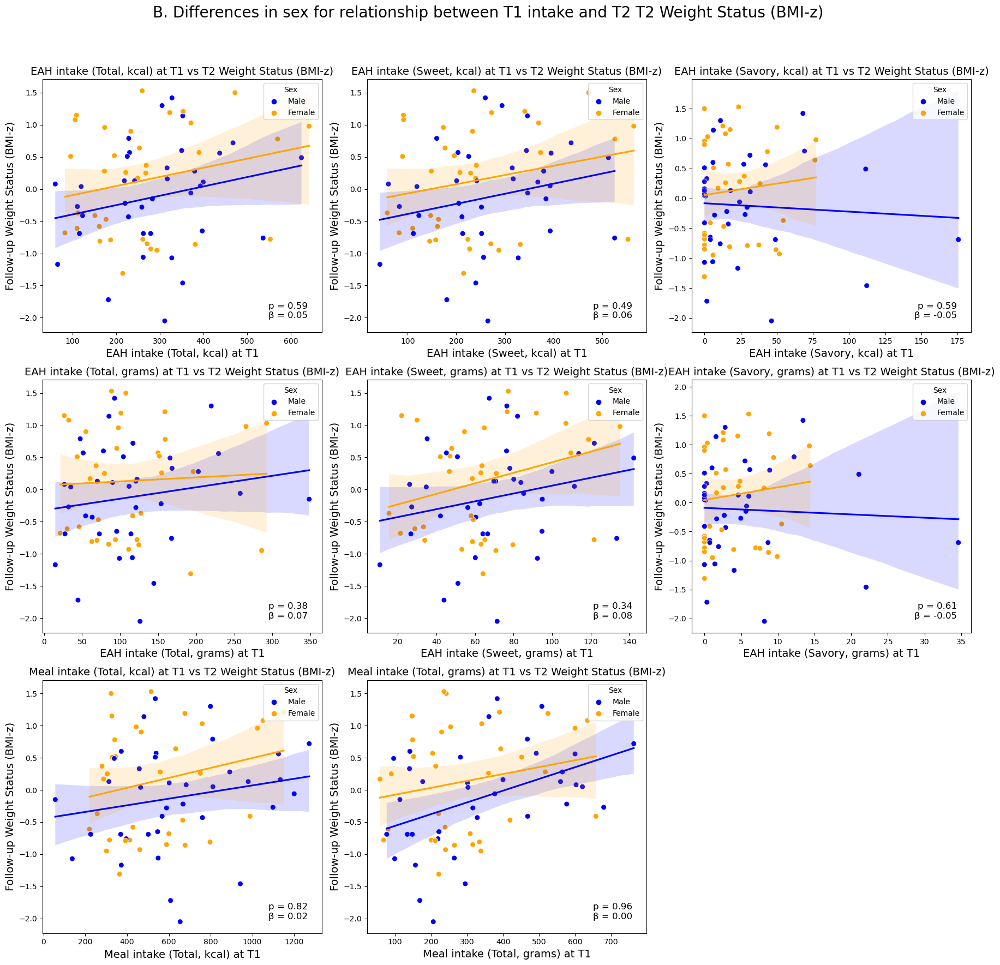

In [376]:
# Copy the dataframe for modifications
df_intake = df.copy()

# Map the sex column to 'Male' and 'Female'
df_intake['sex'] = df_intake['sex'].map({0: 'Male', 1: 'Female'})

# Define the models related to BMI-z and kcal/g variables in the specified order
models_bmiz_kcal = [
    model_EAHkcal_bmiz_sex,
    model_EAHsweetkcal_bmiz_sex,
    model_EAHsavkcal_bmiz_sex,
    model_EAHg_bmiz_sex,
    model_EAHsweetg_bmiz_sex,
    model_EAHsavg_bmiz_sex,
    model_mealkcal_bmiz_sex,
    model_mealg_bmiz_sex
]

# Extract p-values and beta values for the last parameter in each model
p_values_bmiz = []
beta_values_bmiz = []

for model in models_bmiz_kcal:
    p_value = model.pvalues[-1]  # Assuming the last parameter is the one of interest
    beta_value = model.params[-1]  # Assuming the last parameter is the one of interest
    p_values_bmiz.append(p_value)
    beta_values_bmiz.append(beta_value)

# Define the EAH intake variables and meal variables in the specified order
eah_intake_vars = [
    'v1_eah_kcal',
    'v1_eah_sweet_kcal',
    'v1_eah_sav_kcal',
    'v1_eah_g',
    'v1_eah_sweet_g',
    'v1_eah_sav_g',
    'v1_meal_kcal',
    'v1_meal_g'
]

# Function to create descriptive labels for the variables
def get_x_label(var):
    if 'eah' in var:
        base = "EAH"
    else:
        base = "Meal"
    
    if 'sweet' in var:
        type_ = "Sweet"
    elif 'sav' in var:
        type_ = "Savory"
    else:
        type_ = "Total"
        
    if 'kcal' in var:
        unit = "kcal"
    else:
        unit = "grams"
    
    return f'{base} intake ({type_}, {unit}) at T1'

# Define a consistent palette
palette = {'Male': 'blue', 'Female': 'orange'}

# Plot: T1 intake vs. T2 T2 Weight Status (BMI-z)
fig, axs = plt.subplots(3, 3, figsize=(18, 18))
# Add 'B' to the main plot title
fig.suptitle('B. Differences in sex for relationship between T1 intake and T2 T2 Weight Status (BMI-z)', fontsize=20)
axs = axs.flatten()

for i, (eah_var, p_value, beta_value) in enumerate(zip(eah_intake_vars, p_values_bmiz, beta_values_bmiz)):
    scatter = sns.scatterplot(
        data=df_intake,
        x=eah_var,
        y='v7_bmi_z',
        hue='sex',
        ax=axs[i],
        palette=palette,
        s=50  # Control the size of scatter plot points, which will also apply to the legend
    )
    sns.regplot(
        data=df_intake[df_intake['sex'] == 'Male'],
        x=eah_var,
        y='v7_bmi_z',
        ax=axs[i],
        scatter=False,
        color='blue'
    )
    sns.regplot(
        data=df_intake[df_intake['sex'] == 'Female'],
        x=eah_var,
        y='v7_bmi_z',
        ax=axs[i],
        scatter=False,
        color='orange'
    )
    axs[i].set_title(f'{get_x_label(eah_var)} vs T2 Weight Status (BMI-z)', fontsize=14)
    axs[i].set_xlabel(get_x_label(eah_var), fontsize=14)
    axs[i].set_ylabel('Follow-up Weight Status (BMI-z)', fontsize=14)
    axs[i].annotate(f'p = {p_value:.2f}\nβ = {beta_value:.2f}', xy=(0.95, 0.05), xycoords='axes fraction', fontsize=12,
                    horizontalalignment='right', verticalalignment='bottom')

    handles, labels = scatter.get_legend_handles_labels()  # Automatically get the legend elements
    axs[i].legend(title='Sex', handles=handles, labels=labels, loc='upper right', markerscale=1, ncol=1)  # Place legend in top-right corner

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\74160095.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_value = model.pvalues[-1]  # Assuming the last parameter is the one of interest
C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\74160095.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta_value = model.params[-1]  # Assuming the last parameter is the one of interest


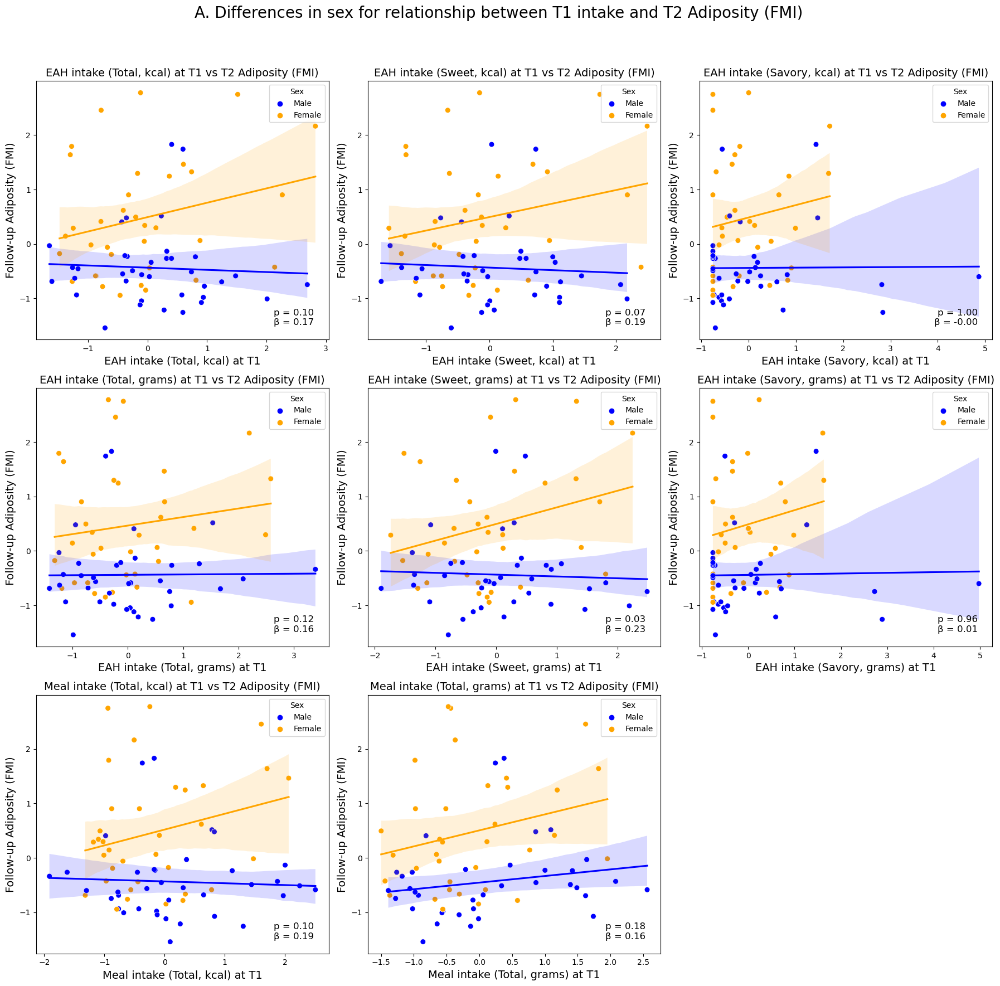

In [377]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Copy the dataframe for modifications
df_linear_reg_copy = df_linear_reg.copy()

# Map the sex column to 'Male' and 'Female'
df_linear_reg_copy['sex'] = df_linear_reg_copy['sex'].map({0: 'Male', 1: 'Female'})

# Define the models related to FMI and kcal/g variables in the specified order
models_fmi_kcal = [
    model_EAHkcal_FMI_sex,
    model_EAHsweetkcal_FMI_sex,
    model_EAHsavkcal_FMI_sex,
    model_EAHg_FMI_sex,
    model_EAHsweetg_FMI_sex,
    model_EAHsavg_FMI_sex,
    model_mealkcal_FMI_sex,
    model_mealg_FMI_sex
]

# Extract p-values and beta values for the last parameter in each model
p_values_fmi = []
beta_values_fmi = []

for model in models_fmi_kcal:
    p_value = model.pvalues[-1]  # Assuming the last parameter is the one of interest
    beta_value = model.params[-1]  # Assuming the last parameter is the one of interest
    p_values_fmi.append(p_value)
    beta_values_fmi.append(beta_value)

# Define the EAH intake variables and meal variables in the specified order
eah_intake_vars = [
    'v1_eah_kcal',
    'v1_eah_sweet_kcal',
    'v1_eah_sav_kcal',
    'v1_eah_g',
    'v1_eah_sweet_g',
    'v1_eah_sav_g',
    'v1_meal_kcal',
    'v1_meal_g'
]

# Function to create descriptive labels for the variables
def get_x_label(var):
    if 'eah' in var:
        base = "EAH"
    else:
        base = "Meal"
    
    if 'sweet' in var:
        type_ = "Sweet"
    elif 'sav' in var:
        type_ = "Savory"
    else:
        type_ = "Total"
        
    if 'kcal' in var:
        unit = "kcal"
    else:
        unit = "grams"
    
    return f'{base} intake ({type_}, {unit}) at T1'

# Define a consistent palette
palette = {'Male': 'blue', 'Female': 'orange'}

# Plot: T1 intake vs. T2 Adiposity (FMI)
fig, axs = plt.subplots(3, 3, figsize=(18, 18))
# Add 'A' to the main plot title
fig.suptitle('A. Differences in sex for relationship between T1 intake and T2 Adiposity (FMI)', fontsize=20)
axs = axs.flatten()

for i, (eah_var, p_value, beta_value) in enumerate(zip(eah_intake_vars, p_values_fmi, beta_values_fmi)):
    scatter = sns.scatterplot(
        data=df_linear_reg_copy,
        x=eah_var,
        y='v7_FMI',
        hue='sex',
        ax=axs[i],
        palette=palette,
        s=50  # Control the size of scatter plot points, which will also apply to the legend
    )
    sns.regplot(
        data=df_linear_reg_copy[df_linear_reg_copy['sex'] == 'Male'],
        x=eah_var,
        y='v7_FMI',
        ax=axs[i],
        scatter=False,
        color='blue'
    )
    sns.regplot(
        data=df_linear_reg_copy[df_linear_reg_copy['sex'] == 'Female'],
        x=eah_var,
        y='v7_FMI',
        ax=axs[i],
        scatter=False,
        color='orange'
    )
    axs[i].set_title(f'{get_x_label(eah_var)} vs T2 Adiposity (FMI)', fontsize=14)
    axs[i].set_xlabel(get_x_label(eah_var), fontsize=14)
    axs[i].set_ylabel('Follow-up Adiposity (FMI)', fontsize=14)
    axs[i].annotate(f'p = {p_value:.2f}\nβ = {beta_value:.2f}', xy=(0.95, 0.05), xycoords='axes fraction', fontsize=12,
                    horizontalalignment='right', verticalalignment='bottom')

    handles, labels = scatter.get_legend_handles_labels()
    labels = ['Male', 'Female']  # Update labels to 'Male' and 'Female'
    axs[i].legend(title='Sex', handles=handles, labels=labels, loc='upper right', markerscale=1, ncol=1)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\305696048.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_value = model.pvalues[-1]  # Assuming the last parameter is the one of interest
C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\305696048.py:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta_value = model.params[-1]  # Assuming the last parameter is the one of interest


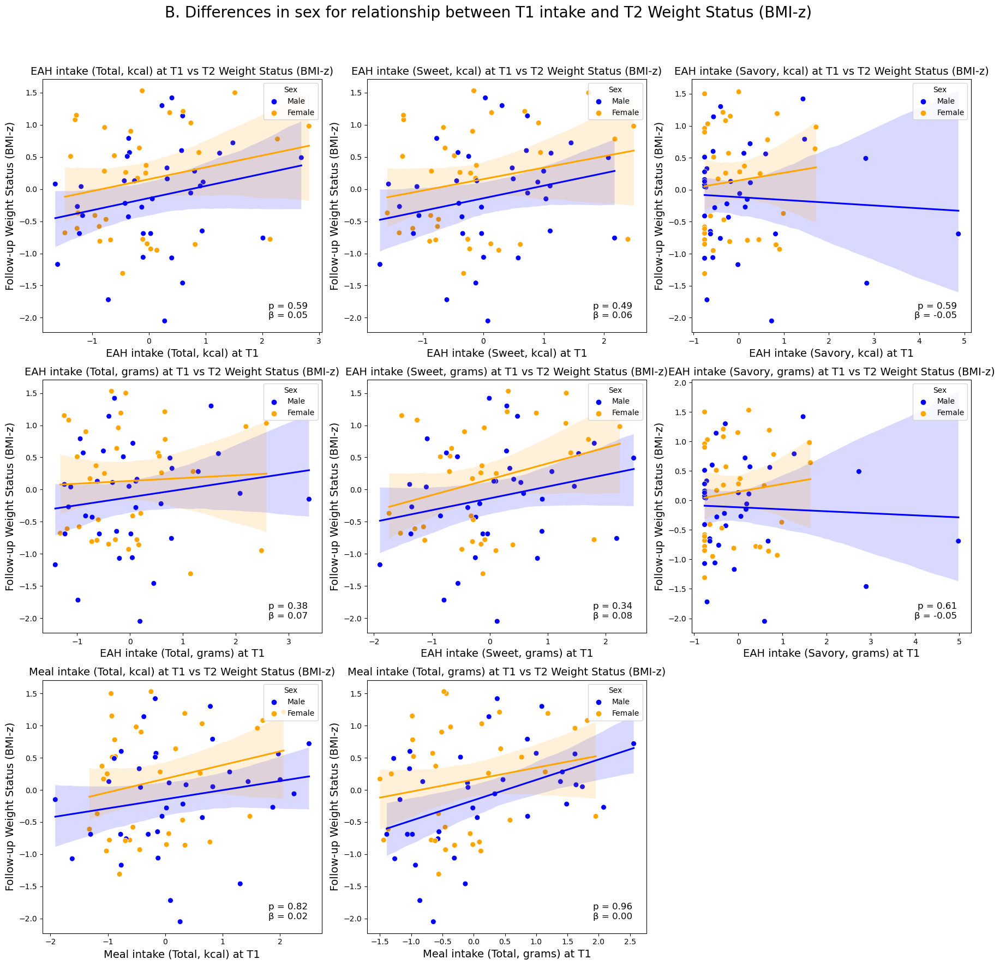

In [378]:
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

# Copy the dataframe for modifications
df_linear_reg_copy = df_linear_reg.copy()

# Define the models related to BMI-z and kcal/g variables in the specified order
models_bmiz_kcal = [
    model_EAHkcal_bmiz_sex,
    model_EAHsweetkcal_bmiz_sex,
    model_EAHsavkcal_bmiz_sex,
    model_EAHg_bmiz_sex,
    model_EAHsweetg_bmiz_sex,
    model_EAHsavg_bmiz_sex,
    model_mealkcal_bmiz_sex,
    model_mealg_bmiz_sex
]

# Extract p-values and beta values for the last parameter in each model
p_values_bmiz = []
beta_values_bmiz = []

for model in models_bmiz_kcal:
    p_value = model.pvalues[-1]  # Assuming the last parameter is the one of interest
    beta_value = model.params[-1]  # Assuming the last parameter is the one of interest
    p_values_bmiz.append(p_value)
    beta_values_bmiz.append(beta_value)

# Define the EAH intake variables and meal variables in the specified order
eah_intake_vars = [
    'v1_eah_kcal',
    'v1_eah_sweet_kcal',
    'v1_eah_sav_kcal',
    'v1_eah_g',
    'v1_eah_sweet_g',
    'v1_eah_sav_g',
    'v1_meal_kcal',
    'v1_meal_g'
]

# Function to create descriptive labels for the variables
def get_x_label(var):
    if 'eah' in var:
        base = "EAH"
    else:
        base = "Meal"
    
    if 'sweet' in var:
        type_ = "Sweet"
    elif 'sav' in var:
        type_ = "Savory"
    else:
        type_ = "Total"
        
    if 'kcal' in var:
        unit = "kcal"
    else:
        unit = "grams"
    
    return f'{base} intake ({type_}, {unit}) at T1'

# Define a consistent palette
palette = {0: 'blue', 1: 'orange'}

# Plot: T1 intake vs. T2 Weight Status (BMI-z)
fig, axs = plt.subplots(3, 3, figsize=(18, 18))
fig.suptitle('B. Differences in sex for relationship between T1 intake and T2 Weight Status (BMI-z)', fontsize=20)
axs = axs.flatten()

for i, (eah_var, p_value, beta_value) in enumerate(zip(eah_intake_vars, p_values_bmiz, beta_values_bmiz)):
    scatter = sns.scatterplot(
        data=df_linear_reg,
        x=eah_var,
        y='v7_bmi_z',
        hue='sex',
        ax=axs[i],
        palette=palette,
        s=50  # Control the size of scatter plot points, which will also apply to the legend
    )
    sns.regplot(
        data=df_linear_reg[df_linear_reg['sex'] == 0],
        x=eah_var,
        y='v7_bmi_z',
        ax=axs[i],
        scatter=False,
        color='blue'
    )
    sns.regplot(
        data=df_linear_reg[df_linear_reg['sex'] == 1],
        x=eah_var,
        y='v7_bmi_z',
        ax=axs[i],
        scatter=False,
        color='orange'
    )
    axs[i].set_title(f'{get_x_label(eah_var)} vs T2 Weight Status (BMI-z)', fontsize=14)
    axs[i].set_xlabel(get_x_label(eah_var), fontsize=14)
    axs[i].set_ylabel('Follow-up Weight Status (BMI-z)', fontsize=14)
    axs[i].annotate(f'p = {p_value:.2f}\nβ = {beta_value:.2f}', xy=(0.95, 0.05), xycoords='axes fraction', fontsize=12,
                    horizontalalignment='right', verticalalignment='bottom')

    handles, labels = scatter.get_legend_handles_labels()
    labels = ['Male', 'Female']  # Update labels to 'Male' and 'Female'
    axs[i].legend(title='Sex', handles=handles, labels=labels, loc='upper right', markerscale=1, ncol=1)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# partial correlation

C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\1378963942.py:70: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_value = model.pvalues[-1]  # Assuming the last parameter is the interaction term
C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\1378963942.py:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta_value = model.params[-1]  # Assuming the last parameter is the interaction term


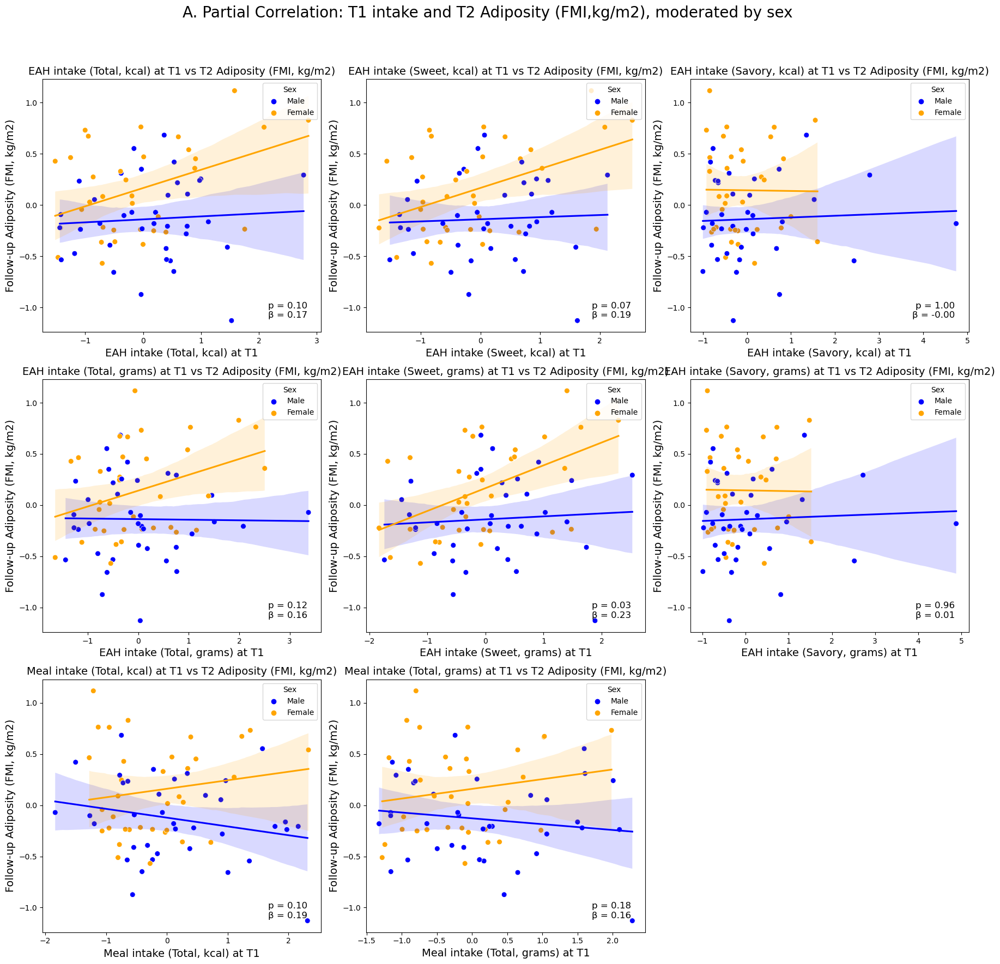

In [379]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm

# Copy the dataframe for modifications
df_intake = df_linear_reg.copy()

# Map the sex column to 'Male' and 'Female'
df_intake['sex'] = df_intake['sex'].map({0: 'Male', 1: 'Female'})

# Define the intake variables in the specified order
intake_vars = [
    'v1_eah_kcal',
    'v1_eah_sweet_kcal',
    'v1_eah_sav_kcal',
    'v1_eah_g',
    'v1_eah_sweet_g',
    'v1_eah_sav_g',
    'v1_meal_kcal',
    'v1_meal_g'
]

# Define control variables
control_vars = ['v1_FMI', 'risk_status_mom', 'income', 'parent_ed', 'v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff']

# Function to get residuals after controlling for covariates
def get_residuals(df, y_var, x_vars):
    X = sm.add_constant(df[x_vars])  # Add constant for regression
    y = df[y_var]
    model = sm.OLS(y, X).fit()
    return model.resid  # Return residuals

# Function to create descriptive labels for the variables
def get_x_label(var):
    if 'eah' in var:
        base = "EAH"
    else:
        base = "Meal"
    
    if 'sweet' in var:
        type_ = "Sweet"
    elif 'sav' in var:
        type_ = "Savory"
    else:
        type_ = "Total"
        
    if 'kcal' in var:
        unit = "kcal"
    else:
        unit = "grams"
    
    return f'{base} intake ({type_}, {unit}) at T1'

# Extract p-values and beta values for the last parameter in each model (intake * sex)
models_fmi_kcal = [
    model_EAHkcal_FMI_sex,
    model_EAHsweetkcal_FMI_sex,
    model_EAHsavkcal_FMI_sex,
    model_EAHg_FMI_sex,
    model_EAHsweetg_FMI_sex,
    model_EAHsavg_FMI_sex,
    model_mealkcal_FMI_sex,
    model_mealg_FMI_sex
]

p_values_fmi = []
beta_values_fmi = []

for model in models_fmi_kcal:
    p_value = model.pvalues[-1]  # Assuming the last parameter is the interaction term
    beta_value = model.params[-1]  # Assuming the last parameter is the interaction term
    p_values_fmi.append(p_value)
    beta_values_fmi.append(beta_value)

# Define a consistent palette
palette = {'Male': 'blue', 'Female': 'orange'}

# Initialize the figure
fig, axs = plt.subplots(3, 3, figsize=(18, 18))
fig.suptitle('A. Partial Correlation: T1 intake and T2 Adiposity (FMI,kg/m2), moderated by sex', fontsize=20)
axs = axs.flatten()

# Iterate over each intake variable
for i, (intake_var, p_value, beta_value) in enumerate(zip(intake_vars, p_values_fmi, beta_values_fmi)):
    
    # Get residuals for the dependent variable (FMI)
    df_intake['FMI_residual'] = get_residuals(df_intake, 'v7_FMI', control_vars)
    
    # Get residuals for the independent variable (intake)
    df_intake['intake_residual'] = get_residuals(df_intake, intake_var, control_vars)
    
    # Plotting
    scatter = sns.scatterplot(
        data=df_intake,
        x='intake_residual',
        y='FMI_residual',
        hue='sex',
        ax=axs[i],
        palette=palette,
        s=50
    )
    
    # Add regression lines for each sex
    sns.regplot(
        data=df_intake[df_intake['sex'] == 'Male'],
        x='intake_residual',
        y='FMI_residual',
        ax=axs[i],
        scatter=False,
        color='blue'
    )
    sns.regplot(
        data=df_intake[df_intake['sex'] == 'Female'],
        x='intake_residual',
        y='FMI_residual',
        ax=axs[i],
        scatter=False,
        color='orange'
    )
    
    # Set titles and labels
    axs[i].set_title(f'{get_x_label(intake_var)} vs T2 Adiposity (FMI, kg/m2)', fontsize=14)
    axs[i].set_xlabel(get_x_label(intake_var), fontsize=14)
    axs[i].set_ylabel('Follow-up Adiposity (FMI, kg/m2)', fontsize=14)
    
    # Add p-value and beta annotation
    axs[i].annotate(f'p = {p_value:.2f}\nβ = {beta_value:.2f}', xy=(0.95, 0.05), xycoords='axes fraction', fontsize=12,
                    horizontalalignment='right', verticalalignment='bottom')

    # Legend handling
    handles, labels = scatter.get_legend_handles_labels()
    axs[i].legend(title='Sex', handles=handles, labels=labels, loc='upper right', markerscale=1, ncol=1)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\1672028915.py:70: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_value = model.pvalues[-1]  # Assuming the last parameter is the interaction term
C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\1672028915.py:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta_value = model.params[-1]  # Assuming the last parameter is the interaction term


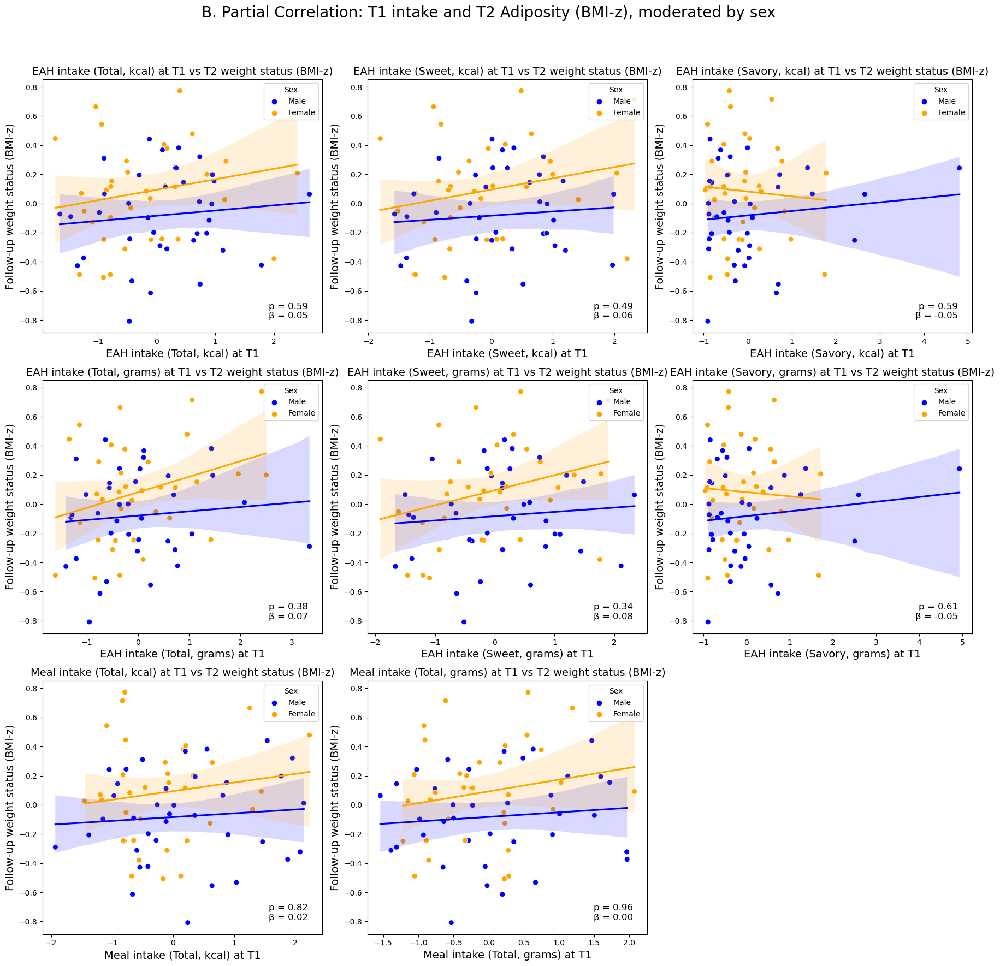

In [380]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm

# Copy the dataframe for modifications
df_intake = df_linear_reg.copy()

# Map the sex column to 'Male' and 'Female'
df_intake['sex'] = df_intake['sex'].map({0: 'Male', 1: 'Female'})

# Define the intake variables in the specified order
intake_vars = [
    'v1_eah_kcal',
    'v1_eah_sweet_kcal',
    'v1_eah_sav_kcal',
    'v1_eah_g',
    'v1_eah_sweet_g',
    'v1_eah_sav_g',
    'v1_meal_kcal',
    'v1_meal_g'
]

# Define control variables
control_vars = ['bmi_z', 'risk_status_mom', 'income', 'parent_ed', 'v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff']

# Function to get residuals after controlling for covariates
def get_residuals(df, y_var, x_vars):
    X = sm.add_constant(df[x_vars])  # Add constant for regression
    y = df[y_var]
    model = sm.OLS(y, X).fit()
    return model.resid  # Return residuals

# Function to create descriptive labels for the variables
def get_x_label(var):
    if 'eah' in var:
        base = "EAH"
    else:
        base = "Meal"
    
    if 'sweet' in var:
        type_ = "Sweet"
    elif 'sav' in var:
        type_ = "Savory"
    else:
        type_ = "Total"
        
    if 'kcal' in var:
        unit = "kcal"
    else:
        unit = "grams"
    
    return f'{base} intake ({type_}, {unit}) at T1'

# Extract p-values and beta values for the last parameter in each model (intake * sex)
models_bmi_z_kcal = [
    model_EAHkcal_bmiz_sex,
    model_EAHsweetkcal_bmiz_sex,
    model_EAHsavkcal_bmiz_sex,
    model_EAHg_bmiz_sex,
    model_EAHsweetg_bmiz_sex,
    model_EAHsavg_bmiz_sex,
    model_mealkcal_bmiz_sex,
    model_mealg_bmiz_sex
]

p_values_bmi_z = []
beta_values_bmi_z = []

for model in models_bmi_z_kcal:
    p_value = model.pvalues[-1]  # Assuming the last parameter is the interaction term
    beta_value = model.params[-1]  # Assuming the last parameter is the interaction term
    p_values_bmi_z.append(p_value)
    beta_values_bmi_z.append(beta_value)

# Define a consistent palette
palette = {'Male': 'blue', 'Female': 'orange'}

# Initialize the figure
fig, axs = plt.subplots(3, 3, figsize=(18, 18))
fig.suptitle('B. Partial Correlation: T1 intake and T2 Adiposity (BMI-z), moderated by sex', fontsize=20)
axs = axs.flatten()

# Iterate over each intake variable
for i, (intake_var, p_value, beta_value) in enumerate(zip(intake_vars, p_values_bmi_z, beta_values_bmi_z)):
    
    # Get residuals for the dependent variable (BMI-z)
    df_intake['BMI_z_residual'] = get_residuals(df_intake, 'v7_bmi_z', control_vars)
    
    # Get residuals for the independent variable (intake)
    df_intake['intake_residual'] = get_residuals(df_intake, intake_var, control_vars)
    
    # Plotting
    scatter = sns.scatterplot(
        data=df_intake,
        x='intake_residual',
        y='BMI_z_residual',
        hue='sex',
        ax=axs[i],
        palette=palette,
        s=50
    )
    
    # Add regression lines for each sex
    sns.regplot(
        data=df_intake[df_intake['sex'] == 'Male'],
        x='intake_residual',
        y='BMI_z_residual',
        ax=axs[i],
        scatter=False,
        color='blue'
    )
    sns.regplot(
        data=df_intake[df_intake['sex'] == 'Female'],
        x='intake_residual',
        y='BMI_z_residual',
        ax=axs[i],
        scatter=False,
        color='orange'
    )
    
    # Set titles and labels
    axs[i].set_title(f'{get_x_label(intake_var)} vs T2 weight status (BMI-z)', fontsize=14)
    axs[i].set_xlabel(get_x_label(intake_var), fontsize=14)
    axs[i].set_ylabel('Follow-up weight status (BMI-z)', fontsize=14)
    
    # Add p-value and beta annotation
    axs[i].annotate(f'p = {p_value:.2f}\nβ = {beta_value:.2f}', xy=(0.95, 0.05), xycoords='axes fraction', fontsize=12,
                    horizontalalignment='right', verticalalignment='bottom')

    # Legend handling
    handles, labels = scatter.get_legend_handles_labels()
    axs[i].legend(title='Sex', handles=handles, labels=labels, loc='upper right', markerscale=1, ncol=1)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


# graphs

In [381]:
#import required libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pingouin as pg
import statsmodels.api as sm
from statsmodels.api import OLS
from statsmodels.stats.stattools import durbin_watson
import scipy.stats as stats
from scipy.stats import spearmanr
from sklearn.preprocessing import StandardScaler
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_breuschpagan
%matplotlib inline

In [382]:
pd.set_option('display.max_columns', None)

In [383]:
df=pd.read_excel("EAH_database_all.xlsx")

In [384]:
def replace_outliers_with_mean(df, columns):
    # Dictionary to store the count of replaced outliers for each column
    replaced_count = {}
    
    for col in columns:
        mean_val = df[col].mean()
        std_val = df[col].std()
        
        # Define bounds for outliers
        lower_bound = mean_val - (3 * std_val)
        upper_bound = mean_val + (3 * std_val)
        
        # Calculate condition for outliers
        outlier_condition = (df[col] < lower_bound) | (df[col] > upper_bound)
        
        # Count outliers that will be replaced
        replaced_count[col] = outlier_condition.sum()
        
        # Replace outliers with the mean of the series
        df[col] = df[col].mask(outlier_condition, mean_val)
        
    # Optionally, return the dictionary if you want to see the counts after function execution
    return df, replaced_count

# Usage
df, count_replaced = replace_outliers_with_mean(df, outlier_cols)
print(count_replaced)


{'v1_meal_g': 0, 'v1_meal_kcal': 0, 'v1_eah_g': 1, 'v1_eah_kcal': 1, 'v1_eah_sweet_g': 0, 'v1_eah_sweet_kcal': 0, 'v1_eah_sav_g': 1, 'v1_eah_sav_kcal': 1, 'v7_meal_g': 0, 'v7_meal_kcal': 0, 'v7_eah_g': 0, 'v7_eah_kcal': 0, 'v7_eah_sweet_g': 0, 'v7_eah_sweet_kcal': 0, 'v7_eah_sav_kcal': 1, 'v7_eah_sav_g': 1, 'v1_freddy_pre_eah': 0, 'v7_freddy_pre_eah': 1}


In [385]:
df_graph=df.copy()

In [386]:
def plot_with_regression_and_pvalue(x, y, data, ax, xlabel, ylabel, title, beta, pvalue, change_100, unit):
    sns.scatterplot(x=x, y=y, data=data, ax=ax)
    sns.regplot(x=x, y=y, data=data, ax=ax, scatter=False)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.text(0.05, 0.95, f"β = {beta:.2f}\np-value: {pvalue:.2f}\nchange in outcome with 100 {unit} increase   = {change_100:.3f}", transform=ax.transAxes,
            fontsize=12, va='top', ha='left', bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))

In [387]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define a function to calculate unscaled change for 100 units
def calculate_unscaled_change(coef, sd_outcome, sd_predictor, units=100):
    return coef * sd_outcome * (units / sd_predictor)

# Define a function to extract coefficients and p-values, and calculate unscaled changes
def extract_and_unscale(model, predictor, outcome_sd, predictor_sd):
    coef = model.params[predictor]
    pvalue = model.pvalues[predictor]
    change = calculate_unscaled_change(coef, outcome_sd, predictor_sd)
    return coef, pvalue, change

# Extract standard deviations of predictors and outcomes from df_graph (unscaled)
sd_meal_kcal = df_graph['v1_meal_kcal'].std()
sd_eah_kcal = df_graph['v1_eah_kcal'].std()
sd_eah_sweet_kcal = df_graph['v1_eah_sweet_kcal'].std()
sd_eah_sav_kcal = df_graph['v1_eah_sav_kcal'].std()

sd_meal_g = df_graph['v1_meal_g'].std()
sd_eah_g = df_graph['v1_eah_g'].std()
sd_eah_sweet_g = df_graph['v1_eah_sweet_g'].std()
sd_eah_sav_g = df_graph['v1_eah_sav_g'].std()

sd_FMI = df_graph['v7_FMI'].std()

# Extract and unscale values for each model
# FMI models (kcal)
coef_meal_kcal, pvalue_meal_kcal, change_meal_kcal_FMI = extract_and_unscale(mod_mealkcalFMI, 'v1_meal_kcal', sd_FMI, sd_meal_kcal)
coef_eah_kcal, pvalue_eah_kcal, change_eah_kcal_FMI = extract_and_unscale(mod_EAHkcalFMI, 'v1_eah_kcal', sd_FMI, sd_eah_kcal)
coef_eah_sweet_kcal, pvalue_eah_sweet_kcal, change_eah_sweet_kcal_FMI = extract_and_unscale(mod_EAHsweetkcalFMI, 'v1_eah_sweet_kcal', sd_FMI, sd_eah_sweet_kcal)
coef_eah_sav_kcal, pvalue_eah_sav_kcal, change_eah_sav_kcal_FMI = extract_and_unscale(mod_EAHsavkcalFMI, 'v1_eah_sav_kcal', sd_FMI, sd_eah_sav_kcal)

# FMI models (grams)
coef_meal_g, pvalue_meal_g, change_meal_g_FMI = extract_and_unscale(mod_mealgFMI, 'v1_meal_g', sd_FMI, sd_meal_g)
coef_eah_g, pvalue_eah_g, change_eah_g_FMI = extract_and_unscale(mod_EAHgFMI, 'v1_eah_g', sd_FMI, sd_eah_g)
coef_eah_sweet_g, pvalue_eah_sweet_g, change_eah_sweet_g_FMI = extract_and_unscale(mod_EAHsweetgFMI, 'v1_eah_sweet_g', sd_FMI, sd_eah_sweet_g)
coef_eah_sav_g, pvalue_eah_sav_g, change_eah_sav_g_FMI = extract_and_unscale(mod_EAHsavgFMI, 'v1_eah_sav_g', sd_FMI, sd_eah_sav_g)

# BMIz models (kcal)
coef_meal_kcal_bmiz = mod_mealkcalBMIz.params['v1_meal_kcal']
pvalue_meal_kcal_bmiz = mod_mealkcalBMIz.pvalues['v1_meal_kcal']
change_meal_kcal_BMIz = coef_meal_kcal_bmiz * 100 / sd_meal_kcal

coef_eah_kcal_bmiz = mod_EAHkcalBMIz.params['v1_eah_kcal']
pvalue_eah_kcal_bmiz = mod_EAHkcalBMIz.pvalues['v1_eah_kcal']
change_eah_kcal_BMIz = coef_eah_kcal_bmiz * 100 / sd_eah_kcal

coef_eah_sweet_kcal_bmiz = mod_EAHsweetkcalBMIz.params['v1_eah_sweet_kcal']
pvalue_eah_sweet_kcal_bmiz = mod_EAHsweetkcalBMIz.pvalues['v1_eah_sweet_kcal']
change_eah_sweet_kcal_BMIz = coef_eah_sweet_kcal_bmiz * 100 / sd_eah_sweet_kcal

coef_eah_sav_kcal_bmiz = mod_EAHsavkcalBMIz.params['v1_eah_sav_kcal']
pvalue_eah_sav_kcal_bmiz = mod_EAHsavkcalBMIz.pvalues['v1_eah_sav_kcal']
change_eah_sav_kcal_BMIz = coef_eah_sav_kcal_bmiz * 100 / sd_eah_sav_kcal

# BMIz models (grams)
coef_meal_g_bmiz = mod_mealgBMIz.params['v1_meal_g']
pvalue_meal_g_bmiz = mod_mealgBMIz.pvalues['v1_meal_g']
change_meal_g_BMIz = coef_meal_g_bmiz * 100 / sd_meal_g

coef_eah_g_bmiz = mod_EAHgBMIz.params['v1_eah_g']
pvalue_eah_g_bmiz = mod_EAHgBMIz.pvalues['v1_eah_g']
change_eah_g_BMIz = coef_eah_g_bmiz * 100 / sd_eah_g

coef_eah_sweet_g_bmiz = mod_EAHsweetgBMIz.params['v1_eah_sweet_g']
pvalue_eah_sweet_g_bmiz = mod_EAHsweetgBMIz.pvalues['v1_eah_sweet_g']
change_eah_sweet_g_BMIz = coef_eah_sweet_g_bmiz * 100 / sd_eah_sweet_g

coef_eah_sav_g_bmiz = mod_EAHsavgBMIz.params['v1_eah_sav_g']
pvalue_eah_sav_g_bmiz = mod_EAHsavgBMIz.pvalues['v1_eah_sav_g']
change_eah_sav_g_BMIz = coef_eah_sav_g_bmiz * 100 / sd_eah_sav_g

# EAHkcalFMImealkcal model
coef_EAHkcalFMImealkcal, pvalue_EAHkcalFMImealkcal, change_EAHkcalFMImealkcal = extract_and_unscale(mod_EAHkcalFMImealkcal, 'v1_eah_kcal', sd_FMI, sd_eah_kcal)

# EAHgFMImealg model
coef_EAHgFMImealg, pvalue_EAHgFMImealg, change_EAHgFMImealg = extract_and_unscale(mod_EAHgFMImealg, 'v1_eah_g', sd_FMI, sd_eah_g)

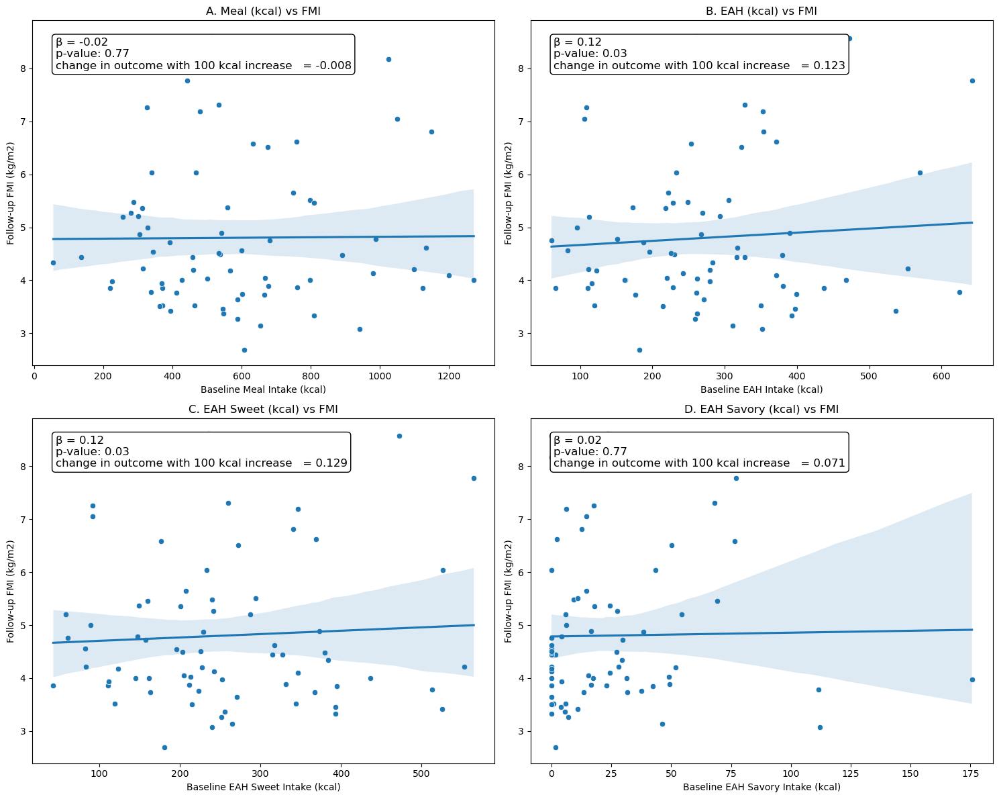

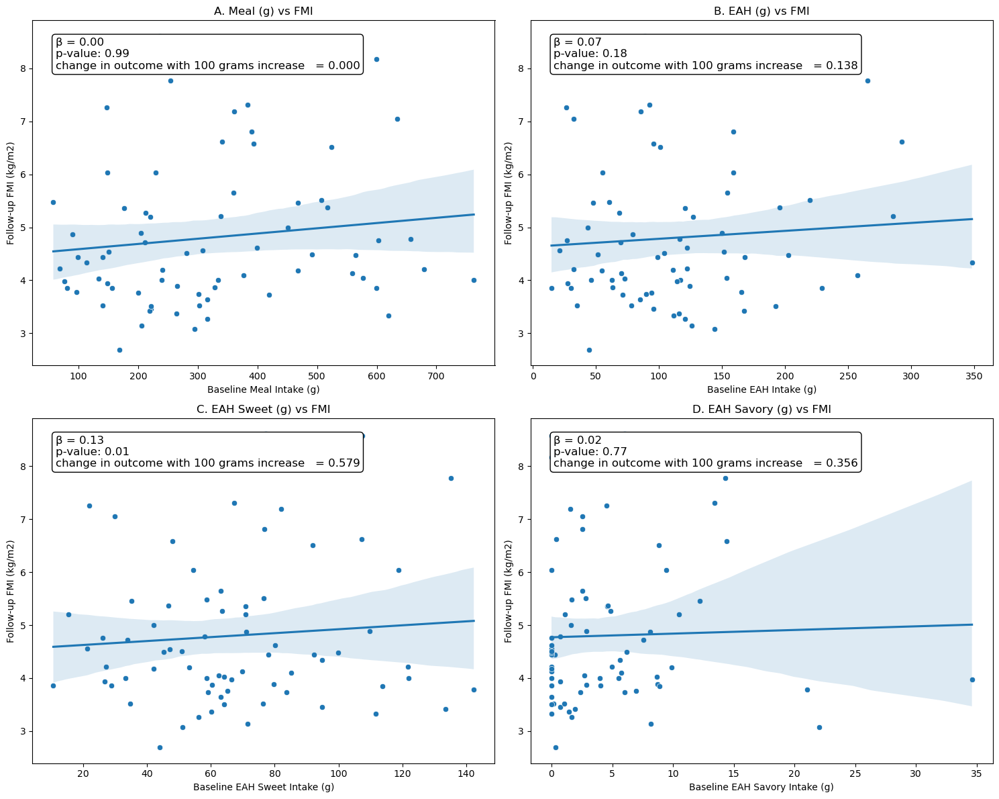

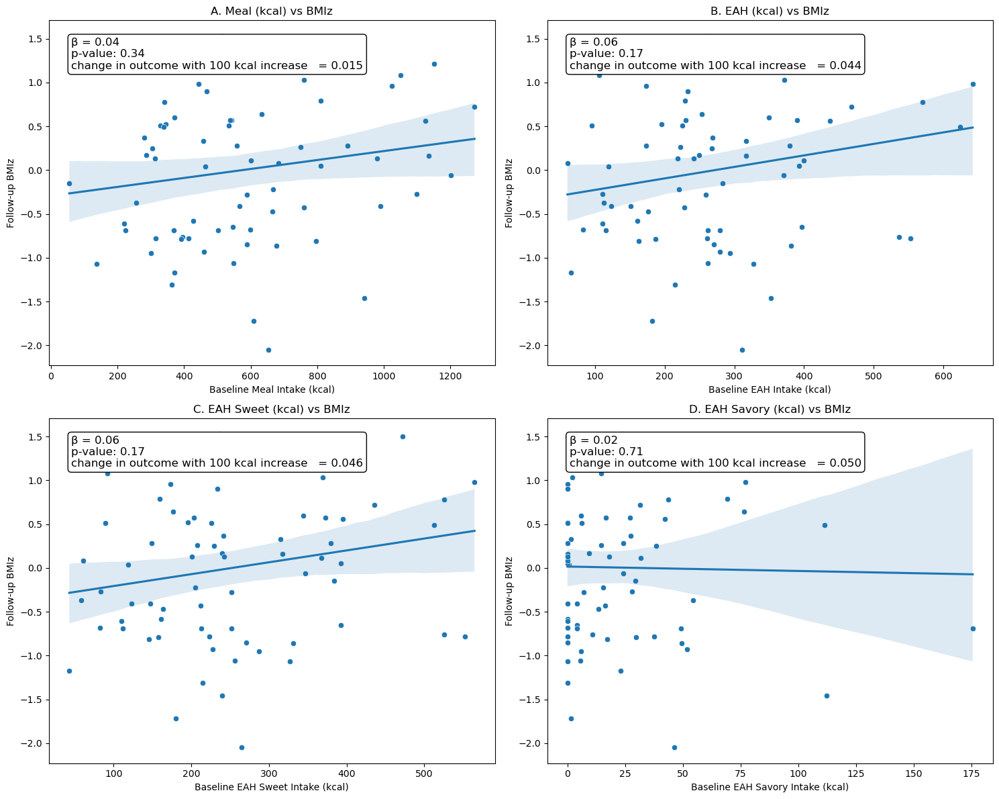

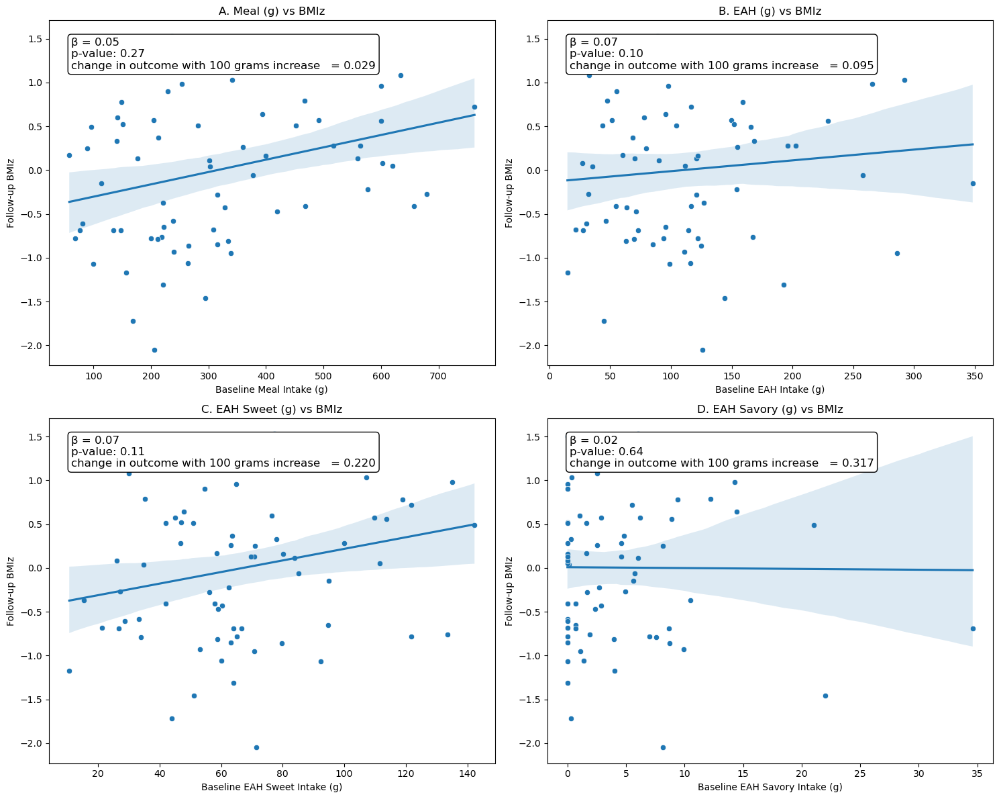

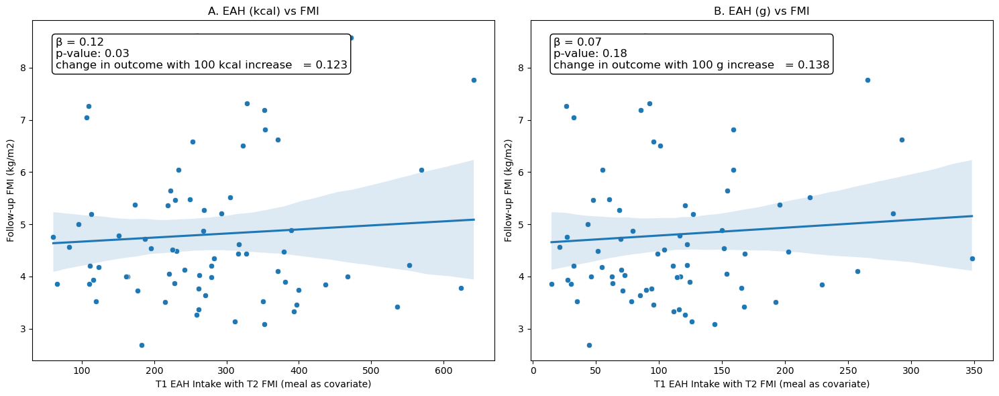

In [388]:
# First Graph: FMI vs. Meal, EAH, EAH Sweet, EAH Savory (all kcal)
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
plot_with_regression_and_pvalue('v1_meal_kcal', 'v7_FMI', df_graph, axes[0, 0], 'Baseline Meal Intake (kcal)', 'Follow-up FMI (kg/m2)', 'A. Meal (kcal) vs FMI', coef_meal_kcal, pvalue_meal_kcal, change_meal_kcal_FMI, 'kcal')
plot_with_regression_and_pvalue('v1_eah_kcal', 'v7_FMI', df_graph, axes[0, 1], 'Baseline EAH Intake (kcal)', 'Follow-up FMI (kg/m2)', 'B. EAH (kcal) vs FMI', coef_eah_kcal, pvalue_eah_kcal, change_eah_kcal_FMI, 'kcal')
plot_with_regression_and_pvalue('v1_eah_sweet_kcal', 'v7_FMI', df_graph, axes[1, 0], 'Baseline EAH Sweet Intake (kcal)', 'Follow-up FMI (kg/m2)', 'C. EAH Sweet (kcal) vs FMI', coef_eah_sweet_kcal, pvalue_eah_sweet_kcal, change_eah_sweet_kcal_FMI, 'kcal')
plot_with_regression_and_pvalue('v1_eah_sav_kcal', 'v7_FMI', df_graph, axes[1, 1], 'Baseline EAH Savory Intake (kcal)', 'Follow-up FMI (kg/m2)', 'D. EAH Savory (kcal) vs FMI', coef_eah_sav_kcal, pvalue_eah_sav_kcal, change_eah_sav_kcal_FMI, 'kcal')
plt.tight_layout()
plt.show()

# Second Graph: FMI vs. Meal, EAH, EAH Sweet, EAH Savory (all grams)
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
plot_with_regression_and_pvalue('v1_meal_g', 'v7_FMI', df_graph, axes[0, 0], 'Baseline Meal Intake (g)', 'Follow-up FMI (kg/m2)', 'A. Meal (g) vs FMI', coef_meal_g, pvalue_meal_g, change_meal_g_FMI, 'grams')
plot_with_regression_and_pvalue('v1_eah_g', 'v7_FMI', df_graph, axes[0, 1], 'Baseline EAH Intake (g)', 'Follow-up FMI (kg/m2)', 'B. EAH (g) vs FMI', coef_eah_g, pvalue_eah_g, change_eah_g_FMI, 'grams')
plot_with_regression_and_pvalue('v1_eah_sweet_g', 'v7_FMI', df_graph, axes[1, 0], 'Baseline EAH Sweet Intake (g)', 'Follow-up FMI (kg/m2)', 'C. EAH Sweet (g) vs FMI', coef_eah_sweet_g, pvalue_eah_sweet_g, change_eah_sweet_g_FMI, 'grams')
plot_with_regression_and_pvalue('v1_eah_sav_g', 'v7_FMI', df_graph, axes[1, 1], 'Baseline EAH Savory Intake (g)', 'Follow-up FMI (kg/m2)', 'D. EAH Savory (g) vs FMI', coef_eah_sav_g, pvalue_eah_sav_g, change_eah_sav_g_FMI, 'grams')
plt.tight_layout()
plt.show()

# Third Graph: BMIz vs. Meal, EAH, EAH Sweet, EAH Savory (all kcal)
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
plot_with_regression_and_pvalue('v1_meal_kcal', 'v7_bmi_z', df_graph, axes[0, 0], 'Baseline Meal Intake (kcal)', 'Follow-up BMIz', 'A. Meal (kcal) vs BMIz', coef_meal_kcal_bmiz, pvalue_meal_kcal_bmiz, change_meal_kcal_BMIz, 'kcal')
plot_with_regression_and_pvalue('v1_eah_kcal', 'v7_bmi_z', df_graph, axes[0, 1], 'Baseline EAH Intake (kcal)', 'Follow-up BMIz', 'B. EAH (kcal) vs BMIz', coef_eah_kcal_bmiz, pvalue_eah_kcal_bmiz, change_eah_kcal_BMIz, 'kcal')
plot_with_regression_and_pvalue('v1_eah_sweet_kcal', 'v7_bmi_z', df_graph, axes[1, 0], 'Baseline EAH Sweet Intake (kcal)', 'Follow-up BMIz', 'C. EAH Sweet (kcal) vs BMIz', coef_eah_sweet_kcal_bmiz, pvalue_eah_sweet_kcal_bmiz, change_eah_sweet_kcal_BMIz, 'kcal')
plot_with_regression_and_pvalue('v1_eah_sav_kcal', 'v7_bmi_z', df_graph, axes[1, 1], 'Baseline EAH Savory Intake (kcal)', 'Follow-up BMIz', 'D. EAH Savory (kcal) vs BMIz', coef_eah_sav_kcal_bmiz, pvalue_eah_sav_kcal_bmiz, change_eah_sav_kcal_BMIz, 'kcal')
plt.tight_layout()
plt.show()


# Fourth Graph: BMIz vs. Meal, EAH, EAH Sweet, EAH Savory (all grams)
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
plot_with_regression_and_pvalue('v1_meal_g', 'v7_bmi_z', df_graph, axes[0, 0], 'Baseline Meal Intake (g)', 'Follow-up BMIz', 'A. Meal (g) vs BMIz', coef_meal_g_bmiz, pvalue_meal_g_bmiz, change_meal_g_BMIz, 'grams')
plot_with_regression_and_pvalue('v1_eah_g', 'v7_bmi_z', df_graph, axes[0, 1], 'Baseline EAH Intake (g)', 'Follow-up BMIz', 'B. EAH (g) vs BMIz', coef_eah_g_bmiz, pvalue_eah_g_bmiz, change_eah_g_BMIz, 'grams')
plot_with_regression_and_pvalue('v1_eah_sweet_g', 'v7_bmi_z', df_graph, axes[1, 0], 'Baseline EAH Sweet Intake (g)', 'Follow-up BMIz', 'C. EAH Sweet (g) vs BMIz', coef_eah_sweet_g_bmiz, pvalue_eah_sweet_g_bmiz, change_eah_sweet_g_BMIz, 'grams')
plot_with_regression_and_pvalue('v1_eah_sav_g', 'v7_bmi_z', df_graph, axes[1, 1], 'Baseline EAH Savory Intake (g)', 'Follow-up BMIz', 'D. EAH Savory (g) vs BMIz', coef_eah_sav_g_bmiz, pvalue_eah_sav_g_bmiz, change_eah_sav_g_BMIz, 'grams')
plt.tight_layout()
plt.show()


# Fifth Graph: 1x2 mod_EAHkcalFMImealkcal and mod_EAHgFMImealg

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# mod_EAHkcalFMImealkcal
plot_with_regression_and_pvalue('v1_eah_kcal', 'v7_FMI', df_graph, axes[0], 'T1 EAH Intake with T2 FMI (meal as covariate)', 'Follow-up FMI (kg/m2)', 'A. EAH (kcal) vs FMI', coef_EAHkcalFMImealkcal, pvalue_EAHkcalFMImealkcal, change_EAHkcalFMImealkcal, 'kcal')

# mod_EAHgFMImealg
plot_with_regression_and_pvalue('v1_eah_g', 'v7_FMI', df_graph, axes[1], 'T1 EAH Intake with T2 FMI (meal as covariate)', 'Follow-up FMI (kg/m2)', 'B. EAH (g) vs FMI', coef_EAHgFMImealg, pvalue_EAHgFMImealg, change_EAHgFMImealg, 'g')

plt.tight_layout()
plt.show()


# partial reg plots

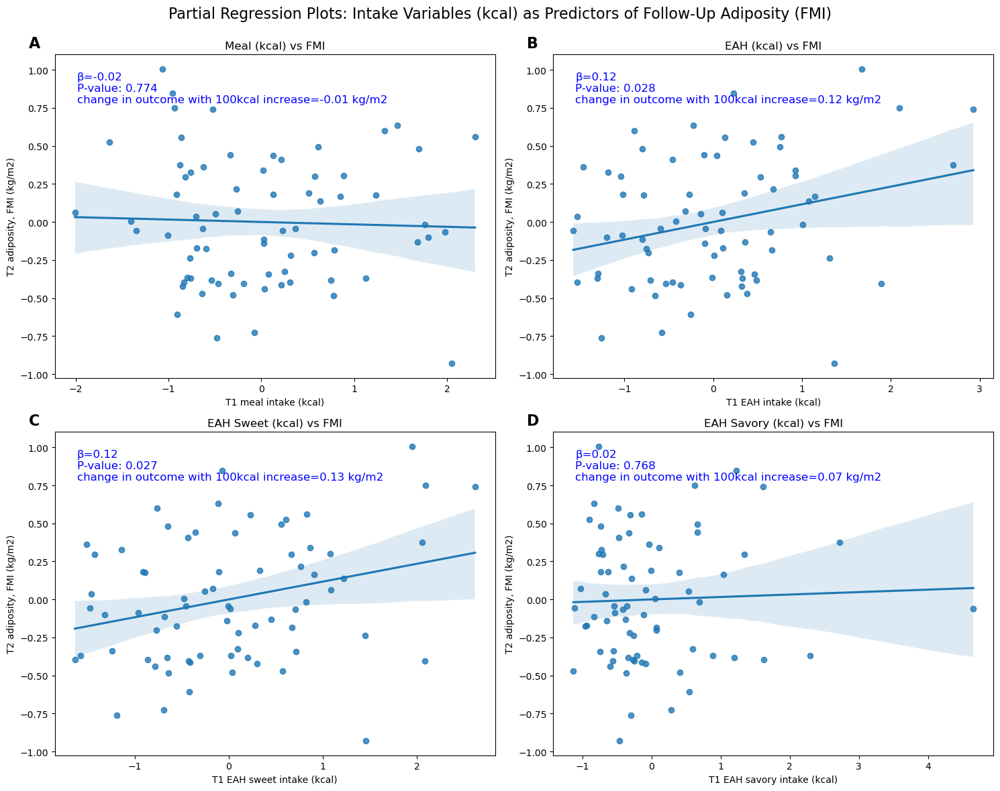

In [389]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import pandas as pd

# Create a model for each independent variable and calculate residuals

# Meal (kcal) vs FMI
X_meal = df_linear_reg[['v1_FMI', 'sex','risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff']]
y_meal = df_linear_reg['v7_FMI']
X_meal_const = sm.add_constant(X_meal)

# Regressing v7_FMI on all covariates
mod_FMI = sm.OLS(y_meal, X_meal_const).fit()
resid_FMI = mod_FMI.resid

# Regressing v1_meal_kcal on all covariates
mod_meal = sm.OLS(df_linear_reg['v1_meal_kcal'], X_meal_const).fit()
resid_meal_kcal = mod_meal.resid

# EAH (kcal) vs FMI
mod_eah = sm.OLS(df_linear_reg['v1_eah_kcal'], X_meal_const).fit()
resid_eah_kcal = mod_eah.resid

# EAH sweet (kcal) vs FMI
mod_eah_sweet = sm.OLS(df_linear_reg['v1_eah_sweet_kcal'], X_meal_const).fit()
resid_eah_sweet_kcal = mod_eah_sweet.resid

# EAH savory (kcal) vs FMI
mod_eah_sav = sm.OLS(df_linear_reg['v1_eah_sav_kcal'], X_meal_const).fit()
resid_eah_sav_kcal = mod_eah_sav.resid

# Plotting the residuals
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Plot for Meal (kcal) vs FMI residuals
sns.regplot(x=resid_meal_kcal, y=resid_FMI, ax=axes[0, 0])
axes[0, 0].set_xlabel("T1 meal intake (kcal)")
axes[0, 0].set_ylabel("T2 adiposity, FMI (kg/m2)")
axes[0, 0].set_title("Meal (kcal) vs FMI")
axes[0, 0].annotate(f"β={mod_mealkcalFMI.params['v1_meal_kcal']:.2f}\nP-value: {mod_mealkcalFMI.pvalues['v1_meal_kcal']:.3f}\nchange in outcome with 100kcal increase={change_meal_kcal_FMI:.2f} kg/m2", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[0, 0].annotate('A', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for EAH total (kcal) vs FMI residuals
sns.regplot(x=resid_eah_kcal, y=resid_FMI, ax=axes[0, 1])
axes[0, 1].set_xlabel("T1 EAH intake (kcal)")
axes[0, 1].set_ylabel("T2 adiposity, FMI (kg/m2)")
axes[0, 1].set_title("EAH (kcal) vs FMI")
axes[0, 1].annotate(f"β={mod_EAHkcalFMI.params['v1_eah_kcal']:.2f}\nP-value: {mod_EAHkcalFMI.pvalues['v1_eah_kcal']:.3f}\nchange in outcome with 100kcal increase={change_eah_kcal_FMI:.2f} kg/m2", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[0, 1].annotate('B', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for EAH sweet (kcal) vs FMI residuals
sns.regplot(x=resid_eah_sweet_kcal, y=resid_FMI, ax=axes[1, 0])
axes[1, 0].set_xlabel("T1 EAH sweet intake (kcal)")
axes[1, 0].set_ylabel("T2 adiposity, FMI (kg/m2)")
axes[1, 0].set_title("EAH Sweet (kcal) vs FMI")
axes[1, 0].annotate(f"β={mod_EAHsweetkcalFMI.params['v1_eah_sweet_kcal']:.2f}\nP-value: {mod_EAHsweetkcalFMI.pvalues['v1_eah_sweet_kcal']:.3f}\nchange in outcome with 100kcal increase={change_eah_sweet_kcal_FMI:.2f} kg/m2", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[1, 0].annotate('C', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for EAH savory (kcal) vs FMI residuals
sns.regplot(x=resid_eah_sav_kcal, y=resid_FMI, ax=axes[1, 1])
axes[1, 1].set_xlabel("T1 EAH savory intake (kcal)")
axes[1, 1].set_ylabel("T2 adiposity, FMI (kg/m2)")
axes[1, 1].set_title("EAH Savory (kcal) vs FMI")
axes[1, 1].annotate(f"β={mod_EAHsavkcalFMI.params['v1_eah_sav_kcal']:.2f}\nP-value: {mod_EAHsavkcalFMI.pvalues['v1_eah_sav_kcal']:.3f}\nchange in outcome with 100kcal increase={change_eah_sav_kcal_FMI:.2f} kg/m2", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[1, 1].annotate('D', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

fig.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("Partial Regression Plots: Intake Variables (kcal) as Predictors of Follow-Up Adiposity (FMI)", fontsize=16)
plt.show()


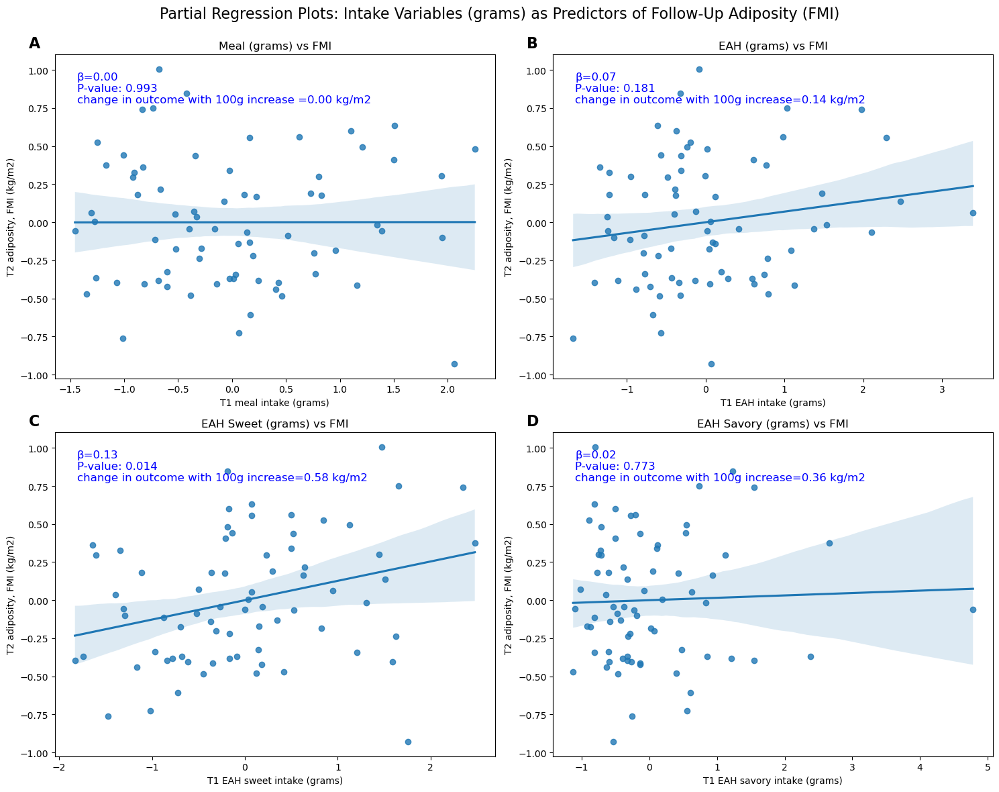

In [390]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import pandas as pd

# Create a model for each independent variable and calculate residuals

# Meal (grams) vs FMI
X_meal = df_linear_reg[['v1_FMI', 'sex','risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff']]
y_meal = df_linear_reg['v7_FMI']
X_meal_const = sm.add_constant(X_meal)

# Regressing v7_FMI on all covariates
mod_FMI = sm.OLS(y_meal, X_meal_const).fit()
resid_FMI = mod_FMI.resid

# Regressing v1_meal_grams on all covariates
mod_meal = sm.OLS(df_linear_reg['v1_meal_g'], X_meal_const).fit()
resid_meal_grams = mod_meal.resid

# EAH (grams) vs FMI
mod_eah = sm.OLS(df_linear_reg['v1_eah_g'], X_meal_const).fit()
resid_eah_grams = mod_eah.resid

# EAH sweet (grams) vs FMI
mod_eah_sweet = sm.OLS(df_linear_reg['v1_eah_sweet_g'], X_meal_const).fit()
resid_eah_sweet_grams = mod_eah_sweet.resid

# EAH savory (grams) vs FMI
mod_eah_sav = sm.OLS(df_linear_reg['v1_eah_sav_g'], X_meal_const).fit()
resid_eah_sav_grams = mod_eah_sav.resid

# Plotting the residuals
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Plot for Meal (grams) vs FMI residuals
sns.regplot(x=resid_meal_grams, y=resid_FMI, ax=axes[0, 0])
axes[0, 0].set_xlabel("T1 meal intake (grams)")
axes[0, 0].set_ylabel("T2 adiposity, FMI (kg/m2)")
axes[0, 0].set_title("Meal (grams) vs FMI")
axes[0, 0].annotate(f"β={mod_mealgFMI.params['v1_meal_g']:.2f}\nP-value: {mod_mealgFMI.pvalues['v1_meal_g']:.3f}\nchange in outcome with 100g increase ={change_meal_g_FMI:.2f} kg/m2", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[0, 0].annotate('A', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for EAH total (grams) vs FMI residuals
sns.regplot(x=resid_eah_grams, y=resid_FMI, ax=axes[0, 1])
axes[0, 1].set_xlabel("T1 EAH intake (grams)")
axes[0, 1].set_ylabel("T2 adiposity, FMI (kg/m2)")
axes[0, 1].set_title("EAH (grams) vs FMI")
axes[0, 1].annotate(f"β={mod_EAHgFMI.params['v1_eah_g']:.2f}\nP-value: {mod_EAHgFMI.pvalues['v1_eah_g']:.3f}\nchange in outcome with 100g increase={change_eah_g_FMI:.2f} kg/m2", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[0, 1].annotate('B', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for EAH sweet (grams) vs FMI residuals
sns.regplot(x=resid_eah_sweet_grams, y=resid_FMI, ax=axes[1, 0])
axes[1, 0].set_xlabel("T1 EAH sweet intake (grams)")
axes[1, 0].set_ylabel("T2 adiposity, FMI (kg/m2)")
axes[1, 0].set_title("EAH Sweet (grams) vs FMI")
axes[1, 0].annotate(f"β={mod_EAHsweetgFMI.params['v1_eah_sweet_g']:.2f}\nP-value: {mod_EAHsweetgFMI.pvalues['v1_eah_sweet_g']:.3f}\nchange in outcome with 100g increase={change_eah_sweet_g_FMI:.2f} kg/m2", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[1, 0].annotate('C', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for EAH savory (grams) vs FMI residuals
sns.regplot(x=resid_eah_sav_grams, y=resid_FMI, ax=axes[1, 1])
axes[1, 1].set_xlabel("T1 EAH savory intake (grams)")
axes[1, 1].set_ylabel("T2 adiposity, FMI (kg/m2)")
axes[1, 1].set_title("EAH Savory (grams) vs FMI")
axes[1, 1].annotate(f"β={mod_EAHsavgFMI.params['v1_eah_sav_g']:.2f}\nP-value: {mod_EAHsavgFMI.pvalues['v1_eah_sav_g']:.3f}\nchange in outcome with 100g increase={change_eah_sav_g_FMI:.2f} kg/m2", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[1, 1].annotate('D', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

fig.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("Partial Regression Plots: Intake Variables (grams) as Predictors of Follow-Up Adiposity (FMI)", fontsize=16)
plt.show()

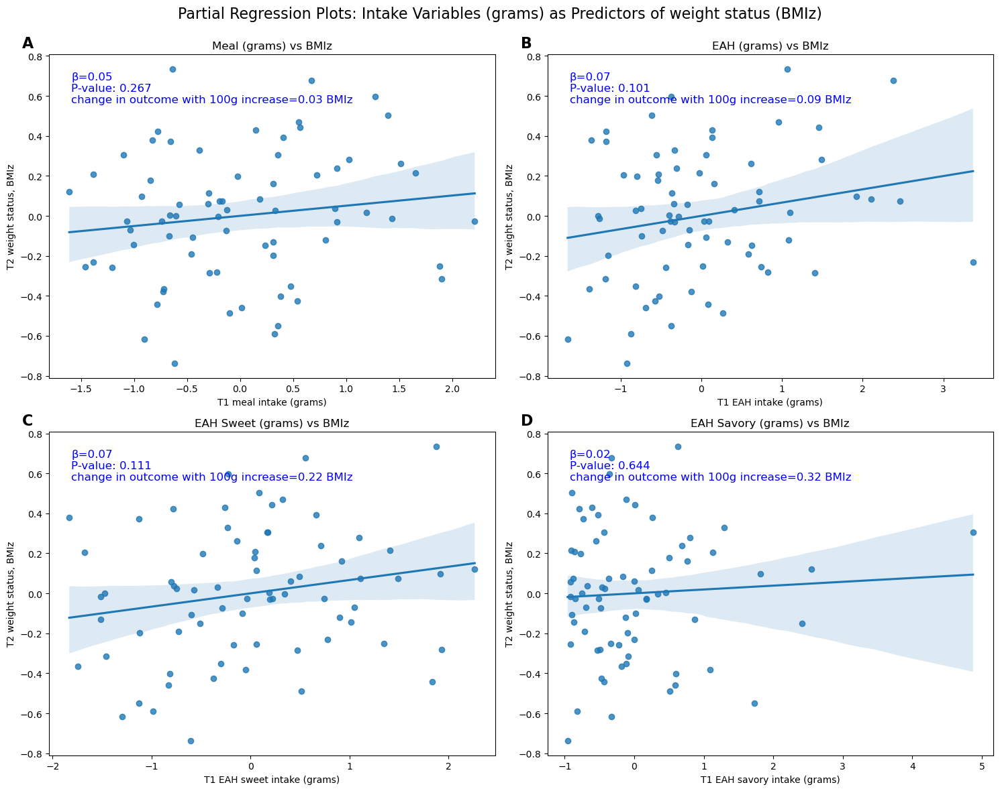

In [391]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import pandas as pd

# Create a model for each independent variable and calculate residuals

# Meal (grams) vs BMIz
X_meal = df_linear_reg[['bmi_z', 'sex','risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff']]
y_meal = df_linear_reg['v7_bmi_z']
X_meal_const = sm.add_constant(X_meal)

# Regressing v7_BMIz on all covariates
mod_BMIz = sm.OLS(y_meal, X_meal_const).fit()
resid_BMIz = mod_BMIz.resid

# Regressing v1_meal_grams on all covariates
mod_meal = sm.OLS(df_linear_reg['v1_meal_g'], X_meal_const).fit()
resid_meal_grams = mod_meal.resid

# EAH (grams) vs BMIz
mod_eah = sm.OLS(df_linear_reg['v1_eah_g'], X_meal_const).fit()
resid_eah_grams = mod_eah.resid

# EAH sweet (grams) vs BMIz
mod_eah_sweet = sm.OLS(df_linear_reg['v1_eah_sweet_g'], X_meal_const).fit()
resid_eah_sweet_grams = mod_eah_sweet.resid

# EAH savory (grams) vs BMIz
mod_eah_sav = sm.OLS(df_linear_reg['v1_eah_sav_g'], X_meal_const).fit()
resid_eah_sav_grams = mod_eah_sav.resid

# Plotting the residuals
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Plot for Meal (grams) vs BMIz residuals
sns.regplot(x=resid_meal_grams, y=resid_BMIz, ax=axes[0, 0])
axes[0, 0].set_xlabel("T1 meal intake (grams)")
axes[0, 0].set_ylabel("T2 weight status, BMIz")
axes[0, 0].set_title("Meal (grams) vs BMIz")
axes[0, 0].annotate(f"β={mod_mealgBMIz.params['v1_meal_g']:.2f}\nP-value: {mod_mealgBMIz.pvalues['v1_meal_g']:.3f}\nchange in outcome with 100g increase={change_meal_g_BMIz:.2f} BMIz", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[0, 0].annotate('A', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for EAH total (grams) vs BMIz residuals
sns.regplot(x=resid_eah_grams, y=resid_BMIz, ax=axes[0, 1])
axes[0, 1].set_xlabel("T1 EAH intake (grams)")
axes[0, 1].set_ylabel("T2 weight status, BMIz")
axes[0, 1].set_title("EAH (grams) vs BMIz")
axes[0, 1].annotate(f"β={mod_EAHgBMIz.params['v1_eah_g']:.2f}\nP-value: {mod_EAHgBMIz.pvalues['v1_eah_g']:.3f}\nchange in outcome with 100g increase={change_eah_g_BMIz:.2f} BMIz", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[0, 1].annotate('B', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for EAH sweet (grams) vs BMIz residuals
sns.regplot(x=resid_eah_sweet_grams, y=resid_BMIz, ax=axes[1, 0])
axes[1, 0].set_xlabel("T1 EAH sweet intake (grams)")
axes[1, 0].set_ylabel("T2 weight status, BMIz")
axes[1, 0].set_title("EAH Sweet (grams) vs BMIz")
axes[1, 0].annotate(f"β={mod_EAHsweetgBMIz.params['v1_eah_sweet_g']:.2f}\nP-value: {mod_EAHsweetgBMIz.pvalues['v1_eah_sweet_g']:.3f}\nchange in outcome with 100g increase={change_eah_sweet_g_BMIz:.2f} BMIz", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[1, 0].annotate('C', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for EAH savory (grams) vs BMIz residuals
sns.regplot(x=resid_eah_sav_grams, y=resid_BMIz, ax=axes[1, 1])
axes[1, 1].set_xlabel("T1 EAH savory intake (grams)")
axes[1, 1].set_ylabel("T2 weight status, BMIz")
axes[1, 1].set_title("EAH Savory (grams) vs BMIz")
axes[1, 1].annotate(f"β={mod_EAHsavgBMIz.params['v1_eah_sav_g']:.2f}\nP-value: {mod_EAHsavgBMIz.pvalues['v1_eah_sav_g']:.3f}\nchange in outcome with 100g increase={change_eah_sav_g_BMIz:.2f} BMIz", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[1, 1].annotate('D', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

fig.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("Partial Regression Plots: Intake Variables (grams) as Predictors of weight status (BMIz)", fontsize=16)
plt.show()


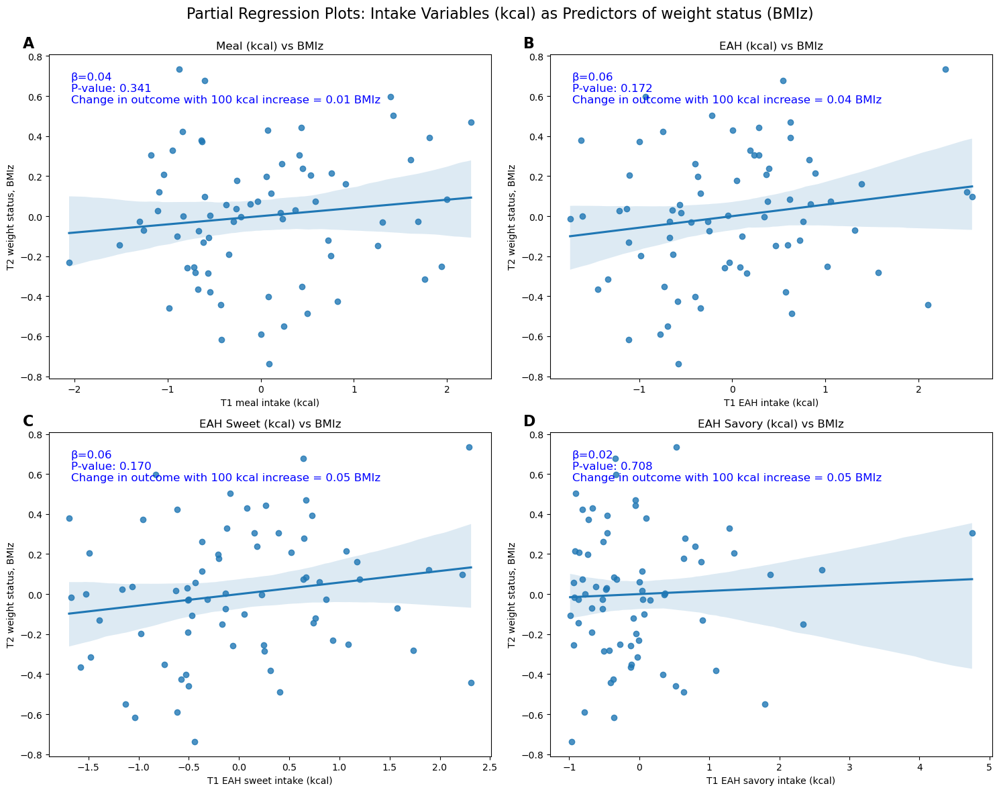

In [392]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import pandas as pd

# Create a model for each independent variable and calculate residuals

# Meal (kcal) vs BMIz
X_meal = df_linear_reg[['bmi_z', 'sex','risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff']]
y_meal = df_linear_reg['v7_bmi_z']
X_meal_const = sm.add_constant(X_meal)

# Regressing v7_BMIz on all covariates
mod_BMIz = sm.OLS(y_meal, X_meal_const).fit()
resid_BMIz = mod_BMIz.resid

# Regressing v1_meal_kcal on all covariates
mod_meal = sm.OLS(df_linear_reg['v1_meal_kcal'], X_meal_const).fit()
resid_meal_kcal = mod_meal.resid

# EAH (kcal) vs BMIz
mod_eah = sm.OLS(df_linear_reg['v1_eah_kcal'], X_meal_const).fit()
resid_eah_kcal = mod_eah.resid

# EAH sweet (kcal) vs BMIz
mod_eah_sweet = sm.OLS(df_linear_reg['v1_eah_sweet_kcal'], X_meal_const).fit()
resid_eah_sweet_kcal = mod_eah_sweet.resid

# EAH savory (kcal) vs BMIz
mod_eah_sav = sm.OLS(df_linear_reg['v1_eah_sav_kcal'], X_meal_const).fit()
resid_eah_sav_kcal = mod_eah_sav.resid

# Plotting the residuals
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Plot for Meal (kcal) vs BMIz residuals
sns.regplot(x=resid_meal_kcal, y=resid_BMIz, ax=axes[0, 0])
axes[0, 0].set_xlabel("T1 meal intake (kcal)")
axes[0, 0].set_ylabel("T2 weight status, BMIz")
axes[0, 0].set_title("Meal (kcal) vs BMIz")
axes[0, 0].annotate(f"β={mod_mealkcalBMIz.params['v1_meal_kcal']:.2f}\nP-value: {mod_mealkcalBMIz.pvalues['v1_meal_kcal']:.3f}\nChange in outcome with 100 kcal increase = {change_meal_kcal_BMIz:.2f} BMIz", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[0, 0].annotate('A', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for EAH total (kcal) vs BMIz residuals
sns.regplot(x=resid_eah_kcal, y=resid_BMIz, ax=axes[0, 1])
axes[0, 1].set_xlabel("T1 EAH intake (kcal)")
axes[0, 1].set_ylabel("T2 weight status, BMIz")
axes[0, 1].set_title("EAH (kcal) vs BMIz")
axes[0, 1].annotate(f"β={mod_EAHkcalBMIz.params['v1_eah_kcal']:.2f}\nP-value: {mod_EAHkcalBMIz.pvalues['v1_eah_kcal']:.3f}\nChange in outcome with 100 kcal increase = {change_eah_kcal_BMIz:.2f} BMIz", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[0, 1].annotate('B', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for EAH sweet (kcal) vs BMIz residuals
sns.regplot(x=resid_eah_sweet_kcal, y=resid_BMIz, ax=axes[1, 0])
axes[1, 0].set_xlabel("T1 EAH sweet intake (kcal)")
axes[1, 0].set_ylabel("T2 weight status, BMIz")
axes[1, 0].set_title("EAH Sweet (kcal) vs BMIz")
axes[1, 0].annotate(f"β={mod_EAHsweetkcalBMIz.params['v1_eah_sweet_kcal']:.2f}\nP-value: {mod_EAHsweetkcalBMIz.pvalues['v1_eah_sweet_kcal']:.3f}\nChange in outcome with 100 kcal increase = {change_eah_sweet_kcal_BMIz:.2f} BMIz", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[1, 0].annotate('C', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for EAH savory (kcal) vs BMIz residuals
sns.regplot(x=resid_eah_sav_kcal, y=resid_BMIz, ax=axes[1, 1])
axes[1, 1].set_xlabel("T1 EAH savory intake (kcal)")
axes[1, 1].set_ylabel("T2 weight status, BMIz")
axes[1, 1].set_title("EAH Savory (kcal) vs BMIz")
axes[1, 1].annotate(f"β={mod_EAHsavkcalBMIz.params['v1_eah_sav_kcal']:.2f}\nP-value: {mod_EAHsavkcalBMIz.pvalues['v1_eah_sav_kcal']:.3f}\nChange in outcome with 100 kcal increase = {change_eah_sav_kcal_BMIz:.2f} BMIz", 
                    xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')
axes[1, 1].annotate('D', xy=(-0.06, 1.02), xycoords='axes fraction', fontsize=16, weight='bold')

fig.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("Partial Regression Plots: Intake Variables (kcal) as Predictors of weight status (BMIz)", fontsize=16)
plt.show()


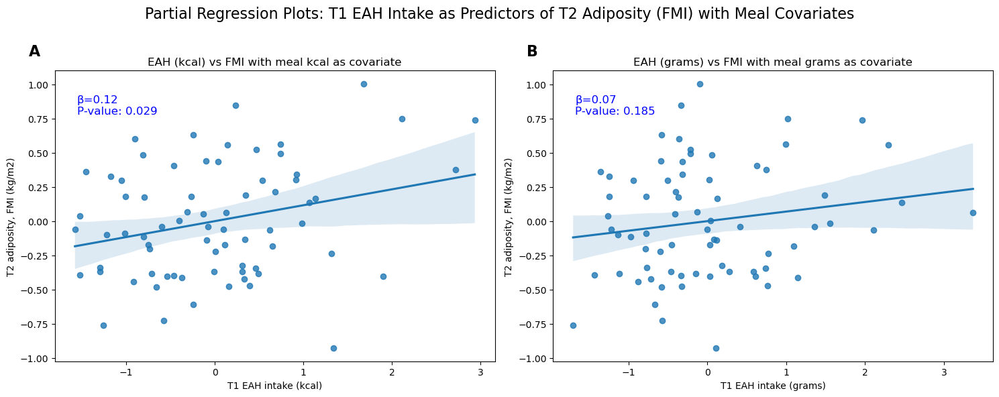

In [393]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import pandas as pd

# Regressing T1 EAH kcal and grams on all covariates including the additional covariate (v1_meal_kcal or v1_meal_g)
# EAH kcal vs FMI with additional covariate v1_meal_kcal
X_eah_kcal = df_linear_reg[['v1_FMI', 'sex','risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff', 'v1_meal_kcal']]
y_fmi_kcal = df_linear_reg['v7_FMI']
X_eah_kcal_const = sm.add_constant(X_eah_kcal)

mod_eah_kcal = sm.OLS(df_linear_reg['v1_eah_kcal'], X_eah_kcal_const).fit()
resid_eah_kcal = mod_eah_kcal.resid

# EAH grams vs FMI with additional covariate v1_meal_g
X_eah_g = df_linear_reg[['v1_FMI', 'sex','risk_status_mom','income','parent_ed','v7_p_pds_imputed_2', 'v7_p_pds_imputed_3', 'age_diff', 'v1_meal_g']]
y_fmi_g = df_linear_reg['v7_FMI']
X_eah_g_const = sm.add_constant(X_eah_g)

mod_eah_g = sm.OLS(df_linear_reg['v1_eah_g'], X_eah_g_const).fit()
resid_eah_g = mod_eah_g.resid

# Plotting the residuals in a 1x2 layout
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot for T1 EAH kcal vs T2 FMI residuals with additional covariate v1_meal_kcal
sns.regplot(x=resid_eah_kcal, y=resid_FMI, ax=axes[0])
axes[0].set_xlabel("T1 EAH intake (kcal)")
axes[0].set_ylabel("T2 adiposity, FMI (kg/m2)")
axes[0].set_title("EAH (kcal) vs FMI with meal kcal as covariate")
axes[0].annotate(f"β={mod_EAHkcalFMImealkcal.params['v1_eah_kcal']:.2f}\nP-value: {mod_EAHkcalFMImealkcal.pvalues['v1_eah_kcal']:.3f}", 
                 xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')

# Add label 'A'
axes[0].annotate('A', xy=(-0.06, 1.05), xycoords='axes fraction', fontsize=16, weight='bold')

# Plot for T1 EAH grams vs T2 FMI residuals with additional covariate v1_meal_g
sns.regplot(x=resid_eah_g, y=resid_FMI, ax=axes[1])
axes[1].set_xlabel("T1 EAH intake (grams)")
axes[1].set_ylabel("T2 adiposity, FMI (kg/m2)")
axes[1].set_title("EAH (grams) vs FMI with meal grams as covariate")
axes[1].annotate(f"β={mod_EAHgFMImealg.params['v1_eah_g']:.2f}\nP-value: {mod_EAHgFMImealg.pvalues['v1_eah_g']:.3f}", 
                 xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='blue')

# Add label 'B'
axes[1].annotate('B', xy=(-0.06, 1.05), xycoords='axes fraction', fontsize=16, weight='bold')

fig.tight_layout()
plt.subplots_adjust(top=0.82)
plt.suptitle("Partial Regression Plots: T1 EAH Intake as Predictors of T2 Adiposity (FMI) with Meal Covariates", fontsize=16)
plt.show()


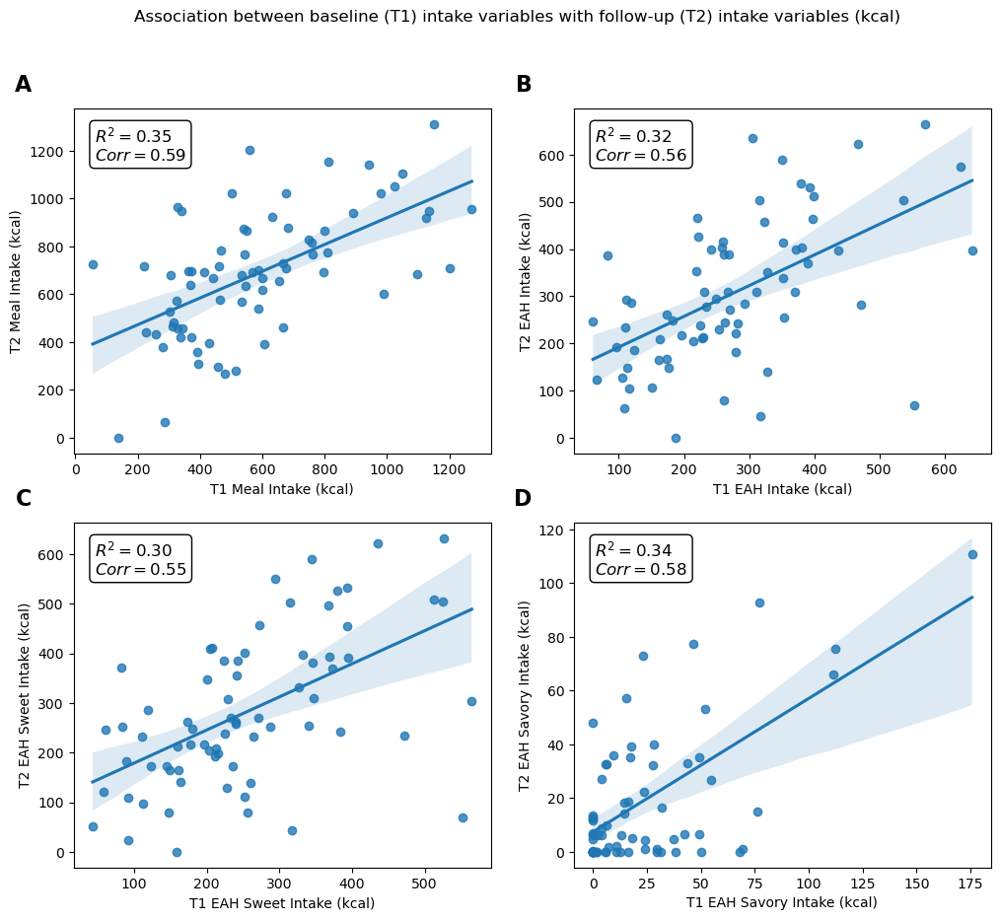

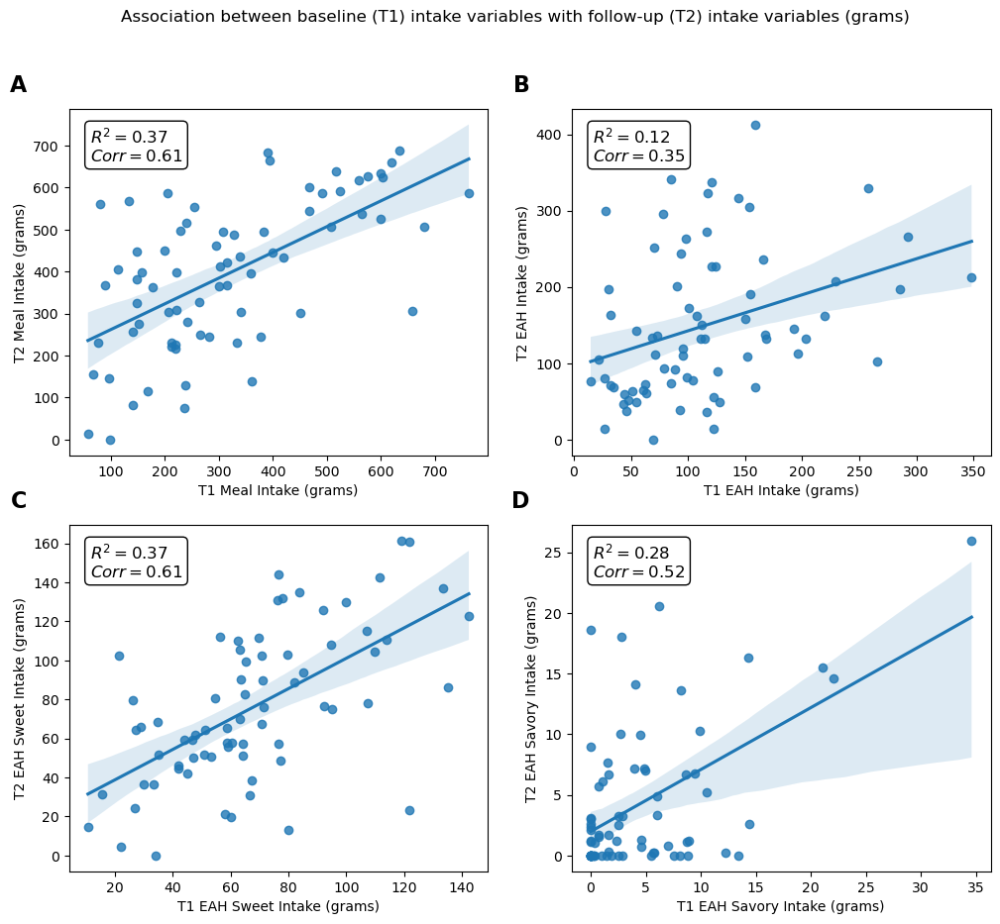

In [394]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import seaborn as sns

# Function to create scatter plots with R2 and correlation coefficient
def scatter_plot_with_stats(ax, x, y, x_label, y_label):
    sns.regplot(x=x, y=y, ax=ax, scatter_kws={'color': '#1f77b4'}, line_kws={'color': '#1f77b4'})
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    
    # Fit linear model
    model = LinearRegression().fit(x.values.reshape(-1, 1), y.values.reshape(-1, 1))
    y_pred = model.predict(x.values.reshape(-1, 1))
    
    # Calculate R2 and correlation coefficient
    r2 = r2_score(y, y_pred)
    corr_coeff = x.corr(y)
    
    # Add text box with R2 and correlation coefficient
    textstr = f'$R^2 = {r2:.2f}$\n$Corr = {corr_coeff:.2f}$'
    props = dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white')
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=props)

# Create the 2x2 subplot for the first graph
fig1, axs1 = plt.subplots(2, 2, figsize=(12, 10))
fig1.suptitle('Association between baseline (T1) intake variables with follow-up (T2) intake variables (kcal)')

variables_kcal = [
    ('v1_meal_kcal', 'v7_meal_kcal', 'T1 Meal Intake (kcal)', 'T2 Meal Intake (kcal)'),
    ('v1_eah_kcal', 'v7_eah_kcal', 'T1 EAH Intake (kcal)', 'T2 EAH Intake (kcal)'),
    ('v1_eah_sweet_kcal', 'v7_eah_sweet_kcal', 'T1 EAH Sweet Intake (kcal)', 'T2 EAH Sweet Intake (kcal)'),
    ('v1_eah_sav_kcal', 'v7_eah_sav_kcal', 'T1 EAH Savory Intake (kcal)', 'T2 EAH Savory Intake (kcal)')
]

# Label for the subplots
labels = ['A', 'B', 'C', 'D']

for ax, (x_var, y_var, x_label, y_label), label in zip(axs1.ravel(), variables_kcal, labels):
    scatter_plot_with_stats(ax, df_graph[x_var], df_graph[y_var], x_label, y_label)
    ax.text(-0.1, 1.1, label, transform=ax.transAxes, fontsize=16, fontweight='bold', va='top', ha='right')

# Create the 2x2 subplot for the second graph
fig2, axs2 = plt.subplots(2, 2, figsize=(12, 10))
fig2.suptitle('Association between baseline (T1) intake variables with follow-up (T2) intake variables (grams)')

variables_g = [
    ('v1_meal_g', 'v7_meal_g', 'T1 Meal Intake (grams)', 'T2 Meal Intake (grams)'),
    ('v1_eah_g', 'v7_eah_g', 'T1 EAH Intake (grams)', 'T2 EAH Intake (grams)'),
    ('v1_eah_sweet_g', 'v7_eah_sweet_g', 'T1 EAH Sweet Intake (grams)', 'T2 EAH Sweet Intake (grams)'),
    ('v1_eah_sav_g', 'v7_eah_sav_g', 'T1 EAH Savory Intake (grams)', 'T2 EAH Savory Intake (grams)')
]

# Label for the subplots
labels = ['A', 'B', 'C', 'D']

for ax, (x_var, y_var, x_label, y_label), label in zip(axs2.ravel(), variables_g, labels):
    scatter_plot_with_stats(ax, df_graph[x_var], df_graph[y_var], x_label, y_label)
    ax.text(-0.1, 1.1, label, transform=ax.transAxes, fontsize=16, fontweight='bold', va='top', ha='right')

# Show the plots
plt.show()

# checking for some outlier influence

In [396]:
import pandas as pd
import numpy as np
import statsmodels.api as sm

# Assuming your DataFrame is named df and the columns of interest are in outlier_cols
outlier_cols = [
    'v1_meal_g', 'v1_meal_kcal', 'v1_eah_g',
    'v1_eah_kcal', 'v1_eah_sweet_g', 'v1_eah_sweet_kcal', 'v1_eah_sav_g',
    'v1_eah_sav_kcal', 'v7_meal_g', 'v7_meal_kcal', 'v7_eah_g',
    'v7_eah_kcal', 'v7_eah_sweet_g', 'v7_eah_sweet_kcal', 'v7_eah_sav_kcal',
    'v7_eah_sav_g', 'v1_freddy_pre_eah', 'v7_freddy_pre_eah'
]

# Calculate mean and standard deviation for each column
mean = df_linear_reg[outlier_cols].mean()
std_dev = df_linear_reg[outlier_cols].std()

# Identify outliers that are more than 3 standard deviations from the mean
outliers = (df_linear_reg[outlier_cols] > (mean + 3 * std_dev)) | (df_linear_reg[outlier_cols] < (mean - 3 * std_dev))

# Identify rows with outliers
outliers_df = df_linear_reg[outliers.any(axis=1)]

# Assuming you have already defined your dependent variable y_EAHsweetkcalFMI and independent variables X_EAHsweetkcalFMI
mod_EAHsweetkcalFMI = sm.OLS(y_EAHsweetkcalFMI, X_EAHsweetkcalFMI).fit()
influence = mod_EAHsweetkcalFMI.get_influence()
dfbetas = influence.dfbetas

# Calculate the threshold for identifying influential points using DFBETAS
n, p = df_linear_reg.shape
threshold = 2 / np.sqrt(n)

# Combine DFBETAS with outlier identification
outliers_df['max_dfbetas'] = np.max(np.abs(dfbetas[outliers.any(axis=1)]), axis=1)

# Identify which outliers have high influence based on DFBETAS
high_influence_outliers = outliers_df[outliers_df['max_dfbetas'] > threshold]

# Display the 'id' of high influence outliers and 3SD outliers
print("High Influence Outliers based on DFBETAS (ID):")
print(high_influence_outliers['id'])

print("\n3SD Outliers (ID):")
print(outliers_df['id'])


High Influence Outliers based on DFBETAS (ID):
30   55.0000000000
Name: id, dtype: float64

3SD Outliers (ID):
1      2.0000000000
22    40.0000000000
30    55.0000000000
66   126.0000000000
Name: id, dtype: float64


C:\Users\ybr5070\AppData\Local\Temp\ipykernel_27460\54376854.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers_df['max_dfbetas'] = np.max(np.abs(dfbetas[outliers.any(axis=1)]), axis=1)


In [397]:
df=pd.read_excel("EAH_Database_all.xlsx")

In [398]:
import pandas as pd
import numpy as np

# Assuming your DataFrame is named df and the columns of interest are in outlier_cols
outlier_cols = [
    'v1_meal_g', 'v1_meal_kcal', 'v1_eah_g',
    'v1_eah_kcal', 'v1_eah_sweet_g', 'v1_eah_sweet_kcal', 'v1_eah_sav_g',
    'v1_eah_sav_kcal', 'v7_meal_g', 'v7_meal_kcal', 'v7_eah_g',
    'v7_eah_kcal', 'v7_eah_sweet_g', 'v7_eah_sweet_kcal', 'v7_eah_sav_kcal',
    'v7_eah_sav_g', 'v1_freddy_pre_eah', 'v7_freddy_pre_eah'
]

# Calculate mean and standard deviation for each column
mean = df[outlier_cols].mean()
std_dev = df[outlier_cols].std()

# Identify outliers that are more than 3 standard deviations from the mean
outliers = (df[outlier_cols] > (mean + 3 * std_dev)) | (df[outlier_cols] < (mean - 3 * std_dev))

# Create a DataFrame to store outliers and the corresponding columns
outliers_info = df.copy()  # Start with the original DataFrame
outliers_info['outlier_columns'] = outliers.apply(lambda row: ', '.join([col for col, is_outlier in row.items() if is_outlier]), axis=1)

# Filter to show only rows that have outliers
outliers_info = outliers_info[outliers.any(axis=1)][['id', 'outlier_columns']]

# Display the outlier IDs and the columns in which they are outliers
print("3SD Outliers with Columns:")
print(outliers_info)

3SD Outliers with Columns:
               id                             outlier_columns
1    2.0000000000  v1_eah_kcal, v1_eah_sav_g, v1_eah_sav_kcal
8   17.0000000000                                    v1_eah_g
16  33.0000000000                           v7_freddy_pre_eah
65 124.0000000000               v7_eah_sav_kcal, v7_eah_sav_g


In [399]:
import statsmodels.api as sm

# Assuming df_linear_reg is the DataFrame used for modeling
# Run the model on df_linear_reg
mod_EAHkcalFMI = sm.OLS(y_EAHkcalFMI, X_EAHkcalFMI).fit()
influence = mod_EAHkcalFMI.get_influence()
dfbetas = influence.dfbetas

# Calculate the threshold for identifying influential points using DFBETAS
n, p = df_linear_reg.shape
threshold = 2 / np.sqrt(n)

# Identify high influence points based on DFBETAS
high_influence_dfbetas = df_linear_reg[(np.abs(dfbetas) > threshold).any(axis=1)]

# Display high influence outliers based on DFBETAS
print("High Influence Outliers based on DFBETAS (ID):")
print(high_influence_dfbetas['id'])


High Influence Outliers based on DFBETAS (ID):
4      6.0000000000
7     11.0000000000
8     17.0000000000
9     18.0000000000
10    19.0000000000
11    21.0000000000
12    22.0000000000
15    28.0000000000
16    33.0000000000
18    36.0000000000
23    41.0000000000
26    49.0000000000
28    52.0000000000
30    55.0000000000
33    73.0000000000
34    74.0000000000
35    75.0000000000
39    84.0000000000
52   111.0000000000
62   121.0000000000
65   124.0000000000
71   132.0000000000
Name: id, dtype: float64


In [400]:
import statsmodels.api as sm

# Assuming df_linear_reg is the DataFrame used for modeling
# Run the model on df_linear_reg
mod_EAHsweetkcalFMI = sm.OLS(y_EAHsweetkcalFMI, X_EAHsweetkcalFMI).fit()
influence = mod_EAHsweetkcalFMI.get_influence()
dfbetas = influence.dfbetas

# Calculate the threshold for identifying influential points using DFBETAS
n, p = df_linear_reg.shape
threshold = 2 / np.sqrt(n)

# Identify high influence points based on DFBETAS
high_influence_dfbetas = df_linear_reg[(np.abs(dfbetas) > threshold).any(axis=1)]

# Display high influence outliers based on DFBETAS
print("High Influence Outliers based on DFBETAS (ID):")
print(high_influence_dfbetas['id'])


High Influence Outliers based on DFBETAS (ID):
4      6.0000000000
7     11.0000000000
8     17.0000000000
9     18.0000000000
10    19.0000000000
11    21.0000000000
12    22.0000000000
15    28.0000000000
16    33.0000000000
18    36.0000000000
23    41.0000000000
26    49.0000000000
28    52.0000000000
30    55.0000000000
33    73.0000000000
34    74.0000000000
35    75.0000000000
37    80.0000000000
39    84.0000000000
51   110.0000000000
52   111.0000000000
62   121.0000000000
65   124.0000000000
71   132.0000000000
Name: id, dtype: float64
